In [1]:
import os

import numpy as np
import pandas as pd
import zipfile
import matplotlib.pyplot as plt
from tqdm import tqdm
import math

# 解壓縮資料

In [2]:
def unzip_data(path):
    for folder, _, files in os.walk(path):
        for file in files:
            if file.endswith('zip'):
                file_path = os.path.join(folder, file)
                print(file_path)

                sotre_path = os.path.join(folder, file.rsplit('.')[0])
                # 開啟 ZIP 壓縮檔 
                with zipfile.ZipFile(file_path, 'r') as zf:
                    # 解壓縮所有檔案至 /my/folder 目錄
                    zf.extractall(path=sotre_path)

In [3]:
# unzip_data('./swing')

In [4]:
def convert_csv(path):
    acc_df = pd.read_csv(os.path.join(path, 'Accelerometer.csv'), delimiter=',')
    gyo_df = pd.read_csv(os.path.join(path, 'Gyroscope.csv'), delimiter=',')
    linacc_df = pd.read_csv(os.path.join(path, 'Linear Accelerometer.csv'), delimiter=',')
    mag_df = pd.read_csv(os.path.join(path, 'Magnetometer.csv'), delimiter=',')
    device_df = pd.read_csv(os.path.join(path, 'meta', 'device.csv'), delimiter=',')
    time_df = pd.read_csv(os.path.join(path, 'meta', 'time.csv'), delimiter=',')
    
    acc_df.to_csv(os.path.join(path, 'Accelerometer.csv'), index=False, sep=';')
    gyo_df.to_csv(os.path.join(path, 'Gyroscope.csv'), index=False, sep=';')
    linacc_df.to_csv(os.path.join(path, 'Linear Accelerometer.csv'), index=False, sep=';')
    mag_df.to_csv(os.path.join(path, 'Magnetometer.csv'), index=False, sep=';')
    device_df.to_csv(os.path.join(path, 'meta', 'device.csv'), index=False, sep=';')
    time_df.to_csv(os.path.join(path, 'meta', 'time.csv'), index=False, sep=';')

In [5]:
# convert_csv('./pocket/202301101952/target')
# convert_csv('./pocket/202301101952/source')

# 讀檔

In [6]:
def rename_data(df):
    new_names = ['system_time', 'acc_times', 'acc_x', 'acc_y', 'acc_z', 'gyo_times', 'gyo_x', 'gyo_y', 'gyo_z', 'lin_acc_times', 'lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'mag_times', 'mag_x', 'mag_y', 'mag_z']
    df.columns = new_names
    
    return df


def device_start_system_time(path):
    time_df = pd.read_csv(path, delimiter=';', index_col=0)
    time = time_df.T.loc['system time', 'START']
    
    return time


def load_original_data(path):
    acc_df = pd.read_csv(os.path.join(path, 'Accelerometer.csv'), delimiter=';')
    gyo_df = pd.read_csv(os.path.join(path, 'Gyroscope.csv'), delimiter=';')
    linacc_df = pd.read_csv(os.path.join(path, 'Linear Accelerometer.csv'), delimiter=';')
    mag_df = pd.read_csv(os.path.join(path, 'Magnetometer.csv'), delimiter=';')
    start_time = device_start_system_time(os.path.join(path, 'meta/time.csv'))
    time_df = acc_df.iloc[:, 0] + start_time
    
    total_df = pd.concat([time_df, acc_df, gyo_df, linacc_df, mag_df], axis=1)
    total_df = rename_data(total_df)
    
    return total_df

In [7]:
def align_data(source_df, target_df):
    source_start_time = source_df.loc[0, 'system_time']
    target_start_time = target_df.loc[0, 'system_time']
    
    # align start time
    if source_start_time > target_start_time:  # source start time > target start time
        target_start_idx = np.argmin(np.abs(target_df.system_time - source_start_time))
        target_df = target_df.iloc[target_start_idx:].reset_index(drop=True)
    else:  # source start time < target start time
        source_start_idx = np.argmin(np.abs(source_df.system_time - target_start_time))
        source_df = source_df.iloc[source_start_idx:].reset_index(drop=True)
        
    # align end idx
    end_idx = min(len(source_df), len(target_df))
    source_df = source_df.iloc[:end_idx]
    target_df = target_df.iloc[:end_idx]
    
    return source_df, target_df


def bound_range(df):
    start = datapoint_per_second * 35
    end = len(df) - datapoint_per_second * 20
    
    return df.iloc[start:end].reset_index(drop=True)


def split_segments(df, chunk_size=5, seq_len=25):
#     length = datapoint_per_second * duration
    length = chunk_size * seq_len
    num_of_segs = int(np.floor(len(df) / length))
    
    segments = []
    for i in range(num_of_segs):
        seg = df.iloc[int(i * length):int((i + 1) * length)].to_numpy()
        segments.append(np.array(np.split(seg, chunk_size)))
        
    return segments


def select_data(df):
    return df[['acc_x', 'acc_y', 'acc_z', 'gyo_x', 'gyo_y', 'gyo_z', 'lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'mag_x', 'mag_y', 'mag_z', 'system_time']]


def preprocess_data(df, chunk_size=5, seq_len=25):
    pre_df = select_data(df)
    segs = split_segments(pre_df, chunk_size, seq_len)
    
    return segs

In [8]:
def device_version(path):
    device_df = pd.read_csv(path, delimiter=';', index_col=0)
    version = device_df.loc['deviceRelease'].value
    
    return version


def check_data_device(source_path, target_path):
    while True:
        source_version = device_version(os.path.join(source_path, 'meta/device.csv'))
        target_version = device_version(os.path.join(target_path, 'meta/device.csv'))

        print(source_path, target_path)

        if source_version[:2] == '15' and target_version[:2] == '16':
            return source_path, target_path
        elif source_version[:2] == '16' and target_version[:2] == '15':
            source_path = os.path.join(folder_path, 'target')
            target_path = os.path.join(folder_path, 'source')
            print('--- GG ---')
            continue
        else:
            raise


def load_pair_data(root_folder, class_num):
    pair_data = []

    for folder in os.listdir(root_folder):
        if folder.startswith('.'):
            continue

        folder_path = os.path.join(root_folder, folder)
        source_path = os.path.join(folder_path, 'source')
        target_path = os.path.join(folder_path, 'target')
        
        print(folder_path)
        
        #########################
        ##### check devices #####
        #########################
        source_path, target_path = check_data_device(source_path, target_path)
        
        ####################################
        ##### load and preprocess data #####
        ####################################
        source_df = load_original_data(source_path)
        target_df = load_original_data(target_path)
        
#         print(source_df.system_time[0], target_df.system_time[0])
        
        source_df, target_df = align_data(source_df, target_df)
        source_df, target_df = bound_range(source_df), bound_range(target_df)
        
#         print(source_df.system_time[0], target_df.system_time[0])
#         print(source_df.system_time[len(source_df) - 1], target_df.system_time[len(target_df) - 1])
#         print(len(source_df), len(target_df))
        
#         plt.figure(figsize=(30, 5))
#         plt.plot(np.arange(len(source_df)), source_df.acc_x)
#         plt.plot(np.arange(len(target_df)), target_df.acc_y)
#         plt.show()
        
        source_segs = preprocess_data(source_df, chunk_size, seq_len)
        target_segs = preprocess_data(target_df, chunk_size, seq_len)
        
        idx = min(len(source_segs), len(target_segs))
        source_tags = [class_num] * idx
        target_tags = [0] * idx
        
        pair_data.extend(zip(source_segs[:idx], source_tags, target_segs[:idx], target_tags))
        
    return pair_data

In [9]:
datapoint_per_second = 20
duration = 2
chunk_size = 10
seq_len = 25
classes = {'target': 0, 'front_pocket': 1, 'pocket': 2, 'swing': 3}

In [10]:
source_device_version = device_version('./front_pocket/202302071523/source/meta/device.csv')
target_device_version = device_version('./front_pocket/202302071523/target/meta/device.csv')
print(f"source device version: {source_device_version}")  # source version: 15.4
print(f"target device version: {target_device_version}")  # target version: 16.3

source device version: 15.4
target device version: 16.3


In [11]:
front_pocket_pair_data = load_pair_data('./front_pocket', class_num=1)
pocket_pair_data = load_pair_data('./pocket', class_num=2)
swing_pair_data = load_pair_data('./swing', class_num=3)

./front_pocket/202302071628
./front_pocket/202302071628/source ./front_pocket/202302071628/target
./front_pocket/202302071652
./front_pocket/202302071652/source ./front_pocket/202302071652/target
./front_pocket/202302071523
./front_pocket/202302071523/source ./front_pocket/202302071523/target
./front_pocket/202302071531
./front_pocket/202302071531/source ./front_pocket/202302071531/target
./front_pocket/202302071715
./front_pocket/202302071715/source ./front_pocket/202302071715/target
./front_pocket/202302071641
./front_pocket/202302071641/source ./front_pocket/202302071641/target
./front_pocket/202302071541
./front_pocket/202302071541/source ./front_pocket/202302071541/target
./front_pocket/202302071619
./front_pocket/202302071619/source ./front_pocket/202302071619/target
./front_pocket/202302071704
./front_pocket/202302071704/source ./front_pocket/202302071704/target
./front_pocket/202302071724
./front_pocket/202302071724/source ./front_pocket/202302071724/target
./pocket/20230213210

In [12]:
print(len(front_pocket_pair_data), len(pocket_pair_data), len(swing_pair_data))

226 215 210


In [13]:
front_pocket_pair_data[0][0][0, -1], front_pocket_pair_data[0][2][0, -1]

(array([-1.18164276e+00,  1.13118269e+01, -1.10844498e+00, -5.40463984e-01,
        -1.87591553e+00,  5.90145647e-01,  4.08018416e-01, -1.88228362e+00,
        -2.25128342e+00,  1.24117289e+01, -1.55095520e+01,  3.97043762e+01,
         1.67575812e+09]),
 array([ 1.08823700e-01,  9.23489594e+00,  6.51071091e+00,  2.38888234e-01,
        -1.13709919e-01,  3.30951400e-02,  3.23165961e-01,  9.69002332e-01,
         1.22304923e+00, -3.65958176e+01,  1.05057907e+00, -2.49110413e+01,
         1.67575811e+09]))

# 建立dataloader

In [14]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score

In [15]:
# class ClassDataset(Dataset):
#     def __init__(self, data, label):
#         self.data = data
#         self.label = label

#     def __len__(self):
#         return len(self.data)

#     def __getitem__(self, idx):
#         return self.data[idx], self.label[idx]

In [16]:
class PairDataset(Dataset):
    def __init__(self, source_data, source_label, target_data, target_label):
        self.source_data = source_data
        self.source_label = source_label
        self.target_data = target_data
        self.target_label = target_label

    def __len__(self):
        return len(self.source_data)

    def __getitem__(self, idx):
        return self.source_data[idx], self.source_label[idx], self.target_data[idx], self.target_label[idx]

In [17]:
def get_tgt_mask(size) -> torch.tensor:
    # Generates a squeare matrix where the each row allows one word more to be seen
    mask = torch.tril(torch.ones(size, size) == 1) # Lower triangular matrix
    mask = mask.float()
    mask = mask.masked_fill(mask == 0, float('-inf')) # Convert zeros to -inf
    mask = mask.masked_fill(mask == 1, float(0.0)) # Convert ones to 0

    # EX for size=5:
    # [[0., -inf, -inf, -inf, -inf],
    #  [0.,   0., -inf, -inf, -inf],
    #  [0.,   0.,   0., -inf, -inf],
    #  [0.,   0.,   0.,   0., -inf],
    #  [0.,   0.,   0.,   0.,   0.]]

    return mask

In [18]:
class Classifier(nn.Module):
    def __init__(self, chunk_size=5, seq_len=21, num_of_classes=2):
        super(Classifier, self).__init__()
        
        self.chunk_size = chunk_size
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.cnn = nn.Sequential(
            nn.Conv1d(9, 16, kernel_size=5),
            nn.LeakyReLU(),
            nn.Conv1d(16, 16, kernel_size=5),
            nn.LeakyReLU(),
        )
        
        # 16 * (seq_len-8)
        self.rnn = nn.RNN(input_size=16 * (seq_len - 8), hidden_size=64, num_layers=2, batch_first=True)
        
        self.last = nn.Sequential(
            nn.Linear(64, 16),
            nn.Tanh(),
            nn.Linear(16, num_of_classes),
            nn.Softmax(dim=2),
        )
        
    def forward(self, x):  # input: (bs, chunk_size, seq_len, 9)
        h = torch.reshape(x, (len(x) * self.chunk_size, self.seq_len, -1))  # (bs, chunk_size, seq_len, 9) -> (bs * chunk_size, seq_len, 9)
        h = torch.permute(h, (0, 2, 1))  # (bs * chunk_size, seq_len, 9) -> (bs * chunk_size, 9, seq_len) [CNN要對最後一個維度做卷積]
        
        h = self.cnn(h)

        h = torch.permute(h, (0, 2, 1))
        h = torch.reshape(h, (len(x), self.chunk_size, -1))
        
        hz, _ = self.rnn(h)
        out = self.last(hz)

        out = torch.reshape(out, (len(x), self.chunk_size, self.num_of_classes))
        
        return out, hz
    

class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :].to(x.device)
        return self.dropout(x)
    

class NotSimpleTransformer(nn.Module):
    def __init__(self, chunk_size=5, seq_len=21, num_of_classes=2):
        super(NotSimpleTransformer, self).__init__()
        
        self.chunk_size = chunk_size
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.pos_encoder = PositionalEncoding(64 * self.seq_len, 0.1)
        
        ################
        ### Imu Part ###
        ################
        #self.classifier = Classifier(chunk_size, seq_len, num_of_classes)
        
        ################
        ### Mag Part ###
        ################
        self.imu_embedding = nn.Sequential(
            nn.Linear(9, 32),
            nn.LeakyReLU(),
            nn.Linear(32, 64),
            nn.LeakyReLU()
        )
        
        self.mag_layer = nn.Sequential(
            nn.Linear(3, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 64),
            nn.LeakyReLU(),
        )
        
        self.mag_transformer_encoder = nn.TransformerEncoder(nn.TransformerEncoderLayer(d_model=64 * self.seq_len, nhead=8, dropout=0.1, batch_first=True), num_layers=4)
        self.mag_transformer_decoder = nn.TransformerDecoder(nn.TransformerDecoderLayer(d_model=64 * self.seq_len, nhead=8, dropout=0.1, batch_first=True), num_layers=4)
        self.mag_last = nn.Sequential(
            nn.Linear(64 * self.seq_len, 16 * self.seq_len),
            nn.LeakyReLU(),
            nn.Linear(16 * self.seq_len, 3 * self.seq_len),
        )
        
    def forward(self, source_imu, source_mag, target_mag=None):

        if target_mag != None:
            ################
            ### imu part ###
            ################
#             source_h = self.imu_layer(source_imu)
#             source_hz, _ = self.imu_rnn(source_h)
#             source_predict_probability = self.imu_last(source_hz[:, -1])

            ################
            ### mag part ###
            ################
            source_mag_h = self.mag_layer(source_mag)  # (batch, chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 64)
            source_mag_h = torch.reshape(source_mag_h, (len(source_mag), self.chunk_size, -1))  # (batch, chunk_size, seq_len, 64) -> (batch, chunk_size, seq_len * 64)
            res_source_mag = source_mag_h
            source_mag_h = self.pos_encoder(source_mag_h)  # (batch, chunk_size, seq_len * 64)
            source_imu_h = self.imu_embedding(source_imu)
            source_imu_h = torch.reshape(source_imu_h, (len(source_imu), self.chunk_size, -1))
            source_mag_h += source_imu_h
            
            target_mag = torch.concat([torch.zeros(len(target_mag), 1, self.seq_len, 3).to(source_mag.device), target_mag], dim=1)
            tgt = self.mag_layer(target_mag)  # (batch, chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 64)
            tgt = torch.reshape(tgt, (len(source_mag), self.chunk_size, -1))  # (batch, chunk_size, seq_len, 64) -> (batch, chunk_size, seq_len * 64)
            tgt = self.pos_encoder(tgt)  # (batch, chunk_size, seq_len * 64)
            
            source_mag_hz= self.mag_transformer_encoder(source_mag_h)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 64)

#             source_latent = torch.add(source_hz, source_mag_hz)  # (batch, chunk_size, 48)
            tgt_mask = get_tgt_mask(self.chunk_size).to(source_mag.device)
            mem_mask = get_tgt_mask(self.chunk_size).to(source_mag.device)
            predict_mag_latent = self.mag_transformer_decoder(tgt, source_mag_hz, tgt_mask, mem_mask)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 64)
            predict_mag = self.mag_last(predict_mag_latent + res_source_mag)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 3)
            predict_mag = torch.reshape(predict_mag, (len(source_mag), self.chunk_size, self.seq_len, -1))  # (batch * chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 3)

            return predict_mag
        
        else:
            ################
            ### imu part ###
            ################
#             source_h = self.imu_layer(source_imu)
#             source_hz, _ = self.imu_rnn(source_h)
#             source_predict_probability = self.imu_last(source_hz[:, -1])

            ################
            ### mag part ###
            ################
            source_mag_h = self.mag_layer(source_mag)  # (batch, chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 64)
            source_mag_h = torch.reshape(source_mag_h, (len(source_mag), self.chunk_size, -1))  # (batch, chunk_size, seq_len, 64) -> (batch, chunk_size, seq_len * 64)
            res_source_mag = source_mag_h
            source_mag_h = self.pos_encoder(source_mag_h)  # (batch, chunk_size, seq_len * 64)
            source_imu_h = self.imu_embedding(source_imu)
            source_imu_h = torch.reshape(source_imu_h, (len(source_imu), self.chunk_size, -1))
            source_mag_h += source_imu_h
            source_mag_hz= self.mag_transformer_encoder(source_mag_h)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 64)

#             source_latent = torch.add(source_hz, source_mag_hz)  # (batch, chunk_size, 48)
            tgt = torch.zeros(len(source_mag), 1, self.seq_len, 3).to(source_mag.device)
            tgt = self.mag_layer(tgt)  # (batch, chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 64)
            tgt = torch.reshape(tgt, (len(source_mag), 1, -1))
        
            for i in range(source_mag_hz.size(1)):
#                 tgt_pos = self.pos_encoder(torch.zeros(source_mag_hz.size(0), 1, source_mag_hz.size(-1)).to(source_mag_hz.device) + i)
                tgt_pos = self.pos_encoder(tgt.clone())
                tgt_mask = get_tgt_mask(tgt.size(1)).to(source_mag.device)
                decode_position = self.mag_transformer_decoder(tgt_pos, source_mag_hz[:, :i+1, :], tgt_mask, tgt_mask, memory_key_padding_mask=None)
                tgt = torch.concat([tgt, decode_position[:, -1:]], dim=1)
            tgt[:, 1:] += res_source_mag   
            predict_mag = self.mag_last(tgt)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 3)
            predict_mag = torch.reshape(predict_mag, (len(source_mag), self.chunk_size + 1, self.seq_len, -1))  # (batch * chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 3)
            
            return predict_mag[:, 1:]


In [19]:
class Discriminator(nn.Module):
    def __init__(self, chunk_size=5, seq_len=21):
        super(Discriminator, self).__init__()
        
        self.chunk_size = chunk_size
        self.seq_len = seq_len
        
        self.feature_extractor = nn.Sequential(
            nn.Linear(3, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 32),
            nn.LeakyReLU(),
        )
        
        self.lstm = nn.LSTM(input_size=32 * self.seq_len, hidden_size=32 * self.seq_len, num_layers=2, batch_first=True, bidirectional=True)
        self.lstm = nn.LSTM(input_size=32 * self.seq_len, hidden_size=32 * self.seq_len, num_layers=2, batch_first=True, bidirectional=True)
        
        self.discriminant_layer = nn.Sequential(
            nn.Linear(64 * self.seq_len, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 1),
            nn.Sigmoid(),
        )
        
    def forward(self, x):
        h = self.feature_extractor(x)  # (bs, chunk_size, seq_len, 3) -> (bs, chunk_size, seq_len, 16)
        
        h = h.reshape((len(x), self.chunk_size, -1))  # (bs, chunk_size, seq_len, 16) -> (bs, chunk_size, seq_len * 16)
        hz, _ = self.lstm(h)  # (bs, chunk_size, seq_len * 16) -> (bs, chunk_size, seq_len * 16 * 2)
        
        out = self.discriminant_layer(hz)
        
        return out

In [20]:
class FirstDerivativeLoss(nn.Module):
    def __init__(self, weight=None, size_average=None, reduce=None, reduction='mean', chunk_size=5):
        super(FirstDerivativeLoss, self).__init__()
        self.chunk_size = chunk_size

    def forward(self, source, target):
        # calculate the first derivative
        source_o = torch.reshape(source, (len(source), self.chunk_size, -1))
        target_o = torch.reshape(target, (len(target), self.chunk_size, -1))
        d_source = source_o[1:] - source_o[:-1]
        d_target = target_o[1:] - target_o[:-1]
        deriv = d_source - d_target

        # calculate the loss as the mean squared error of the derivative
        loss = torch.mean(torch.pow(deriv, 2))

        return loss

In [21]:
def generator_loss(gt_mag, pred_mag, d_res):
    pred_loss = mse_loss(pred_mag, gt_mag)
    d_loss = bce_loss(d_res, torch.ones_like(d_res))
    d1_loss = div_loss(pred_mag, gt_mag)
    weight = [[1, 3], [2, 2], [3, 1]]
    delta = math.floor(math.log10(pred_loss.item()))

    return pred_loss * weight[delta][0] + d_loss*50 + d1_loss * weight[delta][1], pred_loss, d1_loss

def discriminator_loss(d_real, d_fake):
    real_loss = bce_loss(d_real, torch.ones_like(d_real))
    fake_loss = bce_loss(d_fake, torch.zeros_like(d_fake))

    return real_loss + fake_loss

In [22]:
front_pocket_half = int(len(front_pocket_pair_data) * 0.8)
pocket_half = int(len(pocket_pair_data) * 0.8)
swing_half = int(len(swing_pair_data) * 0.8)

train_data = front_pocket_pair_data[:front_pocket_half] + pocket_pair_data[:pocket_half] + swing_pair_data[:swing_half]
valid_data = front_pocket_pair_data[front_pocket_half:] + pocket_pair_data[pocket_half:] + swing_pair_data[swing_half:]

# train
train_source_data = np.array([d[0] for d in train_data])
train_source_label = np.array([d[1] for d in train_data])
train_target_data = np.array([d[2] for d in train_data])
train_target_label = np.array([d[3] for d in train_data])
train_dataset = PairDataset(
                    source_data = torch.tensor(train_source_data, dtype=torch.float),
                    source_label = train_source_label,
                    target_data = torch.tensor(train_target_data, dtype=torch.float),
                    target_label = train_target_label,
                )
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

# valid
valid_source_data = np.array([d[0] for d in valid_data])
valid_source_label = np.array([d[1] for d in valid_data])
valid_target_data = np.array([d[2] for d in valid_data])
valid_target_label = np.array([d[3] for d in valid_data])
valid_dataset = PairDataset(
                    source_data = torch.tensor(valid_source_data, dtype=torch.float),
                    source_label = valid_source_label,
                    target_data = torch.tensor(valid_target_data, dtype=torch.float),
                    target_label = valid_target_label,
                )
valid_loader = DataLoader(valid_dataset, batch_size=32)

In [23]:
batch = next(iter(train_loader))

In [24]:
# batch

In [25]:
EPOCH = 2000
num_of_classes = 4
device = torch.device("cuda" if (torch.cuda.is_available()) else "cpu")
ce_loss = torch.nn.CrossEntropyLoss()
mse_loss = torch.nn.MSELoss()
bce_loss = torch.nn.BCELoss()
div_loss = FirstDerivativeLoss(chunk_size=chunk_size)

In [26]:
model = NotSimpleTransformer(chunk_size=chunk_size, seq_len=seq_len, num_of_classes=num_of_classes).to(device)
discriminator = Discriminator(chunk_size=chunk_size, seq_len=seq_len).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.00005)
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=0.000025)

In [27]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    for i in range(0, chunk_size+1):
        plt.axvline(x=int(i * seq_len - 0.5), linewidth=0.5, linestyle='-', color='k', alpha=0.5)
    
    plt.suptitle(f'Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [28]:
def train(dataloader, draw=False):
    model.train()

    pred_losses = []
    g_losses = []
    d_losses = []
    d1_losses = []

    for source_data, source_label, target_data, target_label in tqdm(dataloader):
        optimizer.zero_grad()

        source_data = source_data.to(device)
        target_data = target_data.to(device)

        one_hot = F.one_hot(source_label, num_classes=num_of_classes).to(device).float()

        # generate mag
        predict_mag = model(source_data[:, :, :, :9], source_data[:, :, :, 9:12], target_data[:, :-1, :, 9:12])
        
        # generator loss
        d_res = discriminator(predict_mag)
        gen_loss, pred_loss, d1_loss = generator_loss(target_data[:, :, :, 9:12], predict_mag, d_res)
        
        # backward
        gen_loss.backward()
        optimizer.step()
        
        # discriminator loss
        d_real = discriminator(target_data[:, :, :, 9:12])
        d_fake = discriminator(predict_mag.detach())
        dis_loss = discriminator_loss(d_real, d_fake)

        # backward
        dis_loss.backward()
        optimizer_D.step()
        
        # record loss
        pred_losses.append(pred_loss.item())
        g_losses.append(gen_loss.item())
        d1_losses.append(d1_loss.item())
        d_losses.append(dis_loss.item())
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_data[0, :, :, 9:12].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(pred_losses), np.mean(g_losses), np.mean(d1_losses), np.mean(d_losses)

In [29]:
def evalute(dataloader, draw=False):
    model.eval()

    pred_losses = []
    d1_losses = []
    g_losses = []
    d_losses = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            target_data = target_data.to(device)
            
            one_hot = F.one_hot(source_label, num_classes=num_of_classes).to(device).float()

            # generate mag
            predict_mag = model(source_data[:, :, :, :9], source_data[:, :, :, 9:12])

            # generator loss
            d_res = discriminator(predict_mag)
            gen_loss, pred_loss, d1_loss= generator_loss(target_data[:, :, :, 9:12], predict_mag, d_res)

            # discriminator loss
            d_real = discriminator(target_data[:, :, :, 9:12])
            d_fake = discriminator(predict_mag.detach())
            dis_loss = discriminator_loss(d_real, d_fake)

            # record loss
            pred_losses.append(pred_loss.item())
            g_losses.append(gen_loss.item())
            d1_losses.append(d1_loss.item())
            d_losses.append(dis_loss.item())
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_data[0, :, :, 9:12].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(pred_losses), np.mean(g_losses), np.mean(d1_losses), np.mean(d_losses)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.31it/s]


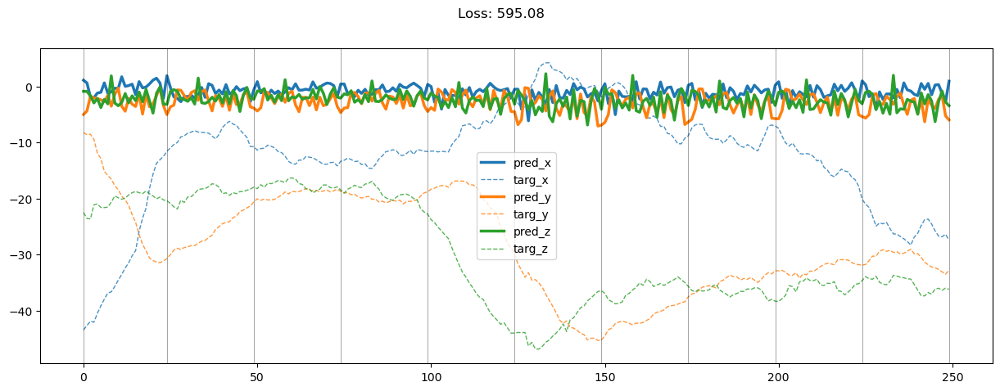

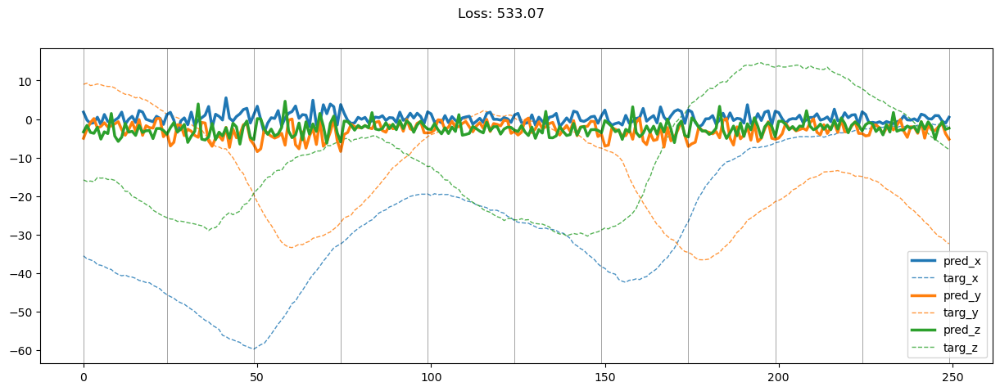

00000: train pred loss:  623.118, g loss:  2818.350, diff loss:  918.540, d loss:  1.316
       valid pred loss:  600.661, g loss:  2557.313, diff loss:  732.963, d loss:  1.354


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.66it/s]


00001: train pred loss:  549.465, g loss:  2499.213, diff loss:  838.747, d loss:  1.914
       valid pred loss:  541.243, g loss:  2343.620, diff loss:  717.522, d loss:  3.223


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.72it/s]


00002: train pred loss:  461.931, g loss:  2177.024, diff loss:  790.364, d loss:  4.624
       valid pred loss:  483.291, g loss:  2146.123, diff loss:  696.099, d loss:  6.132


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.72it/s]


00003: train pred loss:  385.078, g loss:  1844.893, diff loss:  689.582, d loss:  6.869
       valid pred loss:  453.129, g loss:  2041.167, diff loss:  681.740, d loss:  7.421


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00004: train pred loss:  322.445, g loss:  1597.407, diff loss:  630.038, d loss:  7.503
       valid pred loss:  409.911, g loss:  1889.581, diff loss:  659.813, d loss:  7.461


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.60it/s]


00005: train pred loss:  269.378, g loss:  1324.830, diff loss:  516.652, d loss:  7.229
       valid pred loss:  399.487, g loss:  1828.176, diff loss:  629.659, d loss:  6.893


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00006: train pred loss:  227.850, g loss:  1129.988, diff loss:  446.353, d loss:  6.514
       valid pred loss:  398.066, g loss:  1801.867, diff loss:  607.543, d loss:  6.054


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00007: train pred loss:  200.114, g loss:  997.387, diff loss:  396.848, d loss:  5.623
       valid pred loss:  348.551, g loss:  1616.534, diff loss:  570.574, d loss:  5.143


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.82it/s]


00008: train pred loss:  172.040, g loss:  859.724, diff loss:  343.134, d loss:  4.743
       valid pred loss:  372.828, g loss:  1680.691, diff loss:  561.524, d loss:  4.340


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.84it/s]


00009: train pred loss:  153.137, g loss:  765.059, diff loss:  304.714, d loss:  4.047
       valid pred loss:  399.718, g loss:  1880.528, diff loss:  680.121, d loss:  3.742


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.77it/s]


00010: train pred loss:  138.415, g loss:  691.199, diff loss:  274.373, d loss:  3.525
       valid pred loss:  330.509, g loss:  1540.507, diff loss:  547.034, d loss:  3.318


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.81it/s]


00011: train pred loss:  127.896, g loss:  634.012, diff loss:  248.125, d loss:  3.205
       valid pred loss:  323.711, g loss:  1487.394, diff loss:  513.862, d loss:  3.121


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.75it/s]


00012: train pred loss:  114.555, g loss:  586.454, diff loss:  223.851, d loss:  3.121
       valid pred loss:  286.755, g loss:  1359.747, diff loss:  497.171, d loss:  3.158


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.74it/s]


00013: train pred loss:  103.746, g loss:  552.932, diff loss:  203.511, d loss:  3.242
       valid pred loss:  301.640, g loss:  1459.743, diff loss:  552.960, d loss:  3.361


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.75it/s]


00014: train pred loss:  97.270, g loss:  544.286, diff loss:  192.095, d loss:  3.497
       valid pred loss:  291.622, g loss:  1414.793, diff loss:  538.564, d loss:  3.661


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.71it/s]


00015: train pred loss:  94.856, g loss:  525.540, diff loss:  181.966, d loss:  3.817
       valid pred loss:  298.636, g loss:  1452.745, diff loss:  555.870, d loss:  3.997


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.73it/s]


00016: train pred loss:  87.842, g loss:  508.155, diff loss:  168.331, d loss:  4.154
       valid pred loss:  258.145, g loss:  1223.927, diff loss:  448.799, d loss:  4.326


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.71it/s]


00017: train pred loss:  83.842, g loss:  490.753, diff loss:  161.233, d loss:  4.467
       valid pred loss:  302.682, g loss:  1444.874, diff loss:  536.312, d loss:  4.617


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00018: train pred loss:  80.145, g loss:  473.573, diff loss:  160.744, d loss:  4.732
       valid pred loss:  352.304, g loss:  1708.917, diff loss:  651.597, d loss:  4.851


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00019: train pred loss:  73.566, g loss:  435.295, diff loss:  143.894, d loss:  4.935
       valid pred loss:  290.138, g loss:  1420.662, diff loss:  549.901, d loss:  5.016


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.31it/s]


00020: train pred loss:  70.606, g loss:  416.433, diff loss:  137.446, d loss:  5.065
       valid pred loss:  322.996, g loss:  1595.783, diff loss:  626.478, d loss:  5.104


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.92it/s]


00021: train pred loss:  69.898, g loss:  406.030, diff loss:  132.960, d loss:  5.114
       valid pred loss:  290.978, g loss:  1432.136, diff loss:  558.887, d loss:  5.112


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.02it/s]


00022: train pred loss:  62.293, g loss:  371.583, diff loss:  123.337, d loss:  5.083
       valid pred loss:  290.828, g loss:  1436.548, diff loss:  542.015, d loss:  5.037


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.89it/s]


00023: train pred loss:  62.107, g loss:  366.257, diff loss:  120.840, d loss:  4.972
       valid pred loss:  374.859, g loss:  1780.097, diff loss:  655.125, d loss:  4.887


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.68it/s]


00024: train pred loss:  62.216, g loss:  366.620, diff loss:  120.876, d loss:  4.790
       valid pred loss:  281.075, g loss:  1376.894, diff loss:  533.181, d loss:  4.672


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.72it/s]


00025: train pred loss:  57.890, g loss:  342.568, diff loss:  113.118, d loss:  4.551
       valid pred loss:  369.240, g loss:  1682.940, diff loss:  574.583, d loss:  4.407


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.08it/s]


00026: train pred loss:  55.342, g loss:  327.840, diff loss:  108.212, d loss:  4.271
       valid pred loss:  248.585, g loss:  1177.145, diff loss:  430.533, d loss:  4.113


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00027: train pred loss:  53.439, g loss:  317.957, diff loss:  105.042, d loss:  3.971
       valid pred loss:  268.503, g loss:  1269.203, diff loss:  444.732, d loss:  3.812


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.62it/s]


00028: train pred loss:  51.574, g loss:  304.635, diff loss:  100.071, d loss:  3.677
       valid pred loss:  290.903, g loss:  1380.030, diff loss:  486.725, d loss:  3.531


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.57it/s]


00029: train pred loss:  49.635, g loss:  293.073, diff loss:  96.024, d loss:  3.419
       valid pred loss:  278.630, g loss:  1334.864, diff loss:  497.004, d loss:  3.306


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.58it/s]


00030: train pred loss:  50.341, g loss:  299.202, diff loss:  98.194, d loss:  3.231
       valid pred loss:  264.615, g loss:  1283.737, diff loss:  487.602, d loss:  3.163


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.61it/s]


00031: train pred loss:  53.526, g loss:  315.102, diff loss:  102.844, d loss:  3.135
       valid pred loss:  261.261, g loss:  1242.248, diff loss:  456.074, d loss:  3.124


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.58it/s]


00032: train pred loss:  48.096, g loss:  288.178, diff loss:  94.833, d loss:  3.152
       valid pred loss:  276.129, g loss:  1300.581, diff loss:  470.003, d loss:  3.205


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.61it/s]


00033: train pred loss:  45.193, g loss:  269.729, diff loss:  88.666, d loss:  3.288
       valid pred loss:  257.568, g loss:  1258.691, diff loss:  464.185, d loss:  3.400


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.62it/s]


00034: train pred loss:  42.618, g loss:  251.552, diff loss:  82.373, d loss:  3.527
       valid pred loss:  264.452, g loss:  1254.217, diff loss:  459.528, d loss:  3.680


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.54it/s]


00035: train pred loss:  41.577, g loss:  247.532, diff loss:  81.613, d loss:  3.828
       valid pred loss:  244.188, g loss:  1183.168, diff loss:  433.426, d loss:  3.999


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.53it/s]


00036: train pred loss:  41.159, g loss:  248.789, diff loss:  82.822, d loss:  4.152
       valid pred loss:  275.903, g loss:  1310.418, diff loss:  462.758, d loss:  4.323


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


00037: train pred loss:  40.763, g loss:  240.028, diff loss:  78.951, d loss:  4.468
       valid pred loss:  262.029, g loss:  1253.237, diff loss:  466.640, d loss:  4.627


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00038: train pred loss:  39.290, g loss:  233.471, diff loss:  77.221, d loss:  4.756
       valid pred loss:  283.417, g loss:  1341.805, diff loss:  470.299, d loss:  4.893


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.53it/s]


00039: train pred loss:  38.184, g loss:  226.872, diff loss:  75.076, d loss:  5.000
       valid pred loss:  242.191, g loss:  1168.909, diff loss:  424.643, d loss:  5.111


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00040: train pred loss:  36.853, g loss:  220.916, diff loss:  73.460, d loss:  5.193
       valid pred loss:  255.382, g loss:  1211.785, diff loss:  424.622, d loss:  5.275


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


00041: train pred loss:  36.319, g loss:  215.654, diff loss:  71.381, d loss:  5.329
       valid pred loss:  235.835, g loss:  1132.667, diff loss:  406.408, d loss:  5.377


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00042: train pred loss:  35.337, g loss:  209.550, diff loss:  69.320, d loss:  5.402
       valid pred loss:  245.598, g loss:  1196.408, diff loss:  442.014, d loss:  5.419


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00043: train pred loss:  34.610, g loss:  205.811, diff loss:  68.179, d loss:  5.413
       valid pred loss:  231.478, g loss:  1127.984, diff loss:  417.386, d loss:  5.395


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00044: train pred loss:  33.306, g loss:  199.768, diff loss:  66.456, d loss:  5.361
       valid pred loss:  230.909, g loss:  1122.173, diff loss:  412.897, d loss:  5.311


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00045: train pred loss:  32.889, g loss:  197.957, diff loss:  65.952, d loss:  5.248
       valid pred loss:  259.393, g loss:  1234.699, diff loss:  439.705, d loss:  5.167


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00046: train pred loss:  33.005, g loss:  197.389, diff loss:  65.526, d loss:  5.077
       valid pred loss:  247.437, g loss:  1180.112, diff loss:  422.851, d loss:  4.968


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00047: train pred loss:  33.339, g loss:  198.664, diff loss:  65.790, d loss:  4.857
       valid pred loss:  268.242, g loss:  1276.409, diff loss:  453.820, d loss:  4.725


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00048: train pred loss:  32.047, g loss:  192.195, diff loss:  63.786, d loss:  4.597
       valid pred loss:  275.683, g loss:  1294.808, diff loss:  452.801, d loss:  4.448


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


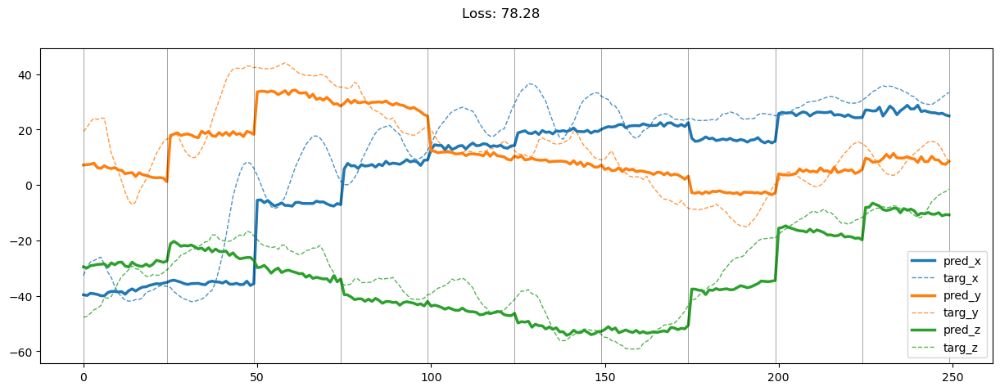

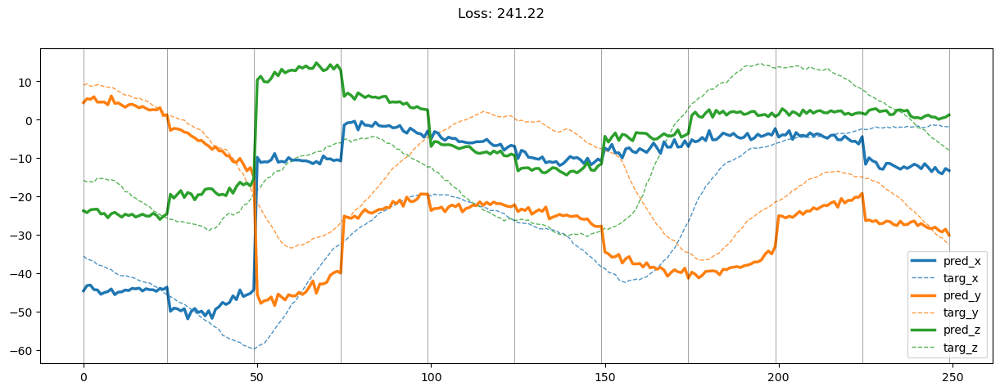

00049: train pred loss:  33.115, g loss:  198.445, diff loss:  65.755, d loss:  4.311
       valid pred loss:  267.549, g loss:  1247.750, diff loss:  429.552, d loss:  4.152


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


00050: train pred loss:  32.439, g loss:  194.334, diff loss:  64.251, d loss:  4.012
       valid pred loss:  255.626, g loss:  1193.688, diff loss:  409.845, d loss:  3.855


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.32it/s]


00051: train pred loss:  30.914, g loss:  184.801, diff loss:  60.844, d loss:  3.719
       valid pred loss:  261.096, g loss:  1235.072, diff loss:  433.774, d loss:  3.570


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.30it/s]


00052: train pred loss:  31.090, g loss:  185.746, diff loss:  60.932, d loss:  3.449
       valid pred loss:  248.007, g loss:  1164.034, diff loss:  400.394, d loss:  3.320


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.16it/s]


00053: train pred loss:  31.055, g loss:  187.258, diff loss:  61.497, d loss:  3.222
       valid pred loss:  254.938, g loss:  1185.150, diff loss:  401.774, d loss:  3.124


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.09it/s]


00054: train pred loss:  30.291, g loss:  182.488, diff loss:  59.673, d loss:  3.061
       valid pred loss:  245.722, g loss:  1159.192, diff loss:  402.982, d loss:  3.004


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.15it/s]


00055: train pred loss:  29.606, g loss:  177.791, diff loss:  57.899, d loss:  2.982
       valid pred loss:  267.816, g loss:  1241.370, diff loss:  418.320, d loss:  2.975


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.20it/s]


00056: train pred loss:  29.455, g loss:  178.017, diff loss:  58.190, d loss:  3.001
       valid pred loss:  254.963, g loss:  1210.438, diff loss:  426.029, d loss:  3.048


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.01it/s]


00057: train pred loss:  28.399, g loss:  172.305, diff loss:  56.555, d loss:  3.121
       valid pred loss:  250.107, g loss:  1186.161, diff loss:  418.005, d loss:  3.220


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.04it/s]


00058: train pred loss:  28.428, g loss:  170.267, diff loss:  55.745, d loss:  3.332
       valid pred loss:  255.895, g loss:  1232.389, diff loss:  446.507, d loss:  3.469


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.89it/s]


00059: train pred loss:  28.845, g loss:  173.496, diff loss:  57.181, d loss:  3.606
       valid pred loss:  253.638, g loss:  1193.977, diff loss:  415.219, d loss:  3.766


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.03it/s]


00060: train pred loss:  28.160, g loss:  167.797, diff loss:  55.211, d loss:  3.913
       valid pred loss:  242.604, g loss:  1161.775, diff loss:  416.997, d loss:  4.081


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.95it/s]


00061: train pred loss:  27.436, g loss:  164.418, diff loss:  54.390, d loss:  4.228
       valid pred loss:  258.014, g loss:  1217.784, diff loss:  427.978, d loss:  4.393


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.95it/s]


00062: train pred loss:  27.204, g loss:  160.621, diff loss:  52.825, d loss:  4.532
       valid pred loss:  254.982, g loss:  1210.928, diff loss:  429.705, d loss:  4.685


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.88it/s]


00063: train pred loss:  27.180, g loss:  161.184, diff loss:  53.200, d loss:  4.812
       valid pred loss:  246.375, g loss:  1175.900, diff loss:  419.505, d loss:  4.950


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.90it/s]


00064: train pred loss:  26.781, g loss:  159.913, diff loss:  53.010, d loss:  5.061
       valid pred loss:  228.162, g loss:  1102.317, diff loss:  401.775, d loss:  5.180


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.49it/s]


00065: train pred loss:  27.808, g loss:  165.190, diff loss:  54.653, d loss:  5.274
       valid pred loss:  241.731, g loss:  1150.012, diff loss:  410.540, d loss:  5.372


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.58it/s]


00066: train pred loss:  27.053, g loss:  160.832, diff loss:  53.251, d loss:  5.447
       valid pred loss:  248.075, g loss:  1171.482, diff loss:  411.274, d loss:  5.525


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.01it/s]


00067: train pred loss:  26.480, g loss:  156.530, diff loss:  51.687, d loss:  5.579
       valid pred loss:  242.076, g loss:  1164.883, diff loss:  423.469, d loss:  5.635


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.97it/s]


00068: train pred loss:  25.917, g loss:  154.158, diff loss:  51.072, d loss:  5.669
       valid pred loss:  242.821, g loss:  1163.325, diff loss:  420.066, d loss:  5.701


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.58it/s]


00069: train pred loss:  25.604, g loss:  152.721, diff loss:  50.671, d loss:  5.714
       valid pred loss:  271.348, g loss:  1274.056, diff loss:  444.964, d loss:  5.722


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.19it/s]


00070: train pred loss:  25.263, g loss:  150.148, diff loss:  49.724, d loss:  5.715
       valid pred loss:  233.179, g loss:  1139.821, diff loss:  424.680, d loss:  5.699


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.90it/s]


00071: train pred loss:  24.826, g loss:  147.840, diff loss:  49.003, d loss:  5.672
       valid pred loss:  243.329, g loss:  1183.190, diff loss:  438.482, d loss:  5.635


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.89it/s]


00072: train pred loss:  24.193, g loss:  145.603, diff loss:  48.510, d loss:  5.587
       valid pred loss:  248.283, g loss:  1184.542, diff loss:  423.423, d loss:  5.527


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.02it/s]


00073: train pred loss:  23.941, g loss:  143.988, diff loss:  47.941, d loss:  5.461
       valid pred loss:  235.127, g loss:  1148.467, diff loss:  429.182, d loss:  5.380


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.13it/s]


00074: train pred loss:  24.809, g loss:  147.236, diff loss:  48.679, d loss:  5.297
       valid pred loss:  247.029, g loss:  1173.893, diff loss:  417.459, d loss:  5.198


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.17it/s]


00075: train pred loss:  24.168, g loss:  142.715, diff loss:  47.030, d loss:  5.099
       valid pred loss:  256.455, g loss:  1230.587, diff loss:  445.990, d loss:  4.984


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.81it/s]


00076: train pred loss:  23.350, g loss:  139.568, diff loss:  46.234, d loss:  4.873
       valid pred loss:  237.354, g loss:  1119.238, diff loss:  392.532, d loss:  4.745


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.21it/s]


00077: train pred loss:  23.372, g loss:  139.194, diff loss:  45.969, d loss:  4.624
       valid pred loss:  255.109, g loss:  1206.085, diff loss:  425.262, d loss:  4.487


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00078: train pred loss:  22.621, g loss:  134.407, diff loss:  44.248, d loss:  4.361
       valid pred loss:  236.723, g loss:  1146.314, diff loss:  421.634, d loss:  4.219


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00079: train pred loss:  22.699, g loss:  133.672, diff loss:  43.698, d loss:  4.091
       valid pred loss:  247.663, g loss:  1172.163, diff loss:  412.892, d loss:  3.948


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00080: train pred loss:  22.563, g loss:  135.455, diff loss:  44.588, d loss:  3.824
       valid pred loss:  251.088, g loss:  1204.336, diff loss:  435.668, d loss:  3.687


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.06it/s]


00081: train pred loss:  21.897, g loss:  132.672, diff loss:  43.690, d loss:  3.570
       valid pred loss:  241.271, g loss:  1163.720, diff loss:  423.368, d loss:  3.444


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


00082: train pred loss:  22.323, g loss:  134.116, diff loss:  43.784, d loss:  3.341
       valid pred loss:  246.664, g loss:  1174.117, diff loss:  417.445, d loss:  3.230


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.31it/s]


00083: train pred loss:  22.212, g loss:  134.159, diff loss:  43.700, d loss:  3.146
       valid pred loss:  251.231, g loss:  1197.342, diff loss:  427.190, d loss:  3.059


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00084: train pred loss:  22.503, g loss:  137.768, diff loss:  45.015, d loss:  2.999
       valid pred loss:  262.715, g loss:  1237.555, diff loss:  432.752, d loss:  2.941


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00085: train pred loss:  22.532, g loss:  137.612, diff loss:  44.769, d loss:  2.909
       valid pred loss:  253.829, g loss:  1200.107, diff loss:  420.238, d loss:  2.885


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.82it/s]


00086: train pred loss:  23.703, g loss:  142.511, diff loss:  46.010, d loss:  2.886
       valid pred loss:  268.678, g loss:  1292.881, diff loss:  465.741, d loss:  2.900


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00087: train pred loss:  22.758, g loss:  137.780, diff loss:  44.668, d loss:  2.934
       valid pred loss:  245.205, g loss:  1173.236, diff loss:  420.296, d loss:  2.986


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00088: train pred loss:  21.859, g loss:  131.954, diff loss:  42.828, d loss:  3.052
       valid pred loss:  250.026, g loss:  1194.294, diff loss:  427.349, d loss:  3.138


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00089: train pred loss:  22.224, g loss:  132.918, diff loss:  43.168, d loss:  3.231
       valid pred loss:  238.872, g loss:  1140.800, diff loss:  408.824, d loss:  3.345


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00090: train pred loss:  22.007, g loss:  131.494, diff loss:  42.897, d loss:  3.457
       valid pred loss:  260.067, g loss:  1242.883, diff loss:  445.627, d loss:  3.588


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00091: train pred loss:  21.230, g loss:  126.210, diff loss:  41.227, d loss:  3.710
       valid pred loss:  244.733, g loss:  1194.116, diff loss:  443.741, d loss:  3.848


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00092: train pred loss:  20.746, g loss:  123.882, diff loss:  40.700, d loss:  3.972
       valid pred loss:  247.219, g loss:  1184.123, diff loss:  427.352, d loss:  4.112


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00093: train pred loss:  20.653, g loss:  123.269, diff loss:  40.602, d loss:  4.234
       valid pred loss:  259.477, g loss:  1243.243, diff loss:  449.979, d loss:  4.370


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00094: train pred loss:  20.360, g loss:  122.534, diff loss:  40.613, d loss:  4.487
       valid pred loss:  268.048, g loss:  1278.494, diff loss:  460.659, d loss:  4.617


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00095: train pred loss:  20.406, g loss:  120.117, diff loss:  39.421, d loss:  4.725
       valid pred loss:  282.463, g loss:  1312.358, diff loss:  450.010, d loss:  4.844


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.21it/s]


00096: train pred loss:  19.712, g loss:  117.538, diff loss:  38.871, d loss:  4.943
       valid pred loss:  247.490, g loss:  1204.601, diff loss:  449.350, d loss:  5.052


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.15it/s]


00097: train pred loss:  19.511, g loss:  116.104, diff loss:  38.388, d loss:  5.140
       valid pred loss:  235.169, g loss:  1121.604, diff loss:  403.033, d loss:  5.235


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.67it/s]


00098: train pred loss:  18.780, g loss:  112.543, diff loss:  37.363, d loss:  5.313
       valid pred loss:  261.274, g loss:  1253.681, diff loss:  456.849, d loss:  5.396


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


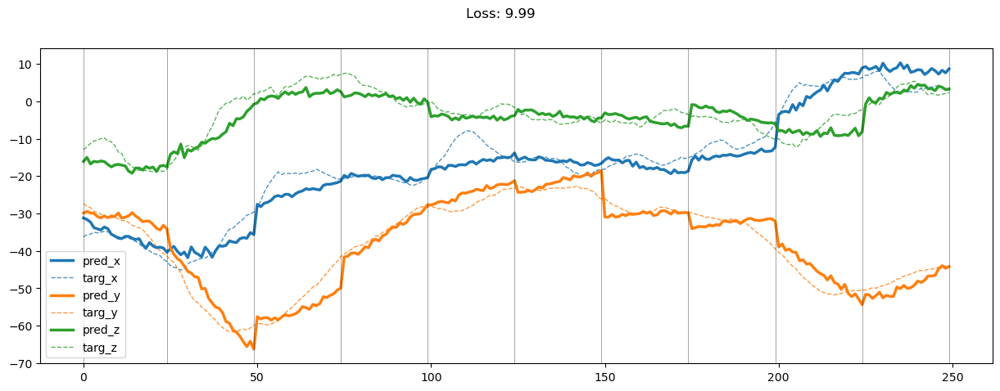

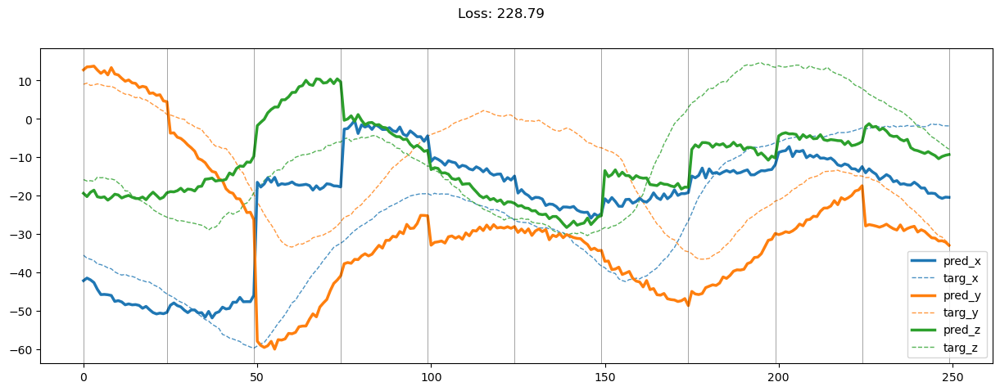

00099: train pred loss:  18.308, g loss:  109.113, diff loss:  36.138, d loss:  5.462
       valid pred loss:  234.010, g loss:  1139.604, diff loss:  423.891, d loss:  5.532


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.85it/s]


00100: train pred loss:  17.780, g loss:  105.331, diff loss:  34.788, d loss:  5.585
       valid pred loss:  249.429, g loss:  1216.616, diff loss:  454.282, d loss:  5.640


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00101: train pred loss:  17.507, g loss:  102.897, diff loss:  33.853, d loss:  5.683
       valid pred loss:  234.976, g loss:  1127.842, diff loss:  409.302, d loss:  5.725


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00102: train pred loss:  17.307, g loss:  102.817, diff loss:  34.018, d loss:  5.754
       valid pred loss:  239.712, g loss:  1157.851, diff loss:  425.233, d loss:  5.782


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00103: train pred loss:  17.066, g loss:  101.946, diff loss:  33.827, d loss:  5.798
       valid pred loss:  244.125, g loss:  1171.814, diff loss:  427.169, d loss:  5.811


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00104: train pred loss:  16.927, g loss:  101.802, diff loss:  33.896, d loss:  5.816
       valid pred loss:  236.354, g loss:  1135.656, diff loss:  413.127, d loss:  5.816


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.13it/s]


00105: train pred loss:  16.469, g loss:  98.094, diff loss:  32.499, d loss:  5.808
       valid pred loss:  219.564, g loss:  1059.734, diff loss:  387.490, d loss:  5.793


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00106: train pred loss:  16.666, g loss:  99.070, diff loss:  32.788, d loss:  5.774
       valid pred loss:  226.859, g loss:  1101.509, diff loss:  408.169, d loss:  5.746


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.32it/s]


00107: train pred loss:  16.908, g loss:  99.925, diff loss:  32.968, d loss:  5.714
       valid pred loss:  236.484, g loss:  1153.318, diff loss:  429.571, d loss:  5.676


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00108: train pred loss:  17.441, g loss:  103.499, diff loss:  34.215, d loss:  5.631
       valid pred loss:  258.512, g loss:  1227.067, diff loss:  437.895, d loss:  5.577


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.98it/s]


00109: train pred loss:  17.652, g loss:  104.129, diff loss:  34.308, d loss:  5.524
       valid pred loss:  244.979, g loss:  1191.681, diff loss:  443.203, d loss:  5.459


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.35it/s]


00110: train pred loss:  16.587, g loss:  99.116, diff loss:  32.852, d loss:  5.396
       valid pred loss:  256.612, g loss:  1232.518, diff loss:  449.446, d loss:  5.322


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.36it/s]


00111: train pred loss:  16.193, g loss:  96.342, diff loss:  31.841, d loss:  5.248
       valid pred loss:  234.787, g loss:  1130.683, diff loss:  412.987, d loss:  5.163


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00112: train pred loss:  16.067, g loss:  95.057, diff loss:  31.299, d loss:  5.082
       valid pred loss:  241.855, g loss:  1172.475, diff loss:  432.642, d loss:  4.987


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00113: train pred loss:  15.525, g loss:  92.223, diff loss:  30.392, d loss:  4.901
       valid pred loss:  224.632, g loss:  1097.674, diff loss:  408.953, d loss:  4.801


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00114: train pred loss:  15.817, g loss:  94.384, diff loss:  31.140, d loss:  4.708
       valid pred loss:  230.953, g loss:  1105.314, diff loss:  398.522, d loss:  4.602


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00115: train pred loss:  15.606, g loss:  92.989, diff loss:  30.600, d loss:  4.506
       valid pred loss:  229.388, g loss:  1098.819, diff loss:  395.004, d loss:  4.398


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


00116: train pred loss:  15.157, g loss:  90.103, diff loss:  29.540, d loss:  4.299
       valid pred loss:  227.165, g loss:  1093.124, diff loss:  396.966, d loss:  4.188


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.39it/s]


00117: train pred loss:  14.654, g loss:  87.644, diff loss:  28.730, d loss:  4.090
       valid pred loss:  224.342, g loss:  1085.541, diff loss:  398.918, d loss:  3.981


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.59it/s]


00118: train pred loss:  14.581, g loss:  88.202, diff loss:  28.980, d loss:  3.885
       valid pred loss:  214.506, g loss:  1052.122, diff loss:  393.702, d loss:  3.778


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.17it/s]


00119: train pred loss:  14.094, g loss:  84.211, diff loss:  27.349, d loss:  3.687
       valid pred loss:  223.432, g loss:  1075.150, diff loss:  390.978, d loss:  3.585


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00120: train pred loss:  14.381, g loss:  86.929, diff loss:  28.280, d loss:  3.501
       valid pred loss:  213.258, g loss:  1044.336, diff loss:  390.493, d loss:  3.408


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00121: train pred loss:  14.344, g loss:  87.213, diff loss:  28.303, d loss:  3.331
       valid pred loss:  214.782, g loss:  1032.260, diff loss:  372.805, d loss:  3.248


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.53it/s]


00122: train pred loss:  13.788, g loss:  84.468, diff loss:  27.095, d loss:  3.183
       valid pred loss:  222.112, g loss:  1057.261, diff loss:  375.870, d loss:  3.113


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00123: train pred loss:  13.704, g loss:  83.730, diff loss:  26.883, d loss:  3.060
       valid pred loss:  205.428, g loss:  988.784, diff loss:  357.098, d loss:  3.006


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00124: train pred loss:  13.721, g loss:  84.584, diff loss:  27.160, d loss:  2.969
       valid pred loss:  216.862, g loss:  1046.938, diff loss:  381.500, d loss:  2.932


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00125: train pred loss:  13.949, g loss:  85.904, diff loss:  27.502, d loss:  2.911
       valid pred loss:  222.052, g loss:  1061.934, diff loss:  379.461, d loss:  2.893


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.82it/s]


00126: train pred loss:  13.519, g loss:  82.599, diff loss:  26.245, d loss:  2.890
       valid pred loss:  226.415, g loss:  1085.423, diff loss:  391.154, d loss:  2.893


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.34it/s]


00127: train pred loss:  13.392, g loss:  83.045, diff loss:  26.625, d loss:  2.908
       valid pred loss:  234.726, g loss:  1121.359, diff loss:  400.786, d loss:  2.931


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.06it/s]


00128: train pred loss:  13.661, g loss:  83.404, diff loss:  26.625, d loss:  2.964
       valid pred loss:  217.069, g loss:  1050.427, diff loss:  383.121, d loss:  3.008


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


00129: train pred loss:  13.342, g loss:  81.453, diff loss:  26.102, d loss:  3.057
       valid pred loss:  217.692, g loss:  1043.696, diff loss:  375.763, d loss:  3.119


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


00130: train pred loss:  13.639, g loss:  82.901, diff loss:  26.690, d loss:  3.182
       valid pred loss:  235.514, g loss:  1113.612, diff loss:  392.184, d loss:  3.258


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


00131: train pred loss:  13.525, g loss:  82.847, diff loss:  26.942, d loss:  3.333
       valid pred loss:  226.564, g loss:  1094.882, diff loss:  400.449, d loss:  3.420


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.70it/s]


00132: train pred loss:  13.969, g loss:  84.290, diff loss:  27.375, d loss:  3.503
       valid pred loss:  217.981, g loss:  1053.671, diff loss:  386.088, d loss:  3.598


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.31it/s]


00133: train pred loss:  13.635, g loss:  82.020, diff loss:  26.712, d loss:  3.686
       valid pred loss:  219.765, g loss:  1052.512, diff loss:  378.921, d loss:  3.785


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.29it/s]


00134: train pred loss:  13.351, g loss:  79.484, diff loss:  25.845, d loss:  3.874
       valid pred loss:  231.546, g loss:  1101.455, diff loss:  393.985, d loss:  3.975


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.30it/s]


00135: train pred loss:  12.782, g loss:  76.554, diff loss:  25.046, d loss:  4.064
       valid pred loss:  209.053, g loss:  1015.094, diff loss:  374.356, d loss:  4.163


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.15it/s]


00136: train pred loss:  12.371, g loss:  73.653, diff loss:  24.083, d loss:  4.250
       valid pred loss:  219.050, g loss:  1051.909, diff loss:  380.900, d loss:  4.347


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.55it/s]


00137: train pred loss:  12.250, g loss:  73.452, diff loss:  24.166, d loss:  4.431
       valid pred loss:  209.205, g loss:  1000.722, diff loss:  359.842, d loss:  4.523


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.87it/s]


00138: train pred loss:  12.462, g loss:  74.390, diff loss:  24.472, d loss:  4.602
       valid pred loss:  230.868, g loss:  1102.140, diff loss:  395.576, d loss:  4.689


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00139: train pred loss:  12.061, g loss:  72.460, diff loss:  23.664, d loss:  4.764
       valid pred loss:  217.317, g loss:  1050.753, diff loss:  385.507, d loss:  4.845


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.28it/s]


00140: train pred loss:  11.742, g loss:  69.322, diff loss:  22.727, d loss:  4.913
       valid pred loss:  225.347, g loss:  1092.815, diff loss:  402.461, d loss:  4.987


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.23it/s]


00141: train pred loss:  12.100, g loss:  72.497, diff loss:  23.982, d loss:  5.050
       valid pred loss:  217.559, g loss:  1055.842, diff loss:  389.336, d loss:  5.117


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.24it/s]


00142: train pred loss:  11.785, g loss:  71.908, diff loss:  23.402, d loss:  5.174
       valid pred loss:  210.638, g loss:  1013.510, diff loss:  367.984, d loss:  5.235


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.67it/s]


00143: train pred loss:  11.720, g loss:  70.256, diff loss:  23.276, d loss:  5.286
       valid pred loss:  222.293, g loss:  1067.568, diff loss:  387.233, d loss:  5.340


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.32it/s]


00144: train pred loss:  11.625, g loss:  69.658, diff loss:  22.808, d loss:  5.382
       valid pred loss:  226.015, g loss:  1078.319, diff loss:  387.778, d loss:  5.429


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.30it/s]


00145: train pred loss:  11.517, g loss:  68.981, diff loss:  22.327, d loss:  5.465
       valid pred loss:  228.044, g loss:  1093.468, diff loss:  396.820, d loss:  5.503


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.27it/s]


00146: train pred loss:  11.366, g loss:  69.353, diff loss:  22.428, d loss:  5.533
       valid pred loss:  231.342, g loss:  1113.579, diff loss:  407.147, d loss:  5.564


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.21it/s]


00147: train pred loss:  11.294, g loss:  67.774, diff loss:  22.227, d loss:  5.588
       valid pred loss:  220.082, g loss:  1051.282, diff loss:  378.751, d loss:  5.611


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.09it/s]


00148: train pred loss:  11.146, g loss:  68.551, diff loss:  22.220, d loss:  5.628
       valid pred loss:  227.421, g loss:  1088.092, diff loss:  391.934, d loss:  5.643


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.27it/s]


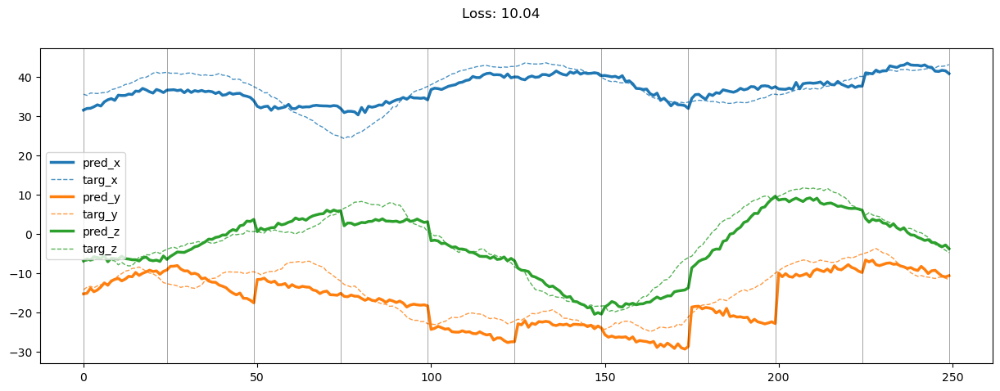

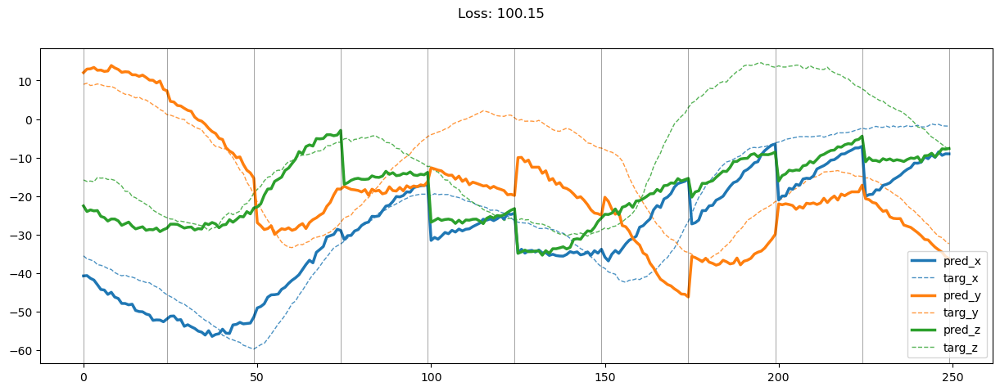

00149: train pred loss:  11.111, g loss:  68.377, diff loss:  21.893, d loss:  5.653
       valid pred loss:  219.362, g loss:  1056.523, diff loss:  384.982, d loss:  5.663


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.36it/s]


00150: train pred loss:  10.827, g loss:  66.281, diff loss:  21.412, d loss:  5.665
       valid pred loss:  227.466, g loss:  1108.401, diff loss:  411.594, d loss:  5.666


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00151: train pred loss:  10.570, g loss:  65.571, diff loss:  20.852, d loss:  5.663
       valid pred loss:  223.774, g loss:  1068.178, diff loss:  383.398, d loss:  5.657


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.29it/s]


00152: train pred loss:  11.396, g loss:  68.394, diff loss:  22.134, d loss:  5.647
       valid pred loss:  216.066, g loss:  1050.153, diff loss:  389.392, d loss:  5.634


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.18it/s]


00153: train pred loss:  11.215, g loss:  67.081, diff loss:  21.969, d loss:  5.618
       valid pred loss:  221.080, g loss:  1055.548, diff loss:  379.555, d loss:  5.597


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.35it/s]


00154: train pred loss:  11.531, g loss:  69.546, diff loss:  22.598, d loss:  5.575
       valid pred loss:  213.435, g loss:  1023.133, diff loss:  369.154, d loss:  5.549


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.28it/s]


00155: train pred loss:  11.200, g loss:  67.381, diff loss:  21.878, d loss:  5.520
       valid pred loss:  217.367, g loss:  1046.807, diff loss:  381.258, d loss:  5.487


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.35it/s]


00156: train pred loss:  11.151, g loss:  67.485, diff loss:  22.200, d loss:  5.454
       valid pred loss:  220.033, g loss:  1050.891, diff loss:  376.764, d loss:  5.413


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.26it/s]


00157: train pred loss:  10.766, g loss:  65.605, diff loss:  21.133, d loss:  5.375
       valid pred loss:  214.694, g loss:  1031.006, diff loss:  373.678, d loss:  5.330


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.17it/s]


00158: train pred loss:  10.942, g loss:  67.585, diff loss:  21.352, d loss:  5.286
       valid pred loss:  221.207, g loss:  1075.929, diff loss:  399.373, d loss:  5.235


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.73it/s]


00159: train pred loss:  10.552, g loss:  65.363, diff loss:  20.654, d loss:  5.187
       valid pred loss:  209.421, g loss:  1029.219, diff loss:  387.777, d loss:  5.133


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.81it/s]


00160: train pred loss:  10.587, g loss:  65.589, diff loss:  20.722, d loss:  5.079
       valid pred loss:  213.130, g loss:  1022.610, diff loss:  369.332, d loss:  5.020


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.35it/s]


00161: train pred loss:  10.201, g loss:  64.041, diff loss:  19.832, d loss:  4.963
       valid pred loss:  222.172, g loss:  1081.873, diff loss:  401.765, d loss:  4.900


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.49it/s]


00162: train pred loss:  10.189, g loss:  64.461, diff loss:  20.172, d loss:  4.839
       valid pred loss:  205.909, g loss:  1006.936, diff loss:  376.227, d loss:  4.773


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 13.99it/s]


00163: train pred loss:  9.905, g loss:  63.333, diff loss:  19.671, d loss:  4.710
       valid pred loss:  205.323, g loss:  993.615, diff loss:  363.985, d loss:  4.640


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.11it/s]


00164: train pred loss:  10.232, g loss:  64.667, diff loss:  19.839, d loss:  4.576
       valid pred loss:  213.273, g loss:  1023.118, diff loss:  370.246, d loss:  4.505


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.30it/s]


00165: train pred loss:  10.327, g loss:  64.625, diff loss:  20.122, d loss:  4.439
       valid pred loss:  208.738, g loss:  1030.145, diff loss:  390.796, d loss:  4.367


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.27it/s]


00166: train pred loss:  10.322, g loss:  66.839, diff loss:  20.468, d loss:  4.301
       valid pred loss:  217.313, g loss:  1028.509, diff loss:  363.564, d loss:  4.227


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.35it/s]


00167: train pred loss:  10.194, g loss:  64.750, diff loss:  19.895, d loss:  4.161
       valid pred loss:  233.108, g loss:  1118.972, diff loss:  405.732, d loss:  4.087


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.18it/s]


00168: train pred loss:  10.300, g loss:  64.520, diff loss:  20.161, d loss:  4.023
       valid pred loss:  213.705, g loss:  1031.953, diff loss:  376.741, d loss:  3.950


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


00169: train pred loss:  10.574, g loss:  64.561, diff loss:  20.177, d loss:  3.887
       valid pred loss:  206.815, g loss:  999.693, diff loss:  364.608, d loss:  3.816


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.20it/s]


00170: train pred loss:  10.448, g loss:  64.876, diff loss:  19.957, d loss:  3.755
       valid pred loss:  228.137, g loss:  1088.696, diff loss:  389.115, d loss:  3.688


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.20it/s]


00171: train pred loss:  10.208, g loss:  65.874, diff loss:  19.760, d loss:  3.629
       valid pred loss:  204.332, g loss:  986.145, diff loss:  358.247, d loss:  3.565


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.31it/s]


00172: train pred loss:  10.483, g loss:  67.252, diff loss:  20.504, d loss:  3.511
       valid pred loss:  233.296, g loss:  1130.540, diff loss:  414.822, d loss:  3.451


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.24it/s]


00173: train pred loss:  10.679, g loss:  66.686, diff loss:  20.544, d loss:  3.400
       valid pred loss:  210.451, g loss:  1024.977, diff loss:  377.974, d loss:  3.346


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


00174: train pred loss:  10.528, g loss:  66.225, diff loss:  20.078, d loss:  3.300
       valid pred loss:  223.287, g loss:  1076.671, diff loss:  391.494, d loss:  3.251


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.26it/s]


00175: train pred loss:  9.723, g loss:  65.357, diff loss:  19.043, d loss:  3.212
       valid pred loss:  212.472, g loss:  1031.139, diff loss:  378.738, d loss:  3.170


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.26it/s]


00176: train pred loss:  9.511, g loss:  63.877, diff loss:  18.577, d loss:  3.136
       valid pred loss:  210.422, g loss:  1018.792, diff loss:  371.478, d loss:  3.101


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


00177: train pred loss:  9.648, g loss:  63.629, diff loss:  18.688, d loss:  3.074
       valid pred loss:  199.710, g loss:  975.790, diff loss:  360.487, d loss:  3.047


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00178: train pred loss:  9.361, g loss:  64.761, diff loss:  18.204, d loss:  3.028
       valid pred loss:  200.882, g loss:  984.433, diff loss:  365.636, d loss:  3.009


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


00179: train pred loss:  9.665, g loss:  65.886, diff loss:  18.846, d loss:  2.997
       valid pred loss:  220.522, g loss:  1044.550, diff loss:  367.126, d loss:  2.987


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.27it/s]


00180: train pred loss:  9.383, g loss:  64.715, diff loss:  18.496, d loss:  2.983
       valid pred loss:  205.580, g loss:  991.768, diff loss:  359.784, d loss:  2.982


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.28it/s]


00181: train pred loss:  9.461, g loss:  65.409, diff loss:  18.499, d loss:  2.986
       valid pred loss:  206.387, g loss:  996.239, diff loss:  361.193, d loss:  2.994


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


00182: train pred loss:  9.570, g loss:  65.023, diff loss:  18.754, d loss:  3.006
       valid pred loss:  193.731, g loss:  951.123, diff loss:  353.489, d loss:  3.023


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


00183: train pred loss:  9.330, g loss:  63.959, diff loss:  18.329, d loss:  3.042
       valid pred loss:  207.592, g loss:  997.889, diff loss:  359.185, d loss:  3.068


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00184: train pred loss:  9.594, g loss:  64.481, diff loss:  18.657, d loss:  3.095
       valid pred loss:  212.720, g loss:  1030.761, diff loss:  376.627, d loss:  3.128


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


00185: train pred loss:  9.369, g loss:  65.563, diff loss:  18.607, d loss:  3.162
       valid pred loss:  214.273, g loss:  1024.043, diff loss:  365.596, d loss:  3.202


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.29it/s]


00186: train pred loss:  9.435, g loss:  63.276, diff loss:  18.656, d loss:  3.244
       valid pred loss:  207.301, g loss:  1016.788, diff loss:  379.843, d loss:  3.293


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.92it/s]


00187: train pred loss:  9.352, g loss:  64.491, diff loss:  18.579, d loss:  3.340
       valid pred loss:  194.819, g loss:  938.382, diff loss:  339.950, d loss:  3.396


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.35it/s]


00188: train pred loss:  9.136, g loss:  61.636, diff loss:  17.942, d loss:  3.450
       valid pred loss:  201.833, g loss:  963.525, diff loss:  342.821, d loss:  3.513


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.25it/s]


00189: train pred loss:  9.433, g loss:  61.904, diff loss:  17.950, d loss:  3.572
       valid pred loss:  206.704, g loss:  1001.438, diff loss:  366.233, d loss:  3.640


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.20it/s]


00190: train pred loss:  9.311, g loss:  59.468, diff loss:  17.463, d loss:  3.703
       valid pred loss:  206.079, g loss:  1002.142, diff loss:  368.935, d loss:  3.775


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00191: train pred loss:  9.119, g loss:  61.033, diff loss:  17.719, d loss:  3.840
       valid pred loss:  204.466, g loss:  991.500, diff loss:  361.680, d loss:  3.914


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


00192: train pred loss:  9.197, g loss:  62.115, diff loss:  17.943, d loss:  3.979
       valid pred loss:  211.463, g loss:  1021.150, diff loss:  372.195, d loss:  4.052


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


00193: train pred loss:  8.929, g loss:  61.712, diff loss:  17.487, d loss:  4.117
       valid pred loss:  200.867, g loss:  975.473, diff loss:  358.985, d loss:  4.188


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.96it/s]


00194: train pred loss:  8.868, g loss:  60.869, diff loss:  17.477, d loss:  4.252
       valid pred loss:  201.083, g loss:  967.722, diff loss:  351.115, d loss:  4.320


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


00195: train pred loss:  9.227, g loss:  61.780, diff loss:  17.874, d loss:  4.379
       valid pred loss:  198.589, g loss:  965.943, diff loss:  357.639, d loss:  4.444


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.35it/s]


00196: train pred loss:  9.473, g loss:  62.056, diff loss:  18.107, d loss:  4.496
       valid pred loss:  218.780, g loss:  1056.932, diff loss:  385.816, d loss:  4.555


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00197: train pred loss:  9.303, g loss:  62.249, diff loss:  18.274, d loss:  4.600
       valid pred loss:  205.491, g loss:  1001.271, diff loss:  370.307, d loss:  4.649


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.64it/s]


00198: train pred loss:  9.654, g loss:  63.306, diff loss:  18.692, d loss:  4.688
       valid pred loss:  198.200, g loss:  996.964, diff loss:  362.273, d loss:  4.727


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.25it/s]


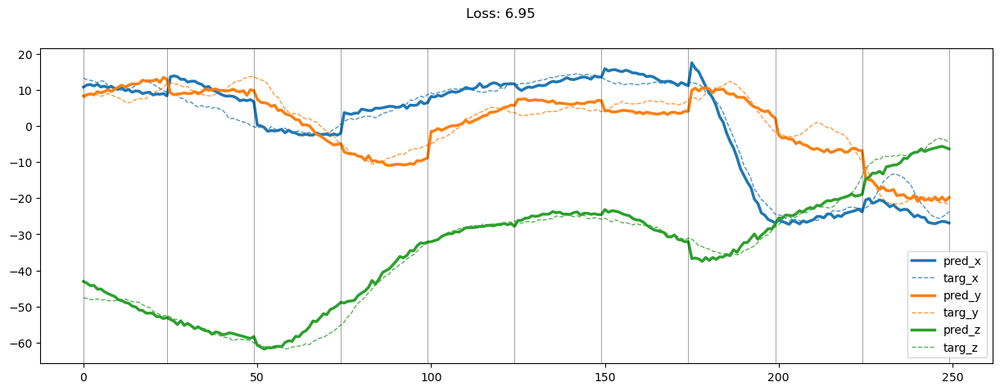

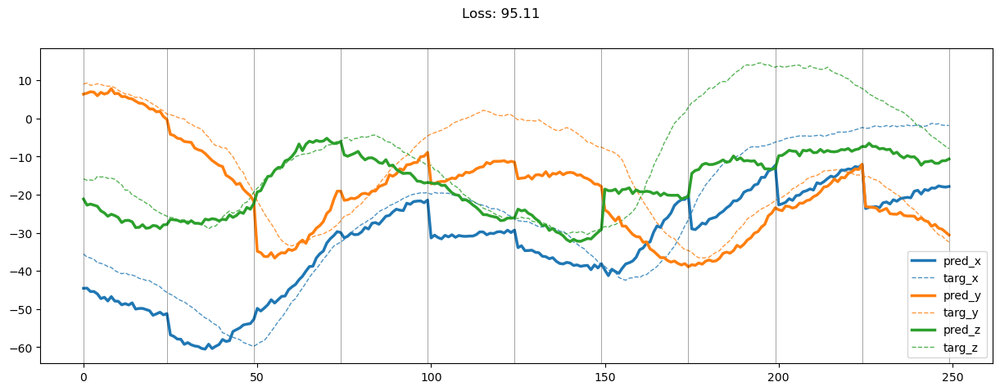

00199: train pred loss:  9.531, g loss:  62.278, diff loss:  18.717, d loss:  4.758
       valid pred loss:  207.845, g loss:  1000.677, diff loss:  363.028, d loss:  4.789


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.76it/s]


00200: train pred loss:  9.200, g loss:  60.548, diff loss:  17.988, d loss:  4.812
       valid pred loss:  208.398, g loss:  999.550, diff loss:  360.950, d loss:  4.837


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00201: train pred loss:  9.002, g loss:  59.839, diff loss:  17.404, d loss:  4.856
       valid pred loss:  207.174, g loss:  1018.320, diff loss:  383.039, d loss:  4.876


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


00202: train pred loss:  8.795, g loss:  60.588, diff loss:  17.134, d loss:  4.892
       valid pred loss:  199.906, g loss:  967.184, diff loss:  354.435, d loss:  4.911


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.32it/s]


00203: train pred loss:  9.061, g loss:  61.211, diff loss:  17.877, d loss:  4.923
       valid pred loss:  206.749, g loss:  1004.241, diff loss:  370.158, d loss:  4.937


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.35it/s]


00204: train pred loss:  8.782, g loss:  58.875, diff loss:  16.985, d loss:  4.950
       valid pred loss:  193.534, g loss:  959.244, diff loss:  364.556, d loss:  4.963


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00205: train pred loss:  8.716, g loss:  59.552, diff loss:  17.017, d loss:  4.974
       valid pred loss:  211.590, g loss:  1022.632, diff loss:  374.288, d loss:  4.986


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


00206: train pred loss:  8.522, g loss:  57.059, diff loss:  16.423, d loss:  4.995
       valid pred loss:  204.269, g loss:  980.766, diff loss:  354.784, d loss:  5.005


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00207: train pred loss:  8.256, g loss:  56.820, diff loss:  16.073, d loss:  5.012
       valid pred loss:  195.393, g loss:  949.785, diff loss:  350.054, d loss:  5.021


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


00208: train pred loss:  8.181, g loss:  57.250, diff loss:  16.242, d loss:  5.026
       valid pred loss:  205.565, g loss:  990.655, diff loss:  361.020, d loss:  5.034


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00209: train pred loss:  7.969, g loss:  55.732, diff loss:  15.808, d loss:  5.037
       valid pred loss:  194.219, g loss:  948.386, diff loss:  351.040, d loss:  5.041


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.93it/s]


00210: train pred loss:  8.445, g loss:  58.880, diff loss:  16.700, d loss:  5.044
       valid pred loss:  198.203, g loss:  993.612, diff loss:  360.875, d loss:  5.047


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.24it/s]


00211: train pred loss:  8.201, g loss:  57.069, diff loss:  16.178, d loss:  5.048
       valid pred loss:  212.738, g loss:  1010.877, diff loss:  358.874, d loss:  5.047


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


00212: train pred loss:  8.138, g loss:  56.280, diff loss:  15.936, d loss:  5.047
       valid pred loss:  203.757, g loss:  979.429, diff loss:  354.944, d loss:  5.044


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00213: train pred loss:  8.060, g loss:  56.160, diff loss:  15.921, d loss:  5.041
       valid pred loss:  211.155, g loss:  1008.590, diff loss:  362.070, d loss:  5.036


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00214: train pred loss:  7.875, g loss:  54.331, diff loss:  15.372, d loss:  5.032
       valid pred loss:  197.902, g loss:  968.072, diff loss:  359.919, d loss:  5.026


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.35it/s]


00215: train pred loss:  7.721, g loss:  53.352, diff loss:  15.095, d loss:  5.018
       valid pred loss:  207.993, g loss:  1013.418, diff loss:  376.260, d loss:  5.009


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00216: train pred loss:  7.922, g loss:  55.144, diff loss:  15.624, d loss:  4.997
       valid pred loss:  209.897, g loss:  994.510, diff loss:  352.433, d loss:  4.983


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.35it/s]


00217: train pred loss:  7.757, g loss:  54.217, diff loss:  15.366, d loss:  4.970
       valid pred loss:  208.747, g loss:  1004.127, diff loss:  364.987, d loss:  4.953


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00218: train pred loss:  7.792, g loss:  54.748, diff loss:  15.528, d loss:  4.939
       valid pred loss:  204.573, g loss:  987.518, diff loss:  360.924, d loss:  4.921


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.35it/s]


00219: train pred loss:  7.898, g loss:  55.287, diff loss:  15.668, d loss:  4.902
       valid pred loss:  197.653, g loss:  967.840, diff loss:  362.533, d loss:  4.882


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00220: train pred loss:  8.235, g loss:  56.532, diff loss:  16.185, d loss:  4.861
       valid pred loss:  188.493, g loss:  910.184, diff loss:  330.853, d loss:  4.838


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00221: train pred loss:  7.782, g loss:  54.072, diff loss:  15.289, d loss:  4.814
       valid pred loss:  194.774, g loss:  936.854, diff loss:  339.515, d loss:  4.789


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00222: train pred loss:  7.796, g loss:  54.346, diff loss:  15.369, d loss:  4.764
       valid pred loss:  215.292, g loss:  1023.841, diff loss:  365.058, d loss:  4.737


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


00223: train pred loss:  7.694, g loss:  53.923, diff loss:  15.254, d loss:  4.710
       valid pred loss:  197.332, g loss:  954.237, diff loss:  349.111, d loss:  4.681


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00224: train pred loss:  7.457, g loss:  51.633, diff loss:  14.560, d loss:  4.652
       valid pred loss:  201.971, g loss:  972.332, diff loss:  353.746, d loss:  4.620


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00225: train pred loss:  7.470, g loss:  51.798, diff loss:  14.600, d loss:  4.591
       valid pred loss:  207.510, g loss:  998.466, diff loss:  362.537, d loss:  4.557


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00226: train pred loss:  7.501, g loss:  52.672, diff loss:  14.869, d loss:  4.527
       valid pred loss:  193.563, g loss:  957.696, diff loss:  339.062, d loss:  4.492


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00227: train pred loss:  7.407, g loss:  52.222, diff loss:  14.738, d loss:  4.460
       valid pred loss:  197.792, g loss:  948.569, diff loss:  342.549, d loss:  4.425


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.22it/s]


00228: train pred loss:  7.435, g loss:  51.904, diff loss:  14.608, d loss:  4.391
       valid pred loss:  187.870, g loss:  926.574, diff loss:  327.518, d loss:  4.355


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.18it/s]


00229: train pred loss:  7.466, g loss:  52.228, diff loss:  14.690, d loss:  4.321
       valid pred loss:  189.727, g loss:  923.273, diff loss:  322.381, d loss:  4.282


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00230: train pred loss:  7.849, g loss:  54.372, diff loss:  15.259, d loss:  4.248
       valid pred loss:  198.336, g loss:  957.524, diff loss:  350.746, d loss:  4.211


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00231: train pred loss:  7.980, g loss:  54.927, diff loss:  15.382, d loss:  4.176
       valid pred loss:  195.393, g loss:  938.209, diff loss:  338.271, d loss:  4.137


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00232: train pred loss:  7.748, g loss:  54.004, diff loss:  15.130, d loss:  4.102
       valid pred loss:  207.571, g loss:  993.123, diff loss:  357.919, d loss:  4.064


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00233: train pred loss:  7.457, g loss:  51.301, diff loss:  14.304, d loss:  4.029
       valid pred loss:  190.508, g loss:  923.591, diff loss:  338.591, d loss:  3.990


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00234: train pred loss:  7.152, g loss:  50.347, diff loss:  14.064, d loss:  3.956
       valid pred loss:  194.124, g loss:  925.452, diff loss:  330.224, d loss:  3.918


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.26it/s]


00235: train pred loss:  7.218, g loss:  50.697, diff loss:  14.133, d loss:  3.884
       valid pred loss:  205.164, g loss:  979.911, diff loss:  352.259, d loss:  3.845


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00236: train pred loss:  7.107, g loss:  49.797, diff loss:  13.843, d loss:  3.813
       valid pred loss:  203.224, g loss:  978.517, diff loss:  356.547, d loss:  3.776


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00237: train pred loss:  7.212, g loss:  50.821, diff loss:  14.121, d loss:  3.744
       valid pred loss:  206.142, g loss:  990.248, diff loss:  358.175, d loss:  3.708


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00238: train pred loss:  7.232, g loss:  51.356, diff loss:  14.263, d loss:  3.678
       valid pred loss:  202.548, g loss:  965.535, diff loss:  344.357, d loss:  3.643


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00239: train pred loss:  7.455, g loss:  52.401, diff loss:  14.507, d loss:  3.614
       valid pred loss:  195.311, g loss:  934.982, diff loss:  336.363, d loss:  3.582


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00240: train pred loss:  7.296, g loss:  51.973, diff loss:  14.387, d loss:  3.554
       valid pred loss:  193.067, g loss:  962.868, diff loss:  343.312, d loss:  3.525


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00241: train pred loss:  7.232, g loss:  52.167, diff loss:  14.443, d loss:  3.498
       valid pred loss:  187.740, g loss:  911.673, diff loss:  335.510, d loss:  3.471


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.48it/s]


00242: train pred loss:  7.800, g loss:  54.458, diff loss:  14.987, d loss:  3.447
       valid pred loss:  197.618, g loss:  941.350, diff loss:  335.176, d loss:  3.422


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.48it/s]


00243: train pred loss:  7.590, g loss:  54.399, diff loss:  15.009, d loss:  3.400
       valid pred loss:  187.100, g loss:  904.496, diff loss:  329.115, d loss:  3.378


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.75it/s]


00244: train pred loss:  7.158, g loss:  51.317, diff loss:  14.100, d loss:  3.359
       valid pred loss:  191.691, g loss:  915.811, diff loss:  327.673, d loss:  3.340


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.28it/s]


00245: train pred loss:  7.075, g loss:  50.828, diff loss:  13.941, d loss:  3.324
       valid pred loss:  195.026, g loss:  942.429, diff loss:  341.922, d loss:  3.307


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00246: train pred loss:  7.108, g loss:  50.973, diff loss:  13.959, d loss:  3.295
       valid pred loss:  185.413, g loss:  904.600, diff loss:  334.712, d loss:  3.282


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00247: train pred loss:  7.318, g loss:  52.302, diff loss:  14.316, d loss:  3.273
       valid pred loss:  201.432, g loss:  977.046, diff loss:  359.023, d loss:  3.264


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00248: train pred loss:  7.109, g loss:  50.956, diff loss:  13.926, d loss:  3.258
       valid pred loss:  195.690, g loss:  945.646, diff loss:  344.638, d loss:  3.252


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.27it/s]


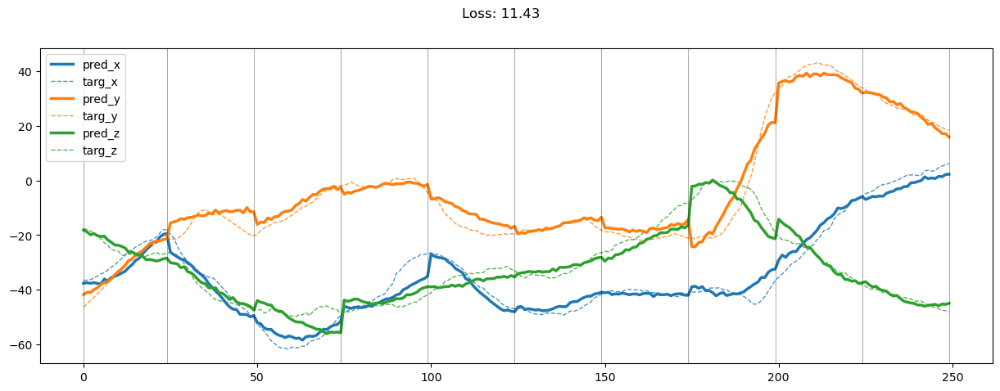

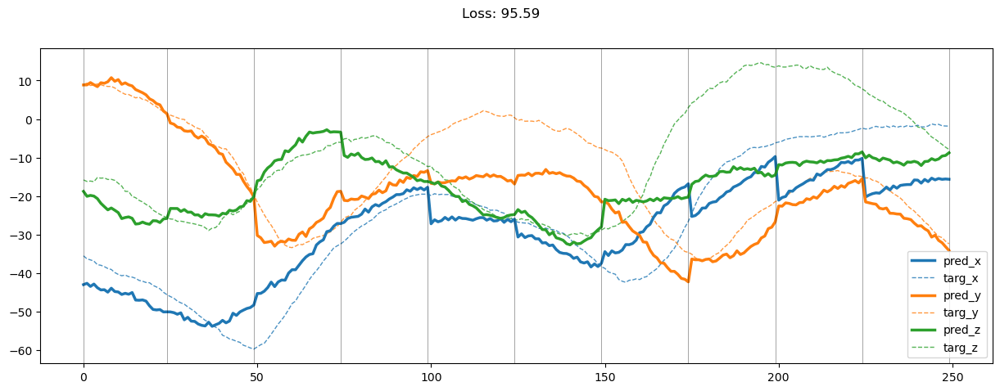

00249: train pred loss:  6.758, g loss:  48.346, diff loss:  13.167, d loss:  3.249
       valid pred loss:  187.440, g loss:  910.335, diff loss:  332.314, d loss:  3.248


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.01it/s]


00250: train pred loss:  6.700, g loss:  48.566, diff loss:  13.259, d loss:  3.249
       valid pred loss:  191.596, g loss:  934.670, diff loss:  344.540, d loss:  3.252


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


00251: train pred loss:  6.592, g loss:  48.109, diff loss:  13.148, d loss:  3.255
       valid pred loss:  192.594, g loss:  942.216, diff loss:  350.664, d loss:  3.261


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


00252: train pred loss:  6.739, g loss:  48.687, diff loss:  13.301, d loss:  3.269
       valid pred loss:  189.645, g loss:  924.188, diff loss:  340.205, d loss:  3.279


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.54it/s]


00253: train pred loss:  6.712, g loss:  48.058, diff loss:  13.116, d loss:  3.290
       valid pred loss:  184.178, g loss:  885.130, diff loss:  318.706, d loss:  3.303


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


00254: train pred loss:  6.757, g loss:  48.462, diff loss:  13.255, d loss:  3.318
       valid pred loss:  179.957, g loss:  914.737, diff loss:  331.655, d loss:  3.335


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


00255: train pred loss:  6.648, g loss:  47.585, diff loss:  13.021, d loss:  3.352
       valid pred loss:  189.874, g loss:  913.616, diff loss:  328.123, d loss:  3.372


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00256: train pred loss:  6.412, g loss:  46.058, diff loss:  12.617, d loss:  3.393
       valid pred loss:  180.089, g loss:  885.387, diff loss:  330.631, d loss:  3.417


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00257: train pred loss:  6.333, g loss:  45.529, diff loss:  12.495, d loss:  3.438
       valid pred loss:  189.935, g loss:  924.670, diff loss:  341.131, d loss:  3.465


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00258: train pred loss:  6.348, g loss:  44.922, diff loss:  12.317, d loss:  3.489
       valid pred loss:  195.836, g loss:  946.293, diff loss:  344.219, d loss:  3.517


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00259: train pred loss:  6.169, g loss:  44.048, diff loss:  12.115, d loss:  3.544
       valid pred loss:  180.970, g loss:  881.837, diff loss:  325.568, d loss:  3.575


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.01it/s]


00260: train pred loss:  6.670, g loss:  46.614, diff loss:  12.991, d loss:  3.603
       valid pred loss:  186.165, g loss:  892.942, diff loss:  321.385, d loss:  3.635


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00261: train pred loss:  6.494, g loss:  45.569, diff loss:  12.574, d loss:  3.665
       valid pred loss:  191.551, g loss:  928.670, diff loss:  341.063, d loss:  3.697


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00262: train pred loss:  6.408, g loss:  46.155, diff loss:  12.827, d loss:  3.728
       valid pred loss:  185.028, g loss:  901.818, diff loss:  333.317, d loss:  3.764


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.19it/s]


00263: train pred loss:  6.546, g loss:  46.282, diff loss:  12.850, d loss:  3.794
       valid pred loss:  190.996, g loss:  925.609, diff loss:  340.205, d loss:  3.829


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00264: train pred loss:  6.708, g loss:  47.403, diff loss:  13.196, d loss:  3.860
       valid pred loss:  187.010, g loss:  915.406, diff loss:  341.578, d loss:  3.895


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.75it/s]


00265: train pred loss:  7.007, g loss:  49.395, diff loss:  13.785, d loss:  3.927
       valid pred loss:  196.495, g loss:  973.460, diff loss:  345.016, d loss:  3.964


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00266: train pred loss:  6.912, g loss:  47.813, diff loss:  13.312, d loss:  3.994
       valid pred loss:  189.755, g loss:  936.628, diff loss:  331.508, d loss:  4.030


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00267: train pred loss:  6.753, g loss:  47.349, diff loss:  13.232, d loss:  4.061
       valid pred loss:  186.637, g loss:  927.026, diff loss:  332.141, d loss:  4.095


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00268: train pred loss:  6.487, g loss:  45.671, diff loss:  12.780, d loss:  4.126
       valid pred loss:  180.426, g loss:  885.315, diff loss:  330.546, d loss:  4.162


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00269: train pred loss:  6.361, g loss:  44.815, diff loss:  12.554, d loss:  4.190
       valid pred loss:  182.393, g loss:  881.542, diff loss:  322.212, d loss:  4.224


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00270: train pred loss:  6.334, g loss:  44.156, diff loss:  12.360, d loss:  4.253
       valid pred loss:  189.348, g loss:  939.788, diff loss:  335.097, d loss:  4.285


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


00271: train pred loss:  6.047, g loss:  42.419, diff loss:  11.891, d loss:  4.313
       valid pred loss:  186.949, g loss:  939.146, diff loss:  337.708, d loss:  4.344


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


00272: train pred loss:  6.084, g loss:  42.546, diff loss:  11.935, d loss:  4.371
       valid pred loss:  183.967, g loss:  911.264, diff loss:  321.912, d loss:  4.401


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


00273: train pred loss:  6.116, g loss:  41.987, diff loss:  11.750, d loss:  4.427
       valid pred loss:  192.168, g loss:  925.321, diff loss:  336.539, d loss:  4.455


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00274: train pred loss:  5.943, g loss:  41.937, diff loss:  11.801, d loss:  4.479
       valid pred loss:  185.687, g loss:  926.084, diff loss:  331.536, d loss:  4.505


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00275: train pred loss:  5.993, g loss:  41.708, diff loss:  11.718, d loss:  4.529
       valid pred loss:  183.943, g loss:  904.453, diff loss:  339.808, d loss:  4.554


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.17it/s]


00276: train pred loss:  5.792, g loss:  40.609, diff loss:  11.427, d loss:  4.575
       valid pred loss:  192.207, g loss:  934.127, diff loss:  345.758, d loss:  4.598


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.85it/s]


00277: train pred loss:  5.845, g loss:  40.241, diff loss:  11.294, d loss:  4.617
       valid pred loss:  182.785, g loss:  908.784, diff loss:  324.676, d loss:  4.640


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


00278: train pred loss:  5.717, g loss:  40.062, diff loss:  11.284, d loss:  4.656
       valid pred loss:  184.350, g loss:  904.107, diff loss:  318.801, d loss:  4.677


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


00279: train pred loss:  5.935, g loss:  41.569, diff loss:  11.719, d loss:  4.692
       valid pred loss:  184.503, g loss:  889.511, diff loss:  324.017, d loss:  4.709


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00280: train pred loss:  5.785, g loss:  40.317, diff loss:  11.357, d loss:  4.723
       valid pred loss:  181.495, g loss:  898.986, diff loss:  319.052, d loss:  4.739


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00281: train pred loss:  5.740, g loss:  40.096, diff loss:  11.302, d loss:  4.750
       valid pred loss:  187.431, g loss:  907.000, diff loss:  332.193, d loss:  4.763


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00282: train pred loss:  6.037, g loss:  41.911, diff loss:  11.812, d loss:  4.772
       valid pred loss:  183.552, g loss:  884.857, diff loss:  322.417, d loss:  4.783


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00283: train pred loss:  6.242, g loss:  42.979, diff loss:  12.102, d loss:  4.791
       valid pred loss:  194.035, g loss:  933.382, diff loss:  338.914, d loss:  4.800


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00284: train pred loss:  6.045, g loss:  42.190, diff loss:  11.907, d loss:  4.805
       valid pred loss:  183.500, g loss:  894.371, diff loss:  310.663, d loss:  4.811


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.82it/s]


00285: train pred loss:  5.979, g loss:  41.837, diff loss:  11.812, d loss:  4.814
       valid pred loss:  182.769, g loss:  901.162, diff loss:  315.346, d loss:  4.818


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


00286: train pred loss:  5.979, g loss:  41.356, diff loss:  11.653, d loss:  4.820
       valid pred loss:  182.250, g loss:  896.528, diff loss:  314.090, d loss:  4.821


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.18it/s]


00287: train pred loss:  5.838, g loss:  40.300, diff loss:  11.348, d loss:  4.820
       valid pred loss:  182.114, g loss:  908.330, diff loss:  324.213, d loss:  4.818


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.25it/s]


00288: train pred loss:  5.837, g loss:  40.490, diff loss:  11.411, d loss:  4.816
       valid pred loss:  179.014, g loss:  873.503, diff loss:  325.358, d loss:  4.812


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00289: train pred loss:  5.563, g loss:  38.934, diff loss:  10.982, d loss:  4.807
       valid pred loss:  180.306, g loss:  899.200, diff loss:  319.260, d loss:  4.802


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


00290: train pred loss:  5.940, g loss:  41.593, diff loss:  11.741, d loss:  4.794
       valid pred loss:  183.763, g loss:  889.559, diff loss:  327.392, d loss:  4.784


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00291: train pred loss:  5.924, g loss:  41.760, diff loss:  11.799, d loss:  4.777
       valid pred loss:  176.262, g loss:  882.887, diff loss:  319.098, d loss:  4.767


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00292: train pred loss:  5.708, g loss:  39.357, diff loss:  11.067, d loss:  4.754
       valid pred loss:  179.487, g loss:  867.280, diff loss:  317.646, d loss:  4.741


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00293: train pred loss:  5.497, g loss:  38.368, diff loss:  10.804, d loss:  4.728
       valid pred loss:  178.418, g loss:  888.289, diff loss:  317.444, d loss:  4.712


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


00294: train pred loss:  5.753, g loss:  40.079, diff loss:  11.284, d loss:  4.698
       valid pred loss:  176.965, g loss:  883.188, diff loss:  317.878, d loss:  4.680


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


00295: train pred loss:  5.603, g loss:  39.097, diff loss:  11.001, d loss:  4.663
       valid pred loss:  191.786, g loss:  922.427, diff loss:  335.578, d loss:  4.644


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.53it/s]


00296: train pred loss:  5.431, g loss:  38.192, diff loss:  10.750, d loss:  4.624
       valid pred loss:  176.103, g loss:  870.066, diff loss:  306.503, d loss:  4.602


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.70it/s]


00297: train pred loss:  5.522, g loss:  38.154, diff loss:  10.700, d loss:  4.582
       valid pred loss:  184.651, g loss:  909.325, diff loss:  319.860, d loss:  4.558


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.64it/s]


00298: train pred loss:  5.646, g loss:  39.499, diff loss:  11.098, d loss:  4.536
       valid pred loss:  188.657, g loss:  923.513, diff loss:  319.670, d loss:  4.512


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


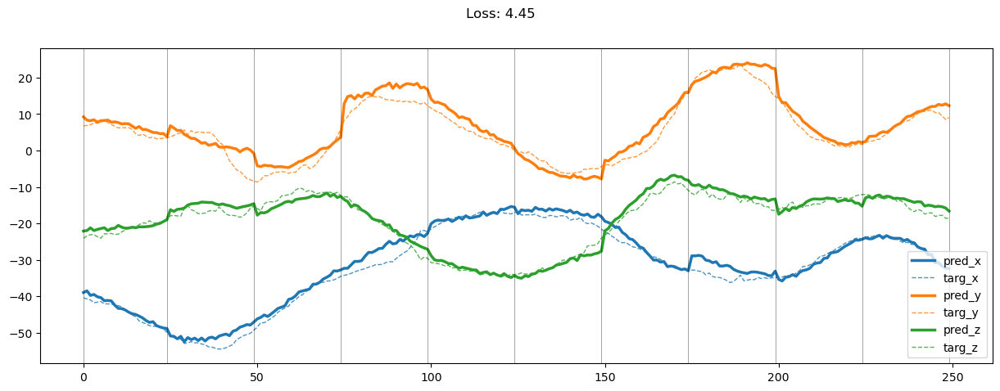

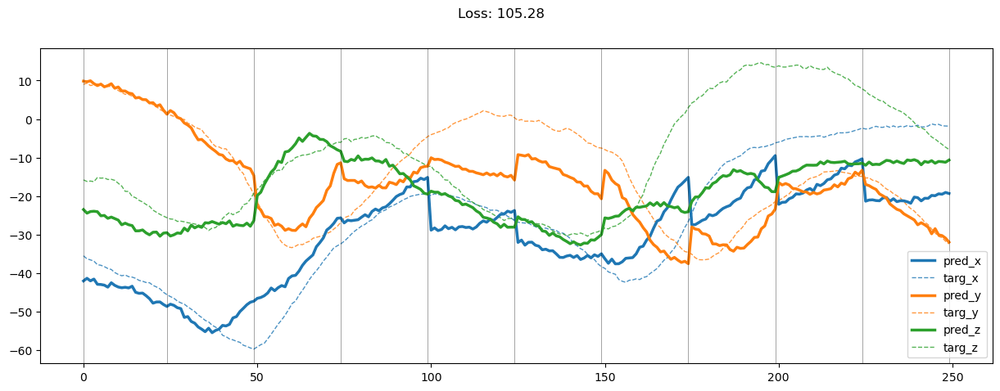

00299: train pred loss:  5.692, g loss:  39.766, diff loss:  11.163, d loss:  4.487
       valid pred loss:  175.615, g loss:  879.981, diff loss:  314.319, d loss:  4.459


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00300: train pred loss:  5.477, g loss:  38.326, diff loss:  10.744, d loss:  4.434
       valid pred loss:  181.634, g loss:  886.442, diff loss:  305.361, d loss:  4.406


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00301: train pred loss:  5.274, g loss:  36.842, diff loss:  10.305, d loss:  4.379
       valid pred loss:  176.429, g loss:  886.243, diff loss:  314.650, d loss:  4.349


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.95it/s]


00302: train pred loss:  5.252, g loss:  36.914, diff loss:  10.323, d loss:  4.321
       valid pred loss:  184.787, g loss:  900.156, diff loss:  310.986, d loss:  4.288


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.53it/s]


00303: train pred loss:  5.043, g loss:  35.418, diff loss:  9.880, d loss:  4.261
       valid pred loss:  179.526, g loss:  894.030, diff loss:  317.803, d loss:  4.230


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00304: train pred loss:  4.988, g loss:  35.525, diff loss:  9.918, d loss:  4.199
       valid pred loss:  176.966, g loss:  878.005, diff loss:  310.218, d loss:  4.166


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00305: train pred loss:  5.027, g loss:  35.780, diff loss:  9.973, d loss:  4.136
       valid pred loss:  178.942, g loss:  865.088, diff loss:  316.122, d loss:  4.102


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.26it/s]


00306: train pred loss:  5.057, g loss:  35.580, diff loss:  9.877, d loss:  4.071
       valid pred loss:  187.814, g loss:  925.408, diff loss:  326.621, d loss:  4.037


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00307: train pred loss:  5.012, g loss:  35.035, diff loss:  9.690, d loss:  4.006
       valid pred loss:  177.862, g loss:  879.417, diff loss:  309.152, d loss:  3.971


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00308: train pred loss:  4.985, g loss:  35.476, diff loss:  9.824, d loss:  3.941
       valid pred loss:  175.298, g loss:  848.373, diff loss:  309.384, d loss:  3.907


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00309: train pred loss:  4.949, g loss:  35.108, diff loss:  9.690, d loss:  3.876
       valid pred loss:  183.353, g loss:  890.214, diff loss:  326.456, d loss:  3.843


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00310: train pred loss:  5.144, g loss:  36.124, diff loss:  9.939, d loss:  3.812
       valid pred loss:  184.392, g loss:  906.728, diff loss:  319.885, d loss:  3.779


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00311: train pred loss:  5.072, g loss:  36.338, diff loss:  10.009, d loss:  3.750
       valid pred loss:  179.787, g loss:  873.025, diff loss:  319.959, d loss:  3.716


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00312: train pred loss:  5.093, g loss:  36.698, diff loss:  10.095, d loss:  3.689
       valid pred loss:  176.642, g loss:  867.779, diff loss:  302.301, d loss:  3.658


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00313: train pred loss:  5.413, g loss:  38.760, diff loss:  10.649, d loss:  3.632
       valid pred loss:  178.726, g loss:  860.115, diff loss:  310.290, d loss:  3.603


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.25it/s]


00314: train pred loss:  5.141, g loss:  36.769, diff loss:  10.049, d loss:  3.578
       valid pred loss:  174.362, g loss:  864.072, diff loss:  305.571, d loss:  3.550


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00315: train pred loss:  5.082, g loss:  36.384, diff loss:  9.914, d loss:  3.527
       valid pred loss:  179.258, g loss:  888.509, diff loss:  310.743, d loss:  3.503


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00316: train pred loss:  4.883, g loss:  35.280, diff loss:  9.587, d loss:  3.482
       valid pred loss:  185.917, g loss:  923.620, diff loss:  325.718, d loss:  3.460


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00317: train pred loss:  5.248, g loss:  37.596, diff loss:  10.214, d loss:  3.442
       valid pred loss:  176.646, g loss:  879.077, diff loss:  313.006, d loss:  3.423


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00318: train pred loss:  5.009, g loss:  36.122, diff loss:  9.782, d loss:  3.408
       valid pred loss:  177.823, g loss:  886.746, diff loss:  320.226, d loss:  3.393


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00319: train pred loss:  5.064, g loss:  36.352, diff loss:  9.823, d loss:  3.381
       valid pred loss:  171.131, g loss:  864.696, diff loss:  313.440, d loss:  3.369


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00320: train pred loss:  4.967, g loss:  35.615, diff loss:  9.597, d loss:  3.361
       valid pred loss:  185.798, g loss:  901.034, diff loss:  310.806, d loss:  3.354


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.30it/s]


00321: train pred loss:  4.725, g loss:  34.481, diff loss:  9.292, d loss:  3.348
       valid pred loss:  183.182, g loss:  908.699, diff loss:  321.341, d loss:  3.345


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00322: train pred loss:  4.916, g loss:  35.695, diff loss:  9.630, d loss:  3.344
       valid pred loss:  176.493, g loss:  875.848, diff loss:  312.040, d loss:  3.344


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00323: train pred loss:  4.967, g loss:  35.784, diff loss:  9.645, d loss:  3.348
       valid pred loss:  176.755, g loss:  870.803, diff loss:  307.018, d loss:  3.353


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00324: train pred loss:  4.934, g loss:  35.849, diff loss:  9.686, d loss:  3.360
       valid pred loss:  178.179, g loss:  881.465, diff loss:  312.250, d loss:  3.369


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00325: train pred loss:  4.795, g loss:  34.840, diff loss:  9.409, d loss:  3.380
       valid pred loss:  180.447, g loss:  889.954, diff loss:  313.402, d loss:  3.393


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.25it/s]


00326: train pred loss:  4.914, g loss:  35.548, diff loss:  9.623, d loss:  3.408
       valid pred loss:  186.681, g loss:  917.064, diff loss:  317.800, d loss:  3.427


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00327: train pred loss:  5.331, g loss:  38.435, diff loss:  10.468, d loss:  3.444
       valid pred loss:  191.775, g loss:  942.040, diff loss:  329.083, d loss:  3.466


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.15it/s]


00328: train pred loss:  5.238, g loss:  36.969, diff loss:  10.035, d loss:  3.487
       valid pred loss:  181.561, g loss:  885.302, diff loss:  327.318, d loss:  3.511


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.27it/s]


00329: train pred loss:  5.132, g loss:  36.367, diff loss:  9.896, d loss:  3.536
       valid pred loss:  174.447, g loss:  857.464, diff loss:  302.667, d loss:  3.564


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.54it/s]


00330: train pred loss:  4.813, g loss:  34.470, diff loss:  9.398, d loss:  3.590
       valid pred loss:  181.508, g loss:  896.316, diff loss:  317.199, d loss:  3.621


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00331: train pred loss:  4.669, g loss:  33.382, diff loss:  9.113, d loss:  3.649
       valid pred loss:  176.190, g loss:  862.905, diff loss:  301.029, d loss:  3.680


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00332: train pred loss:  4.516, g loss:  32.254, diff loss:  8.816, d loss:  3.711
       valid pred loss:  175.473, g loss:  875.283, diff loss:  313.054, d loss:  3.746


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.29it/s]


00333: train pred loss:  4.430, g loss:  31.547, diff loss:  8.637, d loss:  3.777
       valid pred loss:  171.400, g loss:  859.029, diff loss:  307.390, d loss:  3.813


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00334: train pred loss:  4.495, g loss:  32.202, diff loss:  8.861, d loss:  3.845
       valid pred loss:  170.325, g loss:  853.198, diff loss:  308.478, d loss:  3.882


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.98it/s]


00335: train pred loss:  4.515, g loss:  32.228, diff loss:  8.889, d loss:  3.913
       valid pred loss:  173.482, g loss:  863.671, diff loss:  307.716, d loss:  3.948


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00336: train pred loss:  4.430, g loss:  31.251, diff loss:  8.612, d loss:  3.975
       valid pred loss:  176.925, g loss:  876.636, diff loss:  309.957, d loss:  4.003


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.05it/s]


00337: train pred loss:  4.515, g loss:  32.094, diff loss:  8.883, d loss:  4.029
       valid pred loss:  178.184, g loss:  890.507, diff loss:  316.546, d loss:  4.057


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.96it/s]


00338: train pred loss:  4.460, g loss:  31.354, diff loss:  8.671, d loss:  4.083
       valid pred loss:  180.570, g loss:  892.725, diff loss:  316.320, d loss:  4.110


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00339: train pred loss:  4.453, g loss:  31.337, diff loss:  8.683, d loss:  4.135
       valid pred loss:  184.781, g loss:  895.718, diff loss:  327.977, d loss:  4.162


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00340: train pred loss:  4.386, g loss:  30.862, diff loss:  8.561, d loss:  4.186
       valid pred loss:  179.664, g loss:  883.523, diff loss:  308.399, d loss:  4.213


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00341: train pred loss:  4.280, g loss:  30.035, diff loss:  8.333, d loss:  4.235
       valid pred loss:  178.687, g loss:  875.205, diff loss:  305.720, d loss:  4.261


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.93it/s]


00342: train pred loss:  4.388, g loss:  30.871, diff loss:  8.588, d loss:  4.282
       valid pred loss:  183.423, g loss:  908.885, diff loss:  319.966, d loss:  4.306


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.90it/s]


00343: train pred loss:  4.383, g loss:  30.823, diff loss:  8.584, d loss:  4.327
       valid pred loss:  177.342, g loss:  883.424, diff loss:  316.172, d loss:  4.350


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


00344: train pred loss:  4.443, g loss:  31.296, diff loss:  8.731, d loss:  4.369
       valid pred loss:  178.996, g loss:  894.203, diff loss:  320.213, d loss:  4.390


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00345: train pred loss:  4.554, g loss:  31.955, diff loss:  8.922, d loss:  4.408
       valid pred loss:  178.770, g loss:  868.723, diff loss:  319.332, d loss:  4.428


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00346: train pred loss:  4.539, g loss:  31.806, diff loss:  8.885, d loss:  4.444
       valid pred loss:  180.794, g loss:  895.303, diff loss:  316.083, d loss:  4.463


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00347: train pred loss:  4.594, g loss:  31.840, diff loss:  8.885, d loss:  4.477
       valid pred loss:  178.658, g loss:  890.831, diff loss:  316.733, d loss:  4.493


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00348: train pred loss:  4.482, g loss:  31.251, diff loss:  8.731, d loss:  4.506
       valid pred loss:  178.261, g loss:  884.871, diff loss:  315.020, d loss:  4.521


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.07it/s]


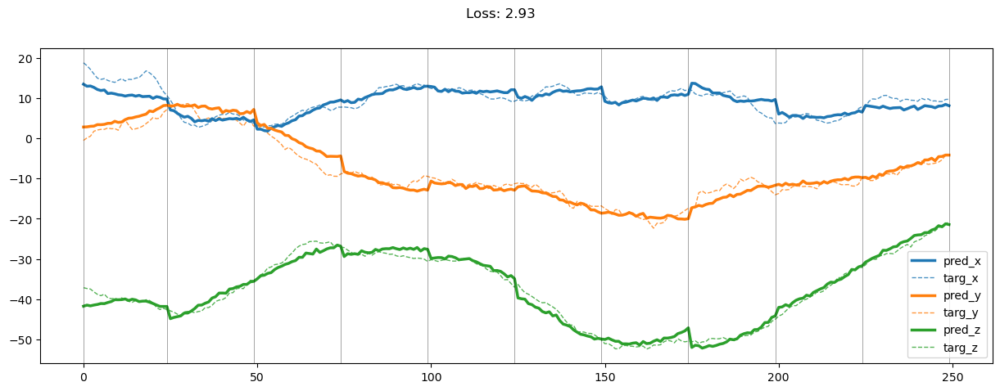

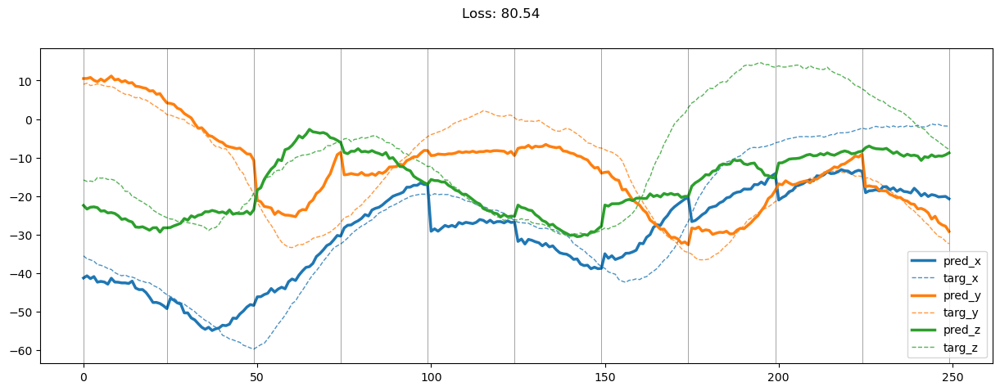

00349: train pred loss:  4.325, g loss:  30.512, diff loss:  8.542, d loss:  4.532
       valid pred loss:  173.951, g loss:  871.058, diff loss:  311.865, d loss:  4.544


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.27it/s]


00350: train pred loss:  4.287, g loss:  30.135, diff loss:  8.433, d loss:  4.553
       valid pred loss:  176.878, g loss:  869.618, diff loss:  325.922, d loss:  4.564


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.23it/s]


00351: train pred loss:  4.224, g loss:  29.551, diff loss:  8.263, d loss:  4.571
       valid pred loss:  180.323, g loss:  880.562, diff loss:  325.539, d loss:  4.580


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.47it/s]


00352: train pred loss:  4.063, g loss:  28.625, diff loss:  8.010, d loss:  4.584
       valid pred loss:  185.359, g loss:  923.888, diff loss:  326.020, d loss:  4.590


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.01it/s]


00353: train pred loss:  4.109, g loss:  28.773, diff loss:  8.046, d loss:  4.593
       valid pred loss:  183.356, g loss:  896.443, diff loss:  332.987, d loss:  4.598


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.31it/s]


00354: train pred loss:  4.226, g loss:  29.934, diff loss:  8.395, d loss:  4.598
       valid pred loss:  186.701, g loss:  923.189, diff loss:  322.182, d loss:  4.598


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.01it/s]


00355: train pred loss:  4.364, g loss:  30.816, diff loss:  8.642, d loss:  4.598
       valid pred loss:  185.102, g loss:  921.762, diff loss:  324.905, d loss:  4.596


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.24it/s]


00356: train pred loss:  4.235, g loss:  29.688, diff loss:  8.309, d loss:  4.594
       valid pred loss:  192.632, g loss:  926.052, diff loss:  335.729, d loss:  4.592


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.35it/s]


00357: train pred loss:  4.177, g loss:  29.169, diff loss:  8.154, d loss:  4.585
       valid pred loss:  176.399, g loss:  878.386, diff loss:  312.792, d loss:  4.579


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.22it/s]


00358: train pred loss:  4.341, g loss:  30.575, diff loss:  8.565, d loss:  4.572
       valid pred loss:  191.809, g loss:  927.593, diff loss:  338.708, d loss:  4.564


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.19it/s]


00359: train pred loss:  4.212, g loss:  28.952, diff loss:  8.064, d loss:  4.555
       valid pred loss:  188.726, g loss:  917.711, diff loss:  338.625, d loss:  4.543


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.48it/s]


00360: train pred loss:  4.215, g loss:  29.626, diff loss:  8.284, d loss:  4.533
       valid pred loss:  171.851, g loss:  864.308, diff loss:  310.772, d loss:  4.519


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 13.93it/s]


00361: train pred loss:  4.215, g loss:  29.611, diff loss:  8.274, d loss:  4.507
       valid pred loss:  183.799, g loss:  916.329, diff loss:  324.272, d loss:  4.491


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00362: train pred loss:  4.037, g loss:  28.482, diff loss:  7.951, d loss:  4.477
       valid pred loss:  173.918, g loss:  873.469, diff loss:  313.460, d loss:  4.461


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.31it/s]


00363: train pred loss:  4.170, g loss:  29.423, diff loss:  8.213, d loss:  4.443
       valid pred loss:  183.683, g loss:  902.501, diff loss:  314.545, d loss:  4.424


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00364: train pred loss:  4.186, g loss:  29.481, diff loss:  8.220, d loss:  4.405
       valid pred loss:  178.117, g loss:  886.832, diff loss:  314.719, d loss:  4.385


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.35it/s]


00365: train pred loss:  4.281, g loss:  30.024, diff loss:  8.360, d loss:  4.364
       valid pred loss:  187.165, g loss:  916.048, diff loss:  319.198, d loss:  4.342


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00366: train pred loss:  4.401, g loss:  30.953, diff loss:  8.620, d loss:  4.321
       valid pred loss:  185.812, g loss:  908.911, diff loss:  336.854, d loss:  4.297


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


00367: train pred loss:  4.407, g loss:  31.295, diff loss:  8.720, d loss:  4.274
       valid pred loss:  177.413, g loss:  889.911, diff loss:  316.863, d loss:  4.248


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.35it/s]


00368: train pred loss:  4.320, g loss:  30.417, diff loss:  8.444, d loss:  4.224
       valid pred loss:  177.580, g loss:  872.497, diff loss:  325.564, d loss:  4.198


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00369: train pred loss:  4.254, g loss:  29.699, diff loss:  8.214, d loss:  4.173
       valid pred loss:  177.905, g loss:  880.546, diff loss:  311.593, d loss:  4.145


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.31it/s]


00370: train pred loss:  4.229, g loss:  29.716, diff loss:  8.213, d loss:  4.120
       valid pred loss:  175.464, g loss:  898.504, diff loss:  330.191, d loss:  4.091


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.01it/s]


00371: train pred loss:  4.254, g loss:  30.264, diff loss:  8.371, d loss:  4.066
       valid pred loss:  175.825, g loss:  864.546, diff loss:  323.403, d loss:  4.037


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 13.98it/s]


00372: train pred loss:  4.496, g loss:  31.703, diff loss:  8.753, d loss:  4.011
       valid pred loss:  202.998, g loss:  959.106, diff loss:  336.233, d loss:  3.981


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.91it/s]


00373: train pred loss:  4.908, g loss:  33.485, diff loss:  9.191, d loss:  3.956
       valid pred loss:  181.819, g loss:  907.191, diff loss:  321.685, d loss:  3.926


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.27it/s]


00374: train pred loss:  4.712, g loss:  33.234, diff loss:  9.153, d loss:  3.901
       valid pred loss:  186.092, g loss:  921.958, diff loss:  349.235, d loss:  3.872


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00375: train pred loss:  4.555, g loss:  32.539, diff loss:  8.954, d loss:  3.847
       valid pred loss:  189.981, g loss:  929.976, diff loss:  346.200, d loss:  3.819


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


00376: train pred loss:  4.269, g loss:  30.214, diff loss:  8.253, d loss:  3.794
       valid pred loss:  180.034, g loss:  900.122, diff loss:  320.307, d loss:  3.767


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.71it/s]


00377: train pred loss:  4.065, g loss:  29.478, diff loss:  8.055, d loss:  3.743
       valid pred loss:  177.328, g loss:  863.106, diff loss:  317.868, d loss:  3.715


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00378: train pred loss:  4.121, g loss:  29.854, diff loss:  8.140, d loss:  3.694
       valid pred loss:  185.605, g loss:  902.415, diff loss:  331.714, d loss:  3.669


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00379: train pred loss:  4.174, g loss:  29.934, diff loss:  8.128, d loss:  3.649
       valid pred loss:  181.999, g loss:  908.989, diff loss:  321.925, d loss:  3.627


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


00380: train pred loss:  4.087, g loss:  29.523, diff loss:  8.000, d loss:  3.607
       valid pred loss:  182.379, g loss:  920.494, diff loss:  329.404, d loss:  3.587


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00381: train pred loss:  3.923, g loss:  28.609, diff loss:  7.731, d loss:  3.570
       valid pred loss:  188.963, g loss:  936.032, diff loss:  328.913, d loss:  3.552


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


00382: train pred loss:  3.877, g loss:  28.186, diff loss:  7.588, d loss:  3.537
       valid pred loss:  186.686, g loss:  901.369, diff loss:  326.905, d loss:  3.522


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00383: train pred loss:  4.007, g loss:  29.152, diff loss:  7.852, d loss:  3.510
       valid pred loss:  176.039, g loss:  888.467, diff loss:  320.872, d loss:  3.497


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00384: train pred loss:  4.033, g loss:  29.501, diff loss:  7.948, d loss:  3.489
       valid pred loss:  191.512, g loss:  926.349, diff loss:  337.120, d loss:  3.480


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


00385: train pred loss:  4.069, g loss:  29.512, diff loss:  7.931, d loss:  3.474
       valid pred loss:  193.471, g loss:  951.190, diff loss:  355.588, d loss:  3.468


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


00386: train pred loss:  4.092, g loss:  29.607, diff loss:  7.951, d loss:  3.466
       valid pred loss:  175.468, g loss:  884.923, diff loss:  314.541, d loss:  3.464


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


00387: train pred loss:  3.847, g loss:  27.693, diff loss:  7.394, d loss:  3.465
       valid pred loss:  176.091, g loss:  872.701, diff loss:  308.190, d loss:  3.467


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


00388: train pred loss:  3.915, g loss:  28.634, diff loss:  7.688, d loss:  3.471
       valid pred loss:  178.663, g loss:  889.549, diff loss:  314.777, d loss:  3.477


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.28it/s]


00389: train pred loss:  3.822, g loss:  28.007, diff loss:  7.518, d loss:  3.484
       valid pred loss:  177.546, g loss:  887.494, diff loss:  316.443, d loss:  3.493


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.85it/s]


00390: train pred loss:  3.719, g loss:  27.174, diff loss:  7.285, d loss:  3.504
       valid pred loss:  176.575, g loss:  883.426, diff loss:  314.010, d loss:  3.517


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00391: train pred loss:  3.739, g loss:  27.052, diff loss:  7.253, d loss:  3.530
       valid pred loss:  186.064, g loss:  935.130, diff loss:  329.302, d loss:  3.548


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00392: train pred loss:  3.749, g loss:  27.338, diff loss:  7.362, d loss:  3.564
       valid pred loss:  169.435, g loss:  862.742, diff loss:  311.634, d loss:  3.583


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00393: train pred loss:  3.709, g loss:  27.028, diff loss:  7.292, d loss:  3.602
       valid pred loss:  187.488, g loss:  907.239, diff loss:  331.214, d loss:  3.625


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00394: train pred loss:  3.707, g loss:  26.811, diff loss:  7.241, d loss:  3.646
       valid pred loss:  182.901, g loss:  891.094, diff loss:  328.972, d loss:  3.670


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00395: train pred loss:  3.792, g loss:  27.576, diff loss:  7.490, d loss:  3.694
       valid pred loss:  182.676, g loss:  906.287, diff loss:  319.495, d loss:  3.720


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00396: train pred loss:  3.951, g loss:  28.052, diff loss:  7.619, d loss:  3.745
       valid pred loss:  187.214, g loss:  906.215, diff loss:  331.224, d loss:  3.774


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00397: train pred loss:  3.923, g loss:  27.772, diff loss:  7.557, d loss:  3.799
       valid pred loss:  185.412, g loss:  903.870, diff loss:  333.656, d loss:  3.829


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00398: train pred loss:  3.896, g loss:  27.897, diff loss:  7.630, d loss:  3.855
       valid pred loss:  175.349, g loss:  881.659, diff loss:  314.429, d loss:  3.885


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


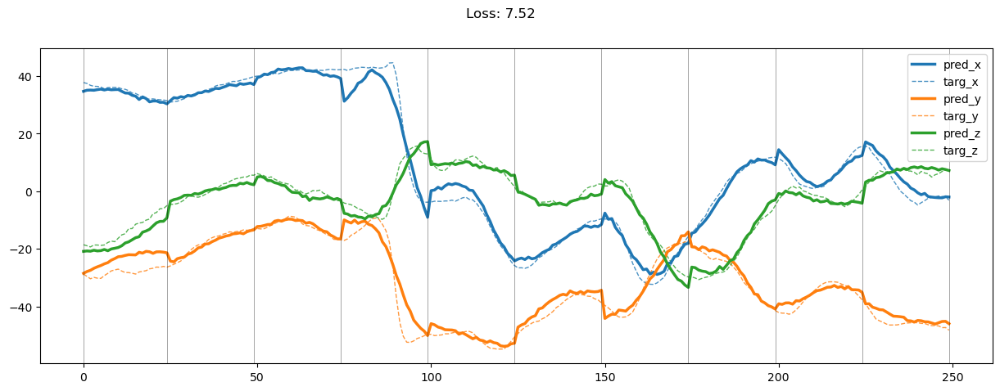

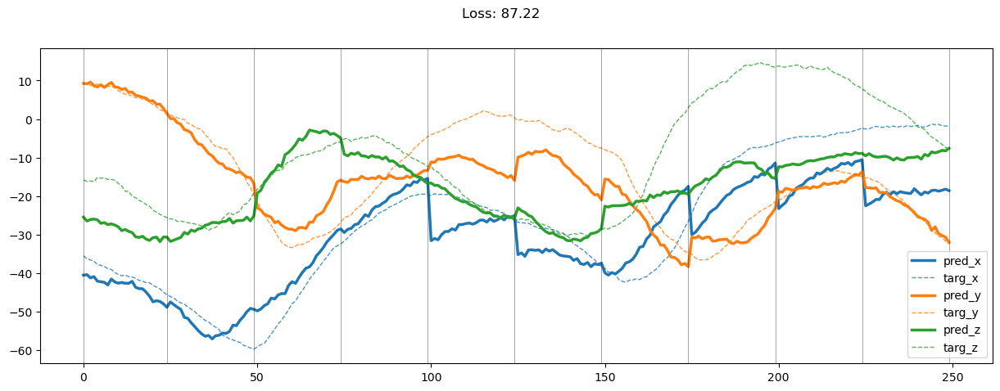

00399: train pred loss:  3.929, g loss:  27.925, diff loss:  7.649, d loss:  3.913
       valid pred loss:  167.063, g loss:  853.390, diff loss:  311.130, d loss:  3.944


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00400: train pred loss:  4.092, g loss:  28.818, diff loss:  7.912, d loss:  3.971
       valid pred loss:  185.224, g loss:  913.891, diff loss:  317.977, d loss:  4.001


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00401: train pred loss:  3.914, g loss:  27.546, diff loss:  7.567, d loss:  4.029
       valid pred loss:  185.341, g loss:  900.799, diff loss:  331.273, d loss:  4.060


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00402: train pred loss:  3.889, g loss:  27.793, diff loss:  7.675, d loss:  4.086
       valid pred loss:  185.075, g loss:  895.995, diff loss:  327.800, d loss:  4.115


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00403: train pred loss:  4.030, g loss:  28.103, diff loss:  7.747, d loss:  4.142
       valid pred loss:  181.519, g loss:  913.277, diff loss:  324.654, d loss:  4.171


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.06it/s]


00404: train pred loss:  3.943, g loss:  28.324, diff loss:  7.865, d loss:  4.196
       valid pred loss:  173.690, g loss:  865.512, diff loss:  306.566, d loss:  4.224


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00405: train pred loss:  3.833, g loss:  26.981, diff loss:  7.467, d loss:  4.246
       valid pred loss:  186.669, g loss:  900.749, diff loss:  326.725, d loss:  4.270


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00406: train pred loss:  3.774, g loss:  26.371, diff loss:  7.293, d loss:  4.287
       valid pred loss:  192.150, g loss:  942.729, diff loss:  353.188, d loss:  4.303


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00407: train pred loss:  3.813, g loss:  26.787, diff loss:  7.426, d loss:  4.317
       valid pred loss:  172.758, g loss:  854.708, diff loss:  298.182, d loss:  4.332


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00408: train pred loss:  3.668, g loss:  25.933, diff loss:  7.196, d loss:  4.344
       valid pred loss:  181.603, g loss:  904.046, diff loss:  319.752, d loss:  4.358


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.48it/s]


00409: train pred loss:  3.641, g loss:  25.540, diff loss:  7.080, d loss:  4.368
       valid pred loss:  178.343, g loss:  880.458, diff loss:  307.382, d loss:  4.379


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.10it/s]


00410: train pred loss:  3.604, g loss:  25.520, diff loss:  7.090, d loss:  4.389
       valid pred loss:  180.002, g loss:  886.794, diff loss:  307.877, d loss:  4.397


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00411: train pred loss:  3.678, g loss:  26.113, diff loss:  7.266, d loss:  4.405
       valid pred loss:  183.580, g loss:  915.805, diff loss:  325.634, d loss:  4.413


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00412: train pred loss:  3.780, g loss:  26.904, diff loss:  7.499, d loss:  4.419
       valid pred loss:  189.749, g loss:  912.369, diff loss:  330.971, d loss:  4.424


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


00413: train pred loss:  3.771, g loss:  26.680, diff loss:  7.429, d loss:  4.428
       valid pred loss:  172.664, g loss:  849.752, diff loss:  295.779, d loss:  4.432


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00414: train pred loss:  3.586, g loss:  25.157, diff loss:  6.984, d loss:  4.434
       valid pred loss:  175.622, g loss:  874.627, diff loss:  309.792, d loss:  4.435


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00415: train pred loss:  3.561, g loss:  25.153, diff loss:  6.992, d loss:  4.435
       valid pred loss:  176.461, g loss:  870.920, diff loss:  306.023, d loss:  4.435


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00416: train pred loss:  3.483, g loss:  24.581, diff loss:  6.826, d loss:  4.433
       valid pred loss:  178.471, g loss:  877.816, diff loss:  304.964, d loss:  4.430


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00417: train pred loss:  3.531, g loss:  24.829, diff loss:  6.892, d loss:  4.426
       valid pred loss:  181.489, g loss:  869.090, diff loss:  312.471, d loss:  4.421


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00418: train pred loss:  3.609, g loss:  25.668, diff loss:  7.143, d loss:  4.415
       valid pred loss:  169.979, g loss:  850.832, diff loss:  300.119, d loss:  4.408


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00419: train pred loss:  3.521, g loss:  24.950, diff loss:  6.930, d loss:  4.400
       valid pred loss:  179.288, g loss:  872.012, diff loss:  321.892, d loss:  4.391


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00420: train pred loss:  3.630, g loss:  25.956, diff loss:  7.224, d loss:  4.381
       valid pred loss:  185.196, g loss:  916.517, diff loss:  320.194, d loss:  4.368


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00421: train pred loss:  3.554, g loss:  24.801, diff loss:  6.859, d loss:  4.356
       valid pred loss:  176.619, g loss:  860.045, diff loss:  318.016, d loss:  4.342


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00422: train pred loss:  3.401, g loss:  24.034, diff loss:  6.648, d loss:  4.329
       valid pred loss:  176.438, g loss:  879.031, diff loss:  312.280, d loss:  4.313


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00423: train pred loss:  3.459, g loss:  24.695, diff loss:  6.843, d loss:  4.298
       valid pred loss:  172.367, g loss:  853.226, diff loss:  301.298, d loss:  4.281


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00424: train pred loss:  3.559, g loss:  25.087, diff loss:  6.932, d loss:  4.266
       valid pred loss:  173.968, g loss:  872.325, diff loss:  313.165, d loss:  4.248


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00425: train pred loss:  3.583, g loss:  25.126, diff loss:  6.928, d loss:  4.231
       valid pred loss:  184.168, g loss:  900.461, diff loss:  311.648, d loss:  4.212


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00426: train pred loss:  3.488, g loss:  24.748, diff loss:  6.824, d loss:  4.194
       valid pred loss:  178.825, g loss:  887.179, diff loss:  311.144, d loss:  4.175


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00427: train pred loss:  3.657, g loss:  25.814, diff loss:  7.113, d loss:  4.156
       valid pred loss:  177.847, g loss:  872.714, diff loss:  304.646, d loss:  4.136


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00428: train pred loss:  3.559, g loss:  25.379, diff loss:  6.989, d loss:  4.117
       valid pred loss:  177.613, g loss:  888.325, diff loss:  313.443, d loss:  4.095


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00429: train pred loss:  3.640, g loss:  25.869, diff loss:  7.114, d loss:  4.076
       valid pred loss:  179.481, g loss:  884.183, diff loss:  308.486, d loss:  4.054


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.25it/s]


00430: train pred loss:  3.632, g loss:  25.903, diff loss:  7.115, d loss:  4.034
       valid pred loss:  180.778, g loss:  901.054, diff loss:  318.774, d loss:  4.012


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00431: train pred loss:  3.721, g loss:  25.616, diff loss:  6.976, d loss:  3.992
       valid pred loss:  179.264, g loss:  896.428, diff loss:  317.487, d loss:  3.970


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00432: train pred loss:  3.573, g loss:  25.143, diff loss:  6.854, d loss:  3.950
       valid pred loss:  186.290, g loss:  909.453, diff loss:  338.813, d loss:  3.927


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.67it/s]


00433: train pred loss:  3.483, g loss:  24.743, diff loss:  6.736, d loss:  3.908
       valid pred loss:  171.598, g loss:  865.759, diff loss:  313.289, d loss:  3.887


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


00434: train pred loss:  3.408, g loss:  24.293, diff loss:  6.595, d loss:  3.867
       valid pred loss:  176.773, g loss:  884.733, diff loss:  314.706, d loss:  3.844


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.53it/s]


00435: train pred loss:  3.305, g loss:  23.792, diff loss:  6.447, d loss:  3.826
       valid pred loss:  183.481, g loss:  903.331, diff loss:  314.834, d loss:  3.804


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00436: train pred loss:  3.267, g loss:  23.703, diff loss:  6.414, d loss:  3.786
       valid pred loss:  175.279, g loss:  869.027, diff loss:  306.925, d loss:  3.766


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00437: train pred loss:  3.394, g loss:  24.811, diff loss:  6.726, d loss:  3.749
       valid pred loss:  181.876, g loss:  890.455, diff loss:  308.682, d loss:  3.729


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00438: train pred loss:  3.290, g loss:  23.875, diff loss:  6.433, d loss:  3.712
       valid pred loss:  180.647, g loss:  898.369, diff loss:  316.516, d loss:  3.694


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00439: train pred loss:  3.239, g loss:  23.814, diff loss:  6.414, d loss:  3.678
       valid pred loss:  176.794, g loss:  868.668, diff loss:  304.226, d loss:  3.661


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00440: train pred loss:  3.272, g loss:  24.189, diff loss:  6.513, d loss:  3.646
       valid pred loss:  182.741, g loss:  888.896, diff loss:  306.844, d loss:  3.630


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.25it/s]


00441: train pred loss:  3.307, g loss:  23.998, diff loss:  6.423, d loss:  3.616
       valid pred loss:  175.251, g loss:  877.479, diff loss:  311.956, d loss:  3.601


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.17it/s]


00442: train pred loss:  3.205, g loss:  23.392, diff loss:  6.242, d loss:  3.590
       valid pred loss:  178.864, g loss:  887.080, diff loss:  311.314, d loss:  3.577


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.31it/s]


00443: train pred loss:  3.155, g loss:  23.247, diff loss:  6.199, d loss:  3.567
       valid pred loss:  185.182, g loss:  896.344, diff loss:  327.662, d loss:  3.555


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00444: train pred loss:  3.232, g loss:  23.770, diff loss:  6.337, d loss:  3.547
       valid pred loss:  176.126, g loss:  891.988, diff loss:  320.829, d loss:  3.537


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00445: train pred loss:  3.248, g loss:  24.113, diff loss:  6.437, d loss:  3.531
       valid pred loss:  182.846, g loss:  884.975, diff loss:  322.867, d loss:  3.524


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.42it/s]


00446: train pred loss:  3.200, g loss:  23.729, diff loss:  6.319, d loss:  3.519
       valid pred loss:  178.415, g loss:  898.709, diff loss:  319.659, d loss:  3.515


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.64it/s]


00447: train pred loss:  3.352, g loss:  24.727, diff loss:  6.597, d loss:  3.511
       valid pred loss:  180.087, g loss:  870.945, diff loss:  317.120, d loss:  3.509


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00448: train pred loss:  3.574, g loss:  25.885, diff loss:  6.907, d loss:  3.508
       valid pred loss:  169.479, g loss:  856.672, diff loss:  305.844, d loss:  3.507


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.13it/s]


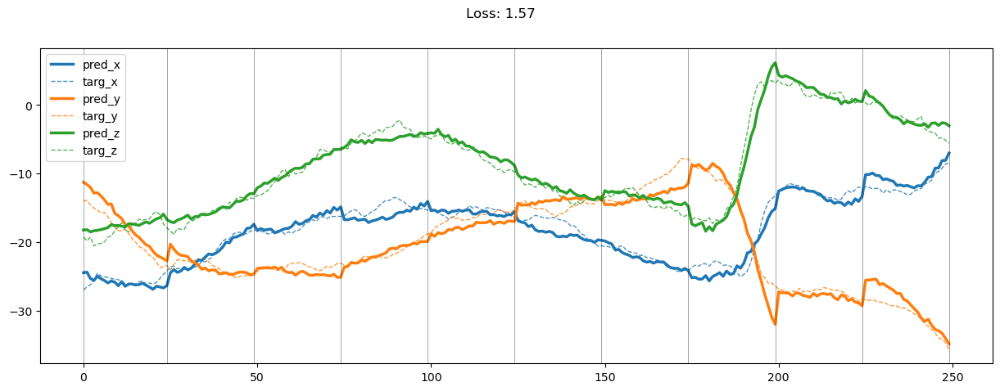

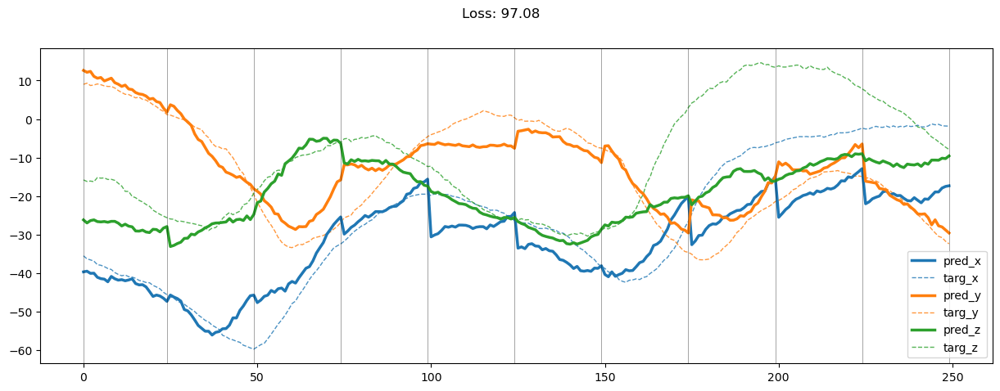

00449: train pred loss:  3.539, g loss:  25.676, diff loss:  6.850, d loss:  3.509
       valid pred loss:  172.368, g loss:  866.380, diff loss:  309.066, d loss:  3.512


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00450: train pred loss:  3.462, g loss:  25.286, diff loss:  6.748, d loss:  3.515
       valid pred loss:  181.468, g loss:  871.370, diff loss:  313.193, d loss:  3.520


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00451: train pred loss:  3.524, g loss:  25.138, diff loss:  6.684, d loss:  3.526
       valid pred loss:  177.323, g loss:  878.513, diff loss:  307.266, d loss:  3.533


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00452: train pred loss:  3.426, g loss:  24.800, diff loss:  6.612, d loss:  3.541
       valid pred loss:  182.919, g loss:  889.368, diff loss:  327.083, d loss:  3.552


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00453: train pred loss:  3.341, g loss:  24.274, diff loss:  6.476, d loss:  3.562
       valid pred loss:  172.396, g loss:  854.935, diff loss:  300.319, d loss:  3.574


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00454: train pred loss:  3.322, g loss:  23.994, diff loss:  6.402, d loss:  3.587
       valid pred loss:  181.722, g loss:  877.396, diff loss:  318.295, d loss:  3.602


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


00455: train pred loss:  3.211, g loss:  23.532, diff loss:  6.300, d loss:  3.617
       valid pred loss:  178.349, g loss:  879.831, diff loss:  304.690, d loss:  3.634


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.02it/s]


00456: train pred loss:  3.282, g loss:  24.138, diff loss:  6.495, d loss:  3.651
       valid pred loss:  174.205, g loss:  863.095, diff loss:  305.251, d loss:  3.670


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.06it/s]


00457: train pred loss:  3.271, g loss:  23.837, diff loss:  6.415, d loss:  3.689
       valid pred loss:  179.318, g loss:  889.580, diff loss:  310.992, d loss:  3.710


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.98it/s]


00458: train pred loss:  3.288, g loss:  23.818, diff loss:  6.422, d loss:  3.731
       valid pred loss:  184.329, g loss:  897.288, diff loss:  330.675, d loss:  3.755


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00459: train pred loss:  3.483, g loss:  24.728, diff loss:  6.680, d loss:  3.776
       valid pred loss:  184.645, g loss:  910.320, diff loss:  313.640, d loss:  3.802


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.01it/s]


00460: train pred loss:  3.445, g loss:  24.620, diff loss:  6.676, d loss:  3.824
       valid pred loss:  181.995, g loss:  879.146, diff loss:  319.609, d loss:  3.850


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.81it/s]


00461: train pred loss:  3.294, g loss:  23.601, diff loss:  6.406, d loss:  3.875
       valid pred loss:  185.308, g loss:  890.676, diff loss:  321.796, d loss:  3.903


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00462: train pred loss:  3.157, g loss:  22.798, diff loss:  6.203, d loss:  3.927
       valid pred loss:  185.663, g loss:  891.184, diff loss:  321.781, d loss:  3.955


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00463: train pred loss:  3.222, g loss:  23.167, diff loss:  6.322, d loss:  3.980
       valid pred loss:  191.009, g loss:  908.849, diff loss:  323.057, d loss:  4.009


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


00464: train pred loss:  3.270, g loss:  23.333, diff loss:  6.379, d loss:  4.035
       valid pred loss:  180.869, g loss:  888.672, diff loss:  306.060, d loss:  4.064


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00465: train pred loss:  3.237, g loss:  23.137, diff loss:  6.342, d loss:  4.089
       valid pred loss:  184.857, g loss:  881.999, diff loss:  314.436, d loss:  4.117


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00466: train pred loss:  3.172, g loss:  22.506, diff loss:  6.168, d loss:  4.143
       valid pred loss:  175.854, g loss:  864.038, diff loss:  299.343, d loss:  4.172


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


00467: train pred loss:  3.299, g loss:  23.340, diff loss:  6.419, d loss:  4.197
       valid pred loss:  182.253, g loss:  895.872, diff loss:  310.362, d loss:  4.225


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00468: train pred loss:  3.261, g loss:  23.053, diff loss:  6.349, d loss:  4.248
       valid pred loss:  189.824, g loss:  897.935, diff loss:  315.260, d loss:  4.275


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00469: train pred loss:  3.372, g loss:  23.650, diff loss:  6.523, d loss:  4.298
       valid pred loss:  170.352, g loss:  847.564, diff loss:  300.276, d loss:  4.324


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.27it/s]


00470: train pred loss:  3.149, g loss:  22.324, diff loss:  6.167, d loss:  4.346
       valid pred loss:  179.974, g loss:  859.001, diff loss:  306.597, d loss:  4.369


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00471: train pred loss:  3.237, g loss:  22.999, diff loss:  6.372, d loss:  4.390
       valid pred loss:  184.067, g loss:  887.443, diff loss:  323.134, d loss:  4.412


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00472: train pred loss:  3.340, g loss:  23.605, diff loss:  6.549, d loss:  4.431
       valid pred loss:  176.985, g loss:  869.656, diff loss:  302.555, d loss:  4.453


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.93it/s]


00473: train pred loss:  3.311, g loss:  23.098, diff loss:  6.397, d loss:  4.469
       valid pred loss:  181.533, g loss:  871.240, diff loss:  314.541, d loss:  4.487


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.04it/s]


00474: train pred loss:  3.157, g loss:  21.917, diff loss:  6.061, d loss:  4.502
       valid pred loss:  181.655, g loss:  863.808, diff loss:  306.715, d loss:  4.519


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00475: train pred loss:  3.064, g loss:  21.611, diff loss:  5.996, d loss:  4.530
       valid pred loss:  181.273, g loss:  863.949, diff loss:  307.810, d loss:  4.543


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00476: train pred loss:  3.120, g loss:  22.120, diff loss:  6.151, d loss:  4.554
       valid pred loss:  182.362, g loss:  874.756, diff loss:  315.576, d loss:  4.564


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00477: train pred loss:  3.096, g loss:  21.891, diff loss:  6.086, d loss:  4.571
       valid pred loss:  180.838, g loss:  890.170, diff loss:  307.192, d loss:  4.578


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00478: train pred loss:  3.122, g loss:  21.946, diff loss:  6.098, d loss:  4.584
       valid pred loss:  178.866, g loss:  873.060, diff loss:  298.086, d loss:  4.588


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00479: train pred loss:  3.094, g loss:  21.787, diff loss:  6.055, d loss:  4.590
       valid pred loss:  190.507, g loss:  906.453, diff loss:  322.632, d loss:  4.590


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.24it/s]


00480: train pred loss:  3.103, g loss:  21.807, diff loss:  6.059, d loss:  4.590
       valid pred loss:  185.784, g loss:  882.523, diff loss:  311.834, d loss:  4.589


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.20it/s]


00481: train pred loss:  3.082, g loss:  21.420, diff loss:  5.936, d loss:  4.584
       valid pred loss:  173.396, g loss:  863.960, diff loss:  303.706, d loss:  4.577


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.81it/s]


00482: train pred loss:  2.979, g loss:  21.222, diff loss:  5.902, d loss:  4.571
       valid pred loss:  178.355, g loss:  861.947, diff loss:  315.046, d loss:  4.562


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00483: train pred loss:  2.901, g loss:  20.609, diff loss:  5.720, d loss:  4.552
       valid pred loss:  175.059, g loss:  847.290, diff loss:  308.978, d loss:  4.540


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.35it/s]


00484: train pred loss:  2.975, g loss:  21.153, diff loss:  5.872, d loss:  4.526
       valid pred loss:  180.407, g loss:  869.101, diff loss:  313.838, d loss:  4.512


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00485: train pred loss:  3.233, g loss:  22.444, diff loss:  6.210, d loss:  4.495
       valid pred loss:  180.822, g loss:  879.440, diff loss:  323.173, d loss:  4.475


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00486: train pred loss:  3.295, g loss:  22.927, diff loss:  6.343, d loss:  4.457
       valid pred loss:  183.964, g loss:  887.533, diff loss:  323.005, d loss:  4.435


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00487: train pred loss:  3.111, g loss:  21.859, diff loss:  6.039, d loss:  4.414
       valid pred loss:  167.897, g loss:  832.742, diff loss:  293.816, d loss:  4.389


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


00488: train pred loss:  3.182, g loss:  22.630, diff loss:  6.262, d loss:  4.366
       valid pred loss:  182.359, g loss:  899.091, diff loss:  312.488, d loss:  4.337


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.53it/s]


00489: train pred loss:  3.622, g loss:  25.327, diff loss:  7.002, d loss:  4.312
       valid pred loss:  180.455, g loss:  860.638, diff loss:  307.169, d loss:  4.282


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.32it/s]


00490: train pred loss:  3.621, g loss:  25.397, diff loss:  7.012, d loss:  4.255
       valid pred loss:  170.385, g loss:  845.783, diff loss:  297.813, d loss:  4.225


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.16it/s]


00491: train pred loss:  3.337, g loss:  23.561, diff loss:  6.479, d loss:  4.195
       valid pred loss:  174.793, g loss:  839.056, diff loss:  302.238, d loss:  4.162


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.31it/s]


00492: train pred loss:  3.240, g loss:  23.418, diff loss:  6.446, d loss:  4.132
       valid pred loss:  172.918, g loss:  841.696, diff loss:  310.461, d loss:  4.097


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.99it/s]


00493: train pred loss:  3.101, g loss:  22.237, diff loss:  6.080, d loss:  4.067
       valid pred loss:  174.221, g loss:  872.152, diff loss:  307.795, d loss:  4.032


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.14it/s]


00494: train pred loss:  3.025, g loss:  21.765, diff loss:  5.927, d loss:  4.001
       valid pred loss:  176.319, g loss:  862.007, diff loss:  319.948, d loss:  3.966


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.29it/s]


00495: train pred loss:  2.991, g loss:  21.795, diff loss:  5.927, d loss:  3.935
       valid pred loss:  170.771, g loss:  834.892, diff loss:  310.022, d loss:  3.899


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.89it/s]


00496: train pred loss:  2.972, g loss:  21.147, diff loss:  5.694, d loss:  3.870
       valid pred loss:  191.928, g loss:  930.629, diff loss:  341.441, d loss:  3.835


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.88it/s]


00497: train pred loss:  2.817, g loss:  20.666, diff loss:  5.560, d loss:  3.806
       valid pred loss:  180.400, g loss:  894.508, diff loss:  340.542, d loss:  3.772


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.35it/s]


00498: train pred loss:  2.803, g loss:  20.531, diff loss:  5.494, d loss:  3.744
       valid pred loss:  180.731, g loss:  866.228, diff loss:  311.188, d loss:  3.713


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


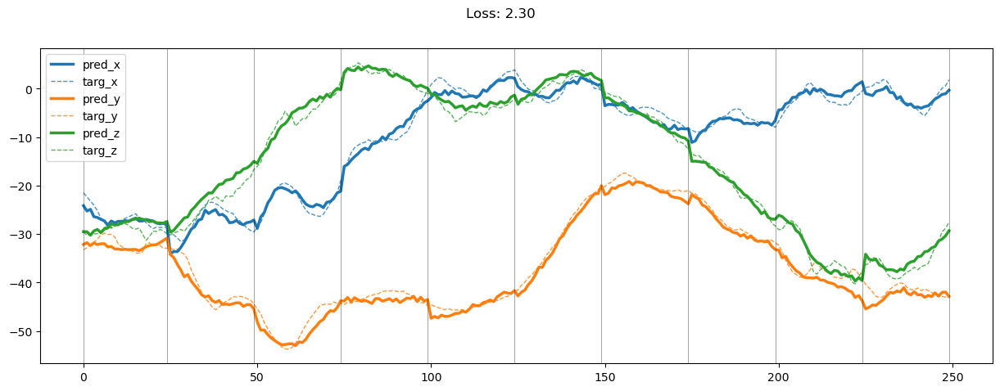

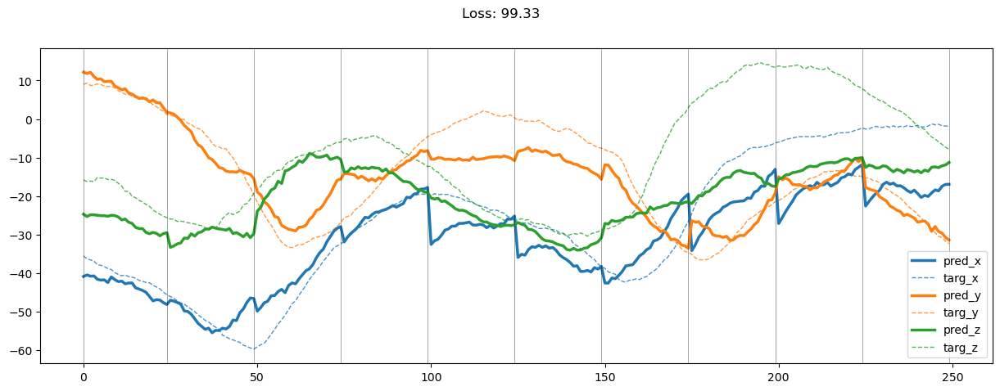

00499: train pred loss:  2.762, g loss:  20.450, diff loss:  5.455, d loss:  3.686
       valid pred loss:  178.190, g loss:  866.008, diff loss:  318.495, d loss:  3.657


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00500: train pred loss:  2.895, g loss:  21.414, diff loss:  5.707, d loss:  3.632
       valid pred loss:  191.481, g loss:  923.322, diff loss:  335.565, d loss:  3.605


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00501: train pred loss:  2.769, g loss:  20.490, diff loss:  5.417, d loss:  3.583
       valid pred loss:  177.906, g loss:  865.760, diff loss:  317.934, d loss:  3.559


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00502: train pred loss:  3.015, g loss:  22.004, diff loss:  5.817, d loss:  3.540
       valid pred loss:  182.471, g loss:  883.937, diff loss:  322.319, d loss:  3.519


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.35it/s]


00503: train pred loss:  3.164, g loss:  23.539, diff loss:  6.259, d loss:  3.503
       valid pred loss:  172.845, g loss:  842.855, diff loss:  311.483, d loss:  3.486


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.59it/s]


00504: train pred loss:  3.042, g loss:  22.777, diff loss:  6.029, d loss:  3.474
       valid pred loss:  188.351, g loss:  891.294, diff loss:  312.902, d loss:  3.461


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00505: train pred loss:  3.019, g loss:  22.270, diff loss:  5.855, d loss:  3.452
       valid pred loss:  175.432, g loss:  875.683, diff loss:  306.903, d loss:  3.444


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00506: train pred loss:  3.186, g loss:  23.564, diff loss:  6.224, d loss:  3.440
       valid pred loss:  192.430, g loss:  936.770, diff loss:  346.626, d loss:  3.437


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00507: train pred loss:  3.076, g loss:  22.721, diff loss:  5.977, d loss:  3.437
       valid pred loss:  179.983, g loss:  867.050, diff loss:  314.078, d loss:  3.439


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00508: train pred loss:  2.865, g loss:  21.253, diff loss:  5.562, d loss:  3.444
       valid pred loss:  176.152, g loss:  845.763, diff loss:  304.076, d loss:  3.451


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00509: train pred loss:  2.830, g loss:  21.214, diff loss:  5.571, d loss:  3.460
       valid pred loss:  175.881, g loss:  870.861, diff loss:  301.767, d loss:  3.473


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00510: train pred loss:  2.932, g loss:  21.775, diff loss:  5.739, d loss:  3.487
       valid pred loss:  177.605, g loss:  856.745, diff loss:  309.382, d loss:  3.505


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


00511: train pred loss:  2.859, g loss:  21.094, diff loss:  5.557, d loss:  3.523
       valid pred loss:  169.700, g loss:  859.634, diff loss:  307.000, d loss:  3.546


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00512: train pred loss:  2.899, g loss:  21.543, diff loss:  5.717, d loss:  3.570
       valid pred loss:  169.479, g loss:  834.212, diff loss:  288.770, d loss:  3.597


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00513: train pred loss:  2.842, g loss:  21.050, diff loss:  5.600, d loss:  3.624
       valid pred loss:  182.295, g loss:  905.351, diff loss:  313.792, d loss:  3.656


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00514: train pred loss:  2.870, g loss:  20.851, diff loss:  5.553, d loss:  3.686
       valid pred loss:  176.346, g loss:  869.356, diff loss:  301.179, d loss:  3.722


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00515: train pred loss:  2.688, g loss:  19.953, diff loss:  5.344, d loss:  3.755
       valid pred loss:  178.252, g loss:  878.002, diff loss:  303.008, d loss:  3.793


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.31it/s]


00516: train pred loss:  2.703, g loss:  19.619, diff loss:  5.258, d loss:  3.829
       valid pred loss:  167.341, g loss:  823.561, diff loss:  286.035, d loss:  3.869


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.13it/s]


00517: train pred loss:  2.573, g loss:  18.558, diff loss:  4.977, d loss:  3.906
       valid pred loss:  181.706, g loss:  886.752, diff loss:  303.245, d loss:  3.948


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.80it/s]


00518: train pred loss:  2.746, g loss:  19.711, diff loss:  5.331, d loss:  3.986
       valid pred loss:  171.451, g loss:  839.838, diff loss:  291.201, d loss:  4.029


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00519: train pred loss:  2.746, g loss:  19.880, diff loss:  5.413, d loss:  4.067
       valid pred loss:  175.159, g loss:  868.181, diff loss:  305.326, d loss:  4.110


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.06it/s]


00520: train pred loss:  2.703, g loss:  19.296, diff loss:  5.256, d loss:  4.148
       valid pred loss:  173.585, g loss:  859.307, diff loss:  301.746, d loss:  4.190


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


00521: train pred loss:  2.635, g loss:  19.002, diff loss:  5.202, d loss:  4.228
       valid pred loss:  171.990, g loss:  844.000, diff loss:  290.492, d loss:  4.269


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.32it/s]


00522: train pred loss:  2.641, g loss:  19.005, diff loss:  5.220, d loss:  4.305
       valid pred loss:  166.707, g loss:  836.072, diff loss:  298.091, d loss:  4.345


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00523: train pred loss:  2.606, g loss:  18.740, diff loss:  5.160, d loss:  4.379
       valid pred loss:  176.819, g loss:  871.416, diff loss:  300.476, d loss:  4.415


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00524: train pred loss:  2.659, g loss:  18.846, diff loss:  5.193, d loss:  4.448
       valid pred loss:  169.191, g loss:  839.273, diff loss:  294.002, d loss:  4.483


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00525: train pred loss:  2.571, g loss:  18.324, diff loss:  5.061, d loss:  4.512
       valid pred loss:  175.790, g loss:  873.332, diff loss:  304.652, d loss:  4.544


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00526: train pred loss:  2.609, g loss:  18.446, diff loss:  5.100, d loss:  4.570
       valid pred loss:  177.383, g loss:  857.478, diff loss:  312.720, d loss:  4.597


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.78it/s]


00527: train pred loss:  2.540, g loss:  17.993, diff loss:  4.980, d loss:  4.620
       valid pred loss:  176.664, g loss:  859.085, diff loss:  315.668, d loss:  4.644


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.84it/s]


00528: train pred loss:  2.571, g loss:  18.019, diff loss:  4.986, d loss:  4.664
       valid pred loss:  174.650, g loss:  841.995, diff loss:  304.893, d loss:  4.683


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00529: train pred loss:  2.529, g loss:  17.809, diff loss:  4.936, d loss:  4.699
       valid pred loss:  169.212, g loss:  847.642, diff loss:  301.652, d loss:  4.716


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00530: train pred loss:  2.574, g loss:  18.131, diff loss:  5.032, d loss:  4.726
       valid pred loss:  170.461, g loss:  851.821, diff loss:  301.241, d loss:  4.738


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.11it/s]


00531: train pred loss:  2.564, g loss:  18.104, diff loss:  5.029, d loss:  4.743
       valid pred loss:  176.137, g loss:  877.716, diff loss:  307.952, d loss:  4.750


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00532: train pred loss:  2.543, g loss:  18.054, diff loss:  5.021, d loss:  4.751
       valid pred loss:  171.373, g loss:  856.729, diff loss:  302.081, d loss:  4.751


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00533: train pred loss:  2.642, g loss:  18.506, diff loss:  5.138, d loss:  4.748
       valid pred loss:  171.651, g loss:  857.022, diff loss:  303.541, d loss:  4.744


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00534: train pred loss:  2.670, g loss:  18.465, diff loss:  5.113, d loss:  4.735
       valid pred loss:  171.791, g loss:  857.131, diff loss:  302.562, d loss:  4.724


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00535: train pred loss:  2.655, g loss:  18.666, diff loss:  5.181, d loss:  4.712
       valid pred loss:  174.094, g loss:  861.627, diff loss:  304.397, d loss:  4.696


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00536: train pred loss:  2.702, g loss:  18.995, diff loss:  5.270, d loss:  4.678
       valid pred loss:  179.175, g loss:  866.891, diff loss:  317.487, d loss:  4.657


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00537: train pred loss:  2.659, g loss:  18.972, diff loss:  5.269, d loss:  4.634
       valid pred loss:  170.174, g loss:  844.758, diff loss:  297.978, d loss:  4.607


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00538: train pred loss:  2.615, g loss:  18.366, diff loss:  5.073, d loss:  4.581
       valid pred loss:  169.702, g loss:  826.192, diff loss:  304.729, d loss:  4.549


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00539: train pred loss:  2.724, g loss:  19.453, diff loss:  5.387, d loss:  4.518
       valid pred loss:  175.787, g loss:  873.200, diff loss:  304.251, d loss:  4.483


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00540: train pred loss:  2.940, g loss:  20.542, diff loss:  5.664, d loss:  4.448
       valid pred loss:  176.701, g loss:  873.712, diff loss:  304.379, d loss:  4.408


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


00541: train pred loss:  2.839, g loss:  20.090, diff loss:  5.531, d loss:  4.370
       valid pred loss:  179.803, g loss:  868.319, diff loss:  316.987, d loss:  4.327


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.04it/s]


00542: train pred loss:  2.795, g loss:  19.880, diff loss:  5.456, d loss:  4.287
       valid pred loss:  186.203, g loss:  900.510, diff loss:  329.616, d loss:  4.241


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.75it/s]


00543: train pred loss:  2.664, g loss:  19.040, diff loss:  5.198, d loss:  4.199
       valid pred loss:  173.293, g loss:  862.339, diff loss:  302.067, d loss:  4.152


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.31it/s]


00544: train pred loss:  2.688, g loss:  19.519, diff loss:  5.324, d loss:  4.108
       valid pred loss:  170.590, g loss:  836.104, diff loss:  312.041, d loss:  4.060


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.66it/s]


00545: train pred loss:  2.686, g loss:  19.499, diff loss:  5.290, d loss:  4.016
       valid pred loss:  182.734, g loss:  914.743, diff loss:  318.881, d loss:  3.967


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.23it/s]


00546: train pred loss:  2.753, g loss:  19.762, diff loss:  5.324, d loss:  3.924
       valid pred loss:  182.544, g loss:  890.063, diff loss:  329.666, d loss:  3.876


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00547: train pred loss:  2.724, g loss:  19.923, diff loss:  5.354, d loss:  3.833
       valid pred loss:  175.082, g loss:  878.038, diff loss:  311.578, d loss:  3.787


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00548: train pred loss:  2.935, g loss:  21.363, diff loss:  5.728, d loss:  3.746
       valid pred loss:  172.558, g loss:  842.854, diff loss:  311.834, d loss:  3.701


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.20it/s]


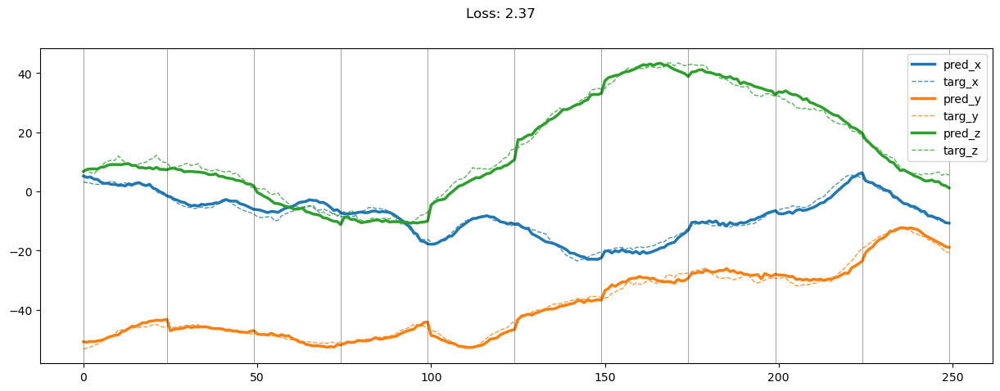

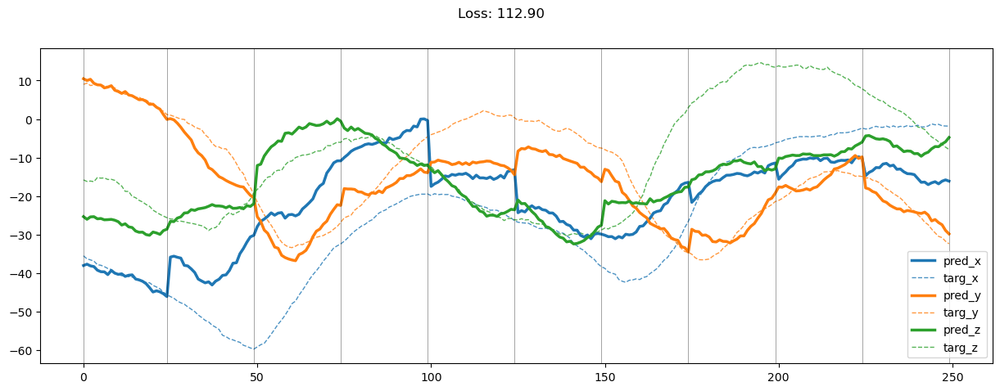

00549: train pred loss:  3.096, g loss:  22.099, diff loss:  5.883, d loss:  3.663
       valid pred loss:  173.938, g loss:  872.974, diff loss:  303.065, d loss:  3.621


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00550: train pred loss:  3.050, g loss:  22.084, diff loss:  5.856, d loss:  3.586
       valid pred loss:  178.427, g loss:  884.023, diff loss:  307.154, d loss:  3.548


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00551: train pred loss:  2.927, g loss:  21.541, diff loss:  5.680, d loss:  3.517
       valid pred loss:  180.463, g loss:  866.180, diff loss:  310.867, d loss:  3.484


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00552: train pred loss:  2.864, g loss:  21.112, diff loss:  5.524, d loss:  3.458
       valid pred loss:  177.942, g loss:  887.511, diff loss:  310.279, d loss:  3.430


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00553: train pred loss:  2.712, g loss:  20.434, diff loss:  5.319, d loss:  3.409
       valid pred loss:  177.485, g loss:  879.966, diff loss:  306.188, d loss:  3.388


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


00554: train pred loss:  2.701, g loss:  20.110, diff loss:  5.192, d loss:  3.372
       valid pred loss:  172.429, g loss:  862.719, diff loss:  300.825, d loss:  3.357


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00555: train pred loss:  2.702, g loss:  20.584, diff loss:  5.335, d loss:  3.349
       valid pred loss:  177.393, g loss:  883.291, diff loss:  308.191, d loss:  3.343


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00556: train pred loss:  2.689, g loss:  20.330, diff loss:  5.250, d loss:  3.342
       valid pred loss:  179.422, g loss:  873.138, diff loss:  321.163, d loss:  3.344


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


00557: train pred loss:  2.600, g loss:  19.685, diff loss:  5.076, d loss:  3.360
       valid pred loss:  173.232, g loss:  845.786, diff loss:  312.358, d loss:  3.389


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.03it/s]


00558: train pred loss:  2.458, g loss:  18.809, diff loss:  4.875, d loss:  3.430
       valid pred loss:  172.366, g loss:  869.708, diff loss:  306.170, d loss:  3.481


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00559: train pred loss:  2.523, g loss:  18.973, diff loss:  4.965, d loss:  3.531
       valid pred loss:  171.967, g loss:  858.368, diff loss:  301.475, d loss:  3.590


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00560: train pred loss:  2.824, g loss:  20.759, diff loss:  5.519, d loss:  3.646
       valid pred loss:  193.562, g loss:  935.877, diff loss:  340.701, d loss:  3.711


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00561: train pred loss:  3.702, g loss:  26.556, diff loss:  7.214, d loss:  3.772
       valid pred loss:  186.669, g loss:  892.519, diff loss:  318.792, d loss:  3.841


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.89it/s]


00562: train pred loss:  3.376, g loss:  24.436, diff loss:  6.667, d loss:  3.904
       valid pred loss:  182.209, g loss:  861.835, diff loss:  302.923, d loss:  3.976


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00563: train pred loss:  3.216, g loss:  22.969, diff loss:  6.277, d loss:  4.039
       valid pred loss:  176.253, g loss:  864.113, diff loss:  299.430, d loss:  4.110


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00564: train pred loss:  3.136, g loss:  21.889, diff loss:  5.982, d loss:  4.170
       valid pred loss:  185.078, g loss:  902.693, diff loss:  311.071, d loss:  4.237


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00565: train pred loss:  2.865, g loss:  19.946, diff loss:  5.456, d loss:  4.294
       valid pred loss:  170.489, g loss:  836.499, diff loss:  311.561, d loss:  4.355


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00566: train pred loss:  2.727, g loss:  19.295, diff loss:  5.310, d loss:  4.403
       valid pred loss:  167.075, g loss:  845.197, diff loss:  299.954, d loss:  4.455


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.96it/s]


00567: train pred loss:  2.741, g loss:  19.169, diff loss:  5.282, d loss:  4.494
       valid pred loss:  172.817, g loss:  856.021, diff loss:  299.938, d loss:  4.533


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00568: train pred loss:  2.680, g loss:  18.772, diff loss:  5.183, d loss:  4.560
       valid pred loss:  169.678, g loss:  823.429, diff loss:  302.246, d loss:  4.585


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00569: train pred loss:  2.618, g loss:  18.821, diff loss:  5.227, d loss:  4.601
       valid pred loss:  171.913, g loss:  858.967, diff loss:  303.165, d loss:  4.616


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.14it/s]


00570: train pred loss:  2.612, g loss:  18.445, diff loss:  5.107, d loss:  4.622
       valid pred loss:  187.229, g loss:  914.993, diff loss:  341.814, d loss:  4.626


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00571: train pred loss:  2.483, g loss:  17.529, diff loss:  4.845, d loss:  4.625
       valid pred loss:  182.167, g loss:  880.975, diff loss:  321.973, d loss:  4.622


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.06it/s]


00572: train pred loss:  2.337, g loss:  16.718, diff loss:  4.622, d loss:  4.613
       valid pred loss:  185.384, g loss:  908.018, diff loss:  340.478, d loss:  4.601


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00573: train pred loss:  2.385, g loss:  16.967, diff loss:  4.684, d loss:  4.586
       valid pred loss:  184.511, g loss:  892.021, diff loss:  325.890, d loss:  4.568


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00574: train pred loss:  2.322, g loss:  16.554, diff loss:  4.560, d loss:  4.547
       valid pred loss:  179.728, g loss:  875.061, diff loss:  324.204, d loss:  4.521


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00575: train pred loss:  2.382, g loss:  16.938, diff loss:  4.659, d loss:  4.496
       valid pred loss:  180.432, g loss:  871.031, diff loss:  317.887, d loss:  4.465


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.53it/s]


00576: train pred loss:  2.458, g loss:  17.383, diff loss:  4.769, d loss:  4.435
       valid pred loss:  177.486, g loss:  852.726, diff loss:  309.346, d loss:  4.400


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.90it/s]


00577: train pred loss:  2.572, g loss:  18.210, diff loss:  4.992, d loss:  4.367
       valid pred loss:  177.415, g loss:  857.026, diff loss:  313.142, d loss:  4.328


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.92it/s]


00578: train pred loss:  2.586, g loss:  18.610, diff loss:  5.103, d loss:  4.291
       valid pred loss:  180.072, g loss:  864.166, diff loss:  312.030, d loss:  4.250


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


00579: train pred loss:  2.584, g loss:  18.434, diff loss:  5.025, d loss:  4.211
       valid pred loss:  183.240, g loss:  889.780, diff loss:  328.042, d loss:  4.168


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


00580: train pred loss:  2.488, g loss:  17.899, diff loss:  4.856, d loss:  4.128
       valid pred loss:  182.519, g loss:  876.906, diff loss:  316.275, d loss:  4.083


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.21it/s]


00581: train pred loss:  2.507, g loss:  17.985, diff loss:  4.853, d loss:  4.043
       valid pred loss:  180.688, g loss:  903.899, diff loss:  315.406, d loss:  3.998


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


00582: train pred loss:  2.435, g loss:  17.450, diff loss:  4.672, d loss:  3.959
       valid pred loss:  173.459, g loss:  841.151, diff loss:  307.191, d loss:  3.915


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.19it/s]


00583: train pred loss:  2.466, g loss:  18.191, diff loss:  4.879, d loss:  3.876
       valid pred loss:  178.919, g loss:  881.716, diff loss:  301.688, d loss:  3.834


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00584: train pred loss:  2.522, g loss:  18.355, diff loss:  4.885, d loss:  3.798
       valid pred loss:  181.999, g loss:  872.236, diff loss:  312.971, d loss:  3.758


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.53it/s]


00585: train pred loss:  2.436, g loss:  18.227, diff loss:  4.840, d loss:  3.725
       valid pred loss:  177.133, g loss:  857.998, diff loss:  313.122, d loss:  3.690


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.85it/s]


00586: train pred loss:  2.414, g loss:  18.137, diff loss:  4.789, d loss:  3.660
       valid pred loss:  186.789, g loss:  901.240, diff loss:  327.057, d loss:  3.629


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


00587: train pred loss:  2.436, g loss:  18.140, diff loss:  4.755, d loss:  3.605
       valid pred loss:  171.731, g loss:  864.204, diff loss:  303.640, d loss:  3.580


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.54it/s]


00588: train pred loss:  2.352, g loss:  17.474, diff loss:  4.539, d loss:  3.561
       valid pred loss:  180.492, g loss:  873.918, diff loss:  318.748, d loss:  3.542


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


00589: train pred loss:  2.291, g loss:  17.229, diff loss:  4.461, d loss:  3.529
       valid pred loss:  181.608, g loss:  868.816, diff loss:  310.153, d loss:  3.518


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00590: train pred loss:  2.307, g loss:  17.408, diff loss:  4.506, d loss:  3.512
       valid pred loss:  175.959, g loss:  873.891, diff loss:  303.470, d loss:  3.508


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


00591: train pred loss:  2.246, g loss:  16.961, diff loss:  4.376, d loss:  3.510
       valid pred loss:  182.252, g loss:  876.000, diff loss:  315.797, d loss:  3.515


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00592: train pred loss:  2.191, g loss:  16.753, diff loss:  4.333, d loss:  3.525
       valid pred loss:  176.016, g loss:  877.093, diff loss:  305.096, d loss:  3.537


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.72it/s]


00593: train pred loss:  2.140, g loss:  16.251, diff loss:  4.199, d loss:  3.554
       valid pred loss:  180.115, g loss:  865.013, diff loss:  311.047, d loss:  3.576


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00594: train pred loss:  2.185, g loss:  16.465, diff loss:  4.278, d loss:  3.600
       valid pred loss:  176.005, g loss:  843.698, diff loss:  302.559, d loss:  3.629


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00595: train pred loss:  2.180, g loss:  16.470, diff loss:  4.310, d loss:  3.659
       valid pred loss:  184.970, g loss:  884.660, diff loss:  316.619, d loss:  3.694


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00596: train pred loss:  2.209, g loss:  16.322, diff loss:  4.283, d loss:  3.730
       valid pred loss:  185.849, g loss:  893.546, diff loss:  323.406, d loss:  3.771


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00597: train pred loss:  2.234, g loss:  16.400, diff loss:  4.334, d loss:  3.811
       valid pred loss:  179.373, g loss:  870.577, diff loss:  319.455, d loss:  3.856


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00598: train pred loss:  2.250, g loss:  16.606, diff loss:  4.431, d loss:  3.899
       valid pred loss:  182.611, g loss:  879.013, diff loss:  318.624, d loss:  3.946


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


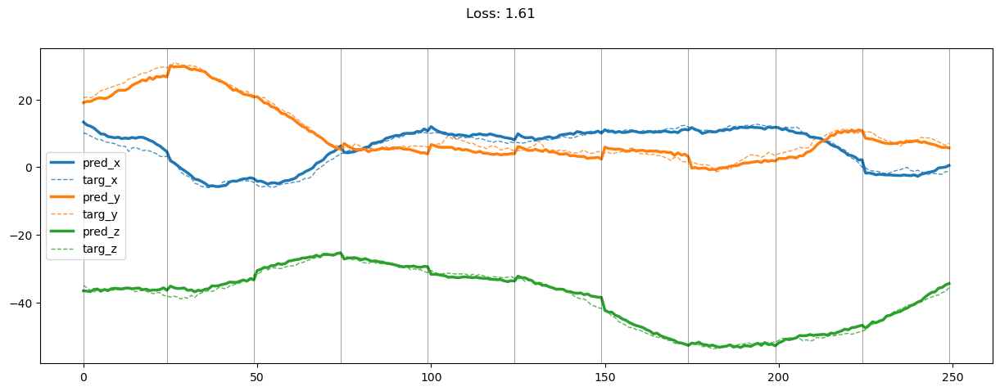

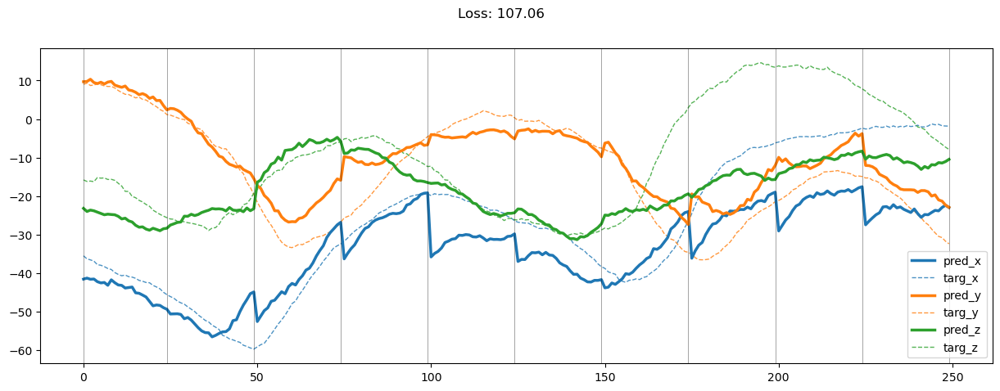

00599: train pred loss:  2.255, g loss:  16.447, diff loss:  4.408, d loss:  3.991
       valid pred loss:  190.227, g loss:  908.936, diff loss:  324.883, d loss:  4.040


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00600: train pred loss:  2.310, g loss:  16.679, diff loss:  4.496, d loss:  4.084
       valid pred loss:  179.100, g loss:  864.015, diff loss:  314.210, d loss:  4.133


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.62it/s]


00601: train pred loss:  2.324, g loss:  16.741, diff loss:  4.539, d loss:  4.177
       valid pred loss:  184.183, g loss:  882.885, diff loss:  316.686, d loss:  4.225


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.71it/s]


00602: train pred loss:  2.272, g loss:  16.309, diff loss:  4.436, d loss:  4.267
       valid pred loss:  178.662, g loss:  857.066, diff loss:  308.709, d loss:  4.313


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.15it/s]


00603: train pred loss:  2.353, g loss:  16.858, diff loss:  4.611, d loss:  4.352
       valid pred loss:  178.872, g loss:  853.010, diff loss:  303.611, d loss:  4.394


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.31it/s]


00604: train pred loss:  2.318, g loss:  16.516, diff loss:  4.526, d loss:  4.429
       valid pred loss:  184.048, g loss:  878.307, diff loss:  313.253, d loss:  4.467


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.82it/s]


00605: train pred loss:  2.258, g loss:  15.705, diff loss:  4.289, d loss:  4.499
       valid pred loss:  178.627, g loss:  854.751, diff loss:  305.516, d loss:  4.532


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.55it/s]


00606: train pred loss:  2.216, g loss:  15.624, diff loss:  4.288, d loss:  4.558
       valid pred loss:  177.661, g loss:  860.175, diff loss:  314.542, d loss:  4.585


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


00607: train pred loss:  2.238, g loss:  15.980, diff loss:  4.408, d loss:  4.607
       valid pred loss:  180.857, g loss:  864.706, diff loss:  308.953, d loss:  4.628


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.38it/s]


00608: train pred loss:  2.280, g loss:  16.243, diff loss:  4.488, d loss:  4.643
       valid pred loss:  176.718, g loss:  872.924, diff loss:  301.794, d loss:  4.659


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.54it/s]


00609: train pred loss:  2.330, g loss:  16.433, diff loss:  4.538, d loss:  4.667
       valid pred loss:  175.430, g loss:  873.116, diff loss:  305.335, d loss:  4.674


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


00610: train pred loss:  2.353, g loss:  16.379, diff loss:  4.514, d loss:  4.677
       valid pred loss:  184.538, g loss:  877.623, diff loss:  311.966, d loss:  4.676


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.55it/s]


00611: train pred loss:  2.276, g loss:  16.137, diff loss:  4.458, d loss:  4.671
       valid pred loss:  180.624, g loss:  872.701, diff loss:  318.271, d loss:  4.664


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.53it/s]


00612: train pred loss:  2.209, g loss:  15.674, diff loss:  4.323, d loss:  4.651
       valid pred loss:  178.050, g loss:  859.728, diff loss:  312.495, d loss:  4.634


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00613: train pred loss:  2.151, g loss:  15.483, diff loss:  4.273, d loss:  4.615
       valid pred loss:  173.520, g loss:  850.959, diff loss:  292.415, d loss:  4.592


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


00614: train pred loss:  2.145, g loss:  15.366, diff loss:  4.227, d loss:  4.565
       valid pred loss:  172.704, g loss:  837.524, diff loss:  306.634, d loss:  4.534


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.81it/s]


00615: train pred loss:  2.159, g loss:  15.384, diff loss:  4.216, d loss:  4.501
       valid pred loss:  171.087, g loss:  825.049, diff loss:  298.845, d loss:  4.463


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00616: train pred loss:  2.303, g loss:  16.381, diff loss:  4.485, d loss:  4.424
       valid pred loss:  176.873, g loss:  859.178, diff loss:  315.664, d loss:  4.379


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.53it/s]


00617: train pred loss:  2.221, g loss:  15.838, diff loss:  4.312, d loss:  4.336
       valid pred loss:  174.231, g loss:  838.762, diff loss:  303.547, d loss:  4.286


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.75it/s]


00618: train pred loss:  2.280, g loss:  16.379, diff loss:  4.449, d loss:  4.239
       valid pred loss:  173.177, g loss:  857.934, diff loss:  298.281, d loss:  4.184


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


00619: train pred loss:  2.233, g loss:  16.267, diff loss:  4.400, d loss:  4.136
       valid pred loss:  178.662, g loss:  886.371, diff loss:  309.164, d loss:  4.080


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00620: train pred loss:  2.169, g loss:  15.731, diff loss:  4.210, d loss:  4.028
       valid pred loss:  176.854, g loss:  869.323, diff loss:  300.754, d loss:  3.970


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00621: train pred loss:  2.142, g loss:  15.819, diff loss:  4.212, d loss:  3.919
       valid pred loss:  179.663, g loss:  865.186, diff loss:  313.692, d loss:  3.863


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00622: train pred loss:  2.175, g loss:  15.922, diff loss:  4.195, d loss:  3.812
       valid pred loss:  176.365, g loss:  843.021, diff loss:  301.718, d loss:  3.757


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.24it/s]


00623: train pred loss:  2.216, g loss:  16.491, diff loss:  4.328, d loss:  3.710
       valid pred loss:  187.744, g loss:  890.875, diff loss:  315.226, d loss:  3.659


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.55it/s]


00624: train pred loss:  2.236, g loss:  16.765, diff loss:  4.369, d loss:  3.616
       valid pred loss:  174.542, g loss:  844.392, diff loss:  308.204, d loss:  3.569


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.14it/s]


00625: train pred loss:  2.296, g loss:  17.415, diff loss:  4.523, d loss:  3.533
       valid pred loss:  177.802, g loss:  887.460, diff loss:  308.776, d loss:  3.493


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00626: train pred loss:  2.222, g loss:  16.868, diff loss:  4.327, d loss:  3.463
       valid pred loss:  183.267, g loss:  880.113, diff loss:  315.918, d loss:  3.432


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00627: train pred loss:  2.208, g loss:  16.704, diff loss:  4.246, d loss:  3.411
       valid pred loss:  174.017, g loss:  844.031, diff loss:  308.267, d loss:  3.391


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00628: train pred loss:  2.061, g loss:  15.773, diff loss:  3.964, d loss:  3.378
       valid pred loss:  176.203, g loss:  851.757, diff loss:  310.322, d loss:  3.369


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.71it/s]


00629: train pred loss:  2.015, g loss:  15.664, diff loss:  3.936, d loss:  3.368
       valid pred loss:  171.638, g loss:  835.297, diff loss:  307.105, d loss:  3.370


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00630: train pred loss:  2.036, g loss:  15.654, diff loss:  3.934, d loss:  3.380
       valid pred loss:  171.148, g loss:  831.102, diff loss:  304.779, d loss:  3.397


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00631: train pred loss:  2.136, g loss:  16.327, diff loss:  4.148, d loss:  3.418
       valid pred loss:  177.420, g loss:  854.160, diff loss:  309.806, d loss:  3.446


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00632: train pred loss:  2.282, g loss:  17.144, diff loss:  4.407, d loss:  3.478
       valid pred loss:  177.016, g loss:  856.387, diff loss:  313.130, d loss:  3.517


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00633: train pred loss:  2.279, g loss:  16.991, diff loss:  4.401, d loss:  3.559
       valid pred loss:  173.378, g loss:  832.575, diff loss:  301.175, d loss:  3.610


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.55it/s]


00634: train pred loss:  2.305, g loss:  17.031, diff loss:  4.455, d loss:  3.659
       valid pred loss:  186.993, g loss:  891.842, diff loss:  318.876, d loss:  3.717


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.17it/s]


00635: train pred loss:  2.392, g loss:  17.773, diff loss:  4.724, d loss:  3.773
       valid pred loss:  186.949, g loss:  881.636, diff loss:  309.102, d loss:  3.836


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


00636: train pred loss:  2.442, g loss:  17.808, diff loss:  4.766, d loss:  3.895
       valid pred loss:  188.767, g loss:  892.123, diff loss:  313.965, d loss:  3.962


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


00637: train pred loss:  2.285, g loss:  16.745, diff loss:  4.507, d loss:  4.023
       valid pred loss:  178.389, g loss:  848.136, diff loss:  301.362, d loss:  4.091


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00638: train pred loss:  2.231, g loss:  16.060, diff loss:  4.336, d loss:  4.151
       valid pred loss:  184.128, g loss:  877.529, diff loss:  313.267, d loss:  4.218


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


00639: train pred loss:  2.143, g loss:  15.481, diff loss:  4.204, d loss:  4.276
       valid pred loss:  178.051, g loss:  855.243, diff loss:  310.067, d loss:  4.341


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.16it/s]


00640: train pred loss:  2.263, g loss:  16.186, diff loss:  4.427, d loss:  4.395
       valid pred loss:  183.977, g loss:  883.661, diff loss:  321.135, d loss:  4.456


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.78it/s]


00641: train pred loss:  2.185, g loss:  15.586, diff loss:  4.276, d loss:  4.506
       valid pred loss:  174.394, g loss:  841.338, diff loss:  307.059, d loss:  4.561


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.46it/s]


00642: train pred loss:  2.188, g loss:  15.533, diff loss:  4.276, d loss:  4.607
       valid pred loss:  174.535, g loss:  838.930, diff loss:  304.047, d loss:  4.656


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.23it/s]


00643: train pred loss:  2.371, g loss:  16.737, diff loss:  4.630, d loss:  4.695
       valid pred loss:  178.655, g loss:  859.666, diff loss:  311.672, d loss:  4.736


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.18it/s]


00644: train pred loss:  2.213, g loss:  15.478, diff loss:  4.275, d loss:  4.768
       valid pred loss:  176.124, g loss:  879.010, diff loss:  308.313, d loss:  4.802


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00645: train pred loss:  2.115, g loss:  15.003, diff loss:  4.158, d loss:  4.827
       valid pred loss:  178.679, g loss:  884.605, diff loss:  307.408, d loss:  4.852


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.32it/s]


00646: train pred loss:  2.089, g loss:  14.813, diff loss:  4.108, d loss:  4.869
       valid pred loss:  176.756, g loss:  865.996, diff loss:  297.492, d loss:  4.884


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.29it/s]


00647: train pred loss:  2.098, g loss:  14.764, diff loss:  4.092, d loss:  4.893
       valid pred loss:  175.446, g loss:  844.560, diff loss:  306.215, d loss:  4.899


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


00648: train pred loss:  2.064, g loss:  14.630, diff loss:  4.059, d loss:  4.899
       valid pred loss:  184.640, g loss:  875.440, diff loss:  309.529, d loss:  4.894


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


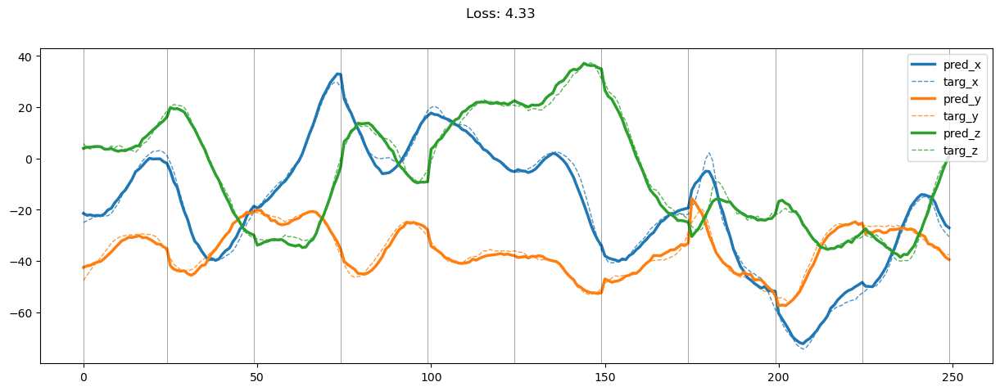

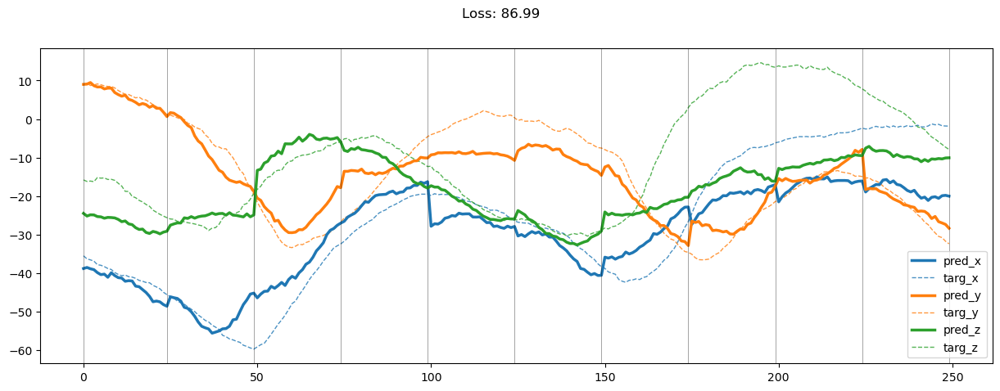

00649: train pred loss:  2.085, g loss:  14.842, diff loss:  4.122, d loss:  4.886
       valid pred loss:  170.086, g loss:  852.421, diff loss:  301.080, d loss:  4.872


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00650: train pred loss:  2.045, g loss:  14.501, diff loss:  4.017, d loss:  4.853
       valid pred loss:  179.540, g loss:  863.564, diff loss:  312.284, d loss:  4.829


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.08it/s]


00651: train pred loss:  2.034, g loss:  14.416, diff loss:  3.985, d loss:  4.800
       valid pred loss:  170.969, g loss:  856.277, diff loss:  301.372, d loss:  4.766


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.22it/s]


00652: train pred loss:  2.094, g loss:  14.892, diff loss:  4.113, d loss:  4.729
       valid pred loss:  174.263, g loss:  864.384, diff loss:  299.182, d loss:  4.686


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.32it/s]


00653: train pred loss:  2.012, g loss:  14.336, diff loss:  3.941, d loss:  4.642
       valid pred loss:  175.518, g loss:  843.942, diff loss:  305.946, d loss:  4.590


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


00654: train pred loss:  2.042, g loss:  14.605, diff loss:  4.002, d loss:  4.538
       valid pred loss:  179.061, g loss:  858.005, diff loss:  309.184, d loss:  4.479


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.32it/s]


00655: train pred loss:  2.062, g loss:  14.838, diff loss:  4.050, d loss:  4.422
       valid pred loss:  172.235, g loss:  835.458, diff loss:  307.234, d loss:  4.356


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00656: train pred loss:  1.986, g loss:  14.501, diff loss:  3.935, d loss:  4.295
       valid pred loss:  176.954, g loss:  855.964, diff loss:  313.187, d loss:  4.224


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.30it/s]


00657: train pred loss:  1.944, g loss:  14.220, diff loss:  3.821, d loss:  4.161
       valid pred loss:  178.757, g loss:  855.347, diff loss:  307.252, d loss:  4.090


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00658: train pred loss:  1.982, g loss:  14.499, diff loss:  3.861, d loss:  4.025
       valid pred loss:  174.874, g loss:  837.117, diff loss:  300.237, d loss:  3.951


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


00659: train pred loss:  2.025, g loss:  14.875, diff loss:  3.925, d loss:  3.888
       valid pred loss:  180.135, g loss:  860.321, diff loss:  307.314, d loss:  3.817


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.94it/s]


00660: train pred loss:  1.957, g loss:  14.732, diff loss:  3.848, d loss:  3.755
       valid pred loss:  175.401, g loss:  837.561, diff loss:  298.570, d loss:  3.687


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00661: train pred loss:  2.025, g loss:  15.336, diff loss:  3.970, d loss:  3.630
       valid pred loss:  181.490, g loss:  871.506, diff loss:  314.973, d loss:  3.567


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00662: train pred loss:  2.100, g loss:  15.944, diff loss:  4.089, d loss:  3.516
       valid pred loss:  177.054, g loss:  848.871, diff loss:  304.409, d loss:  3.461


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


00663: train pred loss:  2.188, g loss:  16.919, diff loss:  4.328, d loss:  3.417
       valid pred loss:  173.188, g loss:  835.503, diff loss:  303.467, d loss:  3.372


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00664: train pred loss:  2.217, g loss:  17.021, diff loss:  4.301, d loss:  3.338
       valid pred loss:  174.628, g loss:  840.246, diff loss:  303.146, d loss:  3.304


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00665: train pred loss:  2.125, g loss:  16.672, diff loss:  4.176, d loss:  3.281
       valid pred loss:  179.194, g loss:  859.792, diff loss:  309.323, d loss:  3.260


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00666: train pred loss:  2.101, g loss:  16.742, diff loss:  4.185, d loss:  3.249
       valid pred loss:  175.695, g loss:  849.100, diff loss:  307.360, d loss:  3.243


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00667: train pred loss:  2.075, g loss:  16.475, diff loss:  4.103, d loss:  3.247
       valid pred loss:  179.229, g loss:  881.235, diff loss:  302.781, d loss:  3.257


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00668: train pred loss:  2.076, g loss:  16.287, diff loss:  4.061, d loss:  3.275
       valid pred loss:  189.702, g loss:  904.298, diff loss:  322.148, d loss:  3.301


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00669: train pred loss:  2.129, g loss:  16.481, diff loss:  4.148, d loss:  3.334
       valid pred loss:  182.181, g loss:  873.314, diff loss:  313.681, d loss:  3.375


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00670: train pred loss:  2.221, g loss:  17.017, diff loss:  4.352, d loss:  3.421
       valid pred loss:  178.278, g loss:  854.091, diff loss:  306.434, d loss:  3.476


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00671: train pred loss:  2.125, g loss:  15.822, diff loss:  4.048, d loss:  3.532
       valid pred loss:  181.197, g loss:  865.367, diff loss:  309.212, d loss:  3.599


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00672: train pred loss:  2.025, g loss:  15.269, diff loss:  3.963, d loss:  3.662
       valid pred loss:  174.912, g loss:  840.533, diff loss:  303.392, d loss:  3.736


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00673: train pred loss:  2.029, g loss:  14.976, diff loss:  3.926, d loss:  3.806
       valid pred loss:  174.131, g loss:  837.059, diff loss:  303.065, d loss:  3.885


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00674: train pred loss:  1.983, g loss:  14.710, diff loss:  3.908, d loss:  3.957
       valid pred loss:  168.376, g loss:  815.331, diff loss:  297.912, d loss:  4.039


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00675: train pred loss:  1.965, g loss:  14.368, diff loss:  3.849, d loss:  4.111
       valid pred loss:  177.447, g loss:  857.452, diff loss:  312.340, d loss:  4.191


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00676: train pred loss:  1.906, g loss:  13.891, diff loss:  3.750, d loss:  4.262
       valid pred loss:  187.791, g loss:  899.731, diff loss:  324.356, d loss:  4.341


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.24it/s]


00677: train pred loss:  1.911, g loss:  13.796, diff loss:  3.750, d loss:  4.408
       valid pred loss:  177.472, g loss:  852.222, diff loss:  307.143, d loss:  4.482


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00678: train pred loss:  1.921, g loss:  13.742, diff loss:  3.756, d loss:  4.545
       valid pred loss:  180.148, g loss:  860.816, diff loss:  308.900, d loss:  4.614


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00679: train pred loss:  1.972, g loss:  13.941, diff loss:  3.828, d loss:  4.672
       valid pred loss:  171.729, g loss:  828.649, diff loss:  300.878, d loss:  4.733


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.08it/s]


00680: train pred loss:  1.968, g loss:  14.040, diff loss:  3.879, d loss:  4.785
       valid pred loss:  176.720, g loss:  843.656, diff loss:  301.606, d loss:  4.841


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00681: train pred loss:  1.998, g loss:  14.290, diff loss:  3.967, d loss:  4.885
       valid pred loss:  177.949, g loss:  869.759, diff loss:  296.874, d loss:  4.933


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00682: train pred loss:  1.997, g loss:  14.232, diff loss:  3.958, d loss:  4.970
       valid pred loss:  183.417, g loss:  874.462, diff loss:  311.776, d loss:  5.009


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00683: train pred loss:  1.956, g loss:  13.882, diff loss:  3.863, d loss:  5.038
       valid pred loss:  181.707, g loss:  879.870, diff loss:  322.538, d loss:  5.068


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00684: train pred loss:  1.951, g loss:  13.876, diff loss:  3.868, d loss:  5.088
       valid pred loss:  175.063, g loss:  846.363, diff loss:  309.261, d loss:  5.107


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00685: train pred loss:  1.957, g loss:  13.733, diff loss:  3.822, d loss:  5.119
       valid pred loss:  179.850, g loss:  865.477, diff loss:  314.482, d loss:  5.129


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00686: train pred loss:  2.024, g loss:  14.145, diff loss:  3.938, d loss:  5.131
       valid pred loss:  173.204, g loss:  827.645, diff loss:  297.158, d loss:  5.129


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00687: train pred loss:  1.997, g loss:  13.802, diff loss:  3.832, d loss:  5.123
       valid pred loss:  171.936, g loss:  845.640, diff loss:  291.848, d loss:  5.111


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00688: train pred loss:  1.949, g loss:  13.829, diff loss:  3.854, d loss:  5.093
       valid pred loss:  177.979, g loss:  851.981, diff loss:  307.051, d loss:  5.071


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.26it/s]


00689: train pred loss:  1.996, g loss:  14.212, diff loss:  3.960, d loss:  5.044
       valid pred loss:  187.148, g loss:  894.638, diff loss:  321.598, d loss:  5.011


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.21it/s]


00690: train pred loss:  2.460, g loss:  17.194, diff loss:  4.792, d loss:  4.975
       valid pred loss:  166.354, g loss:  806.080, diff loss:  294.496, d loss:  4.931


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.27it/s]


00691: train pred loss:  2.548, g loss:  17.973, diff loss:  5.011, d loss:  4.886
       valid pred loss:  175.647, g loss:  853.814, diff loss:  314.678, d loss:  4.832


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00692: train pred loss:  2.555, g loss:  18.115, diff loss:  5.041, d loss:  4.780
       valid pred loss:  180.206, g loss:  858.572, diff loss:  305.597, d loss:  4.719


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.53it/s]


00693: train pred loss:  2.414, g loss:  16.796, diff loss:  4.630, d loss:  4.659
       valid pred loss:  178.046, g loss:  885.054, diff loss:  306.244, d loss:  4.589


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


00694: train pred loss:  2.217, g loss:  15.752, diff loss:  4.324, d loss:  4.524
       valid pred loss:  183.337, g loss:  867.832, diff loss:  304.990, d loss:  4.448


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


00695: train pred loss:  2.140, g loss:  15.383, diff loss:  4.197, d loss:  4.379
       valid pred loss:  175.609, g loss:  845.464, diff loss:  305.767, d loss:  4.301


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.16it/s]


00696: train pred loss:  2.171, g loss:  15.717, diff loss:  4.262, d loss:  4.228
       valid pred loss:  166.577, g loss:  831.841, diff loss:  291.801, d loss:  4.145


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.25it/s]


00697: train pred loss:  2.273, g loss:  16.363, diff loss:  4.400, d loss:  4.073
       valid pred loss:  176.228, g loss:  849.982, diff loss:  308.438, d loss:  3.990


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.81it/s]


00698: train pred loss:  2.306, g loss:  16.454, diff loss:  4.368, d loss:  3.918
       valid pred loss:  169.076, g loss:  815.812, diff loss:  296.552, d loss:  3.837


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


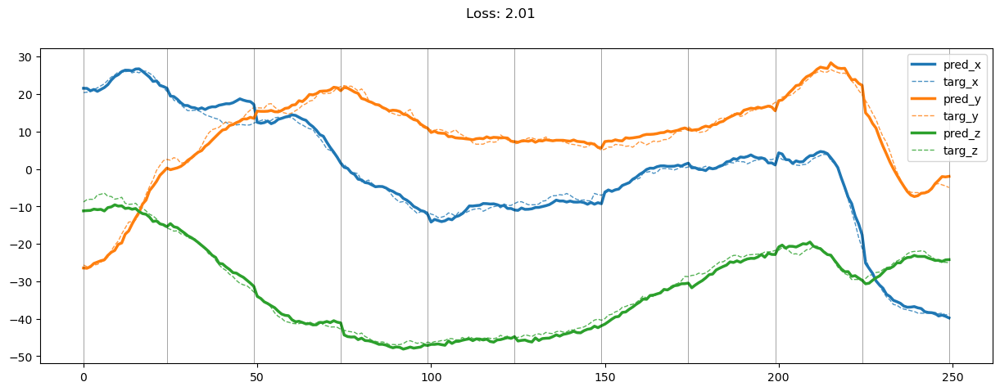

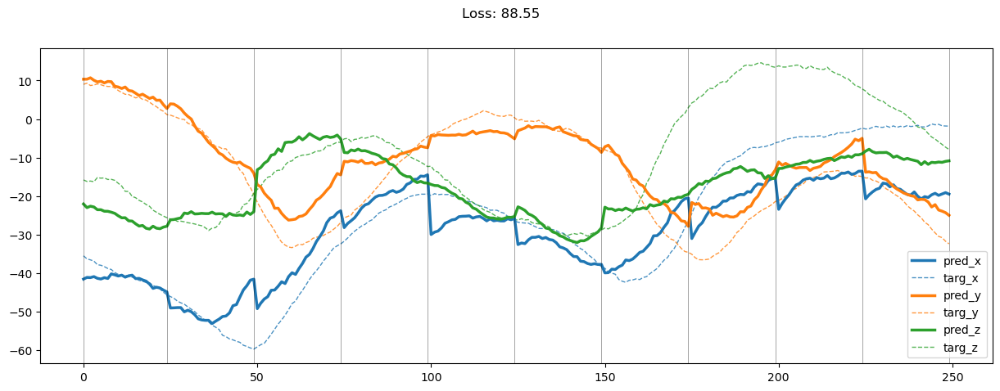

00699: train pred loss:  2.102, g loss:  15.662, diff loss:  4.115, d loss:  3.767
       valid pred loss:  167.523, g loss:  836.731, diff loss:  290.986, d loss:  3.691


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.86it/s]


00700: train pred loss:  1.978, g loss:  14.943, diff loss:  3.852, d loss:  3.625
       valid pred loss:  175.053, g loss:  855.834, diff loss:  318.745, d loss:  3.552


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


00701: train pred loss:  1.968, g loss:  15.294, diff loss:  3.903, d loss:  3.492
       valid pred loss:  172.118, g loss:  839.896, diff loss:  311.033, d loss:  3.428


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.32it/s]


00702: train pred loss:  2.054, g loss:  15.769, diff loss:  3.963, d loss:  3.376
       valid pred loss:  177.314, g loss:  864.986, diff loss:  320.494, d loss:  3.320


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


00703: train pred loss:  1.980, g loss:  15.382, diff loss:  3.793, d loss:  3.278
       valid pred loss:  177.353, g loss:  850.962, diff loss:  306.607, d loss:  3.234


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


00704: train pred loss:  1.964, g loss:  15.668, diff loss:  3.838, d loss:  3.203
       valid pred loss:  171.278, g loss:  825.318, diff loss:  298.432, d loss:  3.173


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


00705: train pred loss:  1.893, g loss:  15.492, diff loss:  3.764, d loss:  3.155
       valid pred loss:  175.568, g loss:  852.269, diff loss:  312.444, d loss:  3.140


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00706: train pred loss:  1.894, g loss:  15.415, diff loss:  3.723, d loss:  3.136
       valid pred loss:  174.136, g loss:  848.166, diff loss:  312.837, d loss:  3.137


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.53it/s]


00707: train pred loss:  1.956, g loss:  15.558, diff loss:  3.761, d loss:  3.149
       valid pred loss:  174.633, g loss:  847.591, diff loss:  311.427, d loss:  3.168


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.12it/s]


00708: train pred loss:  1.989, g loss:  15.713, diff loss:  3.838, d loss:  3.195
       valid pred loss:  168.886, g loss:  816.505, diff loss:  297.347, d loss:  3.232


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00709: train pred loss:  1.952, g loss:  15.277, diff loss:  3.764, d loss:  3.273
       valid pred loss:  169.612, g loss:  832.655, diff loss:  311.859, d loss:  3.325


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.21it/s]


00710: train pred loss:  1.960, g loss:  15.238, diff loss:  3.820, d loss:  3.380
       valid pred loss:  170.585, g loss:  830.929, diff loss:  305.759, d loss:  3.446


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


00711: train pred loss:  2.019, g loss:  15.399, diff loss:  3.931, d loss:  3.510
       valid pred loss:  177.523, g loss:  862.794, diff loss:  317.445, d loss:  3.587


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


00712: train pred loss:  2.084, g loss:  15.609, diff loss:  4.055, d loss:  3.659
       valid pred loss:  169.472, g loss:  839.499, diff loss:  291.407, d loss:  3.742


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.60it/s]


00713: train pred loss:  2.025, g loss:  15.066, diff loss:  3.962, d loss:  3.819
       valid pred loss:  178.569, g loss:  874.983, diff loss:  327.769, d loss:  3.906


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00714: train pred loss:  2.055, g loss:  15.151, diff loss:  4.041, d loss:  3.985
       valid pred loss:  184.444, g loss:  891.449, diff loss:  326.105, d loss:  4.073


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


00715: train pred loss:  2.015, g loss:  14.395, diff loss:  3.853, d loss:  4.152
       valid pred loss:  164.469, g loss:  808.218, diff loss:  303.145, d loss:  4.240


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00716: train pred loss:  1.906, g loss:  13.982, diff loss:  3.793, d loss:  4.315
       valid pred loss:  172.690, g loss:  844.555, diff loss:  314.276, d loss:  4.400


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.72it/s]


00717: train pred loss:  1.855, g loss:  13.303, diff loss:  3.618, d loss:  4.473
       valid pred loss:  178.322, g loss:  874.202, diff loss:  327.063, d loss:  4.552


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00718: train pred loss:  1.741, g loss:  12.575, diff loss:  3.441, d loss:  4.621
       valid pred loss:  176.250, g loss:  863.673, diff loss:  322.479, d loss:  4.697


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.15it/s]


00719: train pred loss:  1.759, g loss:  12.615, diff loss:  3.470, d loss:  4.760
       valid pred loss:  177.507, g loss:  860.433, diff loss:  315.854, d loss:  4.829


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00720: train pred loss:  1.755, g loss:  12.375, diff loss:  3.409, d loss:  4.886
       valid pred loss:  176.442, g loss:  857.807, diff loss:  316.975, d loss:  4.949


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00721: train pred loss:  1.751, g loss:  12.310, diff loss:  3.403, d loss:  4.999
       valid pred loss:  184.163, g loss:  908.055, diff loss:  344.376, d loss:  5.055


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00722: train pred loss:  1.808, g loss:  12.792, diff loss:  3.555, d loss:  5.098
       valid pred loss:  174.625, g loss:  850.412, diff loss:  314.499, d loss:  5.145


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00723: train pred loss:  1.744, g loss:  12.170, diff loss:  3.378, d loss:  5.181
       valid pred loss:  176.361, g loss:  859.666, diff loss:  318.716, d loss:  5.220


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.70it/s]


00724: train pred loss:  1.701, g loss:  11.963, diff loss:  3.330, d loss:  5.249
       valid pred loss:  175.324, g loss:  852.332, diff loss:  314.809, d loss:  5.280


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.54it/s]


00725: train pred loss:  1.686, g loss:  11.896, diff loss:  3.317, d loss:  5.300
       valid pred loss:  185.548, g loss:  900.402, diff loss:  332.745, d loss:  5.321


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.80it/s]


00726: train pred loss:  1.760, g loss:  12.397, diff loss:  3.462, d loss:  5.333
       valid pred loss:  173.550, g loss:  852.133, diff loss:  319.094, d loss:  5.344


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00727: train pred loss:  1.780, g loss:  12.523, diff loss:  3.499, d loss:  5.348
       valid pred loss:  170.918, g loss:  830.689, diff loss:  305.938, d loss:  5.350


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00728: train pred loss:  1.768, g loss:  12.452, diff loss:  3.478, d loss:  5.345
       valid pred loss:  180.961, g loss:  868.228, diff loss:  313.771, d loss:  5.336


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.31it/s]


00729: train pred loss:  1.833, g loss:  12.799, diff loss:  3.571, d loss:  5.322
       valid pred loss:  176.669, g loss:  856.786, diff loss:  315.537, d loss:  5.303


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.56it/s]


00730: train pred loss:  1.850, g loss:  12.939, diff loss:  3.608, d loss:  5.280
       valid pred loss:  182.648, g loss:  878.693, diff loss:  319.639, d loss:  5.251


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00731: train pred loss:  1.776, g loss:  12.497, diff loss:  3.480, d loss:  5.219
       valid pred loss:  172.397, g loss:  844.980, diff loss:  316.457, d loss:  5.181


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00732: train pred loss:  1.795, g loss:  12.596, diff loss:  3.499, d loss:  5.140
       valid pred loss:  183.661, g loss:  904.812, diff loss:  341.193, d loss:  5.092


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00733: train pred loss:  1.884, g loss:  13.144, diff loss:  3.642, d loss:  5.043
       valid pred loss:  185.510, g loss:  893.547, diff loss:  323.725, d loss:  4.985


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00734: train pred loss:  1.854, g loss:  12.891, diff loss:  3.554, d loss:  4.929
       valid pred loss:  177.289, g loss:  872.963, diff loss:  328.484, d loss:  4.863


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00735: train pred loss:  1.827, g loss:  12.987, diff loss:  3.578, d loss:  4.802
       valid pred loss:  188.135, g loss:  912.736, diff loss:  336.465, d loss:  4.729


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00736: train pred loss:  1.782, g loss:  12.655, diff loss:  3.461, d loss:  4.661
       valid pred loss:  185.897, g loss:  909.079, diff loss:  340.094, d loss:  4.583


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00737: train pred loss:  1.786, g loss:  12.878, diff loss:  3.507, d loss:  4.511
       valid pred loss:  188.401, g loss:  923.470, diff loss:  346.222, d loss:  4.429


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00738: train pred loss:  1.828, g loss:  13.183, diff loss:  3.562, d loss:  4.354
       valid pred loss:  180.693, g loss:  883.557, diff loss:  329.030, d loss:  4.269


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.29it/s]


00739: train pred loss:  1.754, g loss:  12.945, diff loss:  3.467, d loss:  4.192
       valid pred loss:  176.865, g loss:  867.343, diff loss:  323.754, d loss:  4.106


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.99it/s]


00740: train pred loss:  1.766, g loss:  13.081, diff loss:  3.462, d loss:  4.029
       valid pred loss:  182.956, g loss:  887.779, diff loss:  326.068, d loss:  3.943


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00741: train pred loss:  1.781, g loss:  13.415, diff loss:  3.513, d loss:  3.869
       valid pred loss:  173.647, g loss:  841.644, diff loss:  307.159, d loss:  3.785


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.31it/s]


00742: train pred loss:  1.818, g loss:  13.709, diff loss:  3.534, d loss:  3.713
       valid pred loss:  177.809, g loss:  869.678, diff loss:  323.172, d loss:  3.634


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.86it/s]


00743: train pred loss:  1.792, g loss:  13.781, diff loss:  3.497, d loss:  3.566
       valid pred loss:  184.780, g loss:  924.221, diff loss:  356.074, d loss:  3.491


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00744: train pred loss:  1.853, g loss:  14.408, diff loss:  3.610, d loss:  3.430
       valid pred loss:  183.559, g loss:  899.758, diff loss:  335.590, d loss:  3.363


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00745: train pred loss:  1.787, g loss:  14.277, diff loss:  3.511, d loss:  3.310
       valid pred loss:  174.497, g loss:  855.073, diff loss:  318.212, d loss:  3.252


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00746: train pred loss:  1.689, g loss:  13.729, diff loss:  3.287, d loss:  3.208
       valid pred loss:  175.225, g loss:  872.990, diff loss:  332.542, d loss:  3.162


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


00747: train pred loss:  1.681, g loss:  14.048, diff loss:  3.332, d loss:  3.128
       valid pred loss:  185.621, g loss:  911.091, diff loss:  340.699, d loss:  3.096


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00748: train pred loss:  1.712, g loss:  14.339, diff loss:  3.371, d loss:  3.074
       valid pred loss:  168.523, g loss:  833.495, diff loss:  313.748, d loss:  3.056


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


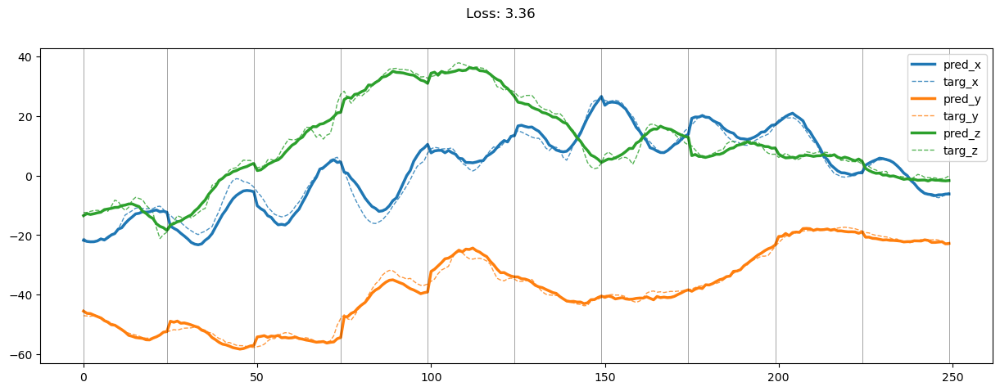

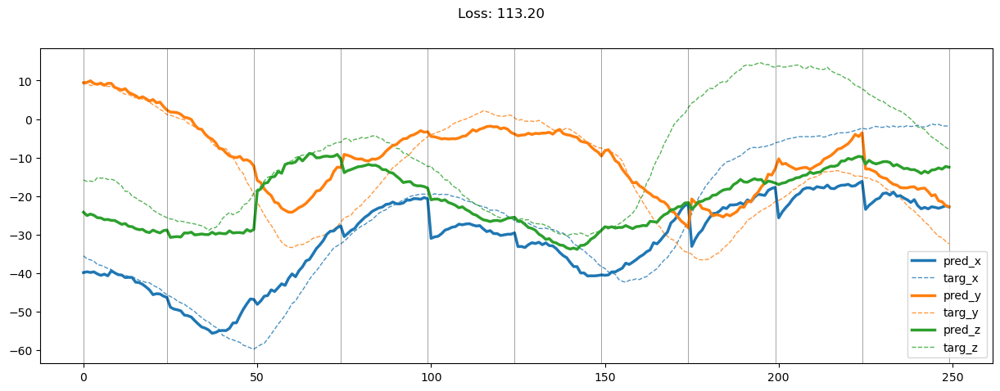

00749: train pred loss:  1.722, g loss:  14.411, diff loss:  3.369, d loss:  3.049
       valid pred loss:  187.302, g loss:  924.735, diff loss:  349.305, d loss:  3.046


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00750: train pred loss:  1.704, g loss:  14.282, diff loss:  3.336, d loss:  3.054
       valid pred loss:  174.930, g loss:  864.919, diff loss:  326.228, d loss:  3.067


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00751: train pred loss:  1.819, g loss:  14.977, diff loss:  3.562, d loss:  3.090
       valid pred loss:  175.161, g loss:  869.693, diff loss:  330.322, d loss:  3.122


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00752: train pred loss:  1.743, g loss:  14.382, diff loss:  3.447, d loss:  3.158
       valid pred loss:  173.227, g loss:  848.232, diff loss:  315.311, d loss:  3.206


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.27it/s]


00753: train pred loss:  1.845, g loss:  14.820, diff loss:  3.634, d loss:  3.256
       valid pred loss:  191.362, g loss:  936.793, diff loss:  350.069, d loss:  3.317


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00754: train pred loss:  1.961, g loss:  14.807, diff loss:  3.675, d loss:  3.378
       valid pred loss:  177.381, g loss:  847.934, diff loss:  303.693, d loss:  3.452


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00755: train pred loss:  1.904, g loss:  14.438, diff loss:  3.655, d loss:  3.521
       valid pred loss:  176.947, g loss:  850.968, diff loss:  308.211, d loss:  3.603


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00756: train pred loss:  1.781, g loss:  13.623, diff loss:  3.503, d loss:  3.678
       valid pred loss:  166.972, g loss:  816.399, diff loss:  303.619, d loss:  3.766


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00757: train pred loss:  1.761, g loss:  13.446, diff loss:  3.520, d loss:  3.845
       valid pred loss:  183.803, g loss:  899.891, diff loss:  336.170, d loss:  3.934


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.09it/s]


00758: train pred loss:  1.858, g loss:  13.842, diff loss:  3.680, d loss:  4.015
       valid pred loss:  174.867, g loss:  847.007, diff loss:  310.788, d loss:  4.106


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.82it/s]


00759: train pred loss:  1.829, g loss:  13.318, diff loss:  3.565, d loss:  4.185
       valid pred loss:  175.196, g loss:  871.667, diff loss:  333.368, d loss:  4.274


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


00760: train pred loss:  1.811, g loss:  13.092, diff loss:  3.537, d loss:  4.352
       valid pred loss:  175.988, g loss:  854.846, diff loss:  315.307, d loss:  4.438


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00761: train pred loss:  1.837, g loss:  13.059, diff loss:  3.551, d loss:  4.512
       valid pred loss:  176.862, g loss:  846.795, diff loss:  304.822, d loss:  4.595


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


00762: train pred loss:  1.803, g loss:  12.637, diff loss:  3.448, d loss:  4.665
       valid pred loss:  180.463, g loss:  870.759, diff loss:  317.430, d loss:  4.743


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00763: train pred loss:  1.866, g loss:  13.104, diff loss:  3.605, d loss:  4.809
       valid pred loss:  176.154, g loss:  848.033, diff loss:  308.086, d loss:  4.880


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00764: train pred loss:  1.959, g loss:  13.731, diff loss:  3.800, d loss:  4.942
       valid pred loss:  176.226, g loss:  848.431, diff loss:  308.756, d loss:  5.009


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


00765: train pred loss:  1.847, g loss:  13.091, diff loss:  3.638, d loss:  5.063
       valid pred loss:  173.961, g loss:  847.226, diff loss:  313.752, d loss:  5.123


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00766: train pred loss:  1.784, g loss:  12.542, diff loss:  3.488, d loss:  5.172
       valid pred loss:  176.269, g loss:  855.402, diff loss:  315.676, d loss:  5.226


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00767: train pred loss:  1.733, g loss:  12.062, diff loss:  3.354, d loss:  5.268
       valid pred loss:  172.597, g loss:  838.571, diff loss:  309.479, d loss:  5.315


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00768: train pred loss:  1.731, g loss:  12.018, diff loss:  3.347, d loss:  5.351
       valid pred loss:  176.473, g loss:  855.344, diff loss:  313.883, d loss:  5.389


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.85it/s]


00769: train pred loss:  1.744, g loss:  12.199, diff loss:  3.408, d loss:  5.419
       valid pred loss:  165.166, g loss:  827.698, diff loss:  289.908, d loss:  5.452


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00770: train pred loss:  1.772, g loss:  12.447, diff loss:  3.486, d loss:  5.473
       valid pred loss:  176.135, g loss:  856.080, diff loss:  316.924, d loss:  5.496


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00771: train pred loss:  1.805, g loss:  12.749, diff loss:  3.578, d loss:  5.512
       valid pred loss:  173.454, g loss:  832.854, diff loss:  301.932, d loss:  5.527


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00772: train pred loss:  1.791, g loss:  12.365, diff loss:  3.456, d loss:  5.534
       valid pred loss:  179.068, g loss:  861.426, diff loss:  313.606, d loss:  5.541


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00773: train pred loss:  1.820, g loss:  12.650, diff loss:  3.542, d loss:  5.541
       valid pred loss:  177.860, g loss:  862.081, diff loss:  317.254, d loss:  5.539


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00774: train pred loss:  1.819, g loss:  12.685, diff loss:  3.554, d loss:  5.531
       valid pred loss:  169.485, g loss:  822.029, diff loss:  302.350, d loss:  5.519


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00775: train pred loss:  1.809, g loss:  12.525, diff loss:  3.502, d loss:  5.505
       valid pred loss:  175.635, g loss:  842.080, diff loss:  304.528, d loss:  5.485


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00776: train pred loss:  1.671, g loss:  11.865, diff loss:  3.324, d loss:  5.462
       valid pred loss:  171.706, g loss:  824.209, diff loss:  298.039, d loss:  5.432


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00777: train pred loss:  1.755, g loss:  12.374, diff loss:  3.462, d loss:  5.402
       valid pred loss:  171.561, g loss:  826.852, diff loss:  301.137, d loss:  5.364


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00778: train pred loss:  1.685, g loss:  11.910, diff loss:  3.324, d loss:  5.326
       valid pred loss:  172.771, g loss:  828.401, diff loss:  299.038, d loss:  5.280


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00779: train pred loss:  1.629, g loss:  11.358, diff loss:  3.151, d loss:  5.234
       valid pred loss:  172.026, g loss:  834.705, diff loss:  307.839, d loss:  5.181


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


00780: train pred loss:  1.614, g loss:  11.372, diff loss:  3.150, d loss:  5.128
       valid pred loss:  171.845, g loss:  832.886, diff loss:  306.473, d loss:  5.067


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00781: train pred loss:  1.660, g loss:  11.864, diff loss:  3.286, d loss:  5.008
       valid pred loss:  172.345, g loss:  836.158, diff loss:  307.993, d loss:  4.939


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00782: train pred loss:  1.667, g loss:  11.888, diff loss:  3.275, d loss:  4.875
       valid pred loss:  177.073, g loss:  849.225, diff loss:  305.982, d loss:  4.801


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.26it/s]


00783: train pred loss:  1.621, g loss:  11.649, diff loss:  3.190, d loss:  4.732
       valid pred loss:  160.169, g loss:  783.965, diff loss:  291.870, d loss:  4.653


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


00784: train pred loss:  1.641, g loss:  11.941, diff loss:  3.255, d loss:  4.580
       valid pred loss:  167.821, g loss:  813.681, diff loss:  298.353, d loss:  4.497


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00785: train pred loss:  1.682, g loss:  12.211, diff loss:  3.300, d loss:  4.419
       valid pred loss:  171.874, g loss:  837.883, diff loss:  310.868, d loss:  4.328


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


00786: train pred loss:  1.729, g loss:  12.569, diff loss:  3.363, d loss:  4.242
       valid pred loss:  162.429, g loss:  791.959, diff loss:  293.133, d loss:  4.142


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.99it/s]


00787: train pred loss:  1.643, g loss:  12.177, diff loss:  3.208, d loss:  4.052
       valid pred loss:  174.308, g loss:  843.773, diff loss:  309.707, d loss:  3.951


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.02it/s]


00788: train pred loss:  1.623, g loss:  12.273, diff loss:  3.182, d loss:  3.862
       valid pred loss:  169.201, g loss:  824.088, diff loss:  304.993, d loss:  3.763


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.30it/s]


00789: train pred loss:  1.587, g loss:  12.176, diff loss:  3.087, d loss:  3.681
       valid pred loss:  173.022, g loss:  845.842, diff loss:  314.455, d loss:  3.592


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00790: train pred loss:  1.612, g loss:  12.553, diff loss:  3.124, d loss:  3.521
       valid pred loss:  167.161, g loss:  816.396, diff loss:  302.263, d loss:  3.447


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00791: train pred loss:  1.619, g loss:  12.741, diff loss:  3.109, d loss:  3.392
       valid pred loss:  178.355, g loss:  861.872, diff loss:  314.142, d loss:  3.335


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00792: train pred loss:  1.624, g loss:  12.952, diff loss:  3.114, d loss:  3.295
       valid pred loss:  169.496, g loss:  821.921, diff loss:  300.888, d loss:  3.255


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00793: train pred loss:  1.555, g loss:  12.863, diff loss:  3.056, d loss:  3.225
       valid pred loss:  167.498, g loss:  811.091, diff loss:  295.524, d loss:  3.196


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00794: train pred loss:  1.584, g loss:  13.173, diff loss:  3.108, d loss:  3.172
       valid pred loss:  166.764, g loss:  811.331, diff loss:  297.984, d loss:  3.145


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.17it/s]


00795: train pred loss:  1.622, g loss:  13.606, diff loss:  3.196, d loss:  3.119
       valid pred loss:  167.390, g loss:  813.046, diff loss:  297.960, d loss:  3.092


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00796: train pred loss:  1.561, g loss:  13.272, diff loss:  3.067, d loss:  3.075
       valid pred loss:  165.839, g loss:  807.499, diff loss:  296.008, d loss:  3.060


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


00797: train pred loss:  1.556, g loss:  13.358, diff loss:  3.078, d loss:  3.054
       valid pred loss:  162.681, g loss:  791.870, diff loss:  291.172, d loss:  3.052


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


00798: train pred loss:  1.515, g loss:  12.982, diff loss:  2.970, d loss:  3.058
       valid pred loss:  171.470, g loss:  837.640, diff loss:  309.827, d loss:  3.070


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.32it/s]


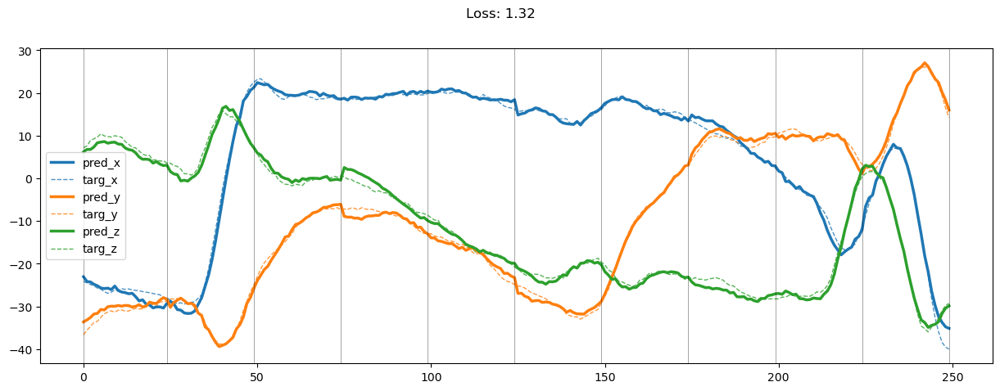

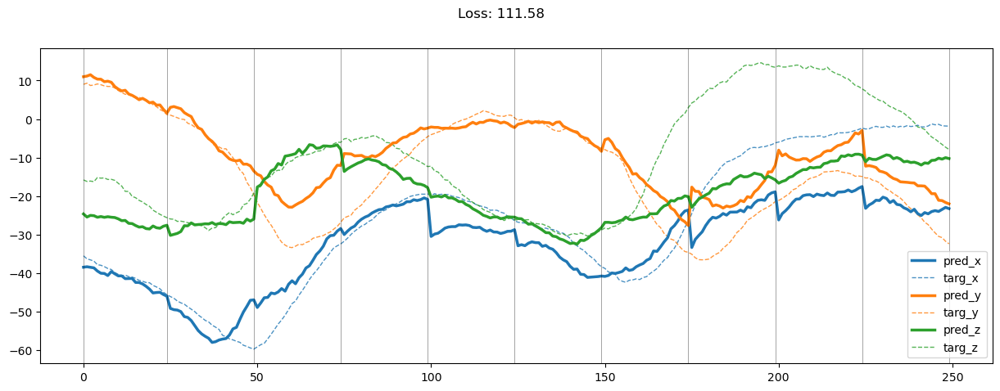

00799: train pred loss:  1.516, g loss:  12.982, diff loss:  2.996, d loss:  3.088
       valid pred loss:  168.134, g loss:  818.514, diff loss:  301.189, d loss:  3.114


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


00800: train pred loss:  1.551, g loss:  13.002, diff loss:  3.039, d loss:  3.143
       valid pred loss:  165.752, g loss:  803.644, diff loss:  293.413, d loss:  3.182


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


00801: train pred loss:  1.579, g loss:  12.908, diff loss:  3.062, d loss:  3.224
       valid pred loss:  169.982, g loss:  823.980, diff loss:  300.908, d loss:  3.275


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


00802: train pred loss:  1.612, g loss:  13.066, diff loss:  3.177, d loss:  3.326
       valid pred loss:  170.712, g loss:  831.124, diff loss:  306.426, d loss:  3.387


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00803: train pred loss:  1.638, g loss:  12.925, diff loss:  3.197, d loss:  3.447
       valid pred loss:  164.043, g loss:  800.562, diff loss:  295.673, d loss:  3.516


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00804: train pred loss:  1.771, g loss:  13.530, diff loss:  3.428, d loss:  3.582
       valid pred loss:  174.102, g loss:  843.816, diff loss:  309.277, d loss:  3.658


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


00805: train pred loss:  1.808, g loss:  13.694, diff loss:  3.540, d loss:  3.728
       valid pred loss:  177.331, g loss:  857.995, diff loss:  313.421, d loss:  3.808


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.14it/s]


00806: train pred loss:  1.820, g loss:  13.381, diff loss:  3.492, d loss:  3.880
       valid pred loss:  172.844, g loss:  832.528, diff loss:  302.322, d loss:  3.961


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.17it/s]


00807: train pred loss:  1.782, g loss:  13.125, diff loss:  3.472, d loss:  4.034
       valid pred loss:  178.937, g loss:  858.361, diff loss:  309.717, d loss:  4.116


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00808: train pred loss:  1.774, g loss:  13.171, diff loss:  3.535, d loss:  4.189
       valid pred loss:  172.444, g loss:  834.419, diff loss:  305.242, d loss:  4.270


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00809: train pred loss:  1.795, g loss:  13.118, diff loss:  3.548, d loss:  4.341
       valid pred loss:  177.974, g loss:  859.741, diff loss:  314.665, d loss:  4.418


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00810: train pred loss:  1.855, g loss:  13.332, diff loss:  3.631, d loss:  4.487
       valid pred loss:  183.057, g loss:  887.016, diff loss:  326.425, d loss:  4.563


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00811: train pred loss:  1.865, g loss:  13.153, diff loss:  3.593, d loss:  4.628
       valid pred loss:  176.107, g loss:  852.544, diff loss:  312.188, d loss:  4.700


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.76it/s]


00812: train pred loss:  1.795, g loss:  12.638, diff loss:  3.466, d loss:  4.761
       valid pred loss:  179.176, g loss:  886.068, diff loss:  336.555, d loss:  4.828


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00813: train pred loss:  1.796, g loss:  12.365, diff loss:  3.392, d loss:  4.886
       valid pred loss:  183.504, g loss:  895.416, diff loss:  332.278, d loss:  4.948


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.52it/s]


00814: train pred loss:  1.626, g loss:  11.512, diff loss:  3.179, d loss:  5.001
       valid pred loss:  174.959, g loss:  870.324, diff loss:  333.207, d loss:  5.057


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.26it/s]


00815: train pred loss:  1.625, g loss:  11.621, diff loss:  3.227, d loss:  5.106
       valid pred loss:  170.684, g loss:  845.784, diff loss:  320.675, d loss:  5.157


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.15it/s]


00816: train pred loss:  2.170, g loss:  15.327, diff loss:  4.290, d loss:  5.200
       valid pred loss:  176.861, g loss:  864.448, diff loss:  321.940, d loss:  5.246


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00817: train pred loss:  2.142, g loss:  14.878, diff loss:  4.158, d loss:  5.283
       valid pred loss:  168.397, g loss:  815.092, diff loss:  299.148, d loss:  5.323


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00818: train pred loss:  1.972, g loss:  13.690, diff loss:  3.824, d loss:  5.355
       valid pred loss:  168.363, g loss:  817.111, diff loss:  300.409, d loss:  5.387


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00819: train pred loss:  1.809, g loss:  12.780, diff loss:  3.580, d loss:  5.414
       valid pred loss:  165.502, g loss:  826.834, diff loss:  290.319, d loss:  5.440


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00820: train pred loss:  1.787, g loss:  12.515, diff loss:  3.502, d loss:  5.461
       valid pred loss:  171.232, g loss:  831.161, diff loss:  305.207, d loss:  5.481


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00821: train pred loss:  1.736, g loss:  12.367, diff loss:  3.472, d loss:  5.495
       valid pred loss:  163.432, g loss:  803.723, diff loss:  300.992, d loss:  5.508


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00822: train pred loss:  1.708, g loss:  11.977, diff loss:  3.353, d loss:  5.516
       valid pred loss:  161.671, g loss:  819.845, diff loss:  292.723, d loss:  5.522


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00823: train pred loss:  1.678, g loss:  11.664, diff loss:  3.259, d loss:  5.523
       valid pred loss:  163.506, g loss:  797.625, diff loss:  296.456, d loss:  5.521


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00824: train pred loss:  1.715, g loss:  11.980, diff loss:  3.352, d loss:  5.516
       valid pred loss:  170.622, g loss:  831.431, diff loss:  308.379, d loss:  5.507


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00825: train pred loss:  1.625, g loss:  11.288, diff loss:  3.150, d loss:  5.496
       valid pred loss:  166.122, g loss:  814.568, diff loss:  304.390, d loss:  5.480


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00826: train pred loss:  1.578, g loss:  10.967, diff loss:  3.056, d loss:  5.461
       valid pred loss:  174.293, g loss:  848.681, diff loss:  314.854, d loss:  5.438


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.89it/s]


00827: train pred loss:  1.540, g loss:  10.919, diff loss:  3.049, d loss:  5.412
       valid pred loss:  167.020, g loss:  816.655, diff loss:  305.489, d loss:  5.382


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 13.98it/s]


00828: train pred loss:  1.597, g loss:  11.260, diff loss:  3.139, d loss:  5.350
       valid pred loss:  172.025, g loss:  826.944, diff loss:  300.027, d loss:  5.313


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00829: train pred loss:  1.683, g loss:  11.629, diff loss:  3.226, d loss:  5.274
       valid pred loss:  173.867, g loss:  841.591, diff loss:  309.213, d loss:  5.230


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00830: train pred loss:  1.611, g loss:  11.303, diff loss:  3.134, d loss:  5.185
       valid pred loss:  165.662, g loss:  809.314, diff loss:  301.235, d loss:  5.133


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00831: train pred loss:  1.556, g loss:  11.006, diff loss:  3.043, d loss:  5.084
       valid pred loss:  168.763, g loss:  820.785, diff loss:  304.194, d loss:  5.027


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00832: train pred loss:  1.648, g loss:  11.671, diff loss:  3.221, d loss:  4.972
       valid pred loss:  169.636, g loss:  825.986, diff loss:  305.787, d loss:  4.908


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00833: train pred loss:  1.531, g loss:  10.885, diff loss:  2.982, d loss:  4.850
       valid pred loss:  168.400, g loss:  827.632, diff loss:  311.415, d loss:  4.782


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00834: train pred loss:  1.562, g loss:  11.170, diff loss:  3.048, d loss:  4.719
       valid pred loss:  163.961, g loss:  802.026, diff loss:  299.766, d loss:  4.647


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00835: train pred loss:  1.518, g loss:  10.994, diff loss:  2.981, d loss:  4.581
       valid pred loss:  167.235, g loss:  819.778, diff loss:  306.994, d loss:  4.505


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00836: train pred loss:  1.512, g loss:  11.019, diff loss:  2.964, d loss:  4.437
       valid pred loss:  167.673, g loss:  817.162, diff loss:  302.089, d loss:  4.360


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00837: train pred loss:  1.519, g loss:  11.129, diff loss:  2.965, d loss:  4.290
       valid pred loss:  166.276, g loss:  808.822, diff loss:  297.998, d loss:  4.211


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00838: train pred loss:  1.551, g loss:  11.559, diff loss:  3.059, d loss:  4.141
       valid pred loss:  167.941, g loss:  816.822, diff loss:  301.908, d loss:  4.061


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


00839: train pred loss:  1.611, g loss:  11.832, diff loss:  3.085, d loss:  3.992
       valid pred loss:  171.332, g loss:  836.122, diff loss:  309.910, d loss:  3.914


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.22it/s]


00840: train pred loss:  1.545, g loss:  11.567, diff loss:  2.966, d loss:  3.845
       valid pred loss:  163.621, g loss:  800.526, diff loss:  296.856, d loss:  3.769


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.27it/s]


00841: train pred loss:  1.486, g loss:  11.661, diff loss:  2.958, d loss:  3.703
       valid pred loss:  166.746, g loss:  807.153, diff loss:  294.644, d loss:  3.630


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00842: train pred loss:  1.491, g loss:  11.801, diff loss:  2.938, d loss:  3.567
       valid pred loss:  167.795, g loss:  812.357, diff loss:  296.324, d loss:  3.498


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.10it/s]


00843: train pred loss:  1.509, g loss:  12.092, diff loss:  2.958, d loss:  3.440
       valid pred loss:  164.917, g loss:  810.313, diff loss:  302.808, d loss:  3.377


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.90it/s]


00844: train pred loss:  1.561, g loss:  12.868, diff loss:  3.127, d loss:  3.324
       valid pred loss:  166.866, g loss:  805.305, diff loss:  291.985, d loss:  3.267


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00845: train pred loss:  1.598, g loss:  13.164, diff loss:  3.140, d loss:  3.222
       valid pred loss:  170.935, g loss:  836.452, diff loss:  310.780, d loss:  3.173


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00846: train pred loss:  1.770, g loss:  14.427, diff loss:  3.435, d loss:  3.136
       valid pred loss:  172.535, g loss:  847.783, diff loss:  317.757, d loss:  3.096


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00847: train pred loss:  1.687, g loss:  14.153, diff loss:  3.312, d loss:  3.067
       valid pred loss:  180.066, g loss:  869.004, diff loss:  316.146, d loss:  3.039


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00848: train pred loss:  1.769, g loss:  14.791, diff loss:  3.452, d loss:  3.019
       valid pred loss:  177.973, g loss:  870.216, diff loss:  319.923, d loss:  3.002


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


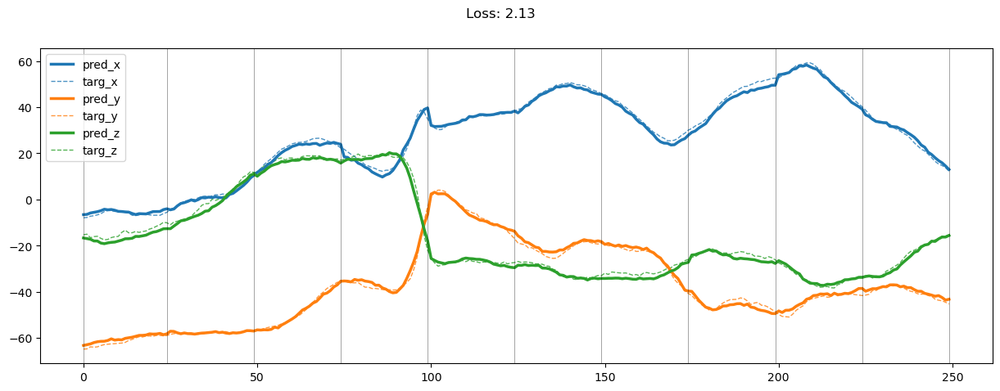

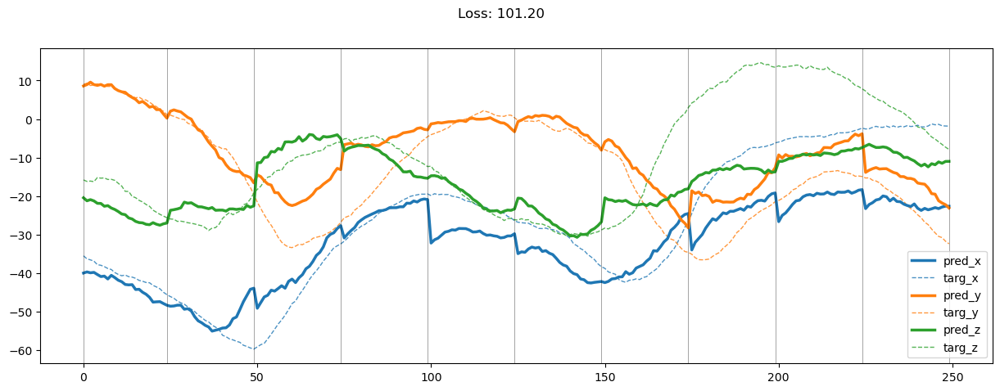

00849: train pred loss:  2.017, g loss:  16.569, diff loss:  3.937, d loss:  2.993
       valid pred loss:  176.438, g loss:  851.627, diff loss:  307.767, d loss:  2.989


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


00850: train pred loss:  1.988, g loss:  16.324, diff loss:  3.863, d loss:  2.991
       valid pred loss:  172.893, g loss:  838.424, diff loss:  304.405, d loss:  2.998


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.97it/s]


00851: train pred loss:  1.894, g loss:  15.488, diff loss:  3.637, d loss:  3.013
       valid pred loss:  175.020, g loss:  843.675, diff loss:  303.293, d loss:  3.034


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00852: train pred loss:  1.798, g loss:  14.659, diff loss:  3.436, d loss:  3.060
       valid pred loss:  170.401, g loss:  836.439, diff loss:  310.655, d loss:  3.092


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00853: train pred loss:  1.694, g loss:  14.034, diff loss:  3.324, d loss:  3.130
       valid pred loss:  173.411, g loss:  842.269, diff loss:  308.266, d loss:  3.175


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00854: train pred loss:  1.617, g loss:  13.157, diff loss:  3.130, d loss:  3.221
       valid pred loss:  167.736, g loss:  826.182, diff loss:  309.441, d loss:  3.276


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00855: train pred loss:  1.545, g loss:  12.583, diff loss:  3.042, d loss:  3.332
       valid pred loss:  180.156, g loss:  872.980, diff loss:  319.250, d loss:  3.397


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00856: train pred loss:  1.526, g loss:  12.036, diff loss:  2.944, d loss:  3.457
       valid pred loss:  167.205, g loss:  806.299, diff loss:  291.621, d loss:  3.529


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00857: train pred loss:  1.464, g loss:  11.532, diff loss:  2.872, d loss:  3.595
       valid pred loss:  172.483, g loss:  844.071, diff loss:  314.266, d loss:  3.672


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00858: train pred loss:  1.444, g loss:  11.174, diff loss:  2.827, d loss:  3.741
       valid pred loss:  174.234, g loss:  847.548, diff loss:  312.465, d loss:  3.820


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.60it/s]


00859: train pred loss:  1.416, g loss:  10.823, diff loss:  2.779, d loss:  3.891
       valid pred loss:  169.390, g loss:  823.602, diff loss:  303.538, d loss:  3.972


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.14it/s]


00860: train pred loss:  1.435, g loss:  10.871, diff loss:  2.840, d loss:  4.044
       valid pred loss:  175.738, g loss:  852.298, diff loss:  311.955, d loss:  4.124


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00861: train pred loss:  1.527, g loss:  11.325, diff loss:  3.004, d loss:  4.195
       valid pred loss:  169.115, g loss:  825.888, diff loss:  306.868, d loss:  4.274


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00862: train pred loss:  1.543, g loss:  11.327, diff loss:  3.036, d loss:  4.344
       valid pred loss:  169.282, g loss:  826.223, diff loss:  306.294, d loss:  4.421


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00863: train pred loss:  1.536, g loss:  11.172, diff loss:  3.017, d loss:  4.488
       valid pred loss:  175.765, g loss:  849.572, diff loss:  309.924, d loss:  4.563


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00864: train pred loss:  1.505, g loss:  10.899, diff loss:  2.962, d loss:  4.627
       valid pred loss:  171.838, g loss:  838.361, diff loss:  310.542, d loss:  4.698


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00865: train pred loss:  1.514, g loss:  10.803, diff loss:  2.948, d loss:  4.759
       valid pred loss:  167.971, g loss:  845.705, diff loss:  298.726, d loss:  4.827


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


00866: train pred loss:  1.461, g loss:  10.382, diff loss:  2.843, d loss:  4.884
       valid pred loss:  182.640, g loss:  884.154, diff loss:  324.295, d loss:  4.947


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00867: train pred loss:  1.479, g loss:  10.544, diff loss:  2.905, d loss:  5.001
       valid pred loss:  171.855, g loss:  838.328, diff loss:  310.731, d loss:  5.059


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00868: train pred loss:  1.480, g loss:  10.557, diff loss:  2.921, d loss:  5.109
       valid pred loss:  172.791, g loss:  845.121, diff loss:  314.846, d loss:  5.163


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00869: train pred loss:  1.426, g loss:  10.102, diff loss:  2.797, d loss:  5.208
       valid pred loss:  168.321, g loss:  828.592, diff loss:  311.658, d loss:  5.258


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.28it/s]


00870: train pred loss:  1.417, g loss:  10.072, diff loss:  2.798, d loss:  5.298
       valid pred loss:  165.265, g loss:  837.112, diff loss:  299.020, d loss:  5.342


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.28it/s]


00871: train pred loss:  1.452, g loss:  10.149, diff loss:  2.819, d loss:  5.378
       valid pred loss:  171.780, g loss:  843.494, diff loss:  316.387, d loss:  5.417


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00872: train pred loss:  1.455, g loss:  10.287, diff loss:  2.869, d loss:  5.449
       valid pred loss:  170.517, g loss:  827.320, diff loss:  304.180, d loss:  5.483


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00873: train pred loss:  1.416, g loss:  9.994, diff loss:  2.789, d loss:  5.509
       valid pred loss:  169.542, g loss:  821.513, diff loss:  300.698, d loss:  5.537


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


00874: train pred loss:  1.420, g loss:  9.856, diff loss:  2.745, d loss:  5.559
       valid pred loss:  173.009, g loss:  837.072, diff loss:  306.050, d loss:  5.581


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.07it/s]


00875: train pred loss:  1.492, g loss:  10.347, diff loss:  2.888, d loss:  5.597
       valid pred loss:  172.610, g loss:  835.496, diff loss:  305.962, d loss:  5.613


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00876: train pred loss:  1.527, g loss:  10.685, diff loss:  2.990, d loss:  5.625
       valid pred loss:  168.201, g loss:  829.148, diff loss:  312.776, d loss:  5.636


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


00877: train pred loss:  1.442, g loss:  10.142, diff loss:  2.838, d loss:  5.642
       valid pred loss:  178.455, g loss:  872.042, diff loss:  325.344, d loss:  5.646


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00878: train pred loss:  1.434, g loss:  10.127, diff loss:  2.837, d loss:  5.647
       valid pred loss:  172.513, g loss:  839.480, diff loss:  309.964, d loss:  5.645


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00879: train pred loss:  1.420, g loss:  9.989, diff loss:  2.795, d loss:  5.640
       valid pred loss:  169.453, g loss:  831.168, diff loss:  311.083, d loss:  5.634


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00880: train pred loss:  1.445, g loss:  10.109, diff loss:  2.825, d loss:  5.622
       valid pred loss:  169.911, g loss:  839.900, diff loss:  318.026, d loss:  5.609


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00881: train pred loss:  1.440, g loss:  10.085, diff loss:  2.817, d loss:  5.592
       valid pred loss:  176.282, g loss:  852.187, diff loss:  311.823, d loss:  5.573


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00882: train pred loss:  1.436, g loss:  9.987, diff loss:  2.783, d loss:  5.551
       valid pred loss:  165.067, g loss:  809.807, diff loss:  303.436, d loss:  5.524


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00883: train pred loss:  1.374, g loss:  9.780, diff loss:  2.731, d loss:  5.497
       valid pred loss:  168.191, g loss:  825.028, diff loss:  309.056, d loss:  5.465


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00884: train pred loss:  1.399, g loss:  9.820, diff loss:  2.731, d loss:  5.433
       valid pred loss:  171.595, g loss:  840.707, diff loss:  313.914, d loss:  5.395


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00885: train pred loss:  1.424, g loss:  10.059, diff loss:  2.797, d loss:  5.357
       valid pred loss:  167.766, g loss:  827.595, diff loss:  313.171, d loss:  5.313


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00886: train pred loss:  1.401, g loss:  9.931, diff loss:  2.754, d loss:  5.271
       valid pred loss:  172.576, g loss:  836.575, diff loss:  307.096, d loss:  5.222


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00887: train pred loss:  1.481, g loss:  10.562, diff loss:  2.929, d loss:  5.176
       valid pred loss:  168.155, g loss:  812.191, diff loss:  295.509, d loss:  5.121


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


00888: train pred loss:  1.431, g loss:  10.097, diff loss:  2.780, d loss:  5.070
       valid pred loss:  168.615, g loss:  831.955, diff loss:  313.837, d loss:  5.012


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00889: train pred loss:  1.466, g loss:  10.411, diff loss:  2.860, d loss:  4.957
       valid pred loss:  163.810, g loss:  800.867, diff loss:  296.429, d loss:  4.895


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00890: train pred loss:  1.537, g loss:  11.154, diff loss:  3.068, d loss:  4.837
       valid pred loss:  168.849, g loss:  825.301, diff loss:  306.194, d loss:  4.771


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00891: train pred loss:  1.489, g loss:  10.823, diff loss:  2.955, d loss:  4.710
       valid pred loss:  163.126, g loss:  801.945, diff loss:  300.546, d loss:  4.640


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.54it/s]


00892: train pred loss:  1.528, g loss:  11.048, diff loss:  2.995, d loss:  4.578
       valid pred loss:  176.127, g loss:  856.927, diff loss:  315.976, d loss:  4.507


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.35it/s]


00893: train pred loss:  1.581, g loss:  11.517, diff loss:  3.108, d loss:  4.442
       valid pred loss:  167.270, g loss:  837.460, diff loss:  293.731, d loss:  4.369


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.89it/s]


00894: train pred loss:  1.608, g loss:  11.578, diff loss:  3.089, d loss:  4.304
       valid pred loss:  166.048, g loss:  813.250, diff loss:  301.927, d loss:  4.231


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.19it/s]


00895: train pred loss:  1.477, g loss:  10.992, diff loss:  2.902, d loss:  4.166
       valid pred loss:  172.066, g loss:  835.136, diff loss:  305.768, d loss:  4.092


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00896: train pred loss:  1.464, g loss:  11.017, diff loss:  2.873, d loss:  4.027
       valid pred loss:  164.414, g loss:  806.370, diff loss:  299.375, d loss:  3.955


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00897: train pred loss:  1.412, g loss:  10.920, diff loss:  2.812, d loss:  3.890
       valid pred loss:  171.635, g loss:  839.829, diff loss:  311.300, d loss:  3.819


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00898: train pred loss:  1.388, g loss:  10.906, diff loss:  2.763, d loss:  3.757
       valid pred loss:  168.816, g loss:  830.571, diff loss:  309.251, d loss:  3.689


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


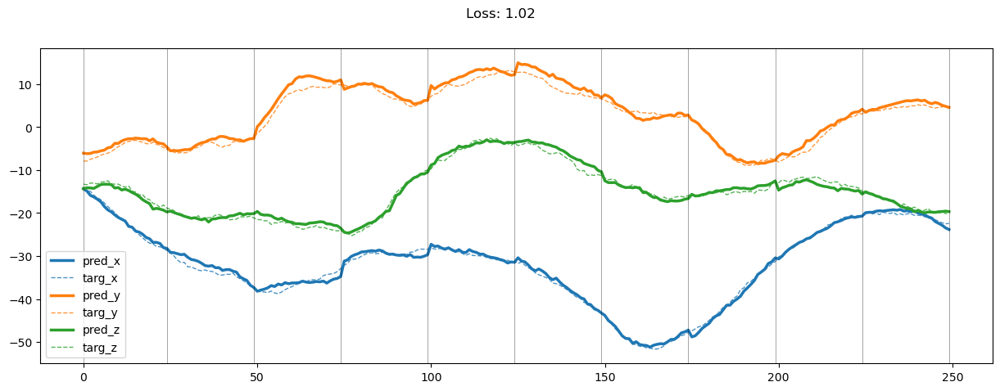

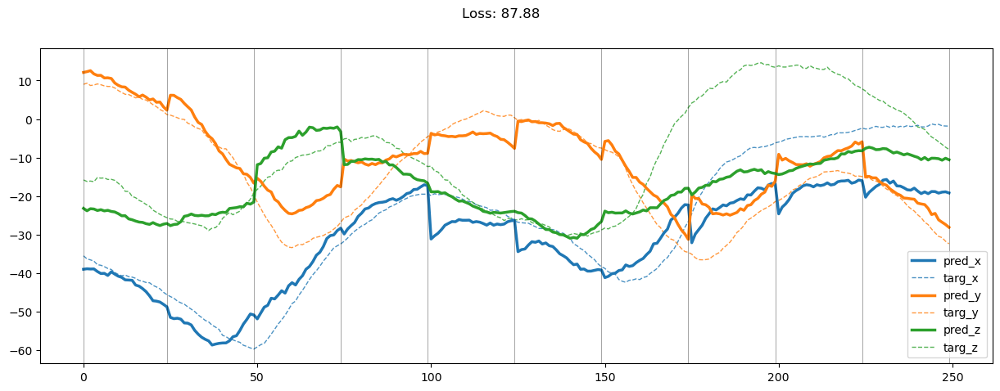

00899: train pred loss:  1.422, g loss:  11.197, diff loss:  2.791, d loss:  3.629
       valid pred loss:  162.034, g loss:  793.087, diff loss:  293.106, d loss:  3.563


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.68it/s]


00900: train pred loss:  1.381, g loss:  11.177, diff loss:  2.735, d loss:  3.507
       valid pred loss:  169.534, g loss:  829.447, diff loss:  305.737, d loss:  3.446


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.21it/s]


00901: train pred loss:  1.393, g loss:  11.441, diff loss:  2.752, d loss:  3.394
       valid pred loss:  166.815, g loss:  815.567, diff loss:  301.152, d loss:  3.337


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.06it/s]


00902: train pred loss:  1.365, g loss:  11.348, diff loss:  2.662, d loss:  3.291
       valid pred loss:  165.557, g loss:  816.755, diff loss:  305.493, d loss:  3.240


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


00903: train pred loss:  1.386, g loss:  11.871, diff loss:  2.762, d loss:  3.199
       valid pred loss:  169.801, g loss:  830.609, diff loss:  306.355, d loss:  3.155


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.13it/s]


00904: train pred loss:  1.364, g loss:  11.807, diff loss:  2.684, d loss:  3.121
       valid pred loss:  171.904, g loss:  837.274, diff loss:  306.522, d loss:  3.085


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.49it/s]


00905: train pred loss:  1.393, g loss:  12.207, diff loss:  2.752, d loss:  3.058
       valid pred loss:  171.027, g loss:  834.673, diff loss:  305.773, d loss:  3.030


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.15it/s]


00906: train pred loss:  1.403, g loss:  12.263, diff loss:  2.723, d loss:  3.011
       valid pred loss:  172.195, g loss:  838.961, diff loss:  307.558, d loss:  2.993


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.68it/s]


00907: train pred loss:  1.350, g loss:  11.977, diff loss:  2.616, d loss:  2.981
       valid pred loss:  164.245, g loss:  813.540, diff loss:  305.812, d loss:  2.973


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00908: train pred loss:  1.372, g loss:  12.102, diff loss:  2.640, d loss:  2.970
       valid pred loss:  174.493, g loss:  851.389, diff loss:  314.212, d loss:  2.971


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00909: train pred loss:  1.383, g loss:  12.314, diff loss:  2.715, d loss:  2.979
       valid pred loss:  171.443, g loss:  838.242, diff loss:  309.978, d loss:  2.991


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00910: train pred loss:  1.366, g loss:  12.105, diff loss:  2.679, d loss:  3.007
       valid pred loss:  168.117, g loss:  826.952, diff loss:  309.032, d loss:  3.029


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00911: train pred loss:  1.379, g loss:  11.977, diff loss:  2.677, d loss:  3.055
       valid pred loss:  170.500, g loss:  825.319, diff loss:  299.754, d loss:  3.087


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.23it/s]


00912: train pred loss:  1.443, g loss:  12.320, diff loss:  2.828, d loss:  3.120
       valid pred loss:  172.044, g loss:  831.690, diff loss:  302.033, d loss:  3.162


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00913: train pred loss:  1.470, g loss:  12.326, diff loss:  2.888, d loss:  3.203
       valid pred loss:  163.609, g loss:  797.406, diff loss:  292.513, d loss:  3.253


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.22it/s]


00914: train pred loss:  1.509, g loss:  12.343, diff loss:  2.953, d loss:  3.300
       valid pred loss:  161.570, g loss:  791.289, diff loss:  293.337, d loss:  3.357


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00915: train pred loss:  1.511, g loss:  12.135, diff loss:  2.954, d loss:  3.410
       valid pred loss:  167.281, g loss:  811.703, diff loss:  297.043, d loss:  3.472


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00916: train pred loss:  1.571, g loss:  12.391, diff loss:  3.088, d loss:  3.530
       valid pred loss:  163.865, g loss:  822.812, diff loss:  288.846, d loss:  3.596


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00917: train pred loss:  1.546, g loss:  12.048, diff loss:  3.046, d loss:  3.657
       valid pred loss:  160.774, g loss:  816.056, diff loss:  290.226, d loss:  3.726


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00918: train pred loss:  1.711, g loss:  12.642, diff loss:  3.247, d loss:  3.789
       valid pred loss:  164.865, g loss:  829.776, diff loss:  291.309, d loss:  3.859


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00919: train pred loss:  1.579, g loss:  11.699, diff loss:  3.027, d loss:  3.923
       valid pred loss:  164.698, g loss:  825.083, diff loss:  293.743, d loss:  3.994


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00920: train pred loss:  1.484, g loss:  10.949, diff loss:  2.854, d loss:  4.058
       valid pred loss:  168.158, g loss:  841.192, diff loss:  296.647, d loss:  4.129


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.09it/s]


00921: train pred loss:  1.421, g loss:  10.310, diff loss:  2.700, d loss:  4.191
       valid pred loss:  162.218, g loss:  822.328, diff loss:  294.548, d loss:  4.261


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.22it/s]


00922: train pred loss:  1.365, g loss:  10.157, diff loss:  2.700, d loss:  4.323
       valid pred loss:  165.115, g loss:  832.857, diff loss:  293.490, d loss:  4.392


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00923: train pred loss:  1.339, g loss:  9.801, diff loss:  2.619, d loss:  4.451
       valid pred loss:  165.077, g loss:  807.795, diff loss:  300.714, d loss:  4.517


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00924: train pred loss:  1.311, g loss:  9.528, diff loss:  2.560, d loss:  4.574
       valid pred loss:  162.437, g loss:  835.023, diff loss:  301.613, d loss:  4.639


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.31it/s]


00925: train pred loss:  1.324, g loss:  9.542, diff loss:  2.581, d loss:  4.693
       valid pred loss:  166.606, g loss:  817.973, diff loss:  305.915, d loss:  4.754


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


00926: train pred loss:  1.393, g loss:  9.986, diff loss:  2.723, d loss:  4.806
       valid pred loss:  164.196, g loss:  798.397, diff loss:  294.009, d loss:  4.864


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00927: train pred loss:  1.436, g loss:  10.288, diff loss:  2.823, d loss:  4.913
       valid pred loss:  166.865, g loss:  809.814, diff loss:  296.658, d loss:  4.967


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


00928: train pred loss:  1.523, g loss:  10.890, diff loss:  3.008, d loss:  5.014
       valid pred loss:  160.078, g loss:  787.306, diff loss:  295.090, d loss:  5.066


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.67it/s]


00929: train pred loss:  1.543, g loss:  10.753, diff loss:  2.965, d loss:  5.108
       valid pred loss:  163.760, g loss:  803.259, diff loss:  299.792, d loss:  5.155


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00930: train pred loss:  1.434, g loss:  10.226, diff loss:  2.834, d loss:  5.195
       valid pred loss:  177.183, g loss:  854.798, diff loss:  311.851, d loss:  5.239


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00931: train pred loss:  1.381, g loss:  9.727, diff loss:  2.693, d loss:  5.275
       valid pred loss:  169.711, g loss:  816.314, diff loss:  295.289, d loss:  5.315


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00932: train pred loss:  1.271, g loss:  8.946, diff loss:  2.510, d loss:  5.348
       valid pred loss:  168.834, g loss:  823.198, diff loss:  305.257, d loss:  5.384


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00933: train pred loss:  1.332, g loss:  9.348, diff loss:  2.595, d loss:  5.413
       valid pred loss:  169.782, g loss:  857.027, diff loss:  300.405, d loss:  5.445


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00934: train pred loss:  1.345, g loss:  9.501, diff loss:  2.646, d loss:  5.471
       valid pred loss:  164.198, g loss:  812.720, diff loss:  307.638, d loss:  5.499


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00935: train pred loss:  1.444, g loss:  10.015, diff loss:  2.788, d loss:  5.521
       valid pred loss:  172.940, g loss:  838.181, diff loss:  306.942, d loss:  5.544


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00936: train pred loss:  1.435, g loss:  10.050, diff loss:  2.805, d loss:  5.563
       valid pred loss:  164.790, g loss:  805.373, diff loss:  299.155, d loss:  5.582


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00937: train pred loss:  1.512, g loss:  10.513, diff loss:  2.936, d loss:  5.597
       valid pred loss:  170.075, g loss:  824.961, diff loss:  302.592, d loss:  5.613


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00938: train pred loss:  1.521, g loss:  10.557, diff loss:  2.949, d loss:  5.622
       valid pred loss:  164.772, g loss:  796.406, diff loss:  289.843, d loss:  5.633


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.29it/s]


00939: train pred loss:  1.507, g loss:  10.569, diff loss:  2.959, d loss:  5.640
       valid pred loss:  164.250, g loss:  802.047, diff loss:  297.523, d loss:  5.645


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


00940: train pred loss:  1.441, g loss:  10.135, diff loss:  2.837, d loss:  5.649
       valid pred loss:  173.642, g loss:  841.062, diff loss:  308.363, d loss:  5.650


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00941: train pred loss:  1.401, g loss:  9.831, diff loss:  2.749, d loss:  5.649
       valid pred loss:  173.056, g loss:  839.448, diff loss:  307.466, d loss:  5.646


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00942: train pred loss:  1.382, g loss:  9.652, diff loss:  2.695, d loss:  5.640
       valid pred loss:  167.162, g loss:  807.361, diff loss:  293.897, d loss:  5.633


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


00943: train pred loss:  1.418, g loss:  9.960, diff loss:  2.785, d loss:  5.623
       valid pred loss:  166.596, g loss:  811.264, diff loss:  299.482, d loss:  5.611


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.31it/s]


00944: train pred loss:  1.482, g loss:  10.273, diff loss:  2.866, d loss:  5.598
       valid pred loss:  169.127, g loss:  816.001, diff loss:  296.558, d loss:  5.581


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.32it/s]


00945: train pred loss:  1.489, g loss:  10.227, diff loss:  2.846, d loss:  5.564
       valid pred loss:  170.012, g loss:  824.548, diff loss:  303.654, d loss:  5.543


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


00946: train pred loss:  1.431, g loss:  10.036, diff loss:  2.799, d loss:  5.521
       valid pred loss:  173.619, g loss:  832.948, diff loss:  300.383, d loss:  5.494


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00947: train pred loss:  1.342, g loss:  9.408, diff loss:  2.616, d loss:  5.470
       valid pred loss:  161.348, g loss:  787.820, diff loss:  292.529, d loss:  5.440


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


00948: train pred loss:  1.371, g loss:  9.730, diff loss:  2.709, d loss:  5.411
       valid pred loss:  169.414, g loss:  824.531, diff loss:  304.732, d loss:  5.377


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


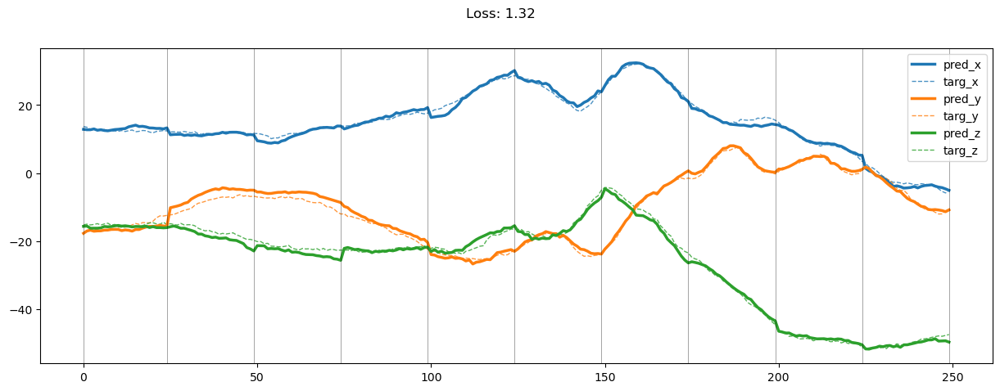

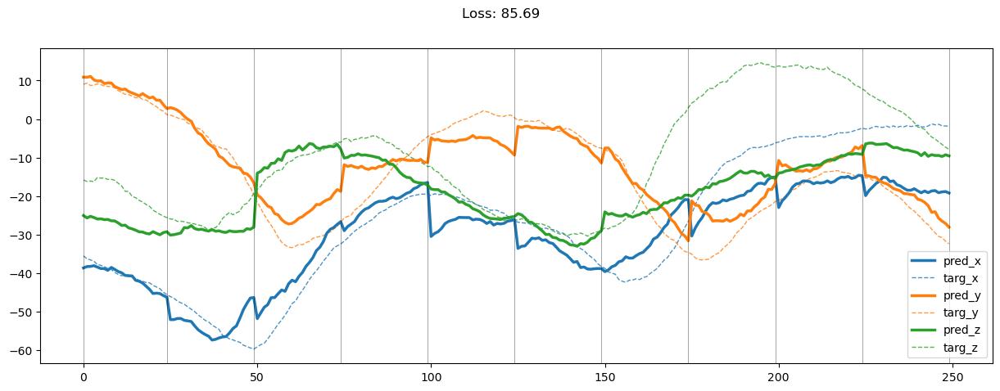

00949: train pred loss:  1.378, g loss:  9.664, diff loss:  2.679, d loss:  5.344
       valid pred loss:  169.321, g loss:  822.727, diff loss:  302.716, d loss:  5.306


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.10it/s]


00950: train pred loss:  1.358, g loss:  9.601, diff loss:  2.658, d loss:  5.269
       valid pred loss:  166.859, g loss:  806.883, diff loss:  293.702, d loss:  5.227


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.59it/s]


00951: train pred loss:  1.356, g loss:  9.564, diff loss:  2.639, d loss:  5.188
       valid pred loss:  164.327, g loss:  796.889, diff loss:  292.115, d loss:  5.143


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00952: train pred loss:  1.368, g loss:  9.698, diff loss:  2.671, d loss:  5.100
       valid pred loss:  167.848, g loss:  819.327, diff loss:  304.103, d loss:  5.052


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00953: train pred loss:  1.338, g loss:  9.457, diff loss:  2.590, d loss:  5.007
       valid pred loss:  165.157, g loss:  800.462, diff loss:  294.013, d loss:  4.955


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00954: train pred loss:  1.287, g loss:  9.279, diff loss:  2.536, d loss:  4.908
       valid pred loss:  163.010, g loss:  787.904, diff loss:  287.214, d loss:  4.853


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.23it/s]


00955: train pred loss:  1.265, g loss:  9.098, diff loss:  2.469, d loss:  4.804
       valid pred loss:  166.244, g loss:  801.274, diff loss:  290.576, d loss:  4.748


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00956: train pred loss:  1.260, g loss:  9.238, diff loss:  2.501, d loss:  4.696
       valid pred loss:  166.266, g loss:  803.945, diff loss:  292.506, d loss:  4.638


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00957: train pred loss:  1.295, g loss:  9.444, diff loss:  2.539, d loss:  4.585
       valid pred loss:  167.383, g loss:  811.629, diff loss:  297.341, d loss:  4.525


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00958: train pred loss:  1.284, g loss:  9.321, diff loss:  2.481, d loss:  4.472
       valid pred loss:  170.101, g loss:  822.090, diff loss:  298.958, d loss:  4.410


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00959: train pred loss:  1.328, g loss:  9.770, diff loss:  2.592, d loss:  4.357
       valid pred loss:  169.673, g loss:  815.293, diff loss:  293.230, d loss:  4.296


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00960: train pred loss:  1.352, g loss:  10.019, diff loss:  2.639, d loss:  4.241
       valid pred loss:  169.327, g loss:  822.700, diff loss:  301.858, d loss:  4.179


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00961: train pred loss:  1.355, g loss:  10.114, diff loss:  2.639, d loss:  4.125
       valid pred loss:  166.292, g loss:  826.811, diff loss:  283.915, d loss:  4.065


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00962: train pred loss:  1.366, g loss:  10.294, diff loss:  2.660, d loss:  4.011
       valid pred loss:  168.728, g loss:  815.286, diff loss:  296.118, d loss:  3.952


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


00963: train pred loss:  1.315, g loss:  10.176, diff loss:  2.599, d loss:  3.898
       valid pred loss:  160.819, g loss:  811.252, diff loss:  285.554, d loss:  3.839


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00964: train pred loss:  1.288, g loss:  10.048, diff loss:  2.523, d loss:  3.788
       valid pred loss:  163.249, g loss:  791.793, diff loss:  289.889, d loss:  3.732


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00965: train pred loss:  1.307, g loss:  10.361, diff loss:  2.575, d loss:  3.682
       valid pred loss:  163.434, g loss:  798.117, diff loss:  295.398, d loss:  3.628


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.30it/s]


00966: train pred loss:  1.281, g loss:  10.278, diff loss:  2.507, d loss:  3.580
       valid pred loss:  163.084, g loss:  820.388, diff loss:  286.308, d loss:  3.529


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


00967: train pred loss:  1.349, g loss:  10.795, diff loss:  2.605, d loss:  3.484
       valid pred loss:  167.833, g loss:  811.680, diff loss:  295.292, d loss:  3.435


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


00968: train pred loss:  1.440, g loss:  11.687, diff loss:  2.818, d loss:  3.394
       valid pred loss:  167.977, g loss:  813.570, diff loss:  296.038, d loss:  3.348


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00969: train pred loss:  1.482, g loss:  12.193, diff loss:  2.919, d loss:  3.311
       valid pred loss:  171.155, g loss:  851.416, diff loss:  293.760, d loss:  3.270


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


00970: train pred loss:  1.538, g loss:  12.659, diff loss:  3.003, d loss:  3.237
       valid pred loss:  164.200, g loss:  821.746, diff loss:  284.601, d loss:  3.201


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00971: train pred loss:  1.418, g loss:  11.914, diff loss:  2.744, d loss:  3.172
       valid pred loss:  170.196, g loss:  821.160, diff loss:  297.748, d loss:  3.142


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00972: train pred loss:  1.445, g loss:  12.175, diff loss:  2.777, d loss:  3.118
       valid pred loss:  168.288, g loss:  810.826, diff loss:  292.113, d loss:  3.092


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00973: train pred loss:  1.389, g loss:  12.105, diff loss:  2.734, d loss:  3.074
       valid pred loss:  169.258, g loss:  815.708, diff loss:  293.184, d loss:  3.055


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00974: train pred loss:  1.389, g loss:  12.068, diff loss:  2.692, d loss:  3.042
       valid pred loss:  160.118, g loss:  783.971, diff loss:  288.994, d loss:  3.029


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00975: train pred loss:  1.352, g loss:  11.828, diff loss:  2.605, d loss:  3.022
       valid pred loss:  164.972, g loss:  797.020, diff loss:  287.441, d loss:  3.016


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00976: train pred loss:  1.308, g loss:  11.686, diff loss:  2.565, d loss:  3.014
       valid pred loss:  166.618, g loss:  802.631, diff loss:  288.662, d loss:  3.015


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00977: train pred loss:  1.303, g loss:  11.614, diff loss:  2.548, d loss:  3.020
       valid pred loss:  173.340, g loss:  841.064, diff loss:  306.940, d loss:  3.027


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00978: train pred loss:  1.238, g loss:  11.246, diff loss:  2.465, d loss:  3.038
       valid pred loss:  163.497, g loss:  792.861, diff loss:  288.719, d loss:  3.052


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00979: train pred loss:  1.312, g loss:  11.687, diff loss:  2.616, d loss:  3.069
       valid pred loss:  164.436, g loss:  799.352, diff loss:  291.944, d loss:  3.089


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00980: train pred loss:  1.443, g loss:  12.094, diff loss:  2.746, d loss:  3.113
       valid pred loss:  170.390, g loss:  828.633, diff loss:  304.384, d loss:  3.140


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00981: train pred loss:  1.438, g loss:  12.001, diff loss:  2.763, d loss:  3.168
       valid pred loss:  166.066, g loss:  807.488, diff loss:  296.018, d loss:  3.202


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00982: train pred loss:  1.454, g loss:  12.030, diff loss:  2.819, d loss:  3.234
       valid pred loss:  163.887, g loss:  792.180, diff loss:  286.508, d loss:  3.272


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00983: train pred loss:  1.439, g loss:  11.864, diff loss:  2.822, d loss:  3.310
       valid pred loss:  167.294, g loss:  809.256, diff loss:  294.752, d loss:  3.352


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00984: train pred loss:  1.382, g loss:  11.265, diff loss:  2.696, d loss:  3.393
       valid pred loss:  164.090, g loss:  786.573, diff loss:  281.765, d loss:  3.441


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00985: train pred loss:  1.362, g loss:  10.948, diff loss:  2.651, d loss:  3.484
       valid pred loss:  164.482, g loss:  799.117, diff loss:  292.275, d loss:  3.534


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


00986: train pred loss:  1.341, g loss:  10.630, diff loss:  2.604, d loss:  3.580
       valid pred loss:  164.389, g loss:  793.131, diff loss:  286.669, d loss:  3.632


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


00987: train pred loss:  1.343, g loss:  10.443, diff loss:  2.589, d loss:  3.680
       valid pred loss:  172.499, g loss:  836.344, diff loss:  304.994, d loss:  3.734


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00988: train pred loss:  1.274, g loss:  9.948, diff loss:  2.492, d loss:  3.782
       valid pred loss:  169.414, g loss:  814.136, diff loss:  292.241, d loss:  3.836


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


00989: train pred loss:  1.222, g loss:  9.487, diff loss:  2.396, d loss:  3.887
       valid pred loss:  167.615, g loss:  810.284, diff loss:  293.766, d loss:  3.943


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00990: train pred loss:  1.276, g loss:  9.764, diff loss:  2.507, d loss:  3.992
       valid pred loss:  172.257, g loss:  834.237, diff loss:  304.205, d loss:  4.047


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00991: train pred loss:  1.326, g loss:  10.121, diff loss:  2.642, d loss:  4.096
       valid pred loss:  162.347, g loss:  782.005, diff loss:  281.829, d loss:  4.151


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00992: train pred loss:  1.290, g loss:  9.638, diff loss:  2.522, d loss:  4.200
       valid pred loss:  169.167, g loss:  837.654, diff loss:  289.793, d loss:  4.254


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00993: train pred loss:  1.327, g loss:  9.847, diff loss:  2.605, d loss:  4.301
       valid pred loss:  164.463, g loss:  820.268, diff loss:  285.640, d loss:  4.354


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


00994: train pred loss:  1.272, g loss:  9.346, diff loss:  2.478, d loss:  4.400
       valid pred loss:  162.087, g loss:  816.698, diff loss:  286.114, d loss:  4.451


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


00995: train pred loss:  1.249, g loss:  9.217, diff loss:  2.463, d loss:  4.496
       valid pred loss:  173.260, g loss:  829.551, diff loss:  297.821, d loss:  4.546


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


00996: train pred loss:  1.300, g loss:  9.340, diff loss:  2.504, d loss:  4.589
       valid pred loss:  165.751, g loss:  825.521, diff loss:  286.108, d loss:  4.638


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


00997: train pred loss:  1.251, g loss:  9.129, diff loss:  2.465, d loss:  4.679
       valid pred loss:  171.243, g loss:  823.730, diff loss:  296.993, d loss:  4.725


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.62it/s]


00998: train pred loss:  1.216, g loss:  8.663, diff loss:  2.360, d loss:  4.764
       valid pred loss:  170.210, g loss:  825.093, diff loss:  301.916, d loss:  4.808


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


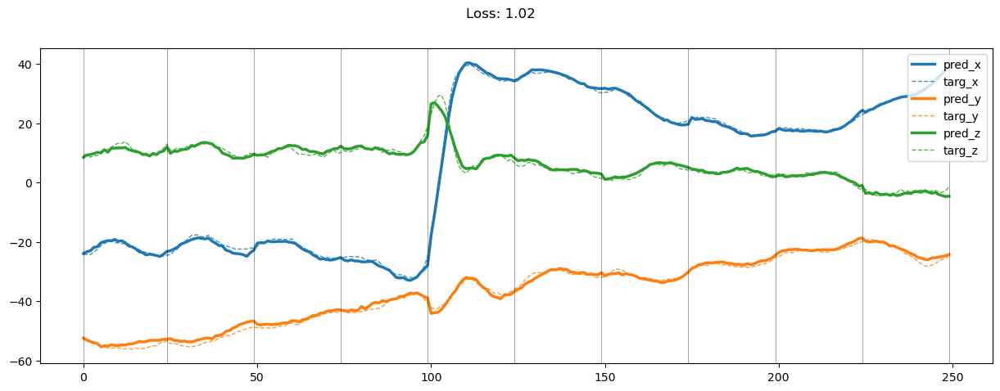

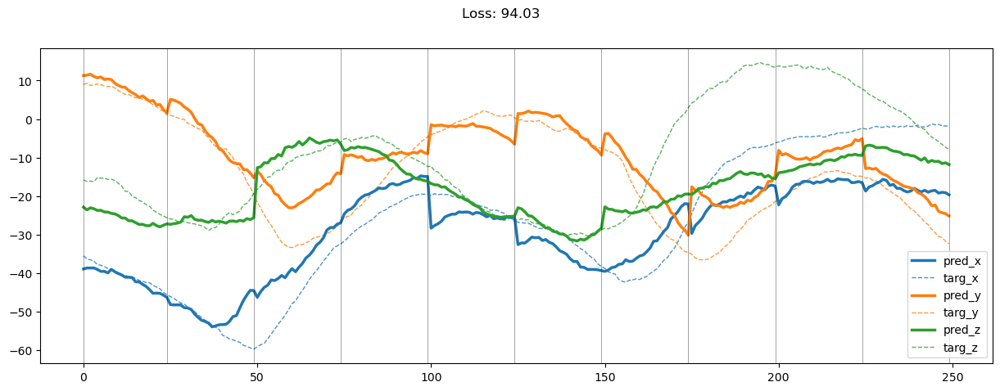

00999: train pred loss:  1.169, g loss:  8.407, diff loss:  2.276, d loss:  4.845
       valid pred loss:  166.398, g loss:  831.503, diff loss:  289.183, d loss:  4.888


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01000: train pred loss:  1.157, g loss:  8.326, diff loss:  2.264, d loss:  4.923
       valid pred loss:  169.587, g loss:  812.816, diff loss:  291.703, d loss:  4.963


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01001: train pred loss:  1.234, g loss:  8.829, diff loss:  2.415, d loss:  4.995
       valid pred loss:  163.320, g loss:  806.121, diff loss:  277.129, d loss:  5.032


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.24it/s]


01002: train pred loss:  1.199, g loss:  8.618, diff loss:  2.364, d loss:  5.064
       valid pred loss:  162.788, g loss:  815.645, diff loss:  284.237, d loss:  5.098


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.77it/s]


01003: train pred loss:  1.182, g loss:  8.483, diff loss:  2.331, d loss:  5.127
       valid pred loss:  164.708, g loss:  817.163, diff loss:  283.586, d loss:  5.159


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.86it/s]


01004: train pred loss:  1.180, g loss:  8.350, diff loss:  2.327, d loss:  5.186
       valid pred loss:  170.394, g loss:  838.792, diff loss:  287.967, d loss:  5.214


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01005: train pred loss:  1.222, g loss:  8.523, diff loss:  2.342, d loss:  5.240
       valid pred loss:  165.191, g loss:  821.024, diff loss:  285.457, d loss:  5.267


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01006: train pred loss:  1.205, g loss:  8.744, diff loss:  2.426, d loss:  5.289
       valid pred loss:  165.142, g loss:  822.172, diff loss:  285.414, d loss:  5.312


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.26it/s]


01007: train pred loss:  1.222, g loss:  8.675, diff loss:  2.401, d loss:  5.332
       valid pred loss:  169.740, g loss:  815.252, diff loss:  294.509, d loss:  5.354


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01008: train pred loss:  1.227, g loss:  8.722, diff loss:  2.418, d loss:  5.371
       valid pred loss:  161.127, g loss:  803.355, diff loss:  280.146, d loss:  5.390


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.19it/s]


01009: train pred loss:  1.276, g loss:  9.182, diff loss:  2.557, d loss:  5.404
       valid pred loss:  166.115, g loss:  797.480, diff loss:  287.722, d loss:  5.420


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.56it/s]


01010: train pred loss:  1.286, g loss:  9.040, diff loss:  2.509, d loss:  5.433
       valid pred loss:  168.365, g loss:  844.961, diff loss:  294.653, d loss:  5.445


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.53it/s]


01011: train pred loss:  1.266, g loss:  8.927, diff loss:  2.480, d loss:  5.455
       valid pred loss:  173.336, g loss:  829.601, diff loss:  297.401, d loss:  5.465


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.53it/s]


01012: train pred loss:  1.203, g loss:  8.535, diff loss:  2.371, d loss:  5.473
       valid pred loss:  170.221, g loss:  816.131, diff loss:  293.302, d loss:  5.480


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.55it/s]


01013: train pred loss:  1.177, g loss:  8.409, diff loss:  2.339, d loss:  5.485
       valid pred loss:  164.525, g loss:  797.988, diff loss:  291.422, d loss:  5.489


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.54it/s]


01014: train pred loss:  1.172, g loss:  8.296, diff loss:  2.303, d loss:  5.491
       valid pred loss:  158.880, g loss:  777.884, diff loss:  288.678, d loss:  5.493


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


01015: train pred loss:  1.208, g loss:  8.465, diff loss:  2.347, d loss:  5.492
       valid pred loss:  168.774, g loss:  811.619, diff loss:  293.585, d loss:  5.490


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.55it/s]


01016: train pred loss:  1.220, g loss:  8.476, diff loss:  2.347, d loss:  5.488
       valid pred loss:  173.690, g loss:  835.249, diff loss:  302.537, d loss:  5.483


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01017: train pred loss:  1.239, g loss:  8.690, diff loss:  2.411, d loss:  5.477
       valid pred loss:  165.838, g loss:  806.458, diff loss:  296.707, d loss:  5.471


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.54it/s]


01018: train pred loss:  1.253, g loss:  8.752, diff loss:  2.426, d loss:  5.462
       valid pred loss:  168.871, g loss:  817.442, diff loss:  297.601, d loss:  5.451


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.55it/s]


01019: train pred loss:  1.297, g loss:  8.978, diff loss:  2.485, d loss:  5.441
       valid pred loss:  165.398, g loss:  796.944, diff loss:  286.707, d loss:  5.428


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.04it/s]


01020: train pred loss:  1.261, g loss:  8.894, diff loss:  2.467, d loss:  5.414
       valid pred loss:  168.810, g loss:  814.909, diff loss:  295.375, d loss:  5.398


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01021: train pred loss:  1.264, g loss:  8.884, diff loss:  2.460, d loss:  5.382
       valid pred loss:  167.371, g loss:  809.578, diff loss:  294.501, d loss:  5.364


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01022: train pred loss:  1.234, g loss:  8.666, diff loss:  2.395, d loss:  5.345
       valid pred loss:  165.205, g loss:  798.230, diff loss:  290.986, d loss:  5.323


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01023: train pred loss:  1.187, g loss:  8.083, diff loss:  2.259, d loss:  5.303
       valid pred loss:  161.781, g loss:  784.248, diff loss:  286.224, d loss:  5.279


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.10it/s]


01024: train pred loss:  1.146, g loss:  8.160, diff loss:  2.247, d loss:  5.256
       valid pred loss:  169.233, g loss:  815.196, diff loss:  294.400, d loss:  5.229


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01025: train pred loss:  1.170, g loss:  8.086, diff loss:  2.290, d loss:  5.205
       valid pred loss:  168.357, g loss:  818.362, diff loss:  300.366, d loss:  5.175


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01026: train pred loss:  1.295, g loss:  9.218, diff loss:  2.540, d loss:  5.148
       valid pred loss:  169.056, g loss:  820.561, diff loss:  300.271, d loss:  5.117


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01027: train pred loss:  1.297, g loss:  9.226, diff loss:  2.536, d loss:  5.087
       valid pred loss:  169.995, g loss:  832.510, diff loss:  310.184, d loss:  5.054


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01028: train pred loss:  1.364, g loss:  9.653, diff loss:  2.649, d loss:  5.023
       valid pred loss:  166.849, g loss:  832.448, diff loss:  289.202, d loss:  4.987


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


01029: train pred loss:  1.294, g loss:  9.333, diff loss:  2.558, d loss:  4.955
       valid pred loss:  159.191, g loss:  779.790, diff loss:  288.883, d loss:  4.918


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.87it/s]


01030: train pred loss:  1.308, g loss:  9.264, diff loss:  2.521, d loss:  4.884
       valid pred loss:  160.879, g loss:  784.922, diff loss:  289.171, d loss:  4.846


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01031: train pred loss:  1.269, g loss:  9.039, diff loss:  2.449, d loss:  4.810
       valid pred loss:  159.582, g loss:  810.168, diff loss:  284.951, d loss:  4.771


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01032: train pred loss:  1.214, g loss:  8.677, diff loss:  2.372, d loss:  4.733
       valid pred loss:  159.477, g loss:  809.091, diff loss:  286.268, d loss:  4.693


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01033: train pred loss:  1.176, g loss:  8.633, diff loss:  2.321, d loss:  4.655
       valid pred loss:  158.987, g loss:  802.421, diff loss:  283.457, d loss:  4.613


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01034: train pred loss:  1.214, g loss:  8.811, diff loss:  2.354, d loss:  4.574
       valid pred loss:  167.779, g loss:  812.378, diff loss:  295.834, d loss:  4.531


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01035: train pred loss:  1.214, g loss:  8.866, diff loss:  2.356, d loss:  4.492
       valid pred loss:  166.140, g loss:  834.225, diff loss:  290.487, d loss:  4.449


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01036: train pred loss:  1.204, g loss:  8.904, diff loss:  2.355, d loss:  4.409
       valid pred loss:  159.844, g loss:  783.043, diff loss:  288.715, d loss:  4.365


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01037: train pred loss:  1.228, g loss:  9.202, diff loss:  2.428, d loss:  4.325
       valid pred loss:  166.160, g loss:  840.749, diff loss:  295.716, d loss:  4.280


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.78it/s]


01038: train pred loss:  1.248, g loss:  9.356, diff loss:  2.453, d loss:  4.242
       valid pred loss:  164.380, g loss:  827.456, diff loss:  289.360, d loss:  4.197


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.81it/s]


01039: train pred loss:  1.196, g loss:  9.060, diff loss:  2.349, d loss:  4.158
       valid pred loss:  174.984, g loss:  846.519, diff loss:  307.304, d loss:  4.113


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01040: train pred loss:  1.153, g loss:  8.858, diff loss:  2.272, d loss:  4.075
       valid pred loss:  169.299, g loss:  849.903, diff loss:  296.514, d loss:  4.032


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


01041: train pred loss:  1.149, g loss:  8.871, diff loss:  2.288, d loss:  3.993
       valid pred loss:  164.464, g loss:  805.008, diff loss:  297.893, d loss:  3.950


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


01042: train pred loss:  1.204, g loss:  9.215, diff loss:  2.360, d loss:  3.912
       valid pred loss:  170.673, g loss:  823.731, diff loss:  298.208, d loss:  3.870


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.85it/s]


01043: train pred loss:  1.218, g loss:  9.397, diff loss:  2.347, d loss:  3.833
       valid pred loss:  162.648, g loss:  826.105, diff loss:  291.714, d loss:  3.792


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01044: train pred loss:  1.184, g loss:  9.401, diff loss:  2.329, d loss:  3.757
       valid pred loss:  164.940, g loss:  837.499, diff loss:  295.231, d loss:  3.717


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.89it/s]


01045: train pred loss:  1.162, g loss:  9.335, diff loss:  2.282, d loss:  3.683
       valid pred loss:  167.273, g loss:  813.282, diff loss:  297.211, d loss:  3.645


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.14it/s]


01046: train pred loss:  1.143, g loss:  9.095, diff loss:  2.205, d loss:  3.613
       valid pred loss:  164.825, g loss:  805.283, diff loss:  296.796, d loss:  3.577


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01047: train pred loss:  1.135, g loss:  9.241, diff loss:  2.226, d loss:  3.546
       valid pred loss:  172.121, g loss:  837.113, diff loss:  306.619, d loss:  3.512


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01048: train pred loss:  1.087, g loss:  8.942, diff loss:  2.146, d loss:  3.482
       valid pred loss:  163.039, g loss:  817.356, diff loss:  285.020, d loss:  3.450


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


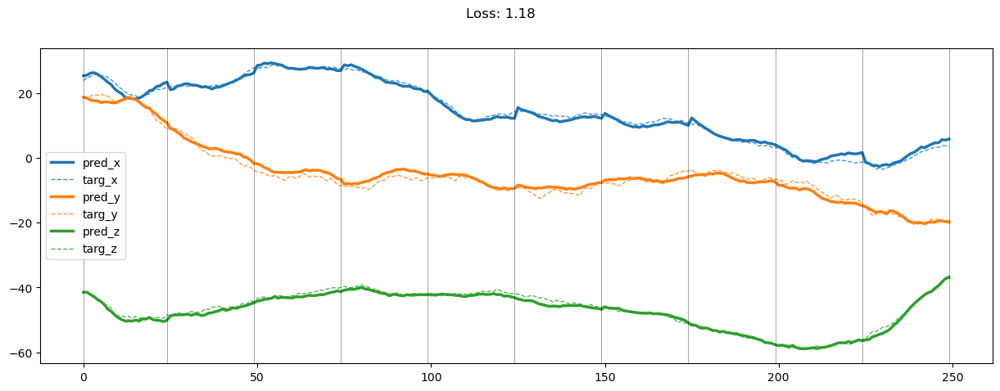

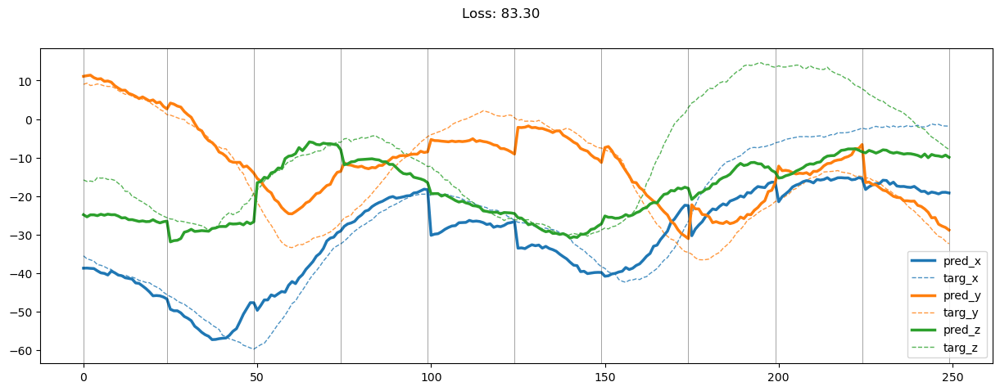

01049: train pred loss:  1.100, g loss:  9.153, diff loss:  2.184, d loss:  3.423
       valid pred loss:  160.349, g loss:  813.861, diff loss:  289.354, d loss:  3.395


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.25it/s]


01050: train pred loss:  1.079, g loss:  8.910, diff loss:  2.096, d loss:  3.369
       valid pred loss:  167.140, g loss:  804.357, diff loss:  289.269, d loss:  3.342


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01051: train pred loss:  1.072, g loss:  9.102, diff loss:  2.100, d loss:  3.321
       valid pred loss:  161.691, g loss:  793.815, diff loss:  294.487, d loss:  3.297


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01052: train pred loss:  1.102, g loss:  9.545, diff loss:  2.178, d loss:  3.277
       valid pred loss:  164.532, g loss:  800.822, diff loss:  292.683, d loss:  3.257


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


01053: train pred loss:  1.153, g loss:  9.991, diff loss:  2.243, d loss:  3.240
       valid pred loss:  160.322, g loss:  806.520, diff loss:  283.304, d loss:  3.222


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01054: train pred loss:  1.268, g loss:  10.806, diff loss:  2.452, d loss:  3.208
       valid pred loss:  158.104, g loss:  808.741, diff loss:  287.814, d loss:  3.194


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.26it/s]


01055: train pred loss:  1.261, g loss:  10.881, diff loss:  2.460, d loss:  3.183
       valid pred loss:  161.577, g loss:  793.425, diff loss:  294.226, d loss:  3.173


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.19it/s]


01056: train pred loss:  1.273, g loss:  11.092, diff loss:  2.512, d loss:  3.165
       valid pred loss:  160.146, g loss:  785.269, diff loss:  290.587, d loss:  3.159


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01057: train pred loss:  1.279, g loss:  11.099, diff loss:  2.502, d loss:  3.154
       valid pred loss:  166.418, g loss:  819.006, diff loss:  305.011, d loss:  3.151


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


01058: train pred loss:  1.237, g loss:  10.860, diff loss:  2.433, d loss:  3.149
       valid pred loss:  157.748, g loss:  797.583, diff loss:  279.366, d loss:  3.150


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.09it/s]


01059: train pred loss:  1.190, g loss:  10.308, diff loss:  2.307, d loss:  3.152
       valid pred loss:  157.979, g loss:  809.447, diff loss:  286.823, d loss:  3.156


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.99it/s]


01060: train pred loss:  1.171, g loss:  10.200, diff loss:  2.245, d loss:  3.161
       valid pred loss:  162.596, g loss:  819.694, diff loss:  285.947, d loss:  3.170


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.19it/s]


01061: train pred loss:  1.148, g loss:  9.989, diff loss:  2.232, d loss:  3.178
       valid pred loss:  161.369, g loss:  811.340, diff loss:  282.745, d loss:  3.189


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01062: train pred loss:  1.184, g loss:  10.400, diff loss:  2.339, d loss:  3.201
       valid pred loss:  161.555, g loss:  816.394, diff loss:  286.248, d loss:  3.216


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


01063: train pred loss:  1.220, g loss:  10.568, diff loss:  2.405, d loss:  3.230
       valid pred loss:  159.343, g loss:  798.880, diff loss:  278.927, d loss:  3.248


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.98it/s]


01064: train pred loss:  1.326, g loss:  11.135, diff loss:  2.585, d loss:  3.266
       valid pred loss:  172.136, g loss:  840.429, diff loss:  309.550, d loss:  3.287


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.28it/s]


01065: train pred loss:  1.308, g loss:  10.964, diff loss:  2.563, d loss:  3.306
       valid pred loss:  163.747, g loss:  811.535, diff loss:  304.782, d loss:  3.330


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.00it/s]


01066: train pred loss:  1.333, g loss:  11.051, diff loss:  2.614, d loss:  3.352
       valid pred loss:  170.708, g loss:  834.947, diff loss:  308.196, d loss:  3.380


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


01067: train pred loss:  1.284, g loss:  10.643, diff loss:  2.527, d loss:  3.403
       valid pred loss:  157.890, g loss:  785.785, diff loss:  297.021, d loss:  3.431


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.21it/s]


01068: train pred loss:  1.216, g loss:  10.205, diff loss:  2.437, d loss:  3.458
       valid pred loss:  165.477, g loss:  812.339, diff loss:  301.477, d loss:  3.487


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


01069: train pred loss:  1.196, g loss:  9.774, diff loss:  2.333, d loss:  3.516
       valid pred loss:  164.942, g loss:  828.039, diff loss:  288.751, d loss:  3.547


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


01070: train pred loss:  1.217, g loss:  9.802, diff loss:  2.367, d loss:  3.577
       valid pred loss:  164.347, g loss:  825.614, diff loss:  288.638, d loss:  3.610


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


01071: train pred loss:  1.209, g loss:  9.681, diff loss:  2.361, d loss:  3.640
       valid pred loss:  165.939, g loss:  838.394, diff loss:  295.538, d loss:  3.675


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.35it/s]


01072: train pred loss:  1.221, g loss:  9.797, diff loss:  2.426, d loss:  3.706
       valid pred loss:  162.325, g loss:  814.989, diff loss:  285.260, d loss:  3.742


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


01073: train pred loss:  1.220, g loss:  9.572, diff loss:  2.380, d loss:  3.773
       valid pred loss:  164.435, g loss:  829.277, diff loss:  290.919, d loss:  3.808


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.98it/s]


01074: train pred loss:  1.156, g loss:  8.946, diff loss:  2.254, d loss:  3.840
       valid pred loss:  165.968, g loss:  830.463, diff loss:  289.821, d loss:  3.876


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


01075: train pred loss:  1.092, g loss:  8.340, diff loss:  2.149, d loss:  3.909
       valid pred loss:  161.412, g loss:  813.385, diff loss:  286.872, d loss:  3.945


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


01076: train pred loss:  1.088, g loss:  8.254, diff loss:  2.131, d loss:  3.976
       valid pred loss:  162.733, g loss:  817.921, diff loss:  286.315, d loss:  4.012


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.99it/s]


01077: train pred loss:  1.072, g loss:  8.129, diff loss:  2.109, d loss:  4.044
       valid pred loss:  168.119, g loss:  842.288, diff loss:  292.599, d loss:  4.080


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


01078: train pred loss:  1.079, g loss:  8.131, diff loss:  2.065, d loss:  4.112
       valid pred loss:  162.656, g loss:  819.289, diff loss:  287.648, d loss:  4.147


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


01079: train pred loss:  1.086, g loss:  8.002, diff loss:  2.150, d loss:  4.178
       valid pred loss:  158.722, g loss:  808.137, diff loss:  287.586, d loss:  4.213


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01080: train pred loss:  1.144, g loss:  8.653, diff loss:  2.253, d loss:  4.244
       valid pred loss:  166.199, g loss:  832.142, diff loss:  289.656, d loss:  4.277


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01081: train pred loss:  1.201, g loss:  8.950, diff loss:  2.349, d loss:  4.308
       valid pred loss:  163.661, g loss:  828.693, diff loss:  292.476, d loss:  4.340


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01082: train pred loss:  1.182, g loss:  8.751, diff loss:  2.340, d loss:  4.370
       valid pred loss:  162.680, g loss:  815.032, diff loss:  285.101, d loss:  4.404


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


01083: train pred loss:  1.235, g loss:  9.087, diff loss:  2.411, d loss:  4.431
       valid pred loss:  163.535, g loss:  834.070, diff loss:  293.999, d loss:  4.463


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01084: train pred loss:  1.282, g loss:  9.197, diff loss:  2.444, d loss:  4.490
       valid pred loss:  157.673, g loss:  802.924, diff loss:  286.614, d loss:  4.519


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


01085: train pred loss:  1.204, g loss:  8.626, diff loss:  2.290, d loss:  4.546
       valid pred loss:  159.360, g loss:  812.873, diff loss:  288.590, d loss:  4.575


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.27it/s]


01086: train pred loss:  1.153, g loss:  8.466, diff loss:  2.263, d loss:  4.601
       valid pred loss:  164.526, g loss:  822.191, diff loss:  286.879, d loss:  4.628


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01087: train pred loss:  1.148, g loss:  8.391, diff loss:  2.284, d loss:  4.653
       valid pred loss:  160.637, g loss:  801.631, diff loss:  280.388, d loss:  4.679


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01088: train pred loss:  1.185, g loss:  8.488, diff loss:  2.309, d loss:  4.703
       valid pred loss:  160.271, g loss:  811.213, diff loss:  285.633, d loss:  4.728


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


01089: train pred loss:  1.182, g loss:  8.444, diff loss:  2.307, d loss:  4.750
       valid pred loss:  164.430, g loss:  815.545, diff loss:  283.819, d loss:  4.775


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01090: train pred loss:  1.166, g loss:  8.599, diff loss:  2.334, d loss:  4.795
       valid pred loss:  165.700, g loss:  824.571, diff loss:  285.488, d loss:  4.818


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01091: train pred loss:  1.207, g loss:  8.656, diff loss:  2.346, d loss:  4.837
       valid pred loss:  166.822, g loss:  835.601, diff loss:  291.593, d loss:  4.859


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01092: train pred loss:  1.208, g loss:  8.662, diff loss:  2.353, d loss:  4.877
       valid pred loss:  166.902, g loss:  807.900, diff loss:  294.207, d loss:  4.896


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


01093: train pred loss:  1.183, g loss:  8.453, diff loss:  2.296, d loss:  4.914
       valid pred loss:  168.151, g loss:  821.515, diff loss:  303.657, d loss:  4.933


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01094: train pred loss:  1.259, g loss:  8.994, diff loss:  2.455, d loss:  4.948
       valid pred loss:  158.448, g loss:  783.757, diff loss:  296.364, d loss:  4.965


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.19it/s]


01095: train pred loss:  1.306, g loss:  9.366, diff loss:  2.567, d loss:  4.979
       valid pred loss:  161.843, g loss:  823.090, diff loss:  290.864, d loss:  4.995


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01096: train pred loss:  1.234, g loss:  8.851, diff loss:  2.423, d loss:  5.008
       valid pred loss:  164.701, g loss:  805.910, diff loss:  298.409, d loss:  5.022


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01097: train pred loss:  1.209, g loss:  8.628, diff loss:  2.360, d loss:  5.033
       valid pred loss:  164.168, g loss:  805.168, diff loss:  298.844, d loss:  5.046


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01098: train pred loss:  1.222, g loss:  8.617, diff loss:  2.354, d loss:  5.056
       valid pred loss:  161.708, g loss:  814.319, diff loss:  287.395, d loss:  5.067


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


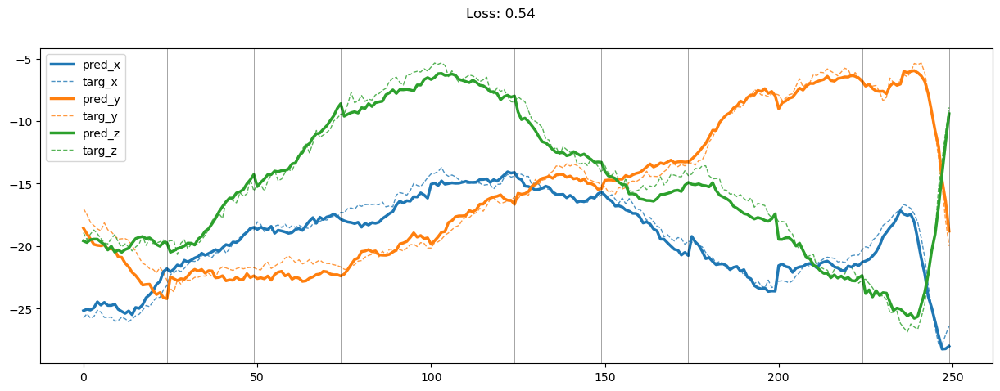

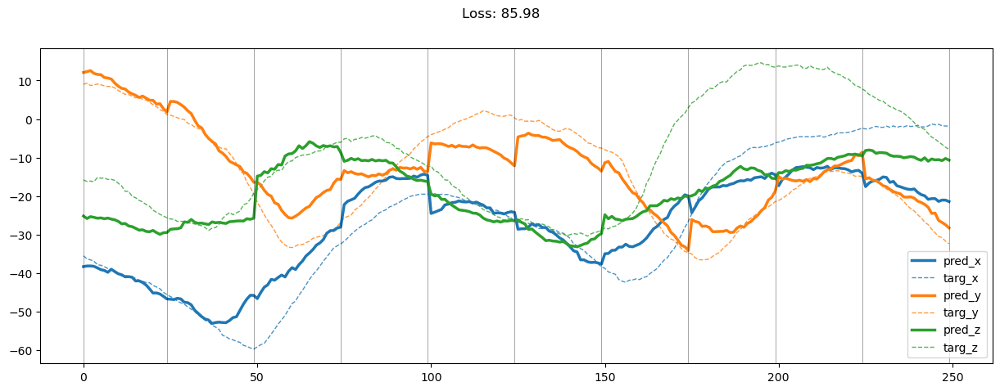

01099: train pred loss:  1.210, g loss:  8.591, diff loss:  2.352, d loss:  5.075
       valid pred loss:  167.833, g loss:  838.669, diff loss:  291.006, d loss:  5.084


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01100: train pred loss:  1.140, g loss:  8.185, diff loss:  2.242, d loss:  5.092
       valid pred loss:  163.735, g loss:  814.878, diff loss:  283.509, d loss:  5.100


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.35it/s]


01101: train pred loss:  1.143, g loss:  8.190, diff loss:  2.244, d loss:  5.105
       valid pred loss:  160.963, g loss:  805.400, diff loss:  283.646, d loss:  5.113


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01102: train pred loss:  1.119, g loss:  7.810, diff loss:  2.202, d loss:  5.116
       valid pred loss:  162.028, g loss:  808.395, diff loss:  282.427, d loss:  5.120


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01103: train pred loss:  1.130, g loss:  7.685, diff loss:  2.190, d loss:  5.123
       valid pred loss:  163.396, g loss:  811.663, diff loss:  281.727, d loss:  5.126


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01104: train pred loss:  1.105, g loss:  7.702, diff loss:  2.170, d loss:  5.127
       valid pred loss:  162.455, g loss:  784.433, diff loss:  285.835, d loss:  5.128


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.23it/s]


01105: train pred loss:  1.038, g loss:  6.914, diff loss:  2.038, d loss:  5.129
       valid pred loss:  155.364, g loss:  787.490, diff loss:  279.538, d loss:  5.129


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01106: train pred loss:  1.073, g loss:  7.330, diff loss:  2.096, d loss:  5.127
       valid pred loss:  163.666, g loss:  820.251, diff loss:  285.287, d loss:  5.126


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01107: train pred loss:  1.053, g loss:  6.925, diff loss:  2.014, d loss:  5.123
       valid pred loss:  157.995, g loss:  797.369, diff loss:  280.786, d loss:  5.118


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01108: train pred loss:  1.037, g loss:  7.044, diff loss:  2.047, d loss:  5.115
       valid pred loss:  163.445, g loss:  825.535, diff loss:  289.966, d loss:  5.109


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.26it/s]


01109: train pred loss:  1.085, g loss:  7.199, diff loss:  2.109, d loss:  5.104
       valid pred loss:  158.391, g loss:  802.805, diff loss:  284.529, d loss:  5.097


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


01110: train pred loss:  1.074, g loss:  7.337, diff loss:  2.091, d loss:  5.090
       valid pred loss:  163.242, g loss:  821.275, diff loss:  288.093, d loss:  5.082


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01111: train pred loss:  1.034, g loss:  7.009, diff loss:  2.024, d loss:  5.074
       valid pred loss:  162.876, g loss:  813.301, diff loss:  282.951, d loss:  5.064


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01112: train pred loss:  1.076, g loss:  7.540, diff loss:  2.117, d loss:  5.054
       valid pred loss:  169.845, g loss:  816.383, diff loss:  295.421, d loss:  5.043


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01113: train pred loss:  1.099, g loss:  7.635, diff loss:  2.135, d loss:  5.033
       valid pred loss:  165.889, g loss:  832.236, diff loss:  289.442, d loss:  5.021


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01114: train pred loss:  1.091, g loss:  7.587, diff loss:  2.118, d loss:  5.008
       valid pred loss:  165.850, g loss:  809.398, diff loss:  299.522, d loss:  4.995


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01115: train pred loss:  1.105, g loss:  7.879, diff loss:  2.175, d loss:  4.981
       valid pred loss:  167.620, g loss:  809.116, diff loss:  294.503, d loss:  4.965


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01116: train pred loss:  1.132, g loss:  7.729, diff loss:  2.149, d loss:  4.951
       valid pred loss:  169.377, g loss:  818.481, diff loss:  298.159, d loss:  4.935


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01117: train pred loss:  1.082, g loss:  7.435, diff loss:  2.171, d loss:  4.919
       valid pred loss:  163.480, g loss:  818.406, diff loss:  286.942, d loss:  4.902


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01118: train pred loss:  1.173, g loss:  8.517, diff loss:  2.317, d loss:  4.885
       valid pred loss:  161.300, g loss:  788.000, diff loss:  292.059, d loss:  4.867


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01119: train pred loss:  1.283, g loss:  9.264, diff loss:  2.524, d loss:  4.849
       valid pred loss:  159.989, g loss:  797.724, diff loss:  281.470, d loss:  4.829


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01120: train pred loss:  1.283, g loss:  9.146, diff loss:  2.480, d loss:  4.810
       valid pred loss:  166.938, g loss:  838.282, diff loss:  293.877, d loss:  4.789


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.07it/s]


01121: train pred loss:  1.160, g loss:  8.367, diff loss:  2.288, d loss:  4.770
       valid pred loss:  160.779, g loss:  816.490, diff loss:  291.497, d loss:  4.747


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01122: train pred loss:  1.115, g loss:  8.103, diff loss:  2.176, d loss:  4.727
       valid pred loss:  162.336, g loss:  821.454, diff loss:  291.043, d loss:  4.705


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.98it/s]


01123: train pred loss:  1.090, g loss:  7.752, diff loss:  2.134, d loss:  4.684
       valid pred loss:  161.532, g loss:  808.998, diff loss:  283.953, d loss:  4.660


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.37it/s]


01124: train pred loss:  1.055, g loss:  7.222, diff loss:  2.071, d loss:  4.639
       valid pred loss:  157.894, g loss:  796.868, diff loss:  282.832, d loss:  4.616


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01125: train pred loss:  1.041, g loss:  6.852, diff loss:  2.021, d loss:  4.592
       valid pred loss:  158.347, g loss:  799.808, diff loss:  283.915, d loss:  4.568


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01126: train pred loss:  1.011, g loss:  6.783, diff loss:  1.995, d loss:  4.545
       valid pred loss:  160.538, g loss:  807.762, diff loss:  285.913, d loss:  4.520


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01127: train pred loss:  1.029, g loss:  7.152, diff loss:  2.021, d loss:  4.497
       valid pred loss:  160.354, g loss:  805.563, diff loss:  284.450, d loss:  4.472


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.13it/s]


01128: train pred loss:  1.003, g loss:  6.729, diff loss:  1.988, d loss:  4.448
       valid pred loss:  159.047, g loss:  796.922, diff loss:  281.163, d loss:  4.423


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01129: train pred loss:  1.009, g loss:  6.470, diff loss:  1.953, d loss:  4.398
       valid pred loss:  163.813, g loss:  826.748, diff loss:  291.553, d loss:  4.372


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01130: train pred loss:  0.977, g loss:  6.358, diff loss:  1.927, d loss:  4.348
       valid pred loss:  163.720, g loss:  821.966, diff loss:  287.572, d loss:  4.320


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01131: train pred loss:  0.924, g loss:  5.681, diff loss:  1.831, d loss:  4.298
       valid pred loss:  160.322, g loss:  801.731, diff loss:  280.487, d loss:  4.272


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01132: train pred loss:  0.876, g loss:  5.116, diff loss:  1.739, d loss:  4.247
       valid pred loss:  160.706, g loss:  809.717, diff loss:  284.771, d loss:  4.222


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


01133: train pred loss:  0.850, g loss:  5.128, diff loss:  1.677, d loss:  4.197
       valid pred loss:  161.904, g loss:  817.537, diff loss:  287.972, d loss:  4.171


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01134: train pred loss:  0.839, g loss:  4.993, diff loss:  1.646, d loss:  4.147
       valid pred loss:  162.227, g loss:  812.566, diff loss:  284.097, d loss:  4.119


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01135: train pred loss:  0.820, g loss:  4.960, diff loss:  1.628, d loss:  4.096
       valid pred loss:  159.234, g loss:  800.550, diff loss:  280.891, d loss:  4.070


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01136: train pred loss:  0.817, g loss:  4.977, diff loss:  1.609, d loss:  4.047
       valid pred loss:  164.618, g loss:  795.229, diff loss:  289.093, d loss:  4.022


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


01137: train pred loss:  0.810, g loss:  4.987, diff loss:  1.594, d loss:  3.998
       valid pred loss:  163.825, g loss:  824.762, diff loss:  291.163, d loss:  3.973


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


01138: train pred loss:  0.825, g loss:  5.278, diff loss:  1.650, d loss:  3.950
       valid pred loss:  163.312, g loss:  823.468, diff loss:  290.824, d loss:  3.924


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01139: train pred loss:  0.849, g loss:  5.269, diff loss:  1.660, d loss:  3.903
       valid pred loss:  164.355, g loss:  830.722, diff loss:  294.359, d loss:  3.878


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01140: train pred loss:  0.848, g loss:  5.487, diff loss:  1.677, d loss:  3.856
       valid pred loss:  164.719, g loss:  832.133, diff loss:  293.449, d loss:  3.833


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01141: train pred loss:  0.831, g loss:  5.406, diff loss:  1.630, d loss:  3.811
       valid pred loss:  162.791, g loss:  824.928, diff loss:  291.577, d loss:  3.788


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.23it/s]


01142: train pred loss:  0.823, g loss:  5.328, diff loss:  1.639, d loss:  3.768
       valid pred loss:  165.105, g loss:  803.100, diff loss:  294.714, d loss:  3.745


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01143: train pred loss:  0.797, g loss:  5.240, diff loss:  1.576, d loss:  3.727
       valid pred loss:  162.656, g loss:  824.606, diff loss:  292.325, d loss:  3.706


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01144: train pred loss:  0.792, g loss:  5.268, diff loss:  1.565, d loss:  3.687
       valid pred loss:  159.548, g loss:  808.498, diff loss:  286.206, d loss:  3.667


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.85it/s]


01145: train pred loss:  0.804, g loss:  5.376, diff loss:  1.583, d loss:  3.649
       valid pred loss:  160.567, g loss:  815.561, diff loss:  288.070, d loss:  3.630


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.31it/s]


01146: train pred loss:  0.787, g loss:  5.344, diff loss:  1.552, d loss:  3.613
       valid pred loss:  162.633, g loss:  799.069, diff loss:  297.953, d loss:  3.595


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.89it/s]


01147: train pred loss:  0.787, g loss:  5.414, diff loss:  1.572, d loss:  3.581
       valid pred loss:  164.036, g loss:  802.868, diff loss:  297.188, d loss:  3.562


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01148: train pred loss:  0.806, g loss:  5.664, diff loss:  1.593, d loss:  3.549
       valid pred loss:  163.222, g loss:  826.138, diff loss:  291.430, d loss:  3.533


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


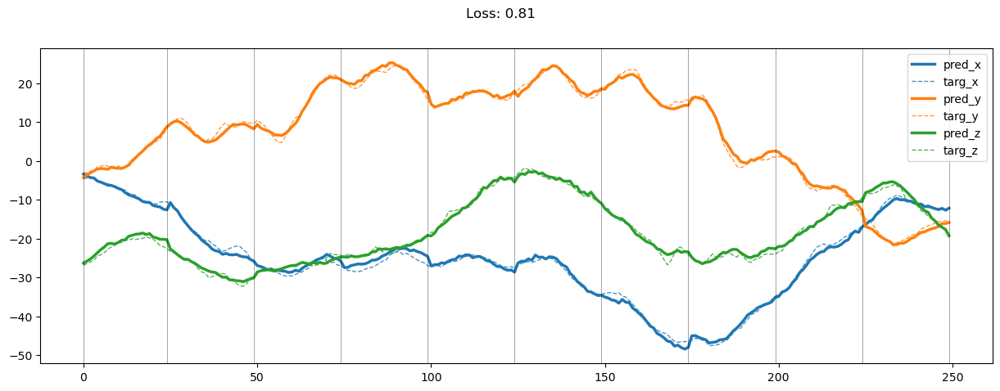

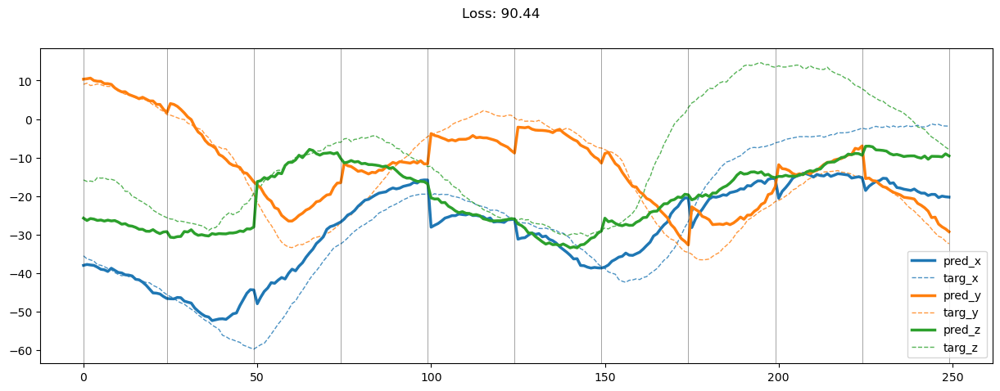

01149: train pred loss:  0.826, g loss:  5.810, diff loss:  1.645, d loss:  3.521
       valid pred loss:  163.613, g loss:  800.782, diff loss:  296.296, d loss:  3.508


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01150: train pred loss:  0.838, g loss:  5.777, diff loss:  1.645, d loss:  3.496
       valid pred loss:  158.664, g loss:  808.727, diff loss:  287.668, d loss:  3.485


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01151: train pred loss:  0.802, g loss:  5.635, diff loss:  1.573, d loss:  3.474
       valid pred loss:  159.162, g loss:  809.294, diff loss:  287.415, d loss:  3.464


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01152: train pred loss:  0.794, g loss:  5.635, diff loss:  1.564, d loss:  3.455
       valid pred loss:  159.626, g loss:  810.103, diff loss:  287.360, d loss:  3.445


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01153: train pred loss:  0.776, g loss:  5.578, diff loss:  1.533, d loss:  3.439
       valid pred loss:  162.022, g loss:  824.330, diff loss:  292.219, d loss:  3.433


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.35it/s]


01154: train pred loss:  0.800, g loss:  5.712, diff loss:  1.573, d loss:  3.427
       valid pred loss:  159.564, g loss:  805.987, diff loss:  285.450, d loss:  3.421


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.14it/s]


01155: train pred loss:  0.797, g loss:  5.705, diff loss:  1.558, d loss:  3.418
       valid pred loss:  159.622, g loss:  811.528, diff loss:  287.565, d loss:  3.414


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.26it/s]


01156: train pred loss:  0.825, g loss:  5.960, diff loss:  1.614, d loss:  3.413
       valid pred loss:  161.153, g loss:  817.818, diff loss:  290.355, d loss:  3.412


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01157: train pred loss:  0.891, g loss:  6.429, diff loss:  1.739, d loss:  3.411
       valid pred loss:  159.973, g loss:  817.734, diff loss:  292.775, d loss:  3.411


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01158: train pred loss:  0.918, g loss:  6.673, diff loss:  1.804, d loss:  3.412
       valid pred loss:  158.479, g loss:  805.604, diff loss:  285.612, d loss:  3.414


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01159: train pred loss:  0.882, g loss:  6.141, diff loss:  1.737, d loss:  3.417
       valid pred loss:  159.588, g loss:  803.461, diff loss:  282.734, d loss:  3.422


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


01160: train pred loss:  0.851, g loss:  5.960, diff loss:  1.666, d loss:  3.426
       valid pred loss:  159.286, g loss:  810.438, diff loss:  288.257, d loss:  3.431


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01161: train pred loss:  0.813, g loss:  5.766, diff loss:  1.606, d loss:  3.437
       valid pred loss:  162.805, g loss:  824.322, diff loss:  290.331, d loss:  3.445


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01162: train pred loss:  0.805, g loss:  5.697, diff loss:  1.586, d loss:  3.452
       valid pred loss:  156.929, g loss:  798.580, diff loss:  284.518, d loss:  3.462


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01163: train pred loss:  0.797, g loss:  5.624, diff loss:  1.570, d loss:  3.471
       valid pred loss:  158.712, g loss:  809.413, diff loss:  289.452, d loss:  3.482


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


01164: train pred loss:  0.810, g loss:  5.675, diff loss:  1.618, d loss:  3.492
       valid pred loss:  160.261, g loss:  806.846, diff loss:  285.236, d loss:  3.504


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.54it/s]


01165: train pred loss:  0.794, g loss:  5.561, diff loss:  1.591, d loss:  3.516
       valid pred loss:  160.164, g loss:  813.182, diff loss:  288.279, d loss:  3.529


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01166: train pred loss:  0.803, g loss:  5.691, diff loss:  1.601, d loss:  3.542
       valid pred loss:  158.834, g loss:  805.542, diff loss:  286.403, d loss:  3.557


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


01167: train pred loss:  0.869, g loss:  5.963, diff loss:  1.734, d loss:  3.571
       valid pred loss:  158.882, g loss:  806.966, diff loss:  286.363, d loss:  3.586


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01168: train pred loss:  0.853, g loss:  5.713, diff loss:  1.702, d loss:  3.601
       valid pred loss:  156.334, g loss:  791.283, diff loss:  280.523, d loss:  3.618


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.92it/s]


01169: train pred loss:  0.838, g loss:  5.574, diff loss:  1.654, d loss:  3.634
       valid pred loss:  157.479, g loss:  797.594, diff loss:  282.789, d loss:  3.651


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01170: train pred loss:  0.825, g loss:  5.462, diff loss:  1.632, d loss:  3.668
       valid pred loss:  157.631, g loss:  795.445, diff loss:  281.411, d loss:  3.687


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01171: train pred loss:  0.830, g loss:  5.447, diff loss:  1.650, d loss:  3.704
       valid pred loss:  157.701, g loss:  794.414, diff loss:  280.769, d loss:  3.723


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01172: train pred loss:  0.804, g loss:  5.236, diff loss:  1.565, d loss:  3.741
       valid pred loss:  159.164, g loss:  798.874, diff loss:  282.257, d loss:  3.762


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01173: train pred loss:  0.822, g loss:  5.455, diff loss:  1.640, d loss:  3.779
       valid pred loss:  163.095, g loss:  821.665, diff loss:  288.010, d loss:  3.800


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01174: train pred loss:  0.978, g loss:  6.537, diff loss:  1.941, d loss:  3.817
       valid pred loss:  163.151, g loss:  828.878, diff loss:  292.506, d loss:  3.838


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01175: train pred loss:  1.049, g loss:  7.379, diff loss:  2.049, d loss:  3.856
       valid pred loss:  161.099, g loss:  815.763, diff loss:  289.142, d loss:  3.877


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01176: train pred loss:  1.111, g loss:  8.407, diff loss:  2.144, d loss:  3.896
       valid pred loss:  160.342, g loss:  814.928, diff loss:  289.643, d loss:  3.917


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01177: train pred loss:  1.259, g loss:  9.418, diff loss:  2.376, d loss:  3.936
       valid pred loss:  160.044, g loss:  803.132, diff loss:  282.322, d loss:  3.957


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01178: train pred loss:  1.321, g loss:  9.987, diff loss:  2.559, d loss:  3.976
       valid pred loss:  160.950, g loss:  812.286, diff loss:  285.561, d loss:  3.997


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01179: train pred loss:  1.498, g loss:  11.195, diff loss:  2.916, d loss:  4.016
       valid pred loss:  166.563, g loss:  836.242, diff loss:  297.572, d loss:  4.037


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01180: train pred loss:  1.575, g loss:  11.384, diff loss:  2.966, d loss:  4.056
       valid pred loss:  159.041, g loss:  797.383, diff loss:  282.661, d loss:  4.077


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01181: train pred loss:  1.609, g loss:  11.817, diff loss:  3.110, d loss:  4.095
       valid pred loss:  166.762, g loss:  842.174, diff loss:  296.939, d loss:  4.115


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.11it/s]


01182: train pred loss:  1.656, g loss:  12.313, diff loss:  3.272, d loss:  4.134
       valid pred loss:  165.065, g loss:  819.340, diff loss:  285.107, d loss:  4.154


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01183: train pred loss:  1.792, g loss:  12.758, diff loss:  3.385, d loss:  4.172
       valid pred loss:  170.814, g loss:  841.015, diff loss:  315.798, d loss:  4.192


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01184: train pred loss:  1.700, g loss:  12.453, diff loss:  3.324, d loss:  4.210
       valid pred loss:  165.582, g loss:  825.415, diff loss:  287.688, d loss:  4.230


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.32it/s]


01185: train pred loss:  1.644, g loss:  12.130, diff loss:  3.245, d loss:  4.247
       valid pred loss:  182.122, g loss:  878.363, diff loss:  317.684, d loss:  4.266


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01186: train pred loss:  1.650, g loss:  12.086, diff loss:  3.237, d loss:  4.282
       valid pred loss:  171.935, g loss:  828.220, diff loss:  300.352, d loss:  4.300


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.97it/s]


01187: train pred loss:  1.691, g loss:  12.223, diff loss:  3.277, d loss:  4.317
       valid pred loss:  164.372, g loss:  817.755, diff loss:  286.399, d loss:  4.336


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.98it/s]


01188: train pred loss:  1.730, g loss:  12.394, diff loss:  3.329, d loss:  4.349
       valid pred loss:  172.845, g loss:  837.978, diff loss:  306.827, d loss:  4.368


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01189: train pred loss:  1.653, g loss:  11.904, diff loss:  3.198, d loss:  4.381
       valid pred loss:  171.760, g loss:  862.263, diff loss:  304.872, d loss:  4.397


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01190: train pred loss:  1.573, g loss:  11.204, diff loss:  2.998, d loss:  4.411
       valid pred loss:  165.464, g loss:  819.557, diff loss:  286.475, d loss:  4.427


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.18it/s]


01191: train pred loss:  1.508, g loss:  10.845, diff loss:  2.906, d loss:  4.440
       valid pred loss:  176.185, g loss:  851.390, diff loss:  309.244, d loss:  4.455


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01192: train pred loss:  1.521, g loss:  10.858, diff loss:  2.912, d loss:  4.468
       valid pred loss:  163.452, g loss:  817.405, diff loss:  287.456, d loss:  4.482


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01193: train pred loss:  1.502, g loss:  10.725, diff loss:  2.878, d loss:  4.492
       valid pred loss:  174.836, g loss:  836.112, diff loss:  298.767, d loss:  4.502


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.85it/s]


01194: train pred loss:  1.368, g loss:  9.842, diff loss:  2.632, d loss:  4.509
       valid pred loss:  174.241, g loss:  870.059, diff loss:  304.115, d loss:  4.518


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


01195: train pred loss:  1.342, g loss:  9.680, diff loss:  2.590, d loss:  4.524
       valid pred loss:  170.886, g loss:  828.486, diff loss:  301.345, d loss:  4.531


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.17it/s]


01196: train pred loss:  1.288, g loss:  9.439, diff loss:  2.530, d loss:  4.537
       valid pred loss:  171.909, g loss:  837.714, diff loss:  307.822, d loss:  4.544


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


01197: train pred loss:  1.294, g loss:  9.343, diff loss:  2.540, d loss:  4.549
       valid pred loss:  174.540, g loss:  863.128, diff loss:  299.551, d loss:  4.554


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01198: train pred loss:  1.231, g loss:  8.964, diff loss:  2.395, d loss:  4.558
       valid pred loss:  170.977, g loss:  855.116, diff loss:  298.022, d loss:  4.563


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.27it/s]


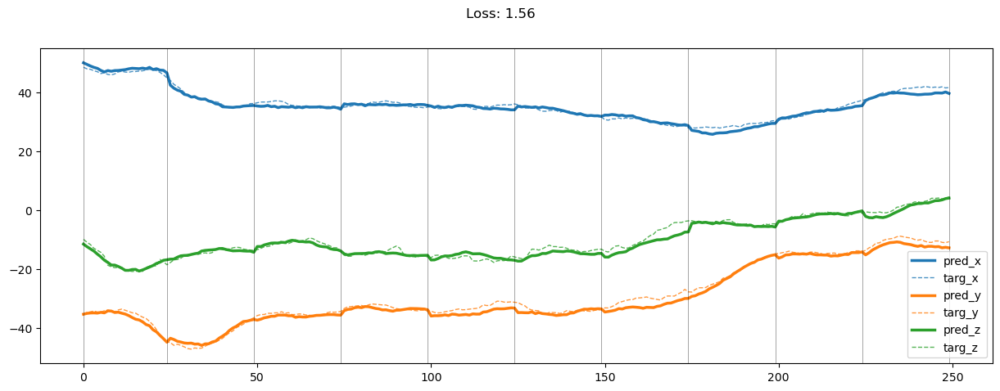

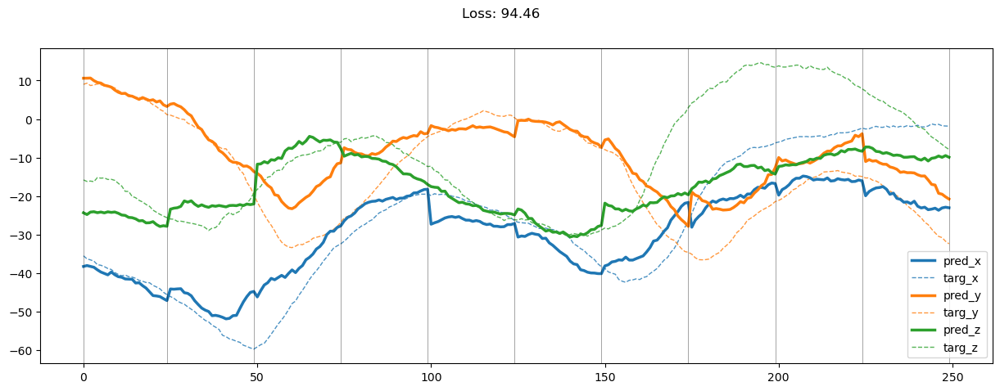

01199: train pred loss:  1.278, g loss:  9.176, diff loss:  2.452, d loss:  4.567
       valid pred loss:  167.512, g loss:  844.368, diff loss:  298.234, d loss:  4.570


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.42it/s]


01200: train pred loss:  1.183, g loss:  8.615, diff loss:  2.334, d loss:  4.574
       valid pred loss:  172.769, g loss:  861.299, diff loss:  301.841, d loss:  4.577


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01201: train pred loss:  1.165, g loss:  8.457, diff loss:  2.290, d loss:  4.580
       valid pred loss:  170.901, g loss:  821.298, diff loss:  295.752, d loss:  4.581


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.12it/s]


01202: train pred loss:  1.083, g loss:  7.638, diff loss:  2.151, d loss:  4.583
       valid pred loss:  173.909, g loss:  839.771, diff loss:  304.947, d loss:  4.584


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01203: train pred loss:  1.081, g loss:  7.745, diff loss:  2.078, d loss:  4.585
       valid pred loss:  167.589, g loss:  815.172, diff loss:  299.631, d loss:  4.585


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


01204: train pred loss:  1.069, g loss:  7.390, diff loss:  2.072, d loss:  4.584
       valid pred loss:  167.860, g loss:  833.198, diff loss:  290.153, d loss:  4.585


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


01205: train pred loss:  1.128, g loss:  7.709, diff loss:  2.114, d loss:  4.583
       valid pred loss:  161.645, g loss:  812.852, diff loss:  288.098, d loss:  4.581


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.03it/s]


01206: train pred loss:  1.083, g loss:  7.496, diff loss:  2.103, d loss:  4.580
       valid pred loss:  165.447, g loss:  832.192, diff loss:  292.638, d loss:  4.578


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.16it/s]


01207: train pred loss:  1.105, g loss:  7.767, diff loss:  2.151, d loss:  4.576
       valid pred loss:  161.576, g loss:  809.241, diff loss:  283.773, d loss:  4.573


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01208: train pred loss:  1.056, g loss:  7.245, diff loss:  2.023, d loss:  4.570
       valid pred loss:  166.269, g loss:  835.968, diff loss:  294.973, d loss:  4.566


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.87it/s]


01209: train pred loss:  1.028, g loss:  7.044, diff loss:  2.007, d loss:  4.563
       valid pred loss:  161.106, g loss:  805.265, diff loss:  282.724, d loss:  4.557


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


01210: train pred loss:  0.996, g loss:  6.181, diff loss:  1.945, d loss:  4.554
       valid pred loss:  164.013, g loss:  818.337, diff loss:  286.052, d loss:  4.548


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.18it/s]


01211: train pred loss:  0.956, g loss:  5.862, diff loss:  1.909, d loss:  4.543
       valid pred loss:  163.234, g loss:  813.463, diff loss:  284.858, d loss:  4.537


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.21it/s]


01212: train pred loss:  0.972, g loss:  6.366, diff loss:  1.912, d loss:  4.532
       valid pred loss:  165.300, g loss:  821.259, diff loss:  285.353, d loss:  4.528


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01213: train pred loss:  0.946, g loss:  5.907, diff loss:  1.878, d loss:  4.519
       valid pred loss:  157.324, g loss:  795.997, diff loss:  283.771, d loss:  4.513


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01214: train pred loss:  1.024, g loss:  6.342, diff loss:  2.048, d loss:  4.505
       valid pred loss:  161.132, g loss:  820.242, diff loss:  293.515, d loss:  4.496


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01215: train pred loss:  1.079, g loss:  7.367, diff loss:  2.075, d loss:  4.489
       valid pred loss:  159.864, g loss:  801.907, diff loss:  281.020, d loss:  4.479


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01216: train pred loss:  1.084, g loss:  7.204, diff loss:  2.089, d loss:  4.472
       valid pred loss:  162.651, g loss:  790.538, diff loss:  289.639, d loss:  4.461


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.14it/s]


01217: train pred loss:  1.085, g loss:  7.599, diff loss:  2.155, d loss:  4.454
       valid pred loss:  162.344, g loss:  818.437, diff loss:  291.331, d loss:  4.443


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01218: train pred loss:  1.216, g loss:  8.806, diff loss:  2.431, d loss:  4.434
       valid pred loss:  161.383, g loss:  814.783, diff loss:  290.160, d loss:  4.424


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.01it/s]


01219: train pred loss:  1.184, g loss:  8.703, diff loss:  2.295, d loss:  4.414
       valid pred loss:  165.917, g loss:  810.044, diff loss:  298.192, d loss:  4.402


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 13.97it/s]


01220: train pred loss:  1.121, g loss:  8.256, diff loss:  2.197, d loss:  4.392
       valid pred loss:  164.842, g loss:  803.657, diff loss:  296.374, d loss:  4.380


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01221: train pred loss:  1.113, g loss:  8.008, diff loss:  2.144, d loss:  4.369
       valid pred loss:  156.705, g loss:  789.524, diff loss:  279.543, d loss:  4.356


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01222: train pred loss:  1.049, g loss:  7.130, diff loss:  2.018, d loss:  4.346
       valid pred loss:  157.994, g loss:  772.103, diff loss:  285.441, d loss:  4.334


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.10it/s]


01223: train pred loss:  1.004, g loss:  6.413, diff loss:  1.903, d loss:  4.322
       valid pred loss:  157.769, g loss:  802.088, diff loss:  285.609, d loss:  4.307


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.31it/s]


01224: train pred loss:  0.939, g loss:  5.669, diff loss:  1.809, d loss:  4.295
       valid pred loss:  158.081, g loss:  805.989, diff loss:  288.845, d loss:  4.281


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.01it/s]


01225: train pred loss:  0.862, g loss:  5.014, diff loss:  1.695, d loss:  4.270
       valid pred loss:  161.890, g loss:  820.212, diff loss:  290.487, d loss:  4.254


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.16it/s]


01226: train pred loss:  0.804, g loss:  4.742, diff loss:  1.578, d loss:  4.243
       valid pred loss:  158.405, g loss:  776.292, diff loss:  287.884, d loss:  4.227


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01227: train pred loss:  0.793, g loss:  4.708, diff loss:  1.557, d loss:  4.215
       valid pred loss:  159.993, g loss:  812.764, diff loss:  290.402, d loss:  4.199


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01228: train pred loss:  0.770, g loss:  4.633, diff loss:  1.527, d loss:  4.187
       valid pred loss:  162.016, g loss:  793.693, diff loss:  294.489, d loss:  4.174


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01229: train pred loss:  0.774, g loss:  4.669, diff loss:  1.527, d loss:  4.159
       valid pred loss:  160.658, g loss:  814.240, diff loss:  289.188, d loss:  4.144


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01230: train pred loss:  0.761, g loss:  4.625, diff loss:  1.499, d loss:  4.130
       valid pred loss:  161.863, g loss:  817.691, diff loss:  289.695, d loss:  4.115


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01231: train pred loss:  0.765, g loss:  4.686, diff loss:  1.523, d loss:  4.100
       valid pred loss:  163.520, g loss:  825.679, diff loss:  292.926, d loss:  4.086


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01232: train pred loss:  0.764, g loss:  4.688, diff loss:  1.501, d loss:  4.071
       valid pred loss:  162.387, g loss:  824.346, diff loss:  292.890, d loss:  4.056


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01233: train pred loss:  0.741, g loss:  4.591, diff loss:  1.446, d loss:  4.042
       valid pred loss:  163.390, g loss:  821.814, diff loss:  289.647, d loss:  4.026


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01234: train pred loss:  0.739, g loss:  4.604, diff loss:  1.437, d loss:  4.012
       valid pred loss:  161.582, g loss:  788.294, diff loss:  290.168, d loss:  3.997


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


01235: train pred loss:  0.738, g loss:  4.631, diff loss:  1.435, d loss:  3.983
       valid pred loss:  162.070, g loss:  820.018, diff loss:  290.716, d loss:  3.968


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.85it/s]


01236: train pred loss:  0.729, g loss:  4.645, diff loss:  1.450, d loss:  3.954
       valid pred loss:  161.336, g loss:  816.203, diff loss:  288.577, d loss:  3.939


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01237: train pred loss:  0.736, g loss:  4.702, diff loss:  1.456, d loss:  3.925
       valid pred loss:  162.146, g loss:  815.817, diff loss:  288.350, d loss:  3.909


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.12it/s]


01238: train pred loss:  0.734, g loss:  4.700, diff loss:  1.428, d loss:  3.898
       valid pred loss:  160.871, g loss:  808.733, diff loss:  286.145, d loss:  3.884


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01239: train pred loss:  0.751, g loss:  4.827, diff loss:  1.474, d loss:  3.870
       valid pred loss:  165.664, g loss:  832.110, diff loss:  292.454, d loss:  3.856


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01240: train pred loss:  0.759, g loss:  4.875, diff loss:  1.468, d loss:  3.843
       valid pred loss:  165.418, g loss:  829.601, diff loss:  291.702, d loss:  3.828


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01241: train pred loss:  0.742, g loss:  4.863, diff loss:  1.476, d loss:  3.817
       valid pred loss:  161.174, g loss:  790.238, diff loss:  293.528, d loss:  3.803


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01242: train pred loss:  0.770, g loss:  5.014, diff loss:  1.512, d loss:  3.792
       valid pred loss:  163.513, g loss:  825.106, diff loss:  290.880, d loss:  3.781


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01243: train pred loss:  0.764, g loss:  5.015, diff loss:  1.502, d loss:  3.769
       valid pred loss:  161.773, g loss:  816.854, diff loss:  289.469, d loss:  3.757


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01244: train pred loss:  0.773, g loss:  5.087, diff loss:  1.518, d loss:  3.746
       valid pred loss:  161.361, g loss:  813.240, diff loss:  286.983, d loss:  3.735


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01245: train pred loss:  0.740, g loss:  4.940, diff loss:  1.441, d loss:  3.725
       valid pred loss:  159.370, g loss:  806.536, diff loss:  286.441, d loss:  3.714


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01246: train pred loss:  0.739, g loss:  4.993, diff loss:  1.472, d loss:  3.706
       valid pred loss:  159.904, g loss:  810.323, diff loss:  287.667, d loss:  3.696


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.11it/s]


01247: train pred loss:  0.744, g loss:  5.034, diff loss:  1.476, d loss:  3.688
       valid pred loss:  162.687, g loss:  816.930, diff loss:  287.097, d loss:  3.679


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.21it/s]


01248: train pred loss:  0.754, g loss:  5.233, diff loss:  1.493, d loss:  3.672
       valid pred loss:  158.963, g loss:  801.603, diff loss:  283.583, d loss:  3.666


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.02it/s]


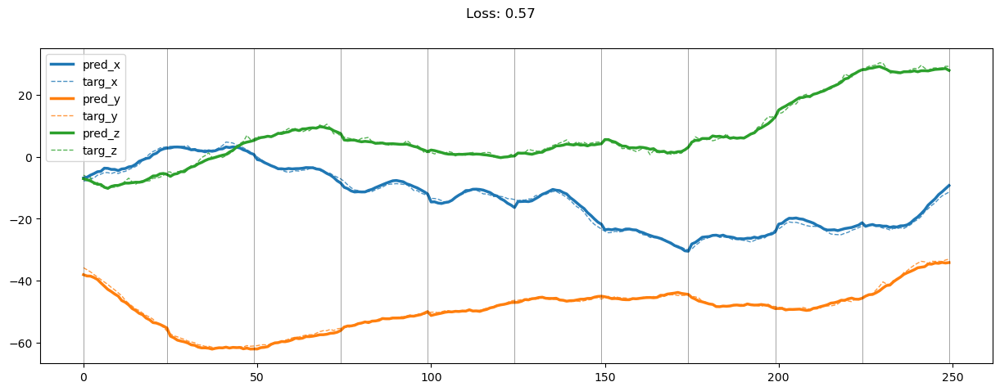

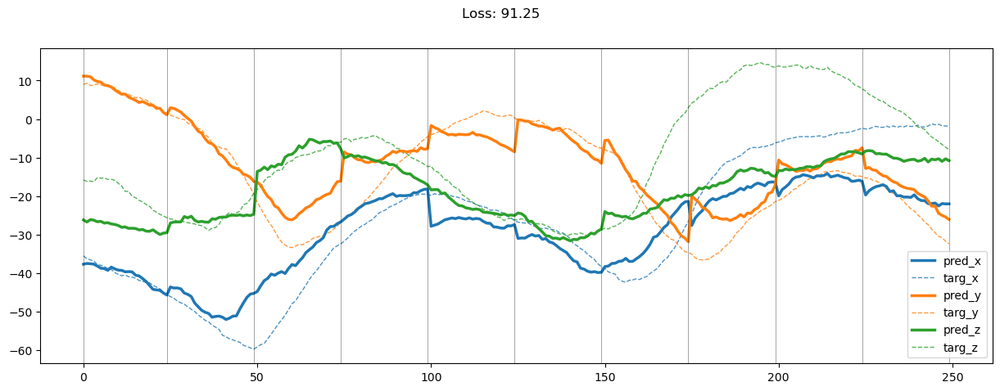

01249: train pred loss:  0.789, g loss:  5.316, diff loss:  1.579, d loss:  3.658
       valid pred loss:  159.455, g loss:  799.103, diff loss:  281.008, d loss:  3.651


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.30it/s]


01250: train pred loss:  0.783, g loss:  5.278, diff loss:  1.543, d loss:  3.646
       valid pred loss:  159.170, g loss:  801.081, diff loss:  282.632, d loss:  3.641


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


01251: train pred loss:  0.748, g loss:  5.104, diff loss:  1.460, d loss:  3.636
       valid pred loss:  160.061, g loss:  803.524, diff loss:  283.440, d loss:  3.630


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.87it/s]


01252: train pred loss:  0.751, g loss:  5.149, diff loss:  1.485, d loss:  3.628
       valid pred loss:  164.286, g loss:  827.291, diff loss:  292.186, d loss:  3.623


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.26it/s]


01253: train pred loss:  0.750, g loss:  5.157, diff loss:  1.487, d loss:  3.623
       valid pred loss:  161.133, g loss:  786.453, diff loss:  290.108, d loss:  3.620


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01254: train pred loss:  0.752, g loss:  5.158, diff loss:  1.478, d loss:  3.620
       valid pred loss:  163.224, g loss:  795.941, diff loss:  293.565, d loss:  3.621


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


01255: train pred loss:  0.749, g loss:  5.157, diff loss:  1.483, d loss:  3.619
       valid pred loss:  161.841, g loss:  813.122, diff loss:  286.011, d loss:  3.619


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01256: train pred loss:  0.758, g loss:  5.174, diff loss:  1.475, d loss:  3.621
       valid pred loss:  160.209, g loss:  808.489, diff loss:  286.269, d loss:  3.621


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01257: train pred loss:  0.744, g loss:  5.108, diff loss:  1.459, d loss:  3.625
       valid pred loss:  159.825, g loss:  809.529, diff loss:  288.240, d loss:  3.628


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01258: train pred loss:  0.753, g loss:  5.151, diff loss:  1.485, d loss:  3.631
       valid pred loss:  165.803, g loss:  827.180, diff loss:  289.864, d loss:  3.637


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.00it/s]


01259: train pred loss:  0.768, g loss:  5.207, diff loss:  1.508, d loss:  3.640
       valid pred loss:  160.152, g loss:  804.398, diff loss:  282.847, d loss:  3.645


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.57it/s]


01260: train pred loss:  0.778, g loss:  5.221, diff loss:  1.509, d loss:  3.652
       valid pred loss:  161.922, g loss:  815.085, diff loss:  287.709, d loss:  3.656


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.72it/s]


01261: train pred loss:  0.795, g loss:  5.286, diff loss:  1.540, d loss:  3.665
       valid pred loss:  164.625, g loss:  821.122, diff loss:  286.171, d loss:  3.673


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01262: train pred loss:  0.781, g loss:  5.215, diff loss:  1.534, d loss:  3.680
       valid pred loss:  161.086, g loss:  809.403, diff loss:  286.472, d loss:  3.690


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01263: train pred loss:  0.748, g loss:  5.039, diff loss:  1.479, d loss:  3.697
       valid pred loss:  158.942, g loss:  803.312, diff loss:  284.932, d loss:  3.708


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.00it/s]


01264: train pred loss:  0.763, g loss:  5.070, diff loss:  1.491, d loss:  3.717
       valid pred loss:  162.787, g loss:  796.151, diff loss:  294.671, d loss:  3.727


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.09it/s]


01265: train pred loss:  0.750, g loss:  4.985, diff loss:  1.472, d loss:  3.737
       valid pred loss:  168.137, g loss:  815.329, diff loss:  298.071, d loss:  3.751


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.08it/s]


01266: train pred loss:  0.732, g loss:  4.884, diff loss:  1.456, d loss:  3.761
       valid pred loss:  167.011, g loss:  838.023, diff loss:  293.837, d loss:  3.771


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01267: train pred loss:  0.737, g loss:  4.874, diff loss:  1.460, d loss:  3.784
       valid pred loss:  163.630, g loss:  799.495, diff loss:  295.690, d loss:  3.797


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.53it/s]


01268: train pred loss:  0.761, g loss:  4.941, diff loss:  1.483, d loss:  3.809
       valid pred loss:  162.383, g loss:  792.222, diff loss:  291.808, d loss:  3.823


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01269: train pred loss:  0.773, g loss:  4.965, diff loss:  1.505, d loss:  3.835
       valid pred loss:  167.476, g loss:  816.517, diff loss:  300.573, d loss:  3.848


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.80it/s]


01270: train pred loss:  0.793, g loss:  5.065, diff loss:  1.575, d loss:  3.862
       valid pred loss:  165.377, g loss:  831.553, diff loss:  292.669, d loss:  3.877


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01271: train pred loss:  0.769, g loss:  4.913, diff loss:  1.524, d loss:  3.889
       valid pred loss:  162.565, g loss:  795.195, diff loss:  294.744, d loss:  3.905


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.17it/s]


01272: train pred loss:  0.778, g loss:  4.898, diff loss:  1.515, d loss:  3.917
       valid pred loss:  159.029, g loss:  803.559, diff loss:  285.964, d loss:  3.934


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01273: train pred loss:  0.765, g loss:  4.807, diff loss:  1.493, d loss:  3.946
       valid pred loss:  162.868, g loss:  820.094, diff loss:  288.923, d loss:  3.961


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.17it/s]


01274: train pred loss:  0.755, g loss:  4.745, diff loss:  1.491, d loss:  3.975
       valid pred loss:  161.435, g loss:  817.123, diff loss:  290.361, d loss:  3.990


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01275: train pred loss:  0.737, g loss:  4.635, diff loss:  1.462, d loss:  4.003
       valid pred loss:  161.704, g loss:  788.929, diff loss:  291.235, d loss:  4.018


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.14it/s]


01276: train pred loss:  0.750, g loss:  4.672, diff loss:  1.487, d loss:  4.031
       valid pred loss:  165.906, g loss:  805.475, diff loss:  295.252, d loss:  4.048


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01277: train pred loss:  0.755, g loss:  4.643, diff loss:  1.470, d loss:  4.060
       valid pred loss:  164.143, g loss:  802.290, diff loss:  296.863, d loss:  4.075


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01278: train pred loss:  0.758, g loss:  4.647, diff loss:  1.490, d loss:  4.088
       valid pred loss:  163.037, g loss:  819.413, diff loss:  288.229, d loss:  4.103


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01279: train pred loss:  0.773, g loss:  4.706, diff loss:  1.527, d loss:  4.115
       valid pred loss:  161.892, g loss:  810.301, diff loss:  284.035, d loss:  4.129


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01280: train pred loss:  0.751, g loss:  4.553, diff loss:  1.463, d loss:  4.141
       valid pred loss:  164.504, g loss:  822.536, diff loss:  288.248, d loss:  4.156


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01281: train pred loss:  0.776, g loss:  4.671, diff loss:  1.529, d loss:  4.167
       valid pred loss:  166.665, g loss:  804.825, diff loss:  292.278, d loss:  4.180


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01282: train pred loss:  0.805, g loss:  4.869, diff loss:  1.567, d loss:  4.193
       valid pred loss:  164.131, g loss:  794.094, diff loss:  289.826, d loss:  4.206


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01283: train pred loss:  0.901, g loss:  5.410, diff loss:  1.764, d loss:  4.218
       valid pred loss:  170.695, g loss:  848.495, diff loss:  294.172, d loss:  4.228


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01284: train pred loss:  0.865, g loss:  5.127, diff loss:  1.654, d loss:  4.241
       valid pred loss:  166.881, g loss:  833.974, diff loss:  291.640, d loss:  4.254


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01285: train pred loss:  0.836, g loss:  4.869, diff loss:  1.622, d loss:  4.263
       valid pred loss:  161.194, g loss:  805.167, diff loss:  282.531, d loss:  4.276


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01286: train pred loss:  0.787, g loss:  4.633, diff loss:  1.549, d loss:  4.284
       valid pred loss:  168.202, g loss:  807.460, diff loss:  291.499, d loss:  4.296


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.13it/s]


01287: train pred loss:  0.782, g loss:  4.589, diff loss:  1.532, d loss:  4.304
       valid pred loss:  167.409, g loss:  809.896, diff loss:  296.222, d loss:  4.315


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.02it/s]


01288: train pred loss:  0.761, g loss:  4.474, diff loss:  1.495, d loss:  4.323
       valid pred loss:  166.119, g loss:  805.335, diff loss:  295.553, d loss:  4.332


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.26it/s]


01289: train pred loss:  0.768, g loss:  4.511, diff loss:  1.521, d loss:  4.340
       valid pred loss:  165.875, g loss:  802.762, diff loss:  293.240, d loss:  4.350


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.95it/s]


01290: train pred loss:  0.761, g loss:  4.455, diff loss:  1.498, d loss:  4.356
       valid pred loss:  170.819, g loss:  826.079, diff loss:  301.857, d loss:  4.364


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01291: train pred loss:  0.781, g loss:  4.533, diff loss:  1.526, d loss:  4.371
       valid pred loss:  165.626, g loss:  804.585, diff loss:  295.755, d loss:  4.377


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01292: train pred loss:  0.801, g loss:  4.622, diff loss:  1.564, d loss:  4.383
       valid pred loss:  165.667, g loss:  804.181, diff loss:  294.573, d loss:  4.391


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01293: train pred loss:  0.787, g loss:  4.564, diff loss:  1.553, d loss:  4.395
       valid pred loss:  165.696, g loss:  807.118, diff loss:  298.244, d loss:  4.401


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.47it/s]


01294: train pred loss:  0.845, g loss:  4.949, diff loss:  1.651, d loss:  4.405
       valid pred loss:  170.279, g loss:  818.671, diff loss:  295.265, d loss:  4.408


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.92it/s]


01295: train pred loss:  0.850, g loss:  4.833, diff loss:  1.645, d loss:  4.412
       valid pred loss:  167.298, g loss:  805.674, diff loss:  291.654, d loss:  4.417


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.29it/s]


01296: train pred loss:  0.859, g loss:  4.999, diff loss:  1.672, d loss:  4.419
       valid pred loss:  165.945, g loss:  828.383, diff loss:  289.556, d loss:  4.421


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


01297: train pred loss:  0.847, g loss:  4.826, diff loss:  1.656, d loss:  4.423
       valid pred loss:  165.679, g loss:  824.622, diff loss:  287.795, d loss:  4.425


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.11it/s]


01298: train pred loss:  0.840, g loss:  4.909, diff loss:  1.632, d loss:  4.426
       valid pred loss:  163.872, g loss:  793.221, diff loss:  288.917, d loss:  4.427


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.21it/s]


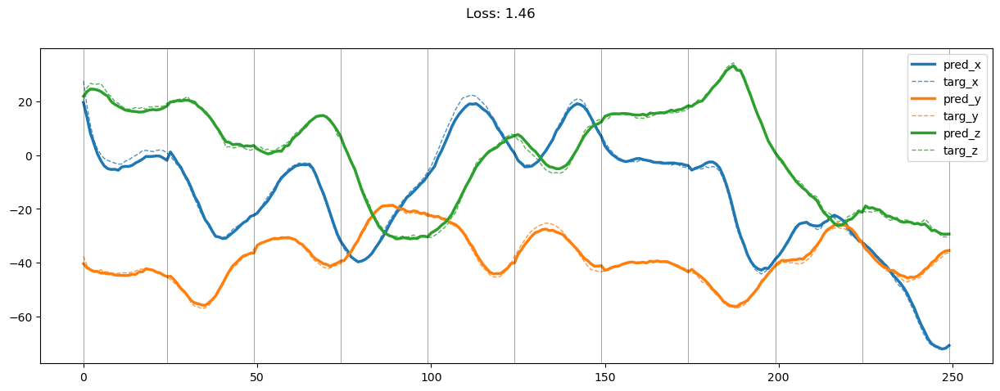

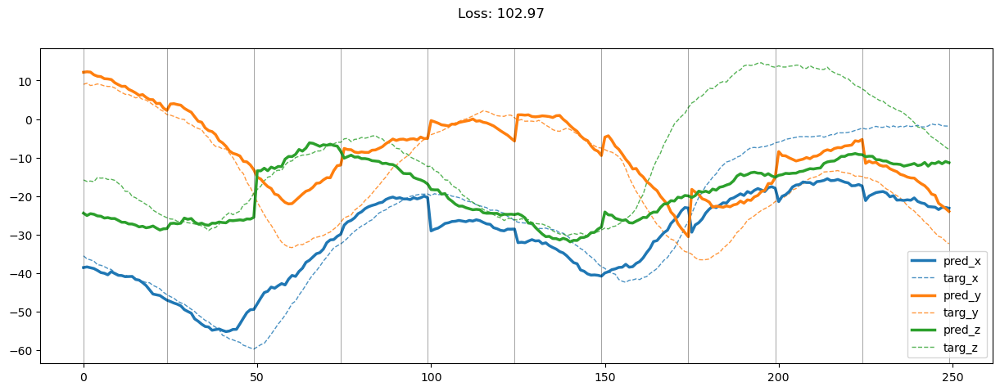

01299: train pred loss:  0.903, g loss:  5.166, diff loss:  1.726, d loss:  4.427
       valid pred loss:  167.037, g loss:  835.104, diff loss:  293.311, d loss:  4.427


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.78it/s]


01300: train pred loss:  0.905, g loss:  5.319, diff loss:  1.732, d loss:  4.426
       valid pred loss:  163.323, g loss:  816.034, diff loss:  285.955, d loss:  4.424


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01301: train pred loss:  0.858, g loss:  4.850, diff loss:  1.646, d loss:  4.423
       valid pred loss:  163.496, g loss:  821.057, diff loss:  287.773, d loss:  4.419


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.00it/s]


01302: train pred loss:  0.824, g loss:  4.722, diff loss:  1.617, d loss:  4.418
       valid pred loss:  161.793, g loss:  806.545, diff loss:  282.451, d loss:  4.415


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01303: train pred loss:  0.796, g loss:  4.613, diff loss:  1.589, d loss:  4.412
       valid pred loss:  162.874, g loss:  812.347, diff loss:  284.862, d loss:  4.408


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


01304: train pred loss:  0.784, g loss:  4.559, diff loss:  1.563, d loss:  4.403
       valid pred loss:  164.798, g loss:  798.107, diff loss:  290.591, d loss:  4.397


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01305: train pred loss:  0.782, g loss:  4.537, diff loss:  1.540, d loss:  4.393
       valid pred loss:  166.772, g loss:  804.633, diff loss:  291.418, d loss:  4.386


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01306: train pred loss:  0.794, g loss:  4.725, diff loss:  1.565, d loss:  4.381
       valid pred loss:  163.997, g loss:  828.293, diff loss:  292.688, d loss:  4.374


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01307: train pred loss:  0.804, g loss:  4.662, diff loss:  1.583, d loss:  4.367
       valid pred loss:  167.141, g loss:  813.374, diff loss:  298.395, d loss:  4.358


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01308: train pred loss:  0.822, g loss:  4.726, diff loss:  1.582, d loss:  4.351
       valid pred loss:  166.749, g loss:  830.372, diff loss:  288.969, d loss:  4.341


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01309: train pred loss:  0.798, g loss:  4.653, diff loss:  1.568, d loss:  4.333
       valid pred loss:  163.520, g loss:  823.527, diff loss:  291.488, d loss:  4.322


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01310: train pred loss:  0.820, g loss:  4.778, diff loss:  1.614, d loss:  4.314
       valid pred loss:  167.032, g loss:  812.036, diff loss:  298.037, d loss:  4.305


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01311: train pred loss:  0.827, g loss:  4.787, diff loss:  1.588, d loss:  4.293
       valid pred loss:  163.332, g loss:  794.936, diff loss:  291.948, d loss:  4.283


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01312: train pred loss:  0.813, g loss:  4.766, diff loss:  1.592, d loss:  4.271
       valid pred loss:  160.236, g loss:  810.297, diff loss:  286.636, d loss:  4.259


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.63it/s]


01313: train pred loss:  0.828, g loss:  4.980, diff loss:  1.624, d loss:  4.247
       valid pred loss:  157.948, g loss:  794.946, diff loss:  281.117, d loss:  4.234


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01314: train pred loss:  0.863, g loss:  5.340, diff loss:  1.706, d loss:  4.222
       valid pred loss:  161.031, g loss:  812.915, diff loss:  288.591, d loss:  4.208


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.30it/s]


01315: train pred loss:  0.926, g loss:  5.630, diff loss:  1.808, d loss:  4.196
       valid pred loss:  164.600, g loss:  805.348, diff loss:  297.618, d loss:  4.181


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.06it/s]


01316: train pred loss:  0.997, g loss:  6.550, diff loss:  1.962, d loss:  4.169
       valid pred loss:  161.352, g loss:  793.535, diff loss:  296.273, d loss:  4.154


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.12it/s]


01317: train pred loss:  1.035, g loss:  6.880, diff loss:  1.996, d loss:  4.140
       valid pred loss:  166.110, g loss:  813.709, diff loss:  301.714, d loss:  4.124


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.27it/s]


01318: train pred loss:  1.116, g loss:  8.096, diff loss:  2.139, d loss:  4.111
       valid pred loss:  162.659, g loss:  796.774, diff loss:  295.343, d loss:  4.096


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


01319: train pred loss:  1.224, g loss:  9.173, diff loss:  2.353, d loss:  4.081
       valid pred loss:  173.232, g loss:  850.425, diff loss:  316.550, d loss:  4.067


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01320: train pred loss:  1.444, g loss:  10.824, diff loss:  2.820, d loss:  4.051
       valid pred loss:  166.392, g loss:  810.108, diff loss:  298.124, d loss:  4.036


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01321: train pred loss:  1.778, g loss:  12.858, diff loss:  3.377, d loss:  4.020
       valid pred loss:  175.229, g loss:  853.632, diff loss:  315.786, d loss:  4.004


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


01322: train pred loss:  2.495, g loss:  17.966, diff loss:  4.831, d loss:  3.990
       valid pred loss:  175.412, g loss:  885.236, diff loss:  313.444, d loss:  3.972


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01323: train pred loss:  3.809, g loss:  26.165, diff loss:  7.115, d loss:  3.959
       valid pred loss:  195.593, g loss:  984.325, diff loss:  385.311, d loss:  3.943


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


01324: train pred loss:  5.036, g loss:  35.214, diff loss:  9.712, d loss:  3.928
       valid pred loss:  198.623, g loss:  937.620, diff loss:  328.940, d loss:  3.913


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.19it/s]


01325: train pred loss:  9.580, g loss:  62.528, diff loss:  18.307, d loss:  3.899
       valid pred loss:  237.805, g loss:  1101.549, diff loss:  375.772, d loss:  3.883


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01326: train pred loss:  15.565, g loss:  89.435, diff loss:  28.354, d loss:  3.870
       valid pred loss:  211.376, g loss:  1002.952, diff loss:  357.436, d loss:  3.855


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01327: train pred loss:  18.245, g loss:  104.666, diff loss:  33.518, d loss:  3.841
       valid pred loss:  297.036, g loss:  1299.184, diff loss:  406.920, d loss:  3.827


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01328: train pred loss:  15.249, g loss:  90.488, diff loss:  29.148, d loss:  3.814
       valid pred loss:  211.270, g loss:  980.944, diff loss:  332.191, d loss:  3.800


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01329: train pred loss:  10.160, g loss:  64.351, diff loss:  19.148, d loss:  3.788
       valid pred loss:  189.711, g loss:  910.815, diff loss:  324.487, d loss:  3.776


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.32it/s]


01330: train pred loss:  6.909, g loss:  46.976, diff loss:  12.945, d loss:  3.764
       valid pred loss:  161.666, g loss:  802.742, diff loss:  280.262, d loss:  3.753


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01331: train pred loss:  4.714, g loss:  33.836, diff loss:  9.287, d loss:  3.742
       valid pred loss:  173.914, g loss:  854.712, diff loss:  292.306, d loss:  3.731


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01332: train pred loss:  3.473, g loss:  25.325, diff loss:  6.855, d loss:  3.722
       valid pred loss:  164.704, g loss:  830.905, diff loss:  293.834, d loss:  3.712


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01333: train pred loss:  2.796, g loss:  20.538, diff loss:  5.477, d loss:  3.704
       valid pred loss:  163.395, g loss:  821.262, diff loss:  288.719, d loss:  3.694


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01334: train pred loss:  2.355, g loss:  17.428, diff loss:  4.580, d loss:  3.689
       valid pred loss:  168.165, g loss:  839.199, diff loss:  291.530, d loss:  3.683


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01335: train pred loss:  2.084, g loss:  15.698, diff loss:  4.088, d loss:  3.676
       valid pred loss:  166.706, g loss:  833.404, diff loss:  292.093, d loss:  3.669


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01336: train pred loss:  1.856, g loss:  14.204, diff loss:  3.661, d loss:  3.666
       valid pred loss:  167.010, g loss:  831.911, diff loss:  290.459, d loss:  3.661


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


01337: train pred loss:  1.747, g loss:  13.389, diff loss:  3.423, d loss:  3.659
       valid pred loss:  168.741, g loss:  846.627, diff loss:  296.939, d loss:  3.655


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.51it/s]


01338: train pred loss:  1.704, g loss:  13.230, diff loss:  3.383, d loss:  3.656
       valid pred loss:  167.447, g loss:  836.591, diff loss:  292.209, d loss:  3.655


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01339: train pred loss:  1.617, g loss:  12.518, diff loss:  3.174, d loss:  3.656
       valid pred loss:  168.911, g loss:  842.855, diff loss:  294.051, d loss:  3.656


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01340: train pred loss:  1.534, g loss:  12.009, diff loss:  3.034, d loss:  3.659
       valid pred loss:  166.416, g loss:  835.069, diff loss:  293.157, d loss:  3.661


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


01341: train pred loss:  1.531, g loss:  11.974, diff loss:  3.026, d loss:  3.665
       valid pred loss:  165.565, g loss:  832.111, diff loss:  293.012, d loss:  3.671


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01342: train pred loss:  1.448, g loss:  11.395, diff loss:  2.865, d loss:  3.675
       valid pred loss:  167.557, g loss:  842.806, diff loss:  296.604, d loss:  3.681


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01343: train pred loss:  1.406, g loss:  11.197, diff loss:  2.819, d loss:  3.688
       valid pred loss:  167.003, g loss:  841.181, diff loss:  296.893, d loss:  3.697


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01344: train pred loss:  1.385, g loss:  10.911, diff loss:  2.738, d loss:  3.705
       valid pred loss:  166.296, g loss:  832.868, diff loss:  292.625, d loss:  3.714


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


01345: train pred loss:  1.313, g loss:  10.439, diff loss:  2.614, d loss:  3.724
       valid pred loss:  166.082, g loss:  835.458, diff loss:  294.421, d loss:  3.736


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01346: train pred loss:  1.297, g loss:  10.212, diff loss:  2.553, d loss:  3.746
       valid pred loss:  165.804, g loss:  833.995, diff loss:  293.989, d loss:  3.758


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01347: train pred loss:  1.266, g loss:  10.005, diff loss:  2.504, d loss:  3.771
       valid pred loss:  165.561, g loss:  830.014, diff loss:  292.188, d loss:  3.783


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01348: train pred loss:  1.251, g loss:  9.820, diff loss:  2.459, d loss:  3.797
       valid pred loss:  167.778, g loss:  842.602, diff loss:  296.560, d loss:  3.813


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.00it/s]


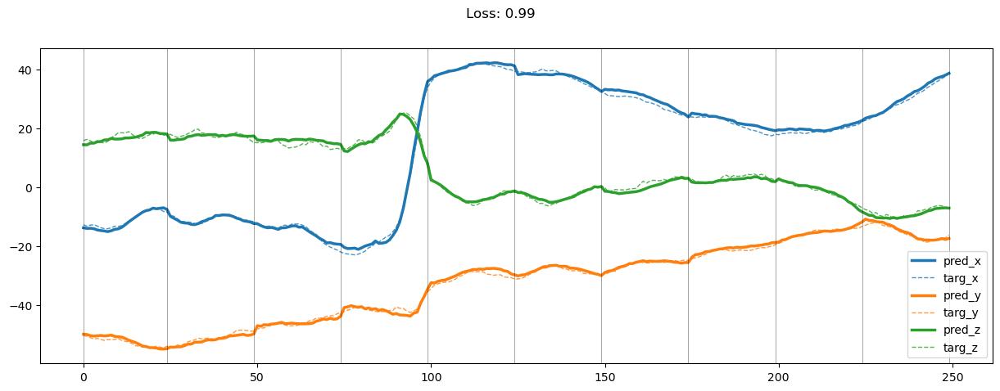

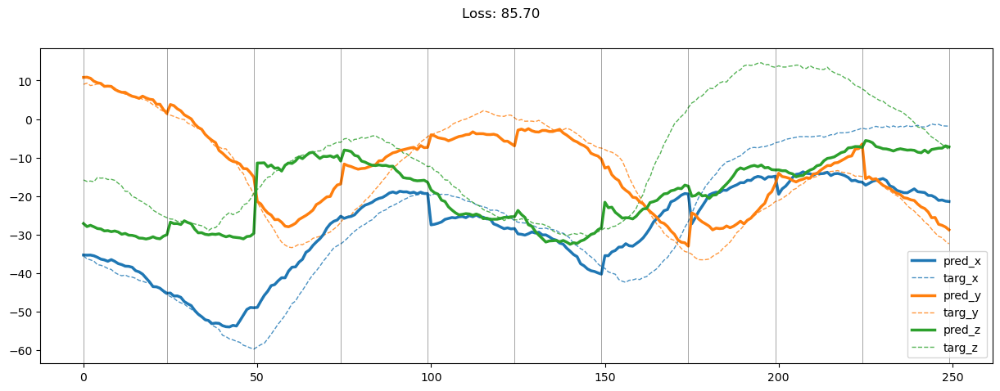

01349: train pred loss:  1.236, g loss:  9.688, diff loss:  2.431, d loss:  3.826
       valid pred loss:  164.753, g loss:  827.588, diff loss:  291.982, d loss:  3.843


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.10it/s]


01350: train pred loss:  1.207, g loss:  9.495, diff loss:  2.389, d loss:  3.857
       valid pred loss:  166.084, g loss:  838.305, diff loss:  297.255, d loss:  3.874


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.24it/s]


01351: train pred loss:  1.189, g loss:  9.370, diff loss:  2.365, d loss:  3.889
       valid pred loss:  163.971, g loss:  825.721, diff loss:  292.531, d loss:  3.907


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01352: train pred loss:  1.154, g loss:  9.095, diff loss:  2.297, d loss:  3.922
       valid pred loss:  165.781, g loss:  835.782, diff loss:  295.952, d loss:  3.941


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01353: train pred loss:  1.147, g loss:  9.014, diff loss:  2.284, d loss:  3.956
       valid pred loss:  166.734, g loss:  839.564, diff loss:  296.961, d loss:  3.975


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01354: train pred loss:  1.131, g loss:  8.823, diff loss:  2.237, d loss:  3.990
       valid pred loss:  164.891, g loss:  831.921, diff loss:  295.219, d loss:  4.010


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01355: train pred loss:  1.120, g loss:  8.717, diff loss:  2.217, d loss:  4.024
       valid pred loss:  164.743, g loss:  829.741, diff loss:  294.044, d loss:  4.043


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01356: train pred loss:  1.091, g loss:  8.257, diff loss:  2.152, d loss:  4.058
       valid pred loss:  166.879, g loss:  839.612, diff loss:  296.529, d loss:  4.074


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01357: train pred loss:  1.086, g loss:  8.038, diff loss:  2.132, d loss:  4.092
       valid pred loss:  165.753, g loss:  833.002, diff loss:  294.159, d loss:  4.108


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01358: train pred loss:  1.064, g loss:  8.057, diff loss:  2.118, d loss:  4.125
       valid pred loss:  165.879, g loss:  833.365, diff loss:  294.587, d loss:  4.140


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01359: train pred loss:  1.064, g loss:  8.085, diff loss:  2.102, d loss:  4.157
       valid pred loss:  165.508, g loss:  833.811, diff loss:  295.810, d loss:  4.172


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.58it/s]


01360: train pred loss:  1.060, g loss:  7.869, diff loss:  2.076, d loss:  4.188
       valid pred loss:  165.193, g loss:  832.907, diff loss:  295.161, d loss:  4.203


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01361: train pred loss:  1.056, g loss:  7.667, diff loss:  2.090, d loss:  4.217
       valid pred loss:  164.148, g loss:  829.579, diff loss:  295.273, d loss:  4.233


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01362: train pred loss:  1.038, g loss:  7.346, diff loss:  2.037, d loss:  4.245
       valid pred loss:  165.492, g loss:  834.378, diff loss:  296.019, d loss:  4.260


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01363: train pred loss:  1.021, g loss:  7.290, diff loss:  2.027, d loss:  4.271
       valid pred loss:  164.375, g loss:  831.018, diff loss:  295.852, d loss:  4.282


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01364: train pred loss:  0.989, g loss:  6.501, diff loss:  1.963, d loss:  4.295
       valid pred loss:  164.817, g loss:  829.552, diff loss:  293.802, d loss:  4.306


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01365: train pred loss:  0.977, g loss:  6.443, diff loss:  1.953, d loss:  4.317
       valid pred loss:  164.400, g loss:  831.440, diff loss:  296.006, d loss:  4.329


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01366: train pred loss:  0.983, g loss:  6.201, diff loss:  1.959, d loss:  4.337
       valid pred loss:  164.680, g loss:  831.657, diff loss:  295.523, d loss:  4.348


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01367: train pred loss:  0.965, g loss:  5.969, diff loss:  1.917, d loss:  4.354
       valid pred loss:  164.823, g loss:  831.288, diff loss:  294.520, d loss:  4.361


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01368: train pred loss:  0.956, g loss:  5.898, diff loss:  1.890, d loss:  4.369
       valid pred loss:  164.309, g loss:  829.302, diff loss:  294.327, d loss:  4.376


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01369: train pred loss:  0.958, g loss:  5.610, diff loss:  1.919, d loss:  4.381
       valid pred loss:  164.059, g loss:  829.191, diff loss:  294.891, d loss:  4.389


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01370: train pred loss:  0.950, g loss:  5.840, diff loss:  1.872, d loss:  4.390
       valid pred loss:  163.630, g loss:  828.027, diff loss:  295.336, d loss:  4.392


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01371: train pred loss:  0.946, g loss:  5.580, diff loss:  1.865, d loss:  4.396
       valid pred loss:  164.491, g loss:  833.978, diff loss:  297.568, d loss:  4.400


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01372: train pred loss:  0.943, g loss:  5.806, diff loss:  1.857, d loss:  4.400
       valid pred loss:  163.891, g loss:  831.022, diff loss:  296.239, d loss:  4.400


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01373: train pred loss:  0.919, g loss:  5.455, diff loss:  1.815, d loss:  4.400
       valid pred loss:  163.228, g loss:  829.271, diff loss:  296.273, d loss:  4.401


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01374: train pred loss:  0.929, g loss:  5.512, diff loss:  1.845, d loss:  4.397
       valid pred loss:  165.575, g loss:  839.031, diff loss:  298.652, d loss:  4.394


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01375: train pred loss:  0.938, g loss:  5.586, diff loss:  1.876, d loss:  4.391
       valid pred loss:  164.315, g loss:  832.394, diff loss:  296.822, d loss:  4.384


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01376: train pred loss:  0.923, g loss:  5.487, diff loss:  1.818, d loss:  4.381
       valid pred loss:  164.350, g loss:  830.737, diff loss:  295.743, d loss:  4.375


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01377: train pred loss:  0.917, g loss:  5.362, diff loss:  1.823, d loss:  4.369
       valid pred loss:  165.277, g loss:  834.066, diff loss:  296.104, d loss:  4.361


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01378: train pred loss:  0.906, g loss:  5.192, diff loss:  1.795, d loss:  4.353
       valid pred loss:  164.746, g loss:  832.964, diff loss:  296.484, d loss:  4.342


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01379: train pred loss:  0.879, g loss:  5.065, diff loss:  1.737, d loss:  4.334
       valid pred loss:  165.107, g loss:  833.869, diff loss:  296.270, d loss:  4.324


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01380: train pred loss:  0.879, g loss:  5.084, diff loss:  1.740, d loss:  4.313
       valid pred loss:  165.155, g loss:  836.081, diff loss:  297.158, d loss:  4.300


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01381: train pred loss:  0.863, g loss:  5.033, diff loss:  1.719, d loss:  4.289
       valid pred loss:  165.764, g loss:  838.973, diff loss:  298.049, d loss:  4.273


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.26it/s]


01382: train pred loss:  0.869, g loss:  5.074, diff loss:  1.722, d loss:  4.261
       valid pred loss:  166.417, g loss:  840.900, diff loss:  298.122, d loss:  4.246


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01383: train pred loss:  0.867, g loss:  5.081, diff loss:  1.713, d loss:  4.232
       valid pred loss:  166.114, g loss:  837.087, diff loss:  296.047, d loss:  4.215


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01384: train pred loss:  0.874, g loss:  5.149, diff loss:  1.735, d loss:  4.200
       valid pred loss:  167.419, g loss:  842.322, diff loss:  297.578, d loss:  4.182


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01385: train pred loss:  0.870, g loss:  5.154, diff loss:  1.723, d loss:  4.166
       valid pred loss:  167.426, g loss:  844.883, diff loss:  298.719, d loss:  4.147


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01386: train pred loss:  0.862, g loss:  5.154, diff loss:  1.719, d loss:  4.131
       valid pred loss:  166.787, g loss:  843.803, diff loss:  298.973, d loss:  4.110


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01387: train pred loss:  0.854, g loss:  5.148, diff loss:  1.703, d loss:  4.094
       valid pred loss:  166.271, g loss:  841.042, diff loss:  298.721, d loss:  4.072


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01388: train pred loss:  0.856, g loss:  5.160, diff loss:  1.677, d loss:  4.056
       valid pred loss:  167.464, g loss:  843.585, diff loss:  298.811, d loss:  4.037


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.97it/s]


01389: train pred loss:  0.857, g loss:  5.219, diff loss:  1.695, d loss:  4.018
       valid pred loss:  167.127, g loss:  844.278, diff loss:  299.503, d loss:  3.997


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01390: train pred loss:  0.848, g loss:  5.220, diff loss:  1.683, d loss:  3.979
       valid pred loss:  167.510, g loss:  843.368, diff loss:  297.787, d loss:  3.958


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.35it/s]


01391: train pred loss:  0.837, g loss:  5.203, diff loss:  1.661, d loss:  3.940
       valid pred loss:  166.919, g loss:  841.928, diff loss:  297.380, d loss:  3.919


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01392: train pred loss:  0.853, g loss:  5.322, diff loss:  1.690, d loss:  3.902
       valid pred loss:  167.359, g loss:  842.445, diff loss:  297.016, d loss:  3.881


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01393: train pred loss:  0.836, g loss:  5.290, diff loss:  1.668, d loss:  3.864
       valid pred loss:  165.042, g loss:  831.365, diff loss:  294.171, d loss:  3.847


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01394: train pred loss:  0.838, g loss:  5.348, diff loss:  1.677, d loss:  3.829
       valid pred loss:  166.998, g loss:  838.597, diff loss:  295.542, d loss:  3.810


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


01395: train pred loss:  0.849, g loss:  5.433, diff loss:  1.690, d loss:  3.795
       valid pred loss:  167.463, g loss:  841.896, diff loss:  296.758, d loss:  3.778


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01396: train pred loss:  0.842, g loss:  5.439, diff loss:  1.678, d loss:  3.763
       valid pred loss:  166.692, g loss:  841.277, diff loss:  297.933, d loss:  3.746


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01397: train pred loss:  0.833, g loss:  5.431, diff loss:  1.657, d loss:  3.733
       valid pred loss:  167.968, g loss:  846.367, diff loss:  298.474, d loss:  3.721


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01398: train pred loss:  0.847, g loss:  5.522, diff loss:  1.672, d loss:  3.708
       valid pred loss:  166.631, g loss:  843.419, diff loss:  298.548, d loss:  3.694


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


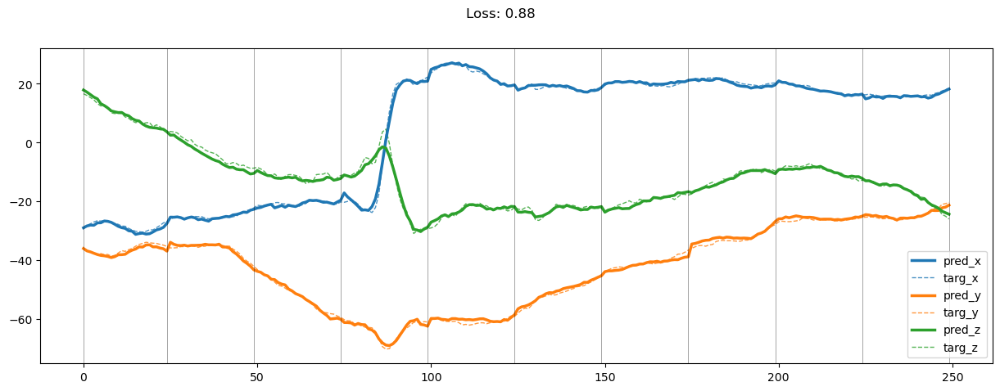

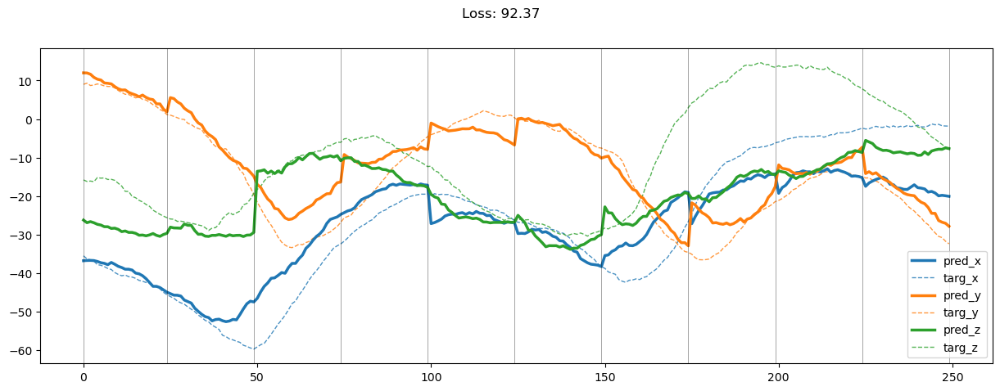

01399: train pred loss:  0.843, g loss:  5.528, diff loss:  1.659, d loss:  3.685
       valid pred loss:  164.617, g loss:  832.510, diff loss:  295.784, d loss:  3.673


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


01400: train pred loss:  0.824, g loss:  5.491, diff loss:  1.654, d loss:  3.667
       valid pred loss:  166.618, g loss:  842.329, diff loss:  298.419, d loss:  3.659


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01401: train pred loss:  0.829, g loss:  5.527, diff loss:  1.656, d loss:  3.653
       valid pred loss:  166.638, g loss:  841.605, diff loss:  297.992, d loss:  3.646


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.66it/s]


01402: train pred loss:  0.821, g loss:  5.492, diff loss:  1.632, d loss:  3.643
       valid pred loss:  165.281, g loss:  837.853, diff loss:  297.215, d loss:  3.640


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01403: train pred loss:  0.831, g loss:  5.548, diff loss:  1.651, d loss:  3.639
       valid pred loss:  165.517, g loss:  838.739, diff loss:  297.510, d loss:  3.636


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01404: train pred loss:  0.827, g loss:  5.528, diff loss:  1.642, d loss:  3.639
       valid pred loss:  166.076, g loss:  842.304, diff loss:  299.037, d loss:  3.642


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01405: train pred loss:  0.824, g loss:  5.506, diff loss:  1.638, d loss:  3.645
       valid pred loss:  165.862, g loss:  840.417, diff loss:  298.307, d loss:  3.651


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01406: train pred loss:  0.800, g loss:  5.383, diff loss:  1.602, d loss:  3.655
       valid pred loss:  166.473, g loss:  842.809, diff loss:  298.816, d loss:  3.664


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01407: train pred loss:  0.814, g loss:  5.404, diff loss:  1.605, d loss:  3.671
       valid pred loss:  165.225, g loss:  838.998, diff loss:  298.821, d loss:  3.681


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.42it/s]


01408: train pred loss:  0.802, g loss:  5.334, diff loss:  1.599, d loss:  3.692
       valid pred loss:  165.238, g loss:  838.429, diff loss:  298.009, d loss:  3.706


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.86it/s]


01409: train pred loss:  0.787, g loss:  5.217, diff loss:  1.560, d loss:  3.717
       valid pred loss:  166.149, g loss:  839.308, diff loss:  296.876, d loss:  3.731


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01410: train pred loss:  0.804, g loss:  5.251, diff loss:  1.583, d loss:  3.747
       valid pred loss:  165.153, g loss:  833.916, diff loss:  295.056, d loss:  3.763


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01411: train pred loss:  0.808, g loss:  5.219, diff loss:  1.582, d loss:  3.780
       valid pred loss:  165.549, g loss:  835.775, diff loss:  295.836, d loss:  3.799


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.80it/s]


01412: train pred loss:  0.814, g loss:  5.206, diff loss:  1.596, d loss:  3.817
       valid pred loss:  164.841, g loss:  834.563, diff loss:  296.396, d loss:  3.837


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01413: train pred loss:  0.799, g loss:  5.094, diff loss:  1.573, d loss:  3.856
       valid pred loss:  164.887, g loss:  834.294, diff loss:  295.991, d loss:  3.878


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01414: train pred loss:  0.791, g loss:  4.997, diff loss:  1.548, d loss:  3.897
       valid pred loss:  165.028, g loss:  835.508, diff loss:  297.221, d loss:  3.920


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.11it/s]


01415: train pred loss:  0.790, g loss:  4.990, diff loss:  1.588, d loss:  3.939
       valid pred loss:  164.729, g loss:  834.110, diff loss:  296.040, d loss:  3.963


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.32it/s]


01416: train pred loss:  0.796, g loss:  4.956, diff loss:  1.581, d loss:  3.982
       valid pred loss:  166.356, g loss:  841.842, diff loss:  298.702, d loss:  4.004


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.84it/s]


01417: train pred loss:  0.797, g loss:  4.907, diff loss:  1.571, d loss:  4.026
       valid pred loss:  165.283, g loss:  838.189, diff loss:  298.391, d loss:  4.048


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.04it/s]


01418: train pred loss:  0.814, g loss:  5.053, diff loss:  1.596, d loss:  4.069
       valid pred loss:  165.227, g loss:  841.372, diff loss:  300.269, d loss:  4.091


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.16it/s]


01419: train pred loss:  0.816, g loss:  4.936, diff loss:  1.624, d loss:  4.111
       valid pred loss:  163.111, g loss:  831.333, diff loss:  297.445, d loss:  4.132


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01420: train pred loss:  0.819, g loss:  4.891, diff loss:  1.604, d loss:  4.152
       valid pred loss:  166.081, g loss:  841.105, diff loss:  298.897, d loss:  4.175


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.55it/s]


01421: train pred loss:  0.799, g loss:  4.754, diff loss:  1.561, d loss:  4.192
       valid pred loss:  164.299, g loss:  833.720, diff loss:  296.819, d loss:  4.213


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


01422: train pred loss:  0.796, g loss:  4.729, diff loss:  1.571, d loss:  4.229
       valid pred loss:  164.635, g loss:  833.733, diff loss:  296.571, d loss:  4.249


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01423: train pred loss:  0.786, g loss:  4.663, diff loss:  1.562, d loss:  4.264
       valid pred loss:  164.558, g loss:  835.143, diff loss:  297.511, d loss:  4.281


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01424: train pred loss:  0.780, g loss:  4.592, diff loss:  1.535, d loss:  4.296
       valid pred loss:  166.402, g loss:  843.061, diff loss:  299.870, d loss:  4.311


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01425: train pred loss:  0.785, g loss:  4.611, diff loss:  1.558, d loss:  4.325
       valid pred loss:  165.464, g loss:  842.944, diff loss:  301.891, d loss:  4.339


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01426: train pred loss:  0.771, g loss:  4.526, diff loss:  1.532, d loss:  4.349
       valid pred loss:  165.914, g loss:  842.747, diff loss:  300.684, d loss:  4.363


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.49it/s]


01427: train pred loss:  0.764, g loss:  4.475, diff loss:  1.518, d loss:  4.371
       valid pred loss:  165.146, g loss:  837.391, diff loss:  298.695, d loss:  4.380


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01428: train pred loss:  0.772, g loss:  4.499, diff loss:  1.528, d loss:  4.389
       valid pred loss:  166.814, g loss:  843.895, diff loss:  299.405, d loss:  4.397


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01429: train pred loss:  0.759, g loss:  4.430, diff loss:  1.507, d loss:  4.402
       valid pred loss:  166.539, g loss:  845.674, diff loss:  301.375, d loss:  4.407


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.14it/s]


01430: train pred loss:  0.781, g loss:  4.531, diff loss:  1.548, d loss:  4.410
       valid pred loss:  165.863, g loss:  841.865, diff loss:  299.807, d loss:  4.415


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01431: train pred loss:  0.763, g loss:  4.454, diff loss:  1.528, d loss:  4.414
       valid pred loss:  164.883, g loss:  837.315, diff loss:  298.764, d loss:  4.415


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01432: train pred loss:  0.770, g loss:  4.474, diff loss:  1.527, d loss:  4.414
       valid pred loss:  165.584, g loss:  839.609, diff loss:  298.654, d loss:  4.411


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


01433: train pred loss:  0.752, g loss:  4.381, diff loss:  1.484, d loss:  4.409
       valid pred loss:  165.189, g loss:  839.470, diff loss:  298.869, d loss:  4.406


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01434: train pred loss:  0.755, g loss:  4.395, diff loss:  1.484, d loss:  4.399
       valid pred loss:  165.278, g loss:  839.726, diff loss:  299.154, d loss:  4.391


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01435: train pred loss:  0.776, g loss:  4.498, diff loss:  1.513, d loss:  4.384
       valid pred loss:  167.454, g loss:  817.491, diff loss:  301.915, d loss:  4.377


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.08it/s]


01436: train pred loss:  0.776, g loss:  4.634, diff loss:  1.530, d loss:  4.365
       valid pred loss:  166.458, g loss:  812.010, diff loss:  299.690, d loss:  4.352


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01437: train pred loss:  0.803, g loss:  4.682, diff loss:  1.587, d loss:  4.341
       valid pred loss:  167.028, g loss:  814.369, diff loss:  300.297, d loss:  4.325


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01438: train pred loss:  0.776, g loss:  4.573, diff loss:  1.538, d loss:  4.312
       valid pred loss:  167.240, g loss:  817.815, diff loss:  303.253, d loss:  4.297


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01439: train pred loss:  0.769, g loss:  4.557, diff loss:  1.520, d loss:  4.280
       valid pred loss:  166.013, g loss:  812.374, diff loss:  301.032, d loss:  4.262


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01440: train pred loss:  0.757, g loss:  4.525, diff loss:  1.499, d loss:  4.244
       valid pred loss:  164.784, g loss:  807.769, diff loss:  300.621, d loss:  4.223


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01441: train pred loss:  0.765, g loss:  4.582, diff loss:  1.500, d loss:  4.204
       valid pred loss:  166.355, g loss:  811.613, diff loss:  299.597, d loss:  4.183


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.25it/s]


01442: train pred loss:  0.758, g loss:  4.564, diff loss:  1.470, d loss:  4.162
       valid pred loss:  164.776, g loss:  834.651, diff loss:  296.473, d loss:  4.139


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01443: train pred loss:  0.768, g loss:  4.684, diff loss:  1.521, d loss:  4.117
       valid pred loss:  166.523, g loss:  814.540, diff loss:  301.970, d loss:  4.093


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.24it/s]


01444: train pred loss:  0.765, g loss:  4.686, diff loss:  1.493, d loss:  4.072
       valid pred loss:  166.672, g loss:  814.828, diff loss:  301.967, d loss:  4.048


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01445: train pred loss:  0.762, g loss:  4.738, diff loss:  1.508, d loss:  4.024
       valid pred loss:  165.633, g loss:  809.035, diff loss:  298.895, d loss:  4.000


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01446: train pred loss:  0.753, g loss:  4.748, diff loss:  1.497, d loss:  3.976
       valid pred loss:  166.407, g loss:  813.834, diff loss:  301.369, d loss:  3.950


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01447: train pred loss:  0.734, g loss:  4.702, diff loss:  1.458, d loss:  3.929
       valid pred loss:  165.519, g loss:  839.090, diff loss:  297.619, d loss:  3.903


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.29it/s]


01448: train pred loss:  0.744, g loss:  4.801, diff loss:  1.478, d loss:  3.881
       valid pred loss:  167.949, g loss:  820.169, diff loss:  302.923, d loss:  3.857


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


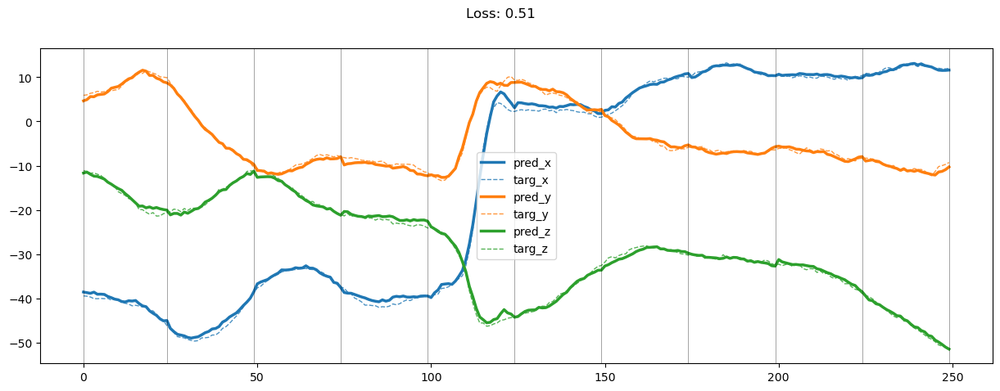

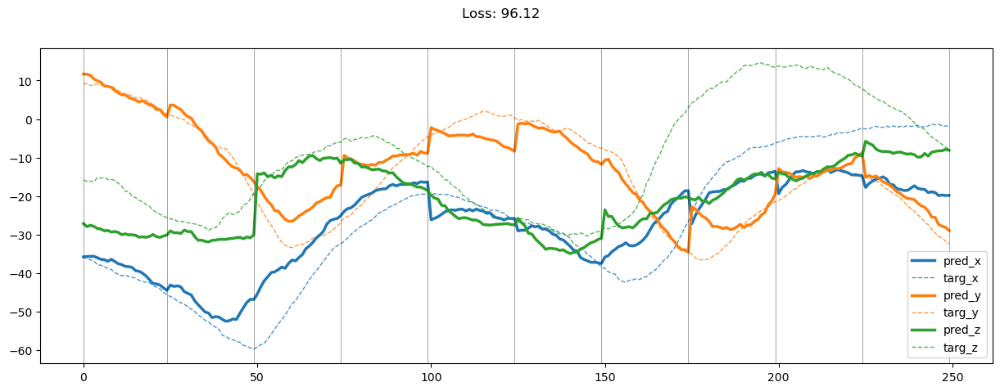

01449: train pred loss:  0.749, g loss:  5.042, diff loss:  1.508, d loss:  3.836
       valid pred loss:  166.346, g loss:  813.379, diff loss:  300.828, d loss:  3.814


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


01450: train pred loss:  0.772, g loss:  5.067, diff loss:  1.556, d loss:  3.793
       valid pred loss:  166.736, g loss:  847.661, diff loss:  301.950, d loss:  3.770


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


01451: train pred loss:  0.773, g loss:  5.090, diff loss:  1.525, d loss:  3.753
       valid pred loss:  164.073, g loss:  835.295, diff loss:  297.781, d loss:  3.733


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


01452: train pred loss:  0.769, g loss:  5.106, diff loss:  1.507, d loss:  3.716
       valid pred loss:  165.393, g loss:  839.684, diff loss:  298.717, d loss:  3.698


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01453: train pred loss:  0.750, g loss:  5.057, diff loss:  1.472, d loss:  3.684
       valid pred loss:  166.851, g loss:  815.693, diff loss:  300.886, d loss:  3.670


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.51it/s]


01454: train pred loss:  0.749, g loss:  5.106, diff loss:  1.487, d loss:  3.657
       valid pred loss:  168.067, g loss:  822.748, diff loss:  304.391, d loss:  3.644


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.28it/s]


01455: train pred loss:  0.737, g loss:  5.075, diff loss:  1.460, d loss:  3.636
       valid pred loss:  165.521, g loss:  841.026, diff loss:  298.637, d loss:  3.629


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


01456: train pred loss:  0.757, g loss:  5.194, diff loss:  1.497, d loss:  3.620
       valid pred loss:  166.405, g loss:  842.807, diff loss:  298.968, d loss:  3.615


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


01457: train pred loss:  0.730, g loss:  5.076, diff loss:  1.448, d loss:  3.612
       valid pred loss:  168.109, g loss:  850.742, diff loss:  300.883, d loss:  3.611


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


01458: train pred loss:  0.746, g loss:  5.149, diff loss:  1.472, d loss:  3.611
       valid pred loss:  166.615, g loss:  843.713, diff loss:  298.763, d loss:  3.611


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.01it/s]


01459: train pred loss:  0.741, g loss:  5.115, diff loss:  1.461, d loss:  3.616
       valid pred loss:  166.202, g loss:  842.311, diff loss:  297.782, d loss:  3.622


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.05it/s]


01460: train pred loss:  0.761, g loss:  5.180, diff loss:  1.485, d loss:  3.630
       valid pred loss:  166.227, g loss:  843.088, diff loss:  298.723, d loss:  3.641


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01461: train pred loss:  0.764, g loss:  5.189, diff loss:  1.513, d loss:  3.650
       valid pred loss:  165.711, g loss:  810.741, diff loss:  299.283, d loss:  3.663


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01462: train pred loss:  0.751, g loss:  5.081, diff loss:  1.484, d loss:  3.677
       valid pred loss:  164.587, g loss:  838.566, diff loss:  298.575, d loss:  3.693


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01463: train pred loss:  0.743, g loss:  5.007, diff loss:  1.477, d loss:  3.709
       valid pred loss:  165.301, g loss:  839.493, diff loss:  298.213, d loss:  3.730


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01464: train pred loss:  0.743, g loss:  5.087, diff loss:  1.478, d loss:  3.748
       valid pred loss:  163.741, g loss:  832.334, diff loss:  296.057, d loss:  3.771


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01465: train pred loss:  0.766, g loss:  5.009, diff loss:  1.515, d loss:  3.791
       valid pred loss:  167.191, g loss:  818.274, diff loss:  302.792, d loss:  3.817


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01466: train pred loss:  0.756, g loss:  4.901, diff loss:  1.494, d loss:  3.838
       valid pred loss:  167.084, g loss:  814.924, diff loss:  300.100, d loss:  3.863


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01467: train pred loss:  0.762, g loss:  4.888, diff loss:  1.519, d loss:  3.888
       valid pred loss:  166.867, g loss:  814.849, diff loss:  300.532, d loss:  3.915


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.95it/s]


01468: train pred loss:  0.764, g loss:  4.823, diff loss:  1.504, d loss:  3.940
       valid pred loss:  164.244, g loss:  833.023, diff loss:  295.479, d loss:  3.967


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01469: train pred loss:  0.751, g loss:  4.720, diff loss:  1.493, d loss:  3.992
       valid pred loss:  166.744, g loss:  812.718, diff loss:  298.579, d loss:  4.020


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.11it/s]


01470: train pred loss:  0.735, g loss:  4.571, diff loss:  1.445, d loss:  4.045
       valid pred loss:  167.212, g loss:  815.755, diff loss:  299.923, d loss:  4.073


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01471: train pred loss:  0.753, g loss:  4.607, diff loss:  1.472, d loss:  4.096
       valid pred loss:  164.121, g loss:  832.421, diff loss:  295.816, d loss:  4.125


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01472: train pred loss:  0.749, g loss:  4.552, diff loss:  1.473, d loss:  4.147
       valid pred loss:  163.872, g loss:  832.332, diff loss:  296.445, d loss:  4.173


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01473: train pred loss:  0.734, g loss:  4.449, diff loss:  1.455, d loss:  4.195
       valid pred loss:  164.843, g loss:  835.424, diff loss:  296.908, d loss:  4.218


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01474: train pred loss:  0.731, g loss:  4.412, diff loss:  1.463, d loss:  4.240
       valid pred loss:  164.170, g loss:  836.094, diff loss:  297.806, d loss:  4.262


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.07it/s]


01475: train pred loss:  0.739, g loss:  4.390, diff loss:  1.448, d loss:  4.282
       valid pred loss:  164.817, g loss:  831.469, diff loss:  294.378, d loss:  4.303


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01476: train pred loss:  0.734, g loss:  4.372, diff loss:  1.473, d loss:  4.319
       valid pred loss:  165.737, g loss:  837.814, diff loss:  296.740, d loss:  4.337


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


01477: train pred loss:  0.742, g loss:  4.361, diff loss:  1.460, d loss:  4.353
       valid pred loss:  166.531, g loss:  843.708, diff loss:  298.919, d loss:  4.368


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


01478: train pred loss:  0.742, g loss:  4.368, diff loss:  1.486, d loss:  4.381
       valid pred loss:  164.333, g loss:  836.644, diff loss:  298.103, d loss:  4.394


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01479: train pred loss:  0.743, g loss:  4.337, diff loss:  1.467, d loss:  4.404
       valid pred loss:  163.580, g loss:  830.548, diff loss:  294.593, d loss:  4.414


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01480: train pred loss:  0.736, g loss:  4.295, diff loss:  1.458, d loss:  4.422
       valid pred loss:  164.103, g loss:  832.493, diff loss:  295.822, d loss:  4.430


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01481: train pred loss:  0.733, g loss:  4.271, diff loss:  1.450, d loss:  4.434
       valid pred loss:  165.395, g loss:  838.429, diff loss:  297.935, d loss:  4.437


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01482: train pred loss:  0.729, g loss:  4.256, diff loss:  1.449, d loss:  4.439
       valid pred loss:  166.039, g loss:  842.103, diff loss:  298.422, d loss:  4.442


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01483: train pred loss:  0.745, g loss:  4.332, diff loss:  1.477, d loss:  4.438
       valid pred loss:  166.044, g loss:  841.616, diff loss:  298.299, d loss:  4.436


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.21it/s]


01484: train pred loss:  0.735, g loss:  4.266, diff loss:  1.439, d loss:  4.431
       valid pred loss:  166.874, g loss:  845.853, diff loss:  300.073, d loss:  4.426


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.38it/s]


01485: train pred loss:  0.713, g loss:  4.187, diff loss:  1.417, d loss:  4.418
       valid pred loss:  167.720, g loss:  818.910, diff loss:  302.087, d loss:  4.408


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.27it/s]


01486: train pred loss:  0.727, g loss:  4.272, diff loss:  1.449, d loss:  4.398
       valid pred loss:  165.935, g loss:  813.858, diff loss:  302.288, d loss:  4.387


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01487: train pred loss:  0.711, g loss:  4.214, diff loss:  1.420, d loss:  4.373
       valid pred loss:  167.944, g loss:  822.568, diff loss:  305.360, d loss:  4.357


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01488: train pred loss:  0.731, g loss:  4.315, diff loss:  1.441, d loss:  4.341
       valid pred loss:  166.485, g loss:  816.264, diff loss:  303.313, d loss:  4.321


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.56it/s]


01489: train pred loss:  0.725, g loss:  4.304, diff loss:  1.421, d loss:  4.304
       valid pred loss:  166.720, g loss:  815.529, diff loss:  302.065, d loss:  4.281


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


01490: train pred loss:  0.733, g loss:  4.394, diff loss:  1.456, d loss:  4.261
       valid pred loss:  164.851, g loss:  807.734, diff loss:  299.785, d loss:  4.237


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01491: train pred loss:  0.732, g loss:  4.408, diff loss:  1.437, d loss:  4.215
       valid pred loss:  164.354, g loss:  838.165, diff loss:  298.787, d loss:  4.189


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01492: train pred loss:  0.743, g loss:  4.507, diff loss:  1.463, d loss:  4.165
       valid pred loss:  167.509, g loss:  818.189, diff loss:  302.120, d loss:  4.138


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.21it/s]


01493: train pred loss:  0.724, g loss:  4.467, diff loss:  1.435, d loss:  4.112
       valid pred loss:  165.440, g loss:  842.977, diff loss:  300.116, d loss:  4.084


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.76it/s]


01494: train pred loss:  0.730, g loss:  4.535, diff loss:  1.436, d loss:  4.057
       valid pred loss:  166.505, g loss:  815.886, diff loss:  302.540, d loss:  4.029


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.37it/s]


01495: train pred loss:  0.710, g loss:  4.491, diff loss:  1.399, d loss:  4.001
       valid pred loss:  167.512, g loss:  819.674, diff loss:  303.007, d loss:  3.970


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.32it/s]


01496: train pred loss:  0.758, g loss:  4.771, diff loss:  1.479, d loss:  3.945
       valid pred loss:  165.702, g loss:  812.087, diff loss:  301.269, d loss:  3.916


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01497: train pred loss:  0.742, g loss:  4.768, diff loss:  1.463, d loss:  3.889
       valid pred loss:  163.919, g loss:  834.937, diff loss:  297.886, d loss:  3.860


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01498: train pred loss:  0.713, g loss:  4.691, diff loss:  1.413, d loss:  3.835
       valid pred loss:  169.287, g loss:  826.070, diff loss:  304.188, d loss:  3.805


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


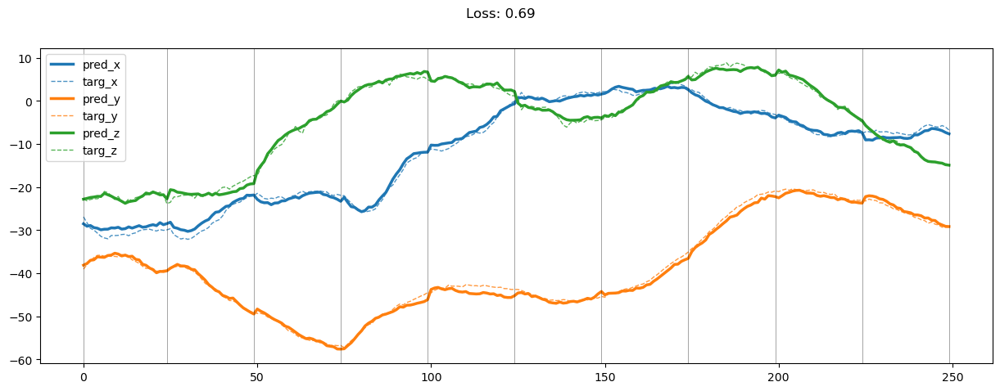

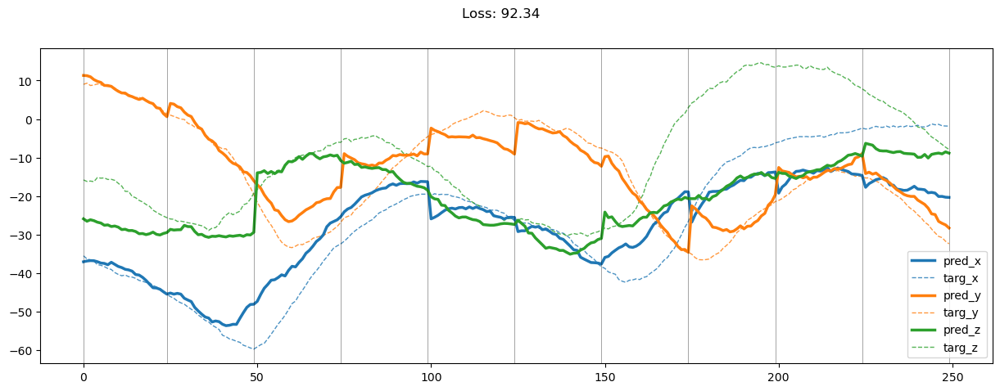

01499: train pred loss:  0.711, g loss:  4.738, diff loss:  1.405, d loss:  3.783
       valid pred loss:  166.256, g loss:  816.209, diff loss:  303.090, d loss:  3.758


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.09it/s]


01500: train pred loss:  0.717, g loss:  4.820, diff loss:  1.409, d loss:  3.736
       valid pred loss:  164.074, g loss:  838.932, diff loss:  299.863, d loss:  3.712


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


01501: train pred loss:  0.715, g loss:  4.875, diff loss:  1.413, d loss:  3.693
       valid pred loss:  165.907, g loss:  813.959, diff loss:  302.148, d loss:  3.671


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01502: train pred loss:  0.713, g loss:  4.903, diff loss:  1.396, d loss:  3.655
       valid pred loss:  166.082, g loss:  844.851, diff loss:  301.310, d loss:  3.639


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01503: train pred loss:  0.725, g loss:  5.010, diff loss:  1.421, d loss:  3.625
       valid pred loss:  164.955, g loss:  836.099, diff loss:  296.950, d loss:  3.610


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01504: train pred loss:  0.724, g loss:  5.035, diff loss:  1.418, d loss:  3.602
       valid pred loss:  166.700, g loss:  844.291, diff loss:  298.695, d loss:  3.593


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.15it/s]


01505: train pred loss:  0.731, g loss:  5.107, diff loss:  1.447, d loss:  3.587
       valid pred loss:  165.098, g loss:  838.313, diff loss:  296.799, d loss:  3.583


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01506: train pred loss:  0.721, g loss:  5.082, diff loss:  1.439, d loss:  3.581
       valid pred loss:  166.138, g loss:  842.100, diff loss:  297.618, d loss:  3.579


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01507: train pred loss:  0.715, g loss:  5.019, diff loss:  1.399, d loss:  3.583
       valid pred loss:  166.537, g loss:  845.946, diff loss:  300.209, d loss:  3.589


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.32it/s]


01508: train pred loss:  0.713, g loss:  5.017, diff loss:  1.421, d loss:  3.596
       valid pred loss:  166.512, g loss:  815.140, diff loss:  301.019, d loss:  3.605


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01509: train pred loss:  0.723, g loss:  5.028, diff loss:  1.435, d loss:  3.617
       valid pred loss:  168.306, g loss:  823.219, diff loss:  303.835, d loss:  3.632


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


01510: train pred loss:  0.718, g loss:  4.947, diff loss:  1.414, d loss:  3.647
       valid pred loss:  166.733, g loss:  818.702, diff loss:  304.040, d loss:  3.666


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.48it/s]


01511: train pred loss:  0.725, g loss:  4.928, diff loss:  1.426, d loss:  3.685
       valid pred loss:  167.512, g loss:  824.243, diff loss:  307.455, d loss:  3.709


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01512: train pred loss:  0.709, g loss:  4.782, diff loss:  1.390, d loss:  3.730
       valid pred loss:  167.916, g loss:  825.309, diff loss:  307.192, d loss:  3.758


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01513: train pred loss:  0.720, g loss:  4.777, diff loss:  1.417, d loss:  3.781
       valid pred loss:  166.010, g loss:  816.576, diff loss:  304.272, d loss:  3.809


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01514: train pred loss:  0.716, g loss:  4.700, diff loss:  1.415, d loss:  3.837
       valid pred loss:  166.680, g loss:  819.041, diff loss:  304.413, d loss:  3.867


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01515: train pred loss:  0.717, g loss:  4.624, diff loss:  1.404, d loss:  3.895
       valid pred loss:  168.588, g loss:  825.027, diff loss:  304.816, d loss:  3.926


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01516: train pred loss:  0.717, g loss:  4.718, diff loss:  1.424, d loss:  3.956
       valid pred loss:  166.598, g loss:  815.624, diff loss:  301.663, d loss:  3.989


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01517: train pred loss:  0.887, g loss:  5.624, diff loss:  1.723, d loss:  4.017
       valid pred loss:  167.266, g loss:  849.981, diff loss:  302.044, d loss:  4.050


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01518: train pred loss:  0.909, g loss:  5.738, diff loss:  1.780, d loss:  4.078
       valid pred loss:  167.771, g loss:  845.166, diff loss:  296.962, d loss:  4.110


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01519: train pred loss:  1.044, g loss:  6.940, diff loss:  1.972, d loss:  4.137
       valid pred loss:  166.081, g loss:  841.812, diff loss:  299.232, d loss:  4.169


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01520: train pred loss:  0.984, g loss:  6.429, diff loss:  1.886, d loss:  4.194
       valid pred loss:  168.114, g loss:  849.250, diff loss:  300.021, d loss:  4.222


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01521: train pred loss:  1.018, g loss:  6.887, diff loss:  1.902, d loss:  4.247
       valid pred loss:  169.176, g loss:  823.291, diff loss:  302.540, d loss:  4.274


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


01522: train pred loss:  1.018, g loss:  7.074, diff loss:  1.956, d loss:  4.296
       valid pred loss:  169.283, g loss:  854.501, diff loss:  300.898, d loss:  4.322


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01523: train pred loss:  1.013, g loss:  6.839, diff loss:  1.961, d loss:  4.340
       valid pred loss:  169.712, g loss:  828.625, diff loss:  305.535, d loss:  4.363


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01524: train pred loss:  1.062, g loss:  7.396, diff loss:  2.003, d loss:  4.379
       valid pred loss:  173.579, g loss:  847.002, diff loss:  312.383, d loss:  4.398


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.53it/s]


01525: train pred loss:  1.101, g loss:  7.664, diff loss:  2.113, d loss:  4.412
       valid pred loss:  168.049, g loss:  819.381, diff loss:  301.070, d loss:  4.426


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.17it/s]


01526: train pred loss:  1.053, g loss:  7.536, diff loss:  2.066, d loss:  4.438
       valid pred loss:  166.082, g loss:  816.263, diff loss:  303.825, d loss:  4.450


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.25it/s]


01527: train pred loss:  1.030, g loss:  6.765, diff loss:  1.956, d loss:  4.457
       valid pred loss:  164.451, g loss:  805.187, diff loss:  297.739, d loss:  4.464


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.74it/s]


01528: train pred loss:  0.945, g loss:  5.672, diff loss:  1.803, d loss:  4.469
       valid pred loss:  171.335, g loss:  835.864, diff loss:  307.904, d loss:  4.471


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.01it/s]


01529: train pred loss:  0.887, g loss:  5.273, diff loss:  1.691, d loss:  4.473
       valid pred loss:  165.260, g loss:  807.845, diff loss:  298.144, d loss:  4.471


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.31it/s]


01530: train pred loss:  0.786, g loss:  4.517, diff loss:  1.560, d loss:  4.469
       valid pred loss:  166.219, g loss:  814.214, diff loss:  301.671, d loss:  4.464


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01531: train pred loss:  0.742, g loss:  4.287, diff loss:  1.456, d loss:  4.457
       valid pred loss:  163.958, g loss:  837.247, diff loss:  298.400, d loss:  4.449


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01532: train pred loss:  0.729, g loss:  4.236, diff loss:  1.435, d loss:  4.438
       valid pred loss:  164.707, g loss:  806.403, diff loss:  298.853, d loss:  4.423


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01533: train pred loss:  0.711, g loss:  4.162, diff loss:  1.395, d loss:  4.410
       valid pred loss:  164.762, g loss:  833.380, diff loss:  294.271, d loss:  4.393


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01534: train pred loss:  0.712, g loss:  4.183, diff loss:  1.393, d loss:  4.376
       valid pred loss:  164.045, g loss:  834.175, diff loss:  295.796, d loss:  4.355


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01535: train pred loss:  0.707, g loss:  4.199, diff loss:  1.395, d loss:  4.335
       valid pred loss:  164.008, g loss:  833.213, diff loss:  295.037, d loss:  4.310


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01536: train pred loss:  0.688, g loss:  4.132, diff loss:  1.352, d loss:  4.287
       valid pred loss:  166.230, g loss:  812.581, diff loss:  300.159, d loss:  4.260


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.62it/s]


01537: train pred loss:  0.701, g loss:  4.228, diff loss:  1.368, d loss:  4.234
       valid pred loss:  165.733, g loss:  809.221, diff loss:  298.494, d loss:  4.206


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.35it/s]


01538: train pred loss:  0.708, g loss:  4.311, diff loss:  1.387, d loss:  4.177
       valid pred loss:  164.393, g loss:  801.199, diff loss:  294.688, d loss:  4.145


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01539: train pred loss:  0.709, g loss:  4.355, diff loss:  1.377, d loss:  4.116
       valid pred loss:  166.019, g loss:  805.233, diff loss:  293.508, d loss:  4.082


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.17it/s]


01540: train pred loss:  0.710, g loss:  4.424, diff loss:  1.383, d loss:  4.053
       valid pred loss:  163.325, g loss:  827.626, diff loss:  292.351, d loss:  4.020


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01541: train pred loss:  0.713, g loss:  4.499, diff loss:  1.389, d loss:  3.988
       valid pred loss:  166.014, g loss:  841.750, diff loss:  297.183, d loss:  3.953


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01542: train pred loss:  0.708, g loss:  4.577, diff loss:  1.418, d loss:  3.924
       valid pred loss:  165.971, g loss:  805.746, diff loss:  294.067, d loss:  3.889


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01543: train pred loss:  0.709, g loss:  4.654, diff loss:  1.421, d loss:  3.860
       valid pred loss:  167.670, g loss:  847.653, diff loss:  297.779, d loss:  3.828


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.53it/s]


01544: train pred loss:  0.711, g loss:  4.726, diff loss:  1.415, d loss:  3.799
       valid pred loss:  167.773, g loss:  816.996, diff loss:  299.336, d loss:  3.767


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.39it/s]


01545: train pred loss:  0.708, g loss:  4.765, diff loss:  1.393, d loss:  3.742
       valid pred loss:  169.912, g loss:  825.124, diff loss:  301.105, d loss:  3.714


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.47it/s]


01546: train pred loss:  0.701, g loss:  4.814, diff loss:  1.394, d loss:  3.690
       valid pred loss:  169.808, g loss:  823.475, diff loss:  299.858, d loss:  3.663


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.17it/s]


01547: train pred loss:  0.696, g loss:  4.847, diff loss:  1.378, d loss:  3.644
       valid pred loss:  166.517, g loss:  811.201, diff loss:  297.981, d loss:  3.622


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.53it/s]


01548: train pred loss:  0.695, g loss:  4.896, diff loss:  1.373, d loss:  3.606
       valid pred loss:  166.926, g loss:  846.295, diff loss:  298.480, d loss:  3.587


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


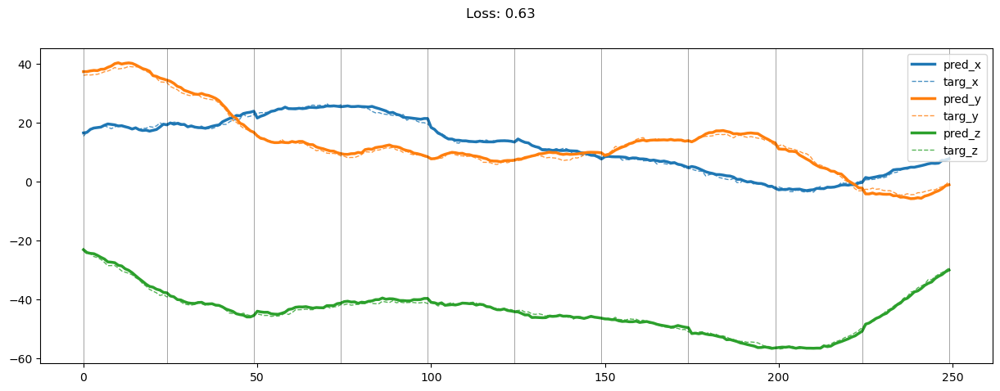

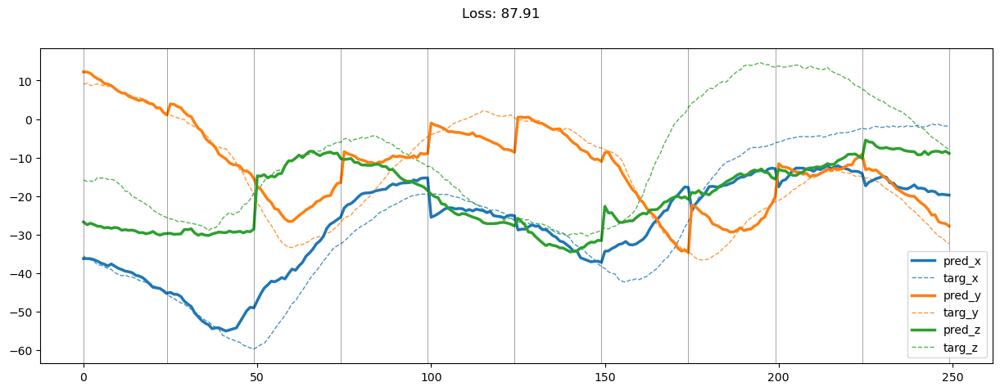

01549: train pred loss:  0.678, g loss:  4.862, diff loss:  1.346, d loss:  3.577
       valid pred loss:  166.189, g loss:  841.750, diff loss:  296.613, d loss:  3.565


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01550: train pred loss:  0.679, g loss:  4.897, diff loss:  1.348, d loss:  3.557
       valid pred loss:  168.325, g loss:  819.723, diff loss:  300.059, d loss:  3.551


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01551: train pred loss:  0.702, g loss:  5.010, diff loss:  1.379, d loss:  3.548
       valid pred loss:  169.554, g loss:  821.728, diff loss:  298.769, d loss:  3.548


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


01552: train pred loss:  0.702, g loss:  4.995, diff loss:  1.368, d loss:  3.550
       valid pred loss:  169.059, g loss:  822.159, diff loss:  300.973, d loss:  3.554


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01553: train pred loss:  0.688, g loss:  4.922, diff loss:  1.357, d loss:  3.564
       valid pred loss:  166.779, g loss:  811.864, diff loss:  296.985, d loss:  3.575


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01554: train pred loss:  0.692, g loss:  4.882, diff loss:  1.343, d loss:  3.589
       valid pred loss:  165.546, g loss:  837.433, diff loss:  294.967, d loss:  3.606


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


01555: train pred loss:  0.675, g loss:  4.753, diff loss:  1.318, d loss:  3.624
       valid pred loss:  164.471, g loss:  834.469, diff loss:  294.863, d loss:  3.648


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01556: train pred loss:  0.685, g loss:  4.768, diff loss:  1.368, d loss:  3.669
       valid pred loss:  166.531, g loss:  810.259, diff loss:  296.640, d loss:  3.697


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


01557: train pred loss:  0.722, g loss:  4.919, diff loss:  1.383, d loss:  3.723
       valid pred loss:  166.977, g loss:  817.738, diff loss:  302.669, d loss:  3.754


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01558: train pred loss:  0.814, g loss:  5.502, diff loss:  1.618, d loss:  3.783
       valid pred loss:  168.523, g loss:  822.599, diff loss:  303.780, d loss:  3.818


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01559: train pred loss:  0.817, g loss:  5.287, diff loss:  1.596, d loss:  3.848
       valid pred loss:  166.742, g loss:  812.615, diff loss:  298.316, d loss:  3.885


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


01560: train pred loss:  0.761, g loss:  4.805, diff loss:  1.480, d loss:  3.917
       valid pred loss:  165.168, g loss:  837.835, diff loss:  296.857, d loss:  3.954


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01561: train pred loss:  0.757, g loss:  4.841, diff loss:  1.492, d loss:  3.987
       valid pred loss:  166.471, g loss:  843.328, diff loss:  298.020, d loss:  4.026


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.09it/s]


01562: train pred loss:  0.798, g loss:  5.139, diff loss:  1.582, d loss:  4.057
       valid pred loss:  167.033, g loss:  819.346, diff loss:  304.428, d loss:  4.096


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.09it/s]


01563: train pred loss:  0.778, g loss:  4.704, diff loss:  1.527, d loss:  4.127
       valid pred loss:  165.275, g loss:  811.577, diff loss:  301.551, d loss:  4.161


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01564: train pred loss:  0.760, g loss:  4.561, diff loss:  1.494, d loss:  4.192
       valid pred loss:  166.984, g loss:  849.369, diff loss:  302.400, d loss:  4.226


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01565: train pred loss:  0.744, g loss:  4.417, diff loss:  1.445, d loss:  4.255
       valid pred loss:  165.476, g loss:  840.610, diff loss:  299.041, d loss:  4.286


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01566: train pred loss:  0.706, g loss:  4.197, diff loss:  1.382, d loss:  4.313
       valid pred loss:  165.152, g loss:  840.748, diff loss:  298.992, d loss:  4.341


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


01567: train pred loss:  0.690, g loss:  4.088, diff loss:  1.355, d loss:  4.365
       valid pred loss:  165.161, g loss:  808.190, diff loss:  298.887, d loss:  4.391


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01568: train pred loss:  0.676, g loss:  3.987, diff loss:  1.327, d loss:  4.411
       valid pred loss:  165.439, g loss:  806.251, diff loss:  296.761, d loss:  4.431


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.28it/s]


01569: train pred loss:  0.683, g loss:  4.000, diff loss:  1.344, d loss:  4.449
       valid pred loss:  167.278, g loss:  814.478, diff loss:  299.359, d loss:  4.467


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01570: train pred loss:  0.677, g loss:  3.962, diff loss:  1.342, d loss:  4.480
       valid pred loss:  165.520, g loss:  843.438, diff loss:  300.431, d loss:  4.493


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01571: train pred loss:  0.696, g loss:  4.028, diff loss:  1.364, d loss:  4.503
       valid pred loss:  166.081, g loss:  811.187, diff loss:  299.683, d loss:  4.513


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01572: train pred loss:  0.708, g loss:  4.053, diff loss:  1.360, d loss:  4.516
       valid pred loss:  164.488, g loss:  835.390, diff loss:  296.546, d loss:  4.521


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


01573: train pred loss:  0.706, g loss:  4.059, diff loss:  1.375, d loss:  4.521
       valid pred loss:  164.462, g loss:  805.676, diff loss:  298.787, d loss:  4.520


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01574: train pred loss:  0.709, g loss:  4.088, diff loss:  1.394, d loss:  4.517
       valid pred loss:  168.625, g loss:  822.372, diff loss:  302.811, d loss:  4.510


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.94it/s]


01575: train pred loss:  0.704, g loss:  4.059, diff loss:  1.370, d loss:  4.503
       valid pred loss:  166.988, g loss:  817.883, diff loss:  303.220, d loss:  4.491


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01576: train pred loss:  0.684, g loss:  3.988, diff loss:  1.345, d loss:  4.479
       valid pred loss:  165.692, g loss:  841.156, diff loss:  297.535, d loss:  4.463


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.27it/s]


01577: train pred loss:  0.696, g loss:  4.064, diff loss:  1.367, d loss:  4.447
       valid pred loss:  163.790, g loss:  803.102, diff loss:  298.371, d loss:  4.426


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.71it/s]


01578: train pred loss:  0.691, g loss:  4.057, diff loss:  1.349, d loss:  4.406
       valid pred loss:  164.971, g loss:  807.853, diff loss:  299.552, d loss:  4.380


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.03it/s]


01579: train pred loss:  0.695, g loss:  4.129, diff loss:  1.376, d loss:  4.357
       valid pred loss:  167.701, g loss:  817.121, diff loss:  300.690, d loss:  4.330


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01580: train pred loss:  0.704, g loss:  4.186, diff loss:  1.369, d loss:  4.302
       valid pred loss:  163.971, g loss:  838.344, diff loss:  298.807, d loss:  4.268


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.23it/s]


01581: train pred loss:  0.713, g loss:  4.284, diff loss:  1.394, d loss:  4.239
       valid pred loss:  163.915, g loss:  836.786, diff loss:  298.519, d loss:  4.204


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01582: train pred loss:  0.690, g loss:  4.239, diff loss:  1.364, d loss:  4.171
       valid pred loss:  163.559, g loss:  803.656, diff loss:  299.728, d loss:  4.135


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.79it/s]


01583: train pred loss:  0.696, g loss:  4.323, diff loss:  1.370, d loss:  4.101
       valid pred loss:  167.723, g loss:  819.367, diff loss:  302.499, d loss:  4.060


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.03it/s]


01584: train pred loss:  0.695, g loss:  4.387, diff loss:  1.369, d loss:  4.027
       valid pred loss:  165.003, g loss:  807.924, diff loss:  299.320, d loss:  3.987


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.12it/s]


01585: train pred loss:  0.698, g loss:  4.488, diff loss:  1.387, d loss:  3.953
       valid pred loss:  165.115, g loss:  810.127, diff loss:  300.762, d loss:  3.914


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.69it/s]


01586: train pred loss:  0.709, g loss:  4.613, diff loss:  1.401, d loss:  3.880
       valid pred loss:  166.701, g loss:  811.525, diff loss:  297.630, d loss:  3.843


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.92it/s]


01587: train pred loss:  0.748, g loss:  4.887, diff loss:  1.476, d loss:  3.808
       valid pred loss:  168.312, g loss:  821.859, diff loss:  302.588, d loss:  3.771


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


01588: train pred loss:  0.728, g loss:  4.851, diff loss:  1.417, d loss:  3.742
       valid pred loss:  165.387, g loss:  810.630, diff loss:  300.322, d loss:  3.708


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.06it/s]


01589: train pred loss:  0.724, g loss:  4.910, diff loss:  1.404, d loss:  3.680
       valid pred loss:  164.465, g loss:  837.385, diff loss:  297.045, d loss:  3.651


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.71it/s]


01590: train pred loss:  0.703, g loss:  4.907, diff loss:  1.389, d loss:  3.626
       valid pred loss:  166.799, g loss:  812.817, diff loss:  298.624, d loss:  3.600


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


01591: train pred loss:  0.683, g loss:  4.883, diff loss:  1.354, d loss:  3.580
       valid pred loss:  165.166, g loss:  810.010, diff loss:  300.510, d loss:  3.559


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01592: train pred loss:  0.672, g loss:  4.877, diff loss:  1.327, d loss:  3.544
       valid pred loss:  163.907, g loss:  836.702, diff loss:  299.331, d loss:  3.530


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.13it/s]


01593: train pred loss:  0.700, g loss:  5.056, diff loss:  1.384, d loss:  3.520
       valid pred loss:  163.607, g loss:  805.831, diff loss:  300.731, d loss:  3.511


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.17it/s]


01594: train pred loss:  0.701, g loss:  5.083, diff loss:  1.391, d loss:  3.510
       valid pred loss:  160.187, g loss:  822.366, diff loss:  294.246, d loss:  3.507


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01595: train pred loss:  0.728, g loss:  5.195, diff loss:  1.425, d loss:  3.512
       valid pred loss:  160.799, g loss:  818.201, diff loss:  290.845, d loss:  3.517


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


01596: train pred loss:  0.754, g loss:  5.364, diff loss:  1.455, d loss:  3.528
       valid pred loss:  162.028, g loss:  826.038, diff loss:  293.838, d loss:  3.542


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01597: train pred loss:  0.830, g loss:  5.810, diff loss:  1.592, d loss:  3.558
       valid pred loss:  166.326, g loss:  844.355, diff loss:  298.242, d loss:  3.579


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


01598: train pred loss:  0.799, g loss:  5.417, diff loss:  1.573, d loss:  3.601
       valid pred loss:  166.618, g loss:  843.897, diff loss:  299.087, d loss:  3.626


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


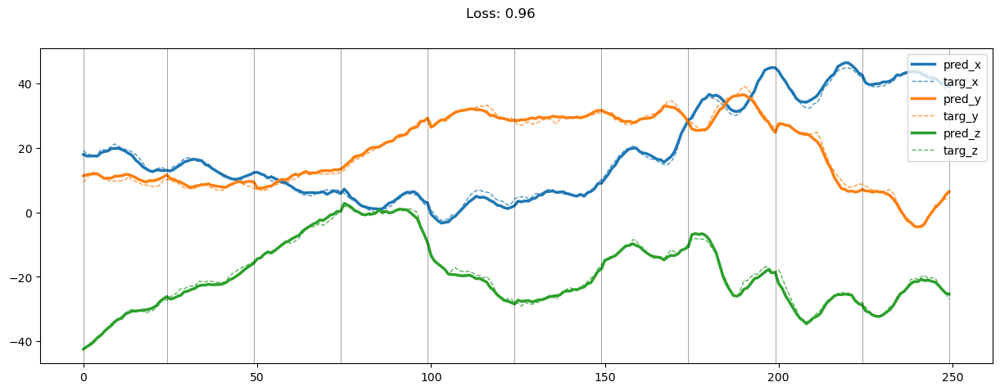

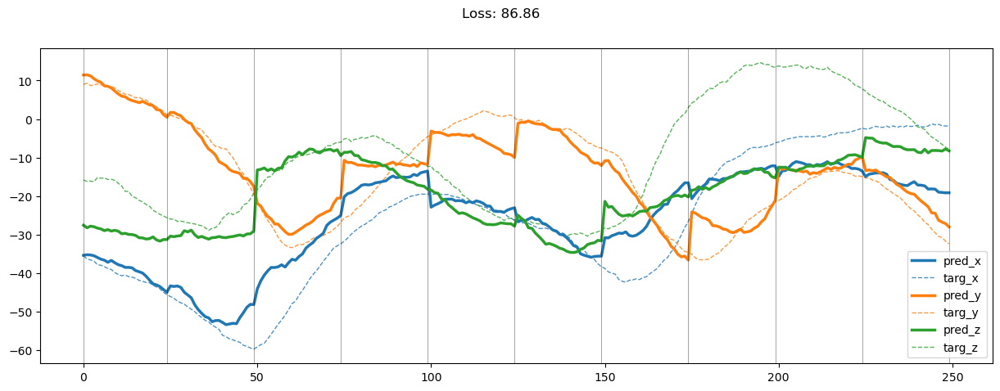

01599: train pred loss:  0.759, g loss:  5.142, diff loss:  1.494, d loss:  3.655
       valid pred loss:  165.148, g loss:  839.627, diff loss:  297.294, d loss:  3.686


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.45it/s]


01600: train pred loss:  0.731, g loss:  4.898, diff loss:  1.423, d loss:  3.719
       valid pred loss:  164.260, g loss:  803.694, diff loss:  296.740, d loss:  3.756


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01601: train pred loss:  0.728, g loss:  4.776, diff loss:  1.401, d loss:  3.790
       valid pred loss:  160.441, g loss:  814.775, diff loss:  289.870, d loss:  3.830


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01602: train pred loss:  0.722, g loss:  4.642, diff loss:  1.376, d loss:  3.867
       valid pred loss:  165.794, g loss:  837.210, diff loss:  295.399, d loss:  3.907


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


01603: train pred loss:  0.717, g loss:  4.565, diff loss:  1.401, d loss:  3.947
       valid pred loss:  166.268, g loss:  843.542, diff loss:  297.594, d loss:  3.989


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01604: train pred loss:  0.691, g loss:  4.364, diff loss:  1.357, d loss:  4.028
       valid pred loss:  169.996, g loss:  824.583, diff loss:  300.584, d loss:  4.072


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01605: train pred loss:  0.708, g loss:  4.387, diff loss:  1.403, d loss:  4.109
       valid pred loss:  167.563, g loss:  843.162, diff loss:  295.757, d loss:  4.151


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


01606: train pred loss:  0.748, g loss:  4.463, diff loss:  1.423, d loss:  4.187
       valid pred loss:  167.385, g loss:  845.707, diff loss:  297.833, d loss:  4.227


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.24it/s]


01607: train pred loss:  0.720, g loss:  4.322, diff loss:  1.424, d loss:  4.261
       valid pred loss:  165.460, g loss:  809.878, diff loss:  299.959, d loss:  4.296


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


01608: train pred loss:  0.709, g loss:  4.214, diff loss:  1.401, d loss:  4.330
       valid pred loss:  164.819, g loss:  806.742, diff loss:  298.878, d loss:  4.364


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01609: train pred loss:  0.720, g loss:  4.220, diff loss:  1.415, d loss:  4.393
       valid pred loss:  166.399, g loss:  813.742, diff loss:  301.081, d loss:  4.425


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01610: train pred loss:  0.710, g loss:  4.153, diff loss:  1.412, d loss:  4.449
       valid pred loss:  167.303, g loss:  817.891, diff loss:  302.498, d loss:  4.477


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01611: train pred loss:  0.722, g loss:  4.167, diff loss:  1.420, d loss:  4.496
       valid pred loss:  166.672, g loss:  813.577, diff loss:  299.938, d loss:  4.521


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01612: train pred loss:  0.725, g loss:  4.142, diff loss:  1.407, d loss:  4.535
       valid pred loss:  167.256, g loss:  823.188, diff loss:  307.855, d loss:  4.552


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01613: train pred loss:  0.712, g loss:  4.079, diff loss:  1.400, d loss:  4.565
       valid pred loss:  164.944, g loss:  808.161, diff loss:  299.448, d loss:  4.578


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.23it/s]


01614: train pred loss:  0.709, g loss:  4.046, diff loss:  1.385, d loss:  4.584
       valid pred loss:  161.436, g loss:  823.858, diff loss:  293.247, d loss:  4.590


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01615: train pred loss:  0.727, g loss:  4.119, diff loss:  1.410, d loss:  4.593
       valid pred loss:  160.496, g loss:  788.429, diff loss:  293.775, d loss:  4.592


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01616: train pred loss:  0.735, g loss:  4.162, diff loss:  1.426, d loss:  4.591
       valid pred loss:  165.231, g loss:  808.634, diff loss:  299.806, d loss:  4.587


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


01617: train pred loss:  0.714, g loss:  4.089, diff loss:  1.412, d loss:  4.579
       valid pred loss:  165.942, g loss:  806.810, diff loss:  295.838, d loss:  4.567


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01618: train pred loss:  0.748, g loss:  4.246, diff loss:  1.455, d loss:  4.555
       valid pred loss:  163.155, g loss:  800.356, diff loss:  297.917, d loss:  4.538


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01619: train pred loss:  0.747, g loss:  4.257, diff loss:  1.448, d loss:  4.520
       valid pred loss:  164.658, g loss:  832.072, diff loss:  292.783, d loss:  4.499


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01620: train pred loss:  0.765, g loss:  4.346, diff loss:  1.457, d loss:  4.476
       valid pred loss:  164.847, g loss:  802.959, diff loss:  295.636, d loss:  4.449


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


01621: train pred loss:  0.732, g loss:  4.265, diff loss:  1.440, d loss:  4.421
       valid pred loss:  166.091, g loss:  837.291, diff loss:  293.182, d loss:  4.389


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01622: train pred loss:  0.716, g loss:  4.208, diff loss:  1.390, d loss:  4.359
       valid pred loss:  165.584, g loss:  804.255, diff loss:  294.285, d loss:  4.322


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.26it/s]


01623: train pred loss:  0.731, g loss:  4.320, diff loss:  1.406, d loss:  4.287
       valid pred loss:  164.777, g loss:  834.463, diff loss:  294.199, d loss:  4.248


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


01624: train pred loss:  0.743, g loss:  4.452, diff loss:  1.445, d loss:  4.211
       valid pred loss:  168.425, g loss:  820.439, diff loss:  301.529, d loss:  4.168


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.10it/s]


01625: train pred loss:  0.731, g loss:  4.475, diff loss:  1.436, d loss:  4.130
       valid pred loss:  168.575, g loss:  820.566, diff loss:  300.952, d loss:  4.086


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.18it/s]


01626: train pred loss:  0.720, g loss:  4.473, diff loss:  1.393, d loss:  4.045
       valid pred loss:  166.181, g loss:  845.994, diff loss:  298.944, d loss:  3.998


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01627: train pred loss:  0.716, g loss:  4.570, diff loss:  1.416, d loss:  3.959
       valid pred loss:  164.577, g loss:  808.474, diff loss:  300.624, d loss:  3.914


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01628: train pred loss:  0.710, g loss:  4.624, diff loss:  1.399, d loss:  3.874
       valid pred loss:  165.466, g loss:  842.646, diff loss:  298.332, d loss:  3.830


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.54it/s]


01629: train pred loss:  0.709, g loss:  4.726, diff loss:  1.408, d loss:  3.793
       valid pred loss:  164.669, g loss:  809.029, diff loss:  300.246, d loss:  3.751


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01630: train pred loss:  0.701, g loss:  4.780, diff loss:  1.383, d loss:  3.714
       valid pred loss:  167.928, g loss:  818.484, diff loss:  299.990, d loss:  3.677


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01631: train pred loss:  0.711, g loss:  4.920, diff loss:  1.398, d loss:  3.644
       valid pred loss:  161.958, g loss:  822.516, diff loss:  290.024, d loss:  3.609


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01632: train pred loss:  0.734, g loss:  5.253, diff loss:  1.450, d loss:  3.582
       valid pred loss:  163.658, g loss:  834.173, diff loss:  295.746, d loss:  3.554


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01633: train pred loss:  0.777, g loss:  5.416, diff loss:  1.521, d loss:  3.531
       valid pred loss:  158.947, g loss:  811.916, diff loss:  289.928, d loss:  3.506


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01634: train pred loss:  0.777, g loss:  5.581, diff loss:  1.501, d loss:  3.493
       valid pred loss:  159.365, g loss:  816.081, diff loss:  292.437, d loss:  3.477


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01635: train pred loss:  0.756, g loss:  5.436, diff loss:  1.498, d loss:  3.468
       valid pred loss:  158.988, g loss:  821.285, diff loss:  296.375, d loss:  3.463


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01636: train pred loss:  0.716, g loss:  5.254, diff loss:  1.421, d loss:  3.460
       valid pred loss:  161.816, g loss:  799.803, diff loss:  300.350, d loss:  3.462


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01637: train pred loss:  0.700, g loss:  5.153, diff loss:  1.383, d loss:  3.467
       valid pred loss:  160.650, g loss:  825.569, diff loss:  296.282, d loss:  3.478


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


01638: train pred loss:  0.696, g loss:  5.078, diff loss:  1.358, d loss:  3.492
       valid pred loss:  160.720, g loss:  795.700, diff loss:  299.932, d loss:  3.512


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01639: train pred loss:  0.707, g loss:  5.074, diff loss:  1.391, d loss:  3.533
       valid pred loss:  164.835, g loss:  812.512, diff loss:  303.977, d loss:  3.562


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.82it/s]


01640: train pred loss:  0.735, g loss:  5.117, diff loss:  1.436, d loss:  3.588
       valid pred loss:  160.233, g loss:  824.156, diff loss:  297.134, d loss:  3.622


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.25it/s]


01641: train pred loss:  0.747, g loss:  5.056, diff loss:  1.442, d loss:  3.657
       valid pred loss:  163.098, g loss:  807.732, diff loss:  304.469, d loss:  3.696


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01642: train pred loss:  0.760, g loss:  5.042, diff loss:  1.495, d loss:  3.736
       valid pred loss:  167.878, g loss:  820.695, diff loss:  303.492, d loss:  3.780


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.16it/s]


01643: train pred loss:  0.778, g loss:  4.995, diff loss:  1.502, d loss:  3.823
       valid pred loss:  166.158, g loss:  815.320, diff loss:  303.108, d loss:  3.869


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


01644: train pred loss:  0.757, g loss:  4.799, diff loss:  1.474, d loss:  3.915
       valid pred loss:  162.236, g loss:  822.077, diff loss:  290.424, d loss:  3.963


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01645: train pred loss:  0.763, g loss:  4.735, diff loss:  1.487, d loss:  4.008
       valid pred loss:  163.728, g loss:  803.328, diff loss:  299.120, d loss:  4.058


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01646: train pred loss:  0.744, g loss:  4.559, diff loss:  1.454, d loss:  4.103
       valid pred loss:  162.350, g loss:  833.456, diff loss:  299.586, d loss:  4.151


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.95it/s]


01647: train pred loss:  0.752, g loss:  4.485, diff loss:  1.436, d loss:  4.195
       valid pred loss:  161.284, g loss:  829.717, diff loss:  298.514, d loss:  4.242


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01648: train pred loss:  0.760, g loss:  4.496, diff loss:  1.488, d loss:  4.282
       valid pred loss:  163.413, g loss:  838.243, diff loss:  301.393, d loss:  4.327


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.04it/s]


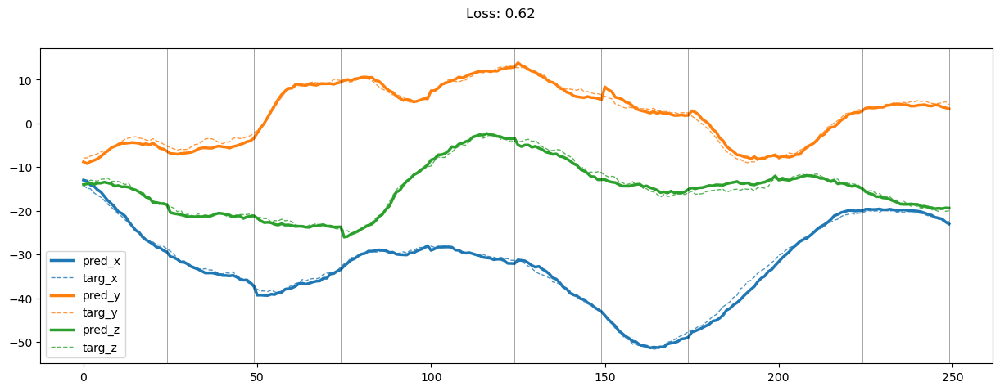

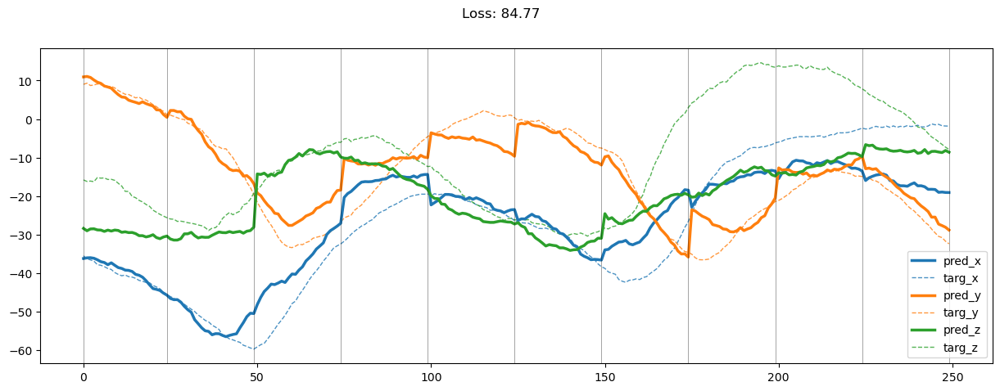

01649: train pred loss:  0.737, g loss:  4.324, diff loss:  1.443, d loss:  4.364
       valid pred loss:  159.369, g loss:  785.827, diff loss:  294.893, d loss:  4.407


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01650: train pred loss:  0.725, g loss:  4.214, diff loss:  1.421, d loss:  4.440
       valid pred loss:  167.551, g loss:  821.938, diff loss:  306.243, d loss:  4.479


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01651: train pred loss:  0.704, g loss:  4.064, diff loss:  1.372, d loss:  4.507
       valid pred loss:  164.711, g loss:  809.322, diff loss:  302.310, d loss:  4.539


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01652: train pred loss:  0.708, g loss:  4.046, diff loss:  1.376, d loss:  4.565
       valid pred loss:  161.913, g loss:  794.017, diff loss:  295.612, d loss:  4.594


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01653: train pred loss:  0.703, g loss:  3.979, diff loss:  1.349, d loss:  4.614
       valid pred loss:  164.712, g loss:  811.115, diff loss:  303.916, d loss:  4.636


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01654: train pred loss:  0.700, g loss:  3.968, diff loss:  1.365, d loss:  4.652
       valid pred loss:  168.332, g loss:  849.094, diff loss:  297.359, d loss:  4.667


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01655: train pred loss:  0.698, g loss:  3.961, diff loss:  1.378, d loss:  4.678
       valid pred loss:  161.764, g loss:  826.372, diff loss:  296.299, d loss:  4.691


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01656: train pred loss:  0.707, g loss:  3.969, diff loss:  1.369, d loss:  4.693
       valid pred loss:  162.279, g loss:  831.385, diff loss:  297.585, d loss:  4.694


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


01657: train pred loss:  0.711, g loss:  3.975, diff loss:  1.363, d loss:  4.696
       valid pred loss:  163.275, g loss:  800.809, diff loss:  298.423, d loss:  4.691


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01658: train pred loss:  0.710, g loss:  3.989, diff loss:  1.375, d loss:  4.685
       valid pred loss:  164.679, g loss:  807.307, diff loss:  301.007, d loss:  4.678


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01659: train pred loss:  0.730, g loss:  4.127, diff loss:  1.442, d loss:  4.662
       valid pred loss:  161.312, g loss:  795.224, diff loss:  298.732, d loss:  4.645


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


01660: train pred loss:  0.748, g loss:  4.220, diff loss:  1.462, d loss:  4.628
       valid pred loss:  162.139, g loss:  794.523, diff loss:  295.605, d loss:  4.603


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.61it/s]


01661: train pred loss:  0.742, g loss:  4.206, diff loss:  1.442, d loss:  4.580
       valid pred loss:  169.132, g loss:  831.559, diff loss:  311.385, d loss:  4.548


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01662: train pred loss:  0.727, g loss:  4.182, diff loss:  1.428, d loss:  4.520
       valid pred loss:  166.519, g loss:  817.607, diff loss:  305.155, d loss:  4.488


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01663: train pred loss:  0.723, g loss:  4.207, diff loss:  1.425, d loss:  4.451
       valid pred loss:  162.853, g loss:  829.556, diff loss:  295.181, d loss:  4.411


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.72it/s]


01664: train pred loss:  0.758, g loss:  4.531, diff loss:  1.486, d loss:  4.372
       valid pred loss:  167.401, g loss:  816.144, diff loss:  300.816, d loss:  4.326


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.44it/s]


01665: train pred loss:  0.777, g loss:  4.575, diff loss:  1.517, d loss:  4.284
       valid pred loss:  171.507, g loss:  834.346, diff loss:  306.675, d loss:  4.234


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.96it/s]


01666: train pred loss:  0.773, g loss:  4.653, diff loss:  1.535, d loss:  4.192
       valid pred loss:  165.621, g loss:  842.409, diff loss:  297.298, d loss:  4.144


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


01667: train pred loss:  0.804, g loss:  4.957, diff loss:  1.558, d loss:  4.096
       valid pred loss:  170.653, g loss:  836.895, diff loss:  311.563, d loss:  4.043


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01668: train pred loss:  0.809, g loss:  4.962, diff loss:  1.558, d loss:  3.995
       valid pred loss:  169.556, g loss:  853.782, diff loss:  298.425, d loss:  3.944


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01669: train pred loss:  0.776, g loss:  4.939, diff loss:  1.531, d loss:  3.897
       valid pred loss:  169.565, g loss:  851.957, diff loss:  297.430, d loss:  3.844


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.28it/s]


01670: train pred loss:  0.764, g loss:  4.950, diff loss:  1.467, d loss:  3.800
       valid pred loss:  163.215, g loss:  830.619, diff loss:  295.295, d loss:  3.749


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.18it/s]


01671: train pred loss:  0.742, g loss:  4.987, diff loss:  1.449, d loss:  3.708
       valid pred loss:  167.580, g loss:  817.504, diff loss:  300.521, d loss:  3.664


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


01672: train pred loss:  0.721, g loss:  5.001, diff loss:  1.410, d loss:  3.625
       valid pred loss:  168.721, g loss:  822.995, diff loss:  302.903, d loss:  3.586


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.19it/s]


01673: train pred loss:  0.709, g loss:  5.060, diff loss:  1.390, d loss:  3.551
       valid pred loss:  170.031, g loss:  830.963, diff loss:  306.679, d loss:  3.513


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01674: train pred loss:  0.708, g loss:  5.155, diff loss:  1.383, d loss:  3.488
       valid pred loss:  168.367, g loss:  825.380, diff loss:  305.819, d loss:  3.458


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01675: train pred loss:  0.707, g loss:  5.244, diff loss:  1.391, d loss:  3.440
       valid pred loss:  165.589, g loss:  844.635, diff loss:  298.552, d loss:  3.425


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01676: train pred loss:  0.761, g loss:  5.670, diff loss:  1.489, d loss:  3.409
       valid pred loss:  170.251, g loss:  825.050, diff loss:  299.451, d loss:  3.400


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01677: train pred loss:  0.753, g loss:  5.541, diff loss:  1.468, d loss:  3.397
       valid pred loss:  168.129, g loss:  821.871, diff loss:  302.475, d loss:  3.396


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.24it/s]


01678: train pred loss:  0.820, g loss:  5.954, diff loss:  1.583, d loss:  3.404
       valid pred loss:  167.220, g loss:  850.890, diff loss:  299.771, d loss:  3.417


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01679: train pred loss:  0.883, g loss:  6.461, diff loss:  1.751, d loss:  3.431
       valid pred loss:  166.004, g loss:  815.069, diff loss:  301.925, d loss:  3.452


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01680: train pred loss:  0.857, g loss:  6.164, diff loss:  1.689, d loss:  3.478
       valid pred loss:  164.222, g loss:  836.861, diff loss:  296.927, d loss:  3.506


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.98it/s]


01681: train pred loss:  0.847, g loss:  5.965, diff loss:  1.683, d loss:  3.543
       valid pred loss:  166.976, g loss:  822.160, diff loss:  307.096, d loss:  3.584


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01682: train pred loss:  0.964, g loss:  6.875, diff loss:  1.920, d loss:  3.623
       valid pred loss:  159.993, g loss:  812.746, diff loss:  290.091, d loss:  3.668


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.24it/s]


01683: train pred loss:  1.046, g loss:  7.944, diff loss:  1.998, d loss:  3.715
       valid pred loss:  170.683, g loss:  833.383, diff loss:  307.202, d loss:  3.767


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.08it/s]


01684: train pred loss:  1.222, g loss:  9.540, diff loss:  2.417, d loss:  3.817
       valid pred loss:  156.521, g loss:  810.272, diff loss:  292.591, d loss:  3.870


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01685: train pred loss:  1.485, g loss:  11.184, diff loss:  2.881, d loss:  3.923
       valid pred loss:  159.390, g loss:  808.491, diff loss:  286.498, d loss:  3.981


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01686: train pred loss:  1.720, g loss:  12.795, diff loss:  3.377, d loss:  4.033
       valid pred loss:  180.216, g loss:  884.259, diff loss:  329.891, d loss:  4.088


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01687: train pred loss:  1.972, g loss:  14.235, diff loss:  3.806, d loss:  4.141
       valid pred loss:  167.140, g loss:  846.348, diff loss:  304.647, d loss:  4.198


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01688: train pred loss:  2.038, g loss:  14.782, diff loss:  3.995, d loss:  4.246
       valid pred loss:  206.241, g loss:  993.848, diff loss:  362.543, d loss:  4.296


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.32it/s]


01689: train pred loss:  2.069, g loss:  14.699, diff loss:  3.981, d loss:  4.347
       valid pred loss:  180.437, g loss:  873.527, diff loss:  318.656, d loss:  4.398


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01690: train pred loss:  2.193, g loss:  15.112, diff loss:  4.099, d loss:  4.441
       valid pred loss:  172.995, g loss:  847.205, diff loss:  316.116, d loss:  4.486


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


01691: train pred loss:  2.194, g loss:  15.188, diff loss:  4.140, d loss:  4.527
       valid pred loss:  178.774, g loss:  879.254, diff loss:  327.219, d loss:  4.569


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01692: train pred loss:  2.165, g loss:  15.194, diff loss:  4.166, d loss:  4.604
       valid pred loss:  166.060, g loss:  835.224, diff loss:  295.956, d loss:  4.639


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01693: train pred loss:  2.098, g loss:  14.761, diff loss:  4.056, d loss:  4.670
       valid pred loss:  164.921, g loss:  832.480, diff loss:  293.656, d loss:  4.703


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.97it/s]


01694: train pred loss:  2.129, g loss:  14.869, diff loss:  4.090, d loss:  4.726
       valid pred loss:  167.232, g loss:  816.216, diff loss:  301.097, d loss:  4.752


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01695: train pred loss:  1.846, g loss:  12.871, diff loss:  3.526, d loss:  4.771
       valid pred loss:  180.405, g loss:  881.985, diff loss:  326.718, d loss:  4.791


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01696: train pred loss:  1.565, g loss:  11.289, diff loss:  3.096, d loss:  4.802
       valid pred loss:  167.448, g loss:  845.895, diff loss:  299.531, d loss:  4.813


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01697: train pred loss:  1.375, g loss:  9.910, diff loss:  2.703, d loss:  4.819
       valid pred loss:  169.671, g loss:  836.615, diff loss:  313.768, d loss:  4.824


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


01698: train pred loss:  1.326, g loss:  9.500, diff loss:  2.583, d loss:  4.824
       valid pred loss:  175.565, g loss:  854.214, diff loss:  313.661, d loss:  4.823


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.11it/s]


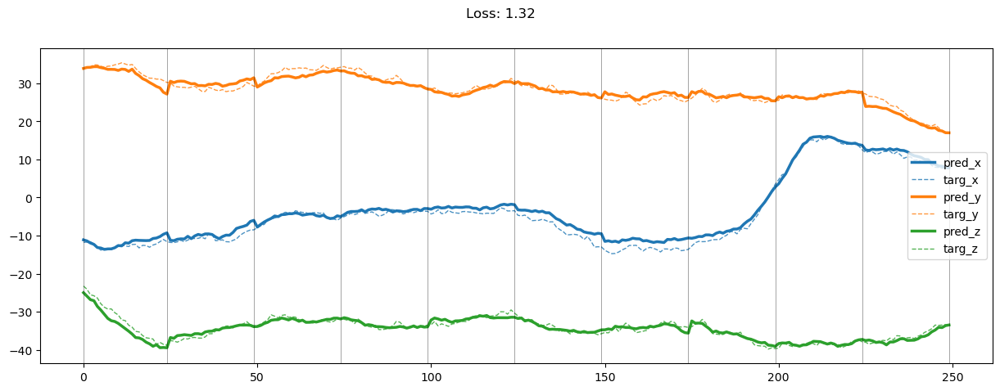

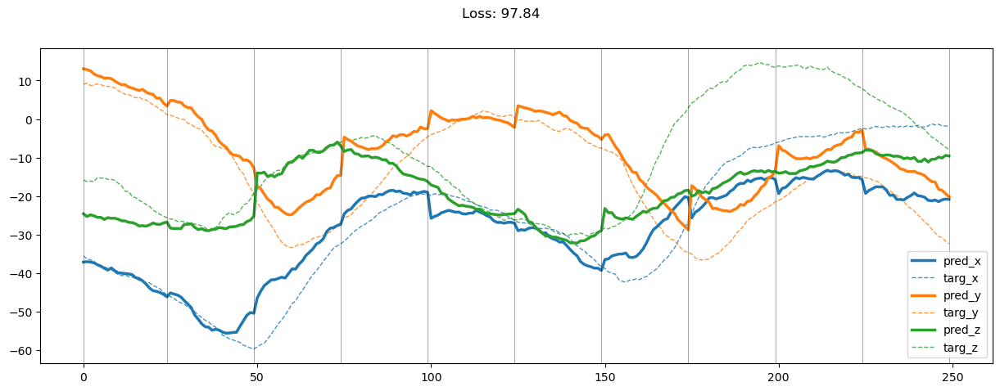

01699: train pred loss:  1.133, g loss:  7.928, diff loss:  2.229, d loss:  4.815
       valid pred loss:  175.201, g loss:  856.300, diff loss:  317.122, d loss:  4.803


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.30it/s]


01700: train pred loss:  1.056, g loss:  6.915, diff loss:  2.068, d loss:  4.791
       valid pred loss:  174.801, g loss:  857.542, diff loss:  319.793, d loss:  4.772


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01701: train pred loss:  0.921, g loss:  5.245, diff loss:  1.798, d loss:  4.753
       valid pred loss:  170.117, g loss:  837.559, diff loss:  313.602, d loss:  4.728


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01702: train pred loss:  0.827, g loss:  4.580, diff loss:  1.618, d loss:  4.701
       valid pred loss:  171.136, g loss:  842.207, diff loss:  315.387, d loss:  4.671


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01703: train pred loss:  0.740, g loss:  4.196, diff loss:  1.464, d loss:  4.637
       valid pred loss:  177.477, g loss:  879.560, diff loss:  333.158, d loss:  4.597


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.15it/s]


01704: train pred loss:  0.701, g loss:  4.043, diff loss:  1.384, d loss:  4.560
       valid pred loss:  174.369, g loss:  858.952, diff loss:  322.193, d loss:  4.514


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01705: train pred loss:  0.687, g loss:  4.024, diff loss:  1.356, d loss:  4.472
       valid pred loss:  171.089, g loss:  841.398, diff loss:  314.170, d loss:  4.422


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.21it/s]


01706: train pred loss:  0.664, g loss:  3.970, diff loss:  1.309, d loss:  4.374
       valid pred loss:  168.286, g loss:  830.897, diff loss:  312.398, d loss:  4.323


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01707: train pred loss:  0.643, g loss:  3.946, diff loss:  1.275, d loss:  4.270
       valid pred loss:  169.653, g loss:  835.533, diff loss:  313.122, d loss:  4.214


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01708: train pred loss:  0.644, g loss:  4.033, diff loss:  1.271, d loss:  4.161
       valid pred loss:  172.725, g loss:  846.666, diff loss:  314.702, d loss:  4.102


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01709: train pred loss:  0.635, g loss:  4.082, diff loss:  1.245, d loss:  4.048
       valid pred loss:  172.333, g loss:  842.643, diff loss:  311.566, d loss:  3.986


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01710: train pred loss:  0.619, g loss:  4.129, diff loss:  1.225, d loss:  3.933
       valid pred loss:  173.485, g loss:  851.288, diff loss:  316.765, d loss:  3.870


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01711: train pred loss:  0.622, g loss:  4.264, diff loss:  1.223, d loss:  3.821
       valid pred loss:  172.296, g loss:  848.820, diff loss:  317.579, d loss:  3.765


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01712: train pred loss:  0.609, g loss:  4.337, diff loss:  1.199, d loss:  3.714
       valid pred loss:  170.556, g loss:  836.593, diff loss:  310.470, d loss:  3.660


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


01713: train pred loss:  0.612, g loss:  4.498, diff loss:  1.210, d loss:  3.615
       valid pred loss:  172.502, g loss:  848.106, diff loss:  316.106, d loss:  3.565


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01714: train pred loss:  0.609, g loss:  4.629, diff loss:  1.206, d loss:  3.525
       valid pred loss:  172.844, g loss:  846.324, diff loss:  312.950, d loss:  3.480


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.90it/s]


01715: train pred loss:  0.611, g loss:  4.770, diff loss:  1.209, d loss:  3.448
       valid pred loss:  172.868, g loss:  845.624, diff loss:  311.888, d loss:  3.415


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.23it/s]


01716: train pred loss:  0.598, g loss:  4.825, diff loss:  1.190, d loss:  3.387
       valid pred loss:  173.818, g loss:  854.586, diff loss:  318.089, d loss:  3.363


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01717: train pred loss:  0.616, g loss:  4.989, diff loss:  1.217, d loss:  3.346
       valid pred loss:  172.262, g loss:  847.259, diff loss:  315.688, d loss:  3.328


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01718: train pred loss:  0.619, g loss:  5.054, diff loss:  1.230, d loss:  3.324
       valid pred loss:  173.247, g loss:  847.323, diff loss:  312.385, d loss:  3.323


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.53it/s]


01719: train pred loss:  0.635, g loss:  5.141, diff loss:  1.271, d loss:  3.325
       valid pred loss:  168.016, g loss:  824.505, diff loss:  305.168, d loss:  3.335


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01720: train pred loss:  0.633, g loss:  5.056, diff loss:  1.243, d loss:  3.350
       valid pred loss:  172.860, g loss:  844.266, diff loss:  310.599, d loss:  3.370


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01721: train pred loss:  0.613, g loss:  4.873, diff loss:  1.209, d loss:  3.397
       valid pred loss:  174.115, g loss:  850.630, diff loss:  313.600, d loss:  3.430


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


01722: train pred loss:  0.599, g loss:  4.680, diff loss:  1.187, d loss:  3.467
       valid pred loss:  170.912, g loss:  835.604, diff loss:  307.973, d loss:  3.508


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01723: train pred loss:  0.619, g loss:  4.636, diff loss:  1.230, d loss:  3.553
       valid pred loss:  172.579, g loss:  842.966, diff loss:  310.613, d loss:  3.606


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


01724: train pred loss:  0.607, g loss:  4.415, diff loss:  1.202, d loss:  3.656
       valid pred loss:  169.647, g loss:  830.900, diff loss:  307.059, d loss:  3.716


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01725: train pred loss:  0.598, g loss:  4.228, diff loss:  1.195, d loss:  3.769
       valid pred loss:  173.089, g loss:  846.170, diff loss:  312.446, d loss:  3.833


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01726: train pred loss:  0.592, g loss:  4.030, diff loss:  1.158, d loss:  3.890
       valid pred loss:  170.528, g loss:  835.198, diff loss:  309.374, d loss:  3.956


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01727: train pred loss:  0.596, g loss:  3.929, diff loss:  1.174, d loss:  4.013
       valid pred loss:  171.835, g loss:  843.851, diff loss:  314.636, d loss:  4.079


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01728: train pred loss:  0.590, g loss:  3.792, diff loss:  1.169, d loss:  4.136
       valid pred loss:  172.198, g loss:  839.008, diff loss:  309.027, d loss:  4.200


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01729: train pred loss:  0.600, g loss:  3.736, diff loss:  1.183, d loss:  4.257
       valid pred loss:  169.543, g loss:  829.817, diff loss:  308.114, d loss:  4.320


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01730: train pred loss:  0.603, g loss:  3.666, diff loss:  1.187, d loss:  4.373
       valid pred loss:  170.499, g loss:  831.593, diff loss:  306.946, d loss:  4.433


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01731: train pred loss:  0.595, g loss:  3.563, diff loss:  1.175, d loss:  4.481
       valid pred loss:  168.808, g loss:  825.456, diff loss:  304.981, d loss:  4.532


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01732: train pred loss:  0.599, g loss:  3.520, diff loss:  1.179, d loss:  4.581
       valid pred loss:  172.039, g loss:  845.987, diff loss:  316.078, d loss:  4.632


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01733: train pred loss:  0.608, g loss:  3.529, diff loss:  1.207, d loss:  4.673
       valid pred loss:  172.182, g loss:  843.985, diff loss:  313.801, d loss:  4.714


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01734: train pred loss:  0.598, g loss:  3.445, diff loss:  1.193, d loss:  4.752
       valid pred loss:  171.817, g loss:  839.842, diff loss:  310.994, d loss:  4.790


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01735: train pred loss:  0.608, g loss:  3.454, diff loss:  1.202, d loss:  4.821
       valid pred loss:  170.518, g loss:  838.144, diff loss:  313.287, d loss:  4.850


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01736: train pred loss:  0.599, g loss:  3.374, diff loss:  1.171, d loss:  4.877
       valid pred loss:  167.996, g loss:  826.442, diff loss:  309.254, d loss:  4.902


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01737: train pred loss:  0.623, g loss:  3.464, diff loss:  1.208, d loss:  4.920
       valid pred loss:  171.087, g loss:  837.056, diff loss:  310.565, d loss:  4.937


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01738: train pred loss:  0.615, g loss:  3.399, diff loss:  1.179, d loss:  4.950
       valid pred loss:  170.322, g loss:  832.958, diff loss:  308.183, d loss:  4.963


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01739: train pred loss:  0.616, g loss:  3.431, diff loss:  1.211, d loss:  4.966
       valid pred loss:  169.231, g loss:  830.196, diff loss:  308.697, d loss:  4.967


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01740: train pred loss:  0.604, g loss:  3.379, diff loss:  1.196, d loss:  4.967
       valid pred loss:  170.385, g loss:  839.009, diff loss:  314.014, d loss:  4.960


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.28it/s]


01741: train pred loss:  0.596, g loss:  3.345, diff loss:  1.183, d loss:  4.952
       valid pred loss:  167.458, g loss:  820.568, diff loss:  304.334, d loss:  4.941


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01742: train pred loss:  0.601, g loss:  3.386, diff loss:  1.196, d loss:  4.924
       valid pred loss:  170.907, g loss:  839.967, diff loss:  314.141, d loss:  4.901


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01743: train pred loss:  0.583, g loss:  3.310, diff loss:  1.156, d loss:  4.879
       valid pred loss:  170.137, g loss:  834.724, diff loss:  310.716, d loss:  4.848


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01744: train pred loss:  0.595, g loss:  3.386, diff loss:  1.172, d loss:  4.821
       valid pred loss:  174.499, g loss:  851.910, diff loss:  314.735, d loss:  4.786


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01745: train pred loss:  0.598, g loss:  3.433, diff loss:  1.178, d loss:  4.747
       valid pred loss:  174.346, g loss:  858.950, diff loss:  322.622, d loss:  4.703


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01746: train pred loss:  0.597, g loss:  3.467, diff loss:  1.175, d loss:  4.662
       valid pred loss:  169.263, g loss:  834.899, diff loss:  313.516, d loss:  4.611


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01747: train pred loss:  0.590, g loss:  3.483, diff loss:  1.160, d loss:  4.564
       valid pred loss:  173.818, g loss:  856.692, diff loss:  321.925, d loss:  4.507


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.43it/s]


01748: train pred loss:  0.591, g loss:  3.561, diff loss:  1.170, d loss:  4.456
       valid pred loss:  171.626, g loss:  843.786, diff loss:  314.995, d loss:  4.398


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


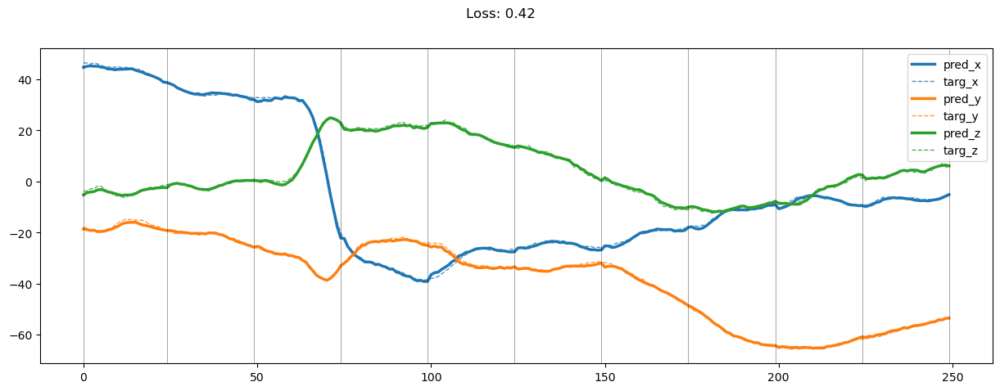

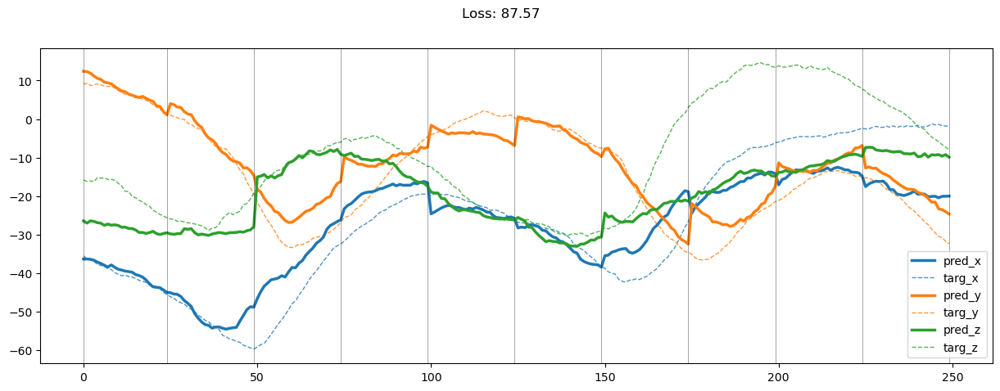

01749: train pred loss:  0.589, g loss:  3.626, diff loss:  1.164, d loss:  4.340
       valid pred loss:  175.343, g loss:  862.285, diff loss:  322.449, d loss:  4.277


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01750: train pred loss:  0.588, g loss:  3.707, diff loss:  1.157, d loss:  4.217
       valid pred loss:  170.417, g loss:  838.399, diff loss:  313.260, d loss:  4.151


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.84it/s]


01751: train pred loss:  0.598, g loss:  3.857, diff loss:  1.172, d loss:  4.093
       valid pred loss:  170.571, g loss:  840.908, diff loss:  315.089, d loss:  4.026


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01752: train pred loss:  0.595, g loss:  3.969, diff loss:  1.170, d loss:  3.967
       valid pred loss:  170.460, g loss:  836.674, diff loss:  311.164, d loss:  3.898


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01753: train pred loss:  0.619, g loss:  4.212, diff loss:  1.203, d loss:  3.840
       valid pred loss:  168.656, g loss:  830.962, diff loss:  310.358, d loss:  3.778


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01754: train pred loss:  0.598, g loss:  4.277, diff loss:  1.177, d loss:  3.720
       valid pred loss:  169.758, g loss:  834.003, diff loss:  310.281, d loss:  3.659


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01755: train pred loss:  0.584, g loss:  4.370, diff loss:  1.149, d loss:  3.606
       valid pred loss:  169.998, g loss:  836.729, diff loss:  312.120, d loss:  3.547


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01756: train pred loss:  0.594, g loss:  4.578, diff loss:  1.159, d loss:  3.501
       valid pred loss:  172.779, g loss:  848.068, diff loss:  315.674, d loss:  3.450


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


01757: train pred loss:  0.589, g loss:  4.714, diff loss:  1.151, d loss:  3.412
       valid pred loss:  170.491, g loss:  839.993, diff loss:  314.114, d loss:  3.373


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01758: train pred loss:  0.595, g loss:  4.896, diff loss:  1.170, d loss:  3.338
       valid pred loss:  174.397, g loss:  860.685, diff loss:  322.556, d loss:  3.307


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01759: train pred loss:  0.612, g loss:  5.099, diff loss:  1.209, d loss:  3.283
       valid pred loss:  169.505, g loss:  832.440, diff loss:  308.866, d loss:  3.261


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01760: train pred loss:  0.627, g loss:  5.225, diff loss:  1.219, d loss:  3.252
       valid pred loss:  174.894, g loss:  861.227, diff loss:  321.828, d loss:  3.246


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01761: train pred loss:  0.614, g loss:  5.170, diff loss:  1.184, d loss:  3.243
       valid pred loss:  170.812, g loss:  839.896, diff loss:  312.653, d loss:  3.249


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01762: train pred loss:  0.610, g loss:  5.109, diff loss:  1.175, d loss:  3.261
       valid pred loss:  173.419, g loss:  850.467, diff loss:  315.317, d loss:  3.277


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.07it/s]


01763: train pred loss:  0.613, g loss:  5.060, diff loss:  1.208, d loss:  3.303
       valid pred loss:  170.134, g loss:  841.834, diff loss:  316.452, d loss:  3.336


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


01764: train pred loss:  0.619, g loss:  4.920, diff loss:  1.190, d loss:  3.371
       valid pred loss:  167.222, g loss:  825.854, diff loss:  309.485, d loss:  3.416


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


01765: train pred loss:  0.597, g loss:  4.664, diff loss:  1.166, d loss:  3.459
       valid pred loss:  166.294, g loss:  818.491, diff loss:  305.196, d loss:  3.515


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.09it/s]


01766: train pred loss:  0.602, g loss:  4.529, diff loss:  1.196, d loss:  3.567
       valid pred loss:  168.460, g loss:  829.387, diff loss:  310.219, d loss:  3.631


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01767: train pred loss:  0.594, g loss:  4.298, diff loss:  1.169, d loss:  3.688
       valid pred loss:  169.769, g loss:  831.657, diff loss:  308.534, d loss:  3.756


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.16it/s]


01768: train pred loss:  0.584, g loss:  4.075, diff loss:  1.143, d loss:  3.817
       valid pred loss:  173.689, g loss:  843.674, diff loss:  308.367, d loss:  3.888


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01769: train pred loss:  0.601, g loss:  4.016, diff loss:  1.186, d loss:  3.952
       valid pred loss:  167.727, g loss:  821.983, diff loss:  304.397, d loss:  4.025


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01770: train pred loss:  0.594, g loss:  3.838, diff loss:  1.162, d loss:  4.088
       valid pred loss:  169.376, g loss:  826.754, diff loss:  304.825, d loss:  4.158


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


01771: train pred loss:  0.594, g loss:  3.743, diff loss:  1.179, d loss:  4.222
       valid pred loss:  165.425, g loss:  815.801, diff loss:  305.950, d loss:  4.293


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01772: train pred loss:  0.598, g loss:  3.663, diff loss:  1.184, d loss:  4.352
       valid pred loss:  168.633, g loss:  829.831, diff loss:  310.491, d loss:  4.419


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.19it/s]


01773: train pred loss:  0.607, g loss:  3.627, diff loss:  1.202, d loss:  4.475
       valid pred loss:  170.749, g loss:  838.270, diff loss:  312.419, d loss:  4.536


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01774: train pred loss:  0.609, g loss:  3.566, diff loss:  1.200, d loss:  4.590
       valid pred loss:  168.140, g loss:  827.524, diff loss:  309.870, d loss:  4.650


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


01775: train pred loss:  0.598, g loss:  3.455, diff loss:  1.177, d loss:  4.697
       valid pred loss:  166.380, g loss:  820.516, diff loss:  307.766, d loss:  4.747


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


01776: train pred loss:  0.599, g loss:  3.420, diff loss:  1.185, d loss:  4.792
       valid pred loss:  168.836, g loss:  827.943, diff loss:  308.063, d loss:  4.840


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.15it/s]


01777: train pred loss:  0.603, g loss:  3.405, diff loss:  1.191, d loss:  4.877
       valid pred loss:  171.113, g loss:  836.391, diff loss:  309.746, d loss:  4.917


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


01778: train pred loss:  0.600, g loss:  3.357, diff loss:  1.181, d loss:  4.949
       valid pred loss:  170.116, g loss:  835.912, diff loss:  312.175, d loss:  4.985


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.63it/s]


01779: train pred loss:  0.619, g loss:  3.422, diff loss:  1.212, d loss:  5.010
       valid pred loss:  171.876, g loss:  845.564, diff loss:  316.259, d loss:  5.037


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.40it/s]


01780: train pred loss:  0.634, g loss:  3.482, diff loss:  1.241, d loss:  5.056
       valid pred loss:  171.041, g loss:  838.313, diff loss:  311.660, d loss:  5.077


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01781: train pred loss:  0.623, g loss:  3.416, diff loss:  1.220, d loss:  5.089
       valid pred loss:  169.194, g loss:  831.644, diff loss:  310.202, d loss:  5.099


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01782: train pred loss:  0.610, g loss:  3.355, diff loss:  1.205, d loss:  5.108
       valid pred loss:  169.917, g loss:  831.347, diff loss:  308.323, d loss:  5.113


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


01783: train pred loss:  0.616, g loss:  3.366, diff loss:  1.198, d loss:  5.112
       valid pred loss:  169.841, g loss:  829.031, diff loss:  306.077, d loss:  5.107


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.94it/s]


01784: train pred loss:  0.622, g loss:  3.389, diff loss:  1.199, d loss:  5.100
       valid pred loss:  170.273, g loss:  835.130, diff loss:  310.964, d loss:  5.091


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01785: train pred loss:  0.625, g loss:  3.427, diff loss:  1.220, d loss:  5.074
       valid pred loss:  168.196, g loss:  822.786, diff loss:  304.335, d loss:  5.054


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01786: train pred loss:  0.612, g loss:  3.380, diff loss:  1.197, d loss:  5.032
       valid pred loss:  170.453, g loss:  834.463, diff loss:  309.820, d loss:  5.003


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01787: train pred loss:  0.604, g loss:  3.369, diff loss:  1.190, d loss:  4.975
       valid pred loss:  169.645, g loss:  828.785, diff loss:  306.623, d loss:  4.938


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.22it/s]


01788: train pred loss:  0.592, g loss:  3.331, diff loss:  1.163, d loss:  4.902
       valid pred loss:  171.648, g loss:  841.924, diff loss:  313.681, d loss:  4.860


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01789: train pred loss:  0.594, g loss:  3.379, diff loss:  1.170, d loss:  4.817
       valid pred loss:  167.555, g loss:  823.112, diff loss:  307.025, d loss:  4.767


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01790: train pred loss:  0.597, g loss:  3.440, diff loss:  1.178, d loss:  4.719
       valid pred loss:  170.403, g loss:  836.813, diff loss:  312.013, d loss:  4.661


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.90it/s]


01791: train pred loss:  0.612, g loss:  3.562, diff loss:  1.198, d loss:  4.610
       valid pred loss:  173.068, g loss:  848.036, diff loss:  315.342, d loss:  4.551


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.67it/s]


01792: train pred loss:  0.687, g loss:  4.067, diff loss:  1.316, d loss:  4.490
       valid pred loss:  165.583, g loss:  818.111, diff loss:  307.279, d loss:  4.425


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01793: train pred loss:  0.660, g loss:  3.945, diff loss:  1.288, d loss:  4.364
       valid pred loss:  172.383, g loss:  839.283, diff loss:  308.317, d loss:  4.294


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01794: train pred loss:  0.636, g loss:  3.935, diff loss:  1.255, d loss:  4.231
       valid pred loss:  170.128, g loss:  837.286, diff loss:  312.547, d loss:  4.159


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01795: train pred loss:  0.628, g loss:  4.011, diff loss:  1.242, d loss:  4.096
       valid pred loss:  165.619, g loss:  817.658, diff loss:  306.199, d loss:  4.021


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01796: train pred loss:  0.617, g loss:  4.082, diff loss:  1.212, d loss:  3.957
       valid pred loss:  164.237, g loss:  808.693, diff loss:  301.454, d loss:  3.887


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.24it/s]


01797: train pred loss:  0.623, g loss:  4.253, diff loss:  1.214, d loss:  3.822
       valid pred loss:  171.119, g loss:  839.804, diff loss:  312.176, d loss:  3.752


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.78it/s]


01798: train pred loss:  0.635, g loss:  4.464, diff loss:  1.224, d loss:  3.693
       valid pred loss:  174.045, g loss:  847.804, diff loss:  310.597, d loss:  3.627


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.50it/s]


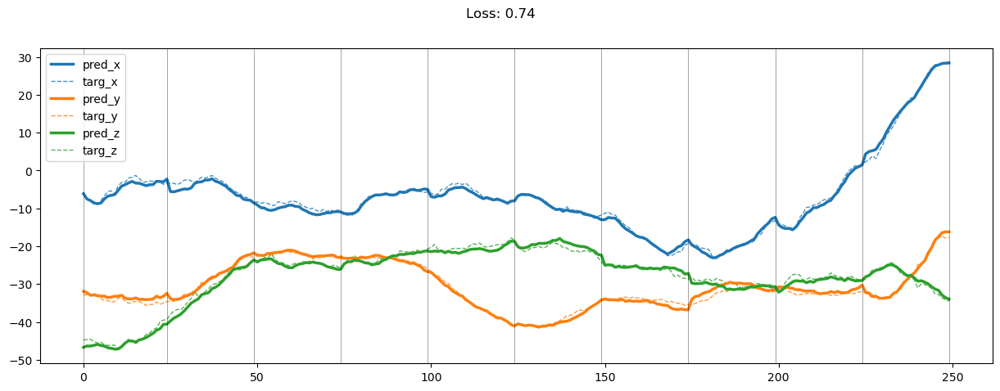

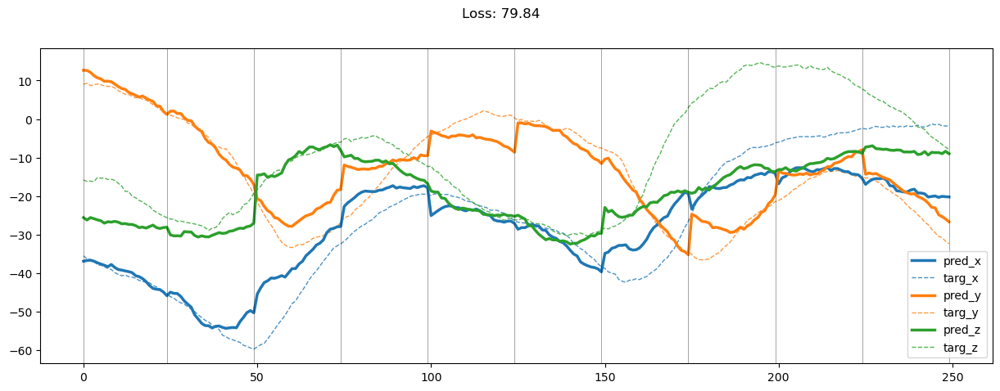

01799: train pred loss:  0.629, g loss:  4.639, diff loss:  1.237, d loss:  3.571
       valid pred loss:  171.840, g loss:  840.503, diff loss:  309.494, d loss:  3.507


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01800: train pred loss:  0.622, g loss:  4.809, diff loss:  1.237, d loss:  3.457
       valid pred loss:  168.856, g loss:  832.004, diff loss:  309.246, d loss:  3.404


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


01801: train pred loss:  0.673, g loss:  5.357, diff loss:  1.315, d loss:  3.358
       valid pred loss:  174.556, g loss:  852.257, diff loss:  312.462, d loss:  3.313


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


01802: train pred loss:  0.899, g loss:  6.918, diff loss:  1.736, d loss:  3.278
       valid pred loss:  168.508, g loss:  836.267, diff loss:  314.764, d loss:  3.242


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01803: train pred loss:  0.924, g loss:  7.081, diff loss:  1.785, d loss:  3.218
       valid pred loss:  176.253, g loss:  874.637, diff loss:  329.789, d loss:  3.192


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.96it/s]


01804: train pred loss:  0.963, g loss:  7.852, diff loss:  1.865, d loss:  3.179
       valid pred loss:  174.004, g loss:  852.454, diff loss:  313.256, d loss:  3.168


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


01805: train pred loss:  0.992, g loss:  7.950, diff loss:  1.878, d loss:  3.166
       valid pred loss:  177.559, g loss:  881.536, diff loss:  333.150, d loss:  3.167


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.90it/s]


01806: train pred loss:  1.034, g loss:  8.706, diff loss:  1.972, d loss:  3.179
       valid pred loss:  168.429, g loss:  832.047, diff loss:  309.601, d loss:  3.195


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01807: train pred loss:  1.003, g loss:  8.137, diff loss:  1.974, d loss:  3.219
       valid pred loss:  178.372, g loss:  885.905, diff loss:  333.916, d loss:  3.249


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01808: train pred loss:  0.998, g loss:  7.730, diff loss:  1.888, d loss:  3.286
       valid pred loss:  172.941, g loss:  848.419, diff loss:  313.573, d loss:  3.330


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.25it/s]


01809: train pred loss:  0.900, g loss:  6.596, diff loss:  1.796, d loss:  3.376
       valid pred loss:  176.614, g loss:  867.883, diff loss:  323.121, d loss:  3.432


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01810: train pred loss:  0.811, g loss:  5.694, diff loss:  1.608, d loss:  3.486
       valid pred loss:  180.487, g loss:  884.782, diff loss:  328.061, d loss:  3.549


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01811: train pred loss:  0.744, g loss:  5.127, diff loss:  1.444, d loss:  3.611
       valid pred loss:  175.711, g loss:  869.890, diff loss:  327.242, d loss:  3.682


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.24it/s]


01812: train pred loss:  0.694, g loss:  4.708, diff loss:  1.366, d loss:  3.747
       valid pred loss:  176.674, g loss:  864.634, diff loss:  319.358, d loss:  3.823


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01813: train pred loss:  0.673, g loss:  4.436, diff loss:  1.329, d loss:  3.891
       valid pred loss:  171.356, g loss:  844.145, diff loss:  314.726, d loss:  3.967


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01814: train pred loss:  0.736, g loss:  4.717, diff loss:  1.439, d loss:  4.035
       valid pred loss:  169.442, g loss:  837.632, diff loss:  313.783, d loss:  4.111


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01815: train pred loss:  1.059, g loss:  7.218, diff loss:  2.071, d loss:  4.179
       valid pred loss:  177.079, g loss:  875.995, diff loss:  300.886, d loss:  4.253


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 13.96it/s]


01816: train pred loss:  1.984, g loss:  14.107, diff loss:  3.807, d loss:  4.320
       valid pred loss:  238.527, g loss:  1109.371, diff loss:  393.138, d loss:  4.393


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.47it/s]


01817: train pred loss:  6.036, g loss:  40.642, diff loss:  11.331, d loss:  4.455
       valid pred loss:  214.206, g loss:  1083.794, diff loss:  430.456, d loss:  4.524


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


01818: train pred loss:  6.254, g loss:  42.524, diff loss:  11.910, d loss:  4.582
       valid pred loss:  178.101, g loss:  874.813, diff loss:  329.285, d loss:  4.646


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


01819: train pred loss:  8.538, g loss:  52.889, diff loss:  15.346, d loss:  4.701
       valid pred loss:  183.276, g loss:  862.840, diff loss:  303.149, d loss:  4.761


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01820: train pred loss:  5.974, g loss:  38.803, diff loss:  11.148, d loss:  4.810
       valid pred loss:  185.945, g loss:  901.312, diff loss:  331.060, d loss:  4.864


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01821: train pred loss:  4.041, g loss:  27.939, diff loss:  7.836, d loss:  4.908
       valid pred loss:  190.966, g loss:  915.772, diff loss:  329.900, d loss:  4.956


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.26it/s]


01822: train pred loss:  3.747, g loss:  26.038, diff loss:  7.312, d loss:  4.996
       valid pred loss:  163.375, g loss:  795.562, diff loss:  294.439, d loss:  5.037


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.28it/s]


01823: train pred loss:  2.646, g loss:  18.277, diff loss:  5.100, d loss:  5.071
       valid pred loss:  153.460, g loss:  781.126, diff loss:  275.880, d loss:  5.105


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01824: train pred loss:  1.952, g loss:  13.573, diff loss:  3.770, d loss:  5.133
       valid pred loss:  152.082, g loss:  774.211, diff loss:  278.028, d loss:  5.161


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01825: train pred loss:  1.595, g loss:  11.171, diff loss:  3.093, d loss:  5.182
       valid pred loss:  152.232, g loss:  778.217, diff loss:  278.334, d loss:  5.204


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.20it/s]


01826: train pred loss:  1.319, g loss:  9.380, diff loss:  2.592, d loss:  5.218
       valid pred loss:  155.917, g loss:  788.339, diff loss:  278.326, d loss:  5.233


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01827: train pred loss:  1.193, g loss:  8.542, diff loss:  2.357, d loss:  5.242
       valid pred loss:  156.559, g loss:  796.530, diff loss:  281.733, d loss:  5.249


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.20it/s]


01828: train pred loss:  1.090, g loss:  7.583, diff loss:  2.144, d loss:  5.250
       valid pred loss:  157.382, g loss:  798.081, diff loss:  280.147, d loss:  5.252


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.04it/s]


01829: train pred loss:  0.983, g loss:  5.989, diff loss:  1.933, d loss:  5.245
       valid pred loss:  156.738, g loss:  797.081, diff loss:  280.391, d loss:  5.234


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.45it/s]


01830: train pred loss:  0.944, g loss:  5.436, diff loss:  1.848, d loss:  5.221
       valid pred loss:  155.472, g loss:  791.359, diff loss:  279.482, d loss:  5.204


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01831: train pred loss:  0.882, g loss:  4.798, diff loss:  1.745, d loss:  5.183
       valid pred loss:  157.289, g loss:  796.559, diff loss:  280.528, d loss:  5.157


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01832: train pred loss:  0.834, g loss:  4.468, diff loss:  1.653, d loss:  5.129
       valid pred loss:  158.696, g loss:  804.197, diff loss:  283.348, d loss:  5.093


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01833: train pred loss:  0.818, g loss:  4.401, diff loss:  1.614, d loss:  5.059
       valid pred loss:  157.507, g loss:  797.293, diff loss:  280.983, d loss:  5.020


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01834: train pred loss:  0.798, g loss:  4.331, diff loss:  1.575, d loss:  4.979
       valid pred loss:  157.707, g loss:  799.458, diff loss:  281.898, d loss:  4.930


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01835: train pred loss:  0.792, g loss:  4.341, diff loss:  1.565, d loss:  4.883
       valid pred loss:  156.037, g loss:  791.140, diff loss:  278.689, d loss:  4.828


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01836: train pred loss:  0.782, g loss:  4.325, diff loss:  1.537, d loss:  4.777
       valid pred loss:  156.587, g loss:  794.379, diff loss:  280.434, d loss:  4.718


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01837: train pred loss:  0.773, g loss:  4.357, diff loss:  1.539, d loss:  4.659
       valid pred loss:  156.170, g loss:  793.359, diff loss:  280.152, d loss:  4.594


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01838: train pred loss:  0.759, g loss:  4.350, diff loss:  1.507, d loss:  4.531
       valid pred loss:  155.680, g loss:  791.104, diff loss:  279.003, d loss:  4.459


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01839: train pred loss:  0.729, g loss:  4.279, diff loss:  1.441, d loss:  4.395
       valid pred loss:  155.160, g loss:  790.705, diff loss:  280.017, d loss:  4.322


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01840: train pred loss:  0.749, g loss:  4.496, diff loss:  1.501, d loss:  4.256
       valid pred loss:  155.927, g loss:  794.376, diff loss:  280.863, d loss:  4.178


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01841: train pred loss:  0.732, g loss:  4.516, diff loss:  1.453, d loss:  4.111
       valid pred loss:  155.675, g loss:  791.788, diff loss:  279.466, d loss:  4.037


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01842: train pred loss:  0.716, g loss:  4.569, diff loss:  1.418, d loss:  3.965
       valid pred loss:  155.905, g loss:  793.611, diff loss:  280.468, d loss:  3.894


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01843: train pred loss:  0.714, g loss:  4.714, diff loss:  1.413, d loss:  3.824
       valid pred loss:  155.865, g loss:  792.679, diff loss:  280.285, d loss:  3.749


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01844: train pred loss:  0.706, g loss:  4.860, diff loss:  1.405, d loss:  3.685
       valid pred loss:  156.809, g loss:  796.414, diff loss:  280.787, d loss:  3.614


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.09it/s]


01845: train pred loss:  0.715, g loss:  5.087, diff loss:  1.414, d loss:  3.555
       valid pred loss:  156.175, g loss:  792.231, diff loss:  279.352, d loss:  3.490


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.14it/s]


01846: train pred loss:  0.697, g loss:  5.201, diff loss:  1.373, d loss:  3.433
       valid pred loss:  157.381, g loss:  798.146, diff loss:  281.238, d loss:  3.377


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.04it/s]


01847: train pred loss:  0.693, g loss:  5.415, diff loss:  1.393, d loss:  3.326
       valid pred loss:  154.940, g loss:  786.771, diff loss:  277.866, d loss:  3.276


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.10it/s]


01848: train pred loss:  0.673, g loss:  5.474, diff loss:  1.319, d loss:  3.236
       valid pred loss:  154.734, g loss:  784.987, diff loss:  276.557, d loss:  3.194


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.01it/s]


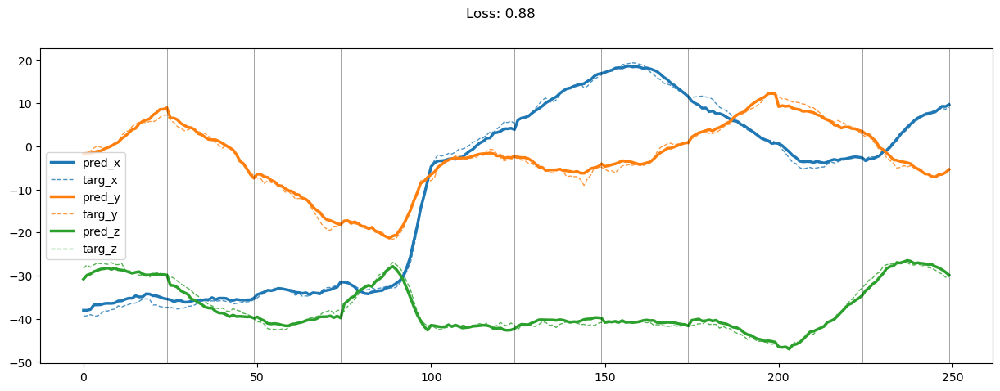

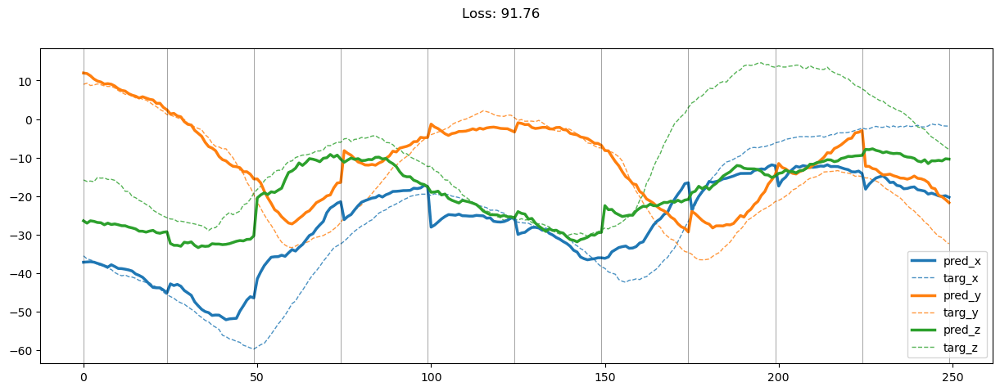

01849: train pred loss:  0.679, g loss:  5.696, diff loss:  1.355, d loss:  3.165
       valid pred loss:  156.247, g loss:  792.502, diff loss:  278.975, d loss:  3.136


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.68it/s]


01850: train pred loss:  0.673, g loss:  5.786, diff loss:  1.342, d loss:  3.116
       valid pred loss:  155.199, g loss:  789.801, diff loss:  279.349, d loss:  3.102


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.31it/s]


01851: train pred loss:  0.669, g loss:  5.821, diff loss:  1.332, d loss:  3.094
       valid pred loss:  155.900, g loss:  793.116, diff loss:  280.492, d loss:  3.088


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01852: train pred loss:  0.673, g loss:  5.822, diff loss:  1.329, d loss:  3.098
       valid pred loss:  155.867, g loss:  794.839, diff loss:  281.522, d loss:  3.109


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01853: train pred loss:  0.660, g loss:  5.667, diff loss:  1.299, d loss:  3.130
       valid pred loss:  155.944, g loss:  796.762, diff loss:  282.490, d loss:  3.158


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.90it/s]


01854: train pred loss:  0.670, g loss:  5.589, diff loss:  1.339, d loss:  3.190
       valid pred loss:  155.652, g loss:  791.920, diff loss:  279.776, d loss:  3.230


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01855: train pred loss:  0.667, g loss:  5.377, diff loss:  1.326, d loss:  3.274
       valid pred loss:  154.820, g loss:  788.542, diff loss:  279.220, d loss:  3.329


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.14it/s]


01856: train pred loss:  0.660, g loss:  5.122, diff loss:  1.311, d loss:  3.381
       valid pred loss:  153.999, g loss:  783.954, diff loss:  278.183, d loss:  3.444


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.11it/s]


01857: train pred loss:  0.666, g loss:  4.930, diff loss:  1.325, d loss:  3.507
       valid pred loss:  154.898, g loss:  784.780, diff loss:  276.461, d loss:  3.580


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01858: train pred loss:  0.653, g loss:  4.648, diff loss:  1.298, d loss:  3.645
       valid pred loss:  154.987, g loss:  790.420, diff loss:  280.154, d loss:  3.723


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01859: train pred loss:  0.641, g loss:  4.389, diff loss:  1.271, d loss:  3.792
       valid pred loss:  155.664, g loss:  795.705, diff loss:  282.766, d loss:  3.869


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01860: train pred loss:  0.652, g loss:  4.270, diff loss:  1.291, d loss:  3.943
       valid pred loss:  158.002, g loss:  802.841, diff loss:  283.523, d loss:  4.025


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01861: train pred loss:  0.653, g loss:  4.132, diff loss:  1.297, d loss:  4.095
       valid pred loss:  156.938, g loss:  799.576, diff loss:  283.501, d loss:  4.174


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01862: train pred loss:  0.636, g loss:  3.929, diff loss:  1.267, d loss:  4.246
       valid pred loss:  158.332, g loss:  770.713, diff loss:  284.315, d loss:  4.325


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.30it/s]


01863: train pred loss:  0.636, g loss:  3.811, diff loss:  1.254, d loss:  4.391
       valid pred loss:  157.889, g loss:  770.349, diff loss:  285.175, d loss:  4.467


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01864: train pred loss:  0.634, g loss:  3.713, diff loss:  1.247, d loss:  4.531
       valid pred loss:  156.832, g loss:  799.205, diff loss:  283.414, d loss:  4.603


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


01865: train pred loss:  0.646, g loss:  3.692, diff loss:  1.260, d loss:  4.663
       valid pred loss:  157.404, g loss:  766.639, diff loss:  283.505, d loss:  4.728


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.20it/s]


01866: train pred loss:  0.634, g loss:  3.596, diff loss:  1.257, d loss:  4.785
       valid pred loss:  154.911, g loss:  786.458, diff loss:  278.873, d loss:  4.848


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.99it/s]


01867: train pred loss:  0.634, g loss:  3.545, diff loss:  1.253, d loss:  4.899
       valid pred loss:  156.338, g loss:  793.938, diff loss:  280.965, d loss:  4.956


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.23it/s]


01868: train pred loss:  0.627, g loss:  3.490, diff loss:  1.256, d loss:  5.001
       valid pred loss:  157.820, g loss:  769.265, diff loss:  284.839, d loss:  5.051


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01869: train pred loss:  0.626, g loss:  3.435, diff loss:  1.237, d loss:  5.093
       valid pred loss:  157.348, g loss:  800.619, diff loss:  284.001, d loss:  5.134


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.27it/s]


01870: train pred loss:  0.620, g loss:  3.399, diff loss:  1.242, d loss:  5.173
       valid pred loss:  156.501, g loss:  794.932, diff loss:  282.202, d loss:  5.210


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.92it/s]


01871: train pred loss:  0.619, g loss:  3.359, diff loss:  1.224, d loss:  5.241
       valid pred loss:  156.259, g loss:  795.103, diff loss:  282.325, d loss:  5.273


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


01872: train pred loss:  0.625, g loss:  3.375, diff loss:  1.238, d loss:  5.296
       valid pred loss:  156.193, g loss:  763.518, diff loss:  284.033, d loss:  5.320


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01873: train pred loss:  0.618, g loss:  3.321, diff loss:  1.215, d loss:  5.337
       valid pred loss:  154.723, g loss:  788.552, diff loss:  280.709, d loss:  5.358


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


01874: train pred loss:  0.621, g loss:  3.336, diff loss:  1.227, d loss:  5.366
       valid pred loss:  154.602, g loss:  756.602, diff loss:  282.126, d loss:  5.374


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01875: train pred loss:  0.616, g loss:  3.311, diff loss:  1.222, d loss:  5.381
       valid pred loss:  152.998, g loss:  785.872, diff loss:  281.514, d loss:  5.383


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.82it/s]


01876: train pred loss:  0.622, g loss:  3.332, diff loss:  1.225, d loss:  5.380
       valid pred loss:  154.093, g loss:  787.480, diff loss:  281.081, d loss:  5.377


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.30it/s]


01877: train pred loss:  0.622, g loss:  3.356, diff loss:  1.246, d loss:  5.367
       valid pred loss:  155.566, g loss:  760.663, diff loss:  283.322, d loss:  5.354


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01878: train pred loss:  0.633, g loss:  3.428, diff loss:  1.277, d loss:  5.338
       valid pred loss:  155.455, g loss:  760.598, diff loss:  283.532, d loss:  5.318


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01879: train pred loss:  0.612, g loss:  3.310, diff loss:  1.212, d loss:  5.295
       valid pred loss:  154.815, g loss:  758.178, diff loss:  282.925, d loss:  5.266


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01880: train pred loss:  0.613, g loss:  3.337, diff loss:  1.222, d loss:  5.238
       valid pred loss:  156.420, g loss:  763.363, diff loss:  283.363, d loss:  5.204


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01881: train pred loss:  0.617, g loss:  3.376, diff loss:  1.229, d loss:  5.167
       valid pred loss:  157.390, g loss:  768.612, diff loss:  285.896, d loss:  5.122


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01882: train pred loss:  0.624, g loss:  3.428, diff loss:  1.231, d loss:  5.080
       valid pred loss:  155.271, g loss:  792.137, diff loss:  282.639, d loss:  5.033


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01883: train pred loss:  0.624, g loss:  3.464, diff loss:  1.235, d loss:  4.982
       valid pred loss:  155.433, g loss:  760.888, diff loss:  283.532, d loss:  4.925


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01884: train pred loss:  0.611, g loss:  3.446, diff loss:  1.214, d loss:  4.871
       valid pred loss:  155.379, g loss:  792.806, diff loss:  282.483, d loss:  4.808


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01885: train pred loss:  0.606, g loss:  3.473, diff loss:  1.204, d loss:  4.749
       valid pred loss:  154.466, g loss:  789.190, diff loss:  282.280, d loss:  4.681


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01886: train pred loss:  0.601, g loss:  3.508, diff loss:  1.191, d loss:  4.619
       valid pred loss:  155.344, g loss:  791.567, diff loss:  281.801, d loss:  4.546


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.30it/s]


01887: train pred loss:  0.596, g loss:  3.553, diff loss:  1.173, d loss:  4.479
       valid pred loss:  155.198, g loss:  759.552, diff loss:  282.546, d loss:  4.403


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01888: train pred loss:  0.593, g loss:  3.644, diff loss:  1.181, d loss:  4.335
       valid pred loss:  157.450, g loss:  771.363, diff loss:  287.514, d loss:  4.254


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.19it/s]


01889: train pred loss:  0.596, g loss:  3.749, diff loss:  1.164, d loss:  4.185
       valid pred loss:  158.446, g loss:  775.428, diff loss:  288.497, d loss:  4.104


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01890: train pred loss:  0.601, g loss:  3.930, diff loss:  1.198, d loss:  4.035
       valid pred loss:  158.054, g loss:  772.553, diff loss:  286.661, d loss:  3.952


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01891: train pred loss:  0.597, g loss:  4.060, diff loss:  1.184, d loss:  3.884
       valid pred loss:  156.296, g loss:  796.534, diff loss:  281.973, d loss:  3.808


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.29it/s]


01892: train pred loss:  0.603, g loss:  4.256, diff loss:  1.188, d loss:  3.737
       valid pred loss:  157.132, g loss:  769.776, diff loss:  286.369, d loss:  3.660


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01893: train pred loss:  0.600, g loss:  4.438, diff loss:  1.180, d loss:  3.595
       valid pred loss:  157.912, g loss:  772.633, diff loss:  286.629, d loss:  3.525


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.13it/s]


01894: train pred loss:  0.586, g loss:  4.590, diff loss:  1.159, d loss:  3.463
       valid pred loss:  155.878, g loss:  793.323, diff loss:  280.657, d loss:  3.397


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01895: train pred loss:  0.592, g loss:  4.844, diff loss:  1.170, d loss:  3.343
       valid pred loss:  157.492, g loss:  770.452, diff loss:  285.310, d loss:  3.281


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01896: train pred loss:  0.598, g loss:  5.092, diff loss:  1.179, d loss:  3.237
       valid pred loss:  156.727, g loss:  799.675, diff loss:  283.479, d loss:  3.190


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01897: train pred loss:  0.593, g loss:  5.283, diff loss:  1.177, d loss:  3.150
       valid pred loss:  157.224, g loss:  768.567, diff loss:  283.804, d loss:  3.109


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01898: train pred loss:  0.598, g loss:  5.473, diff loss:  1.182, d loss:  3.083
       valid pred loss:  157.723, g loss:  798.706, diff loss:  280.200, d loss:  3.057


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


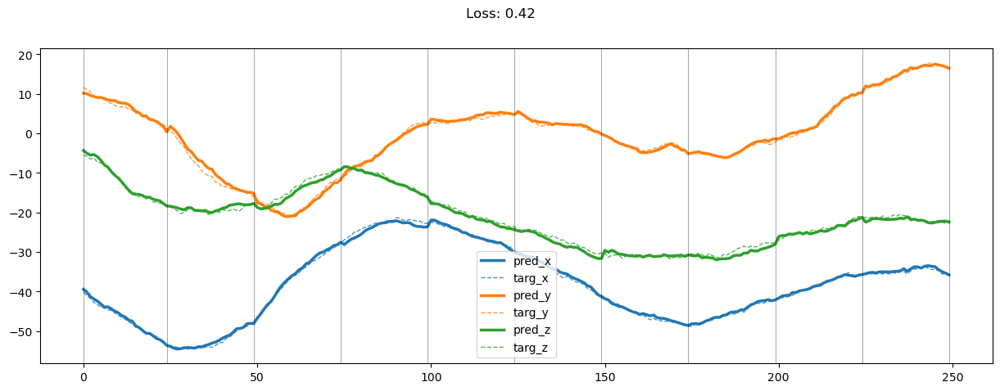

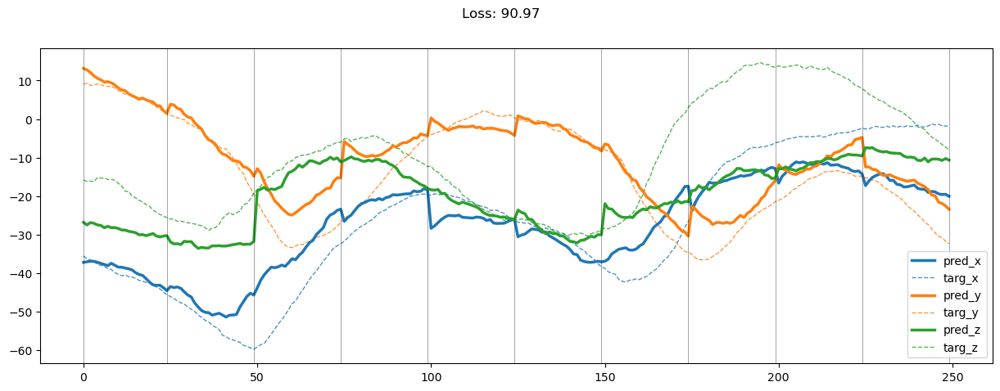

01899: train pred loss:  0.589, g loss:  5.546, diff loss:  1.165, d loss:  3.040
       valid pred loss:  155.849, g loss:  791.448, diff loss:  279.114, d loss:  3.028


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01900: train pred loss:  0.588, g loss:  5.590, diff loss:  1.167, d loss:  3.024
       valid pred loss:  155.590, g loss:  789.478, diff loss:  278.212, d loss:  3.028


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01901: train pred loss:  0.583, g loss:  5.527, diff loss:  1.154, d loss:  3.036
       valid pred loss:  157.188, g loss:  795.026, diff loss:  279.140, d loss:  3.053


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.34it/s]


01902: train pred loss:  0.593, g loss:  5.460, diff loss:  1.168, d loss:  3.077
       valid pred loss:  156.739, g loss:  796.924, diff loss:  281.011, d loss:  3.108


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01903: train pred loss:  0.585, g loss:  5.232, diff loss:  1.141, d loss:  3.145
       valid pred loss:  156.180, g loss:  762.381, diff loss:  280.970, d loss:  3.192


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01904: train pred loss:  0.575, g loss:  4.974, diff loss:  1.136, d loss:  3.239
       valid pred loss:  157.409, g loss:  766.325, diff loss:  281.624, d loss:  3.300


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.21it/s]


01905: train pred loss:  0.584, g loss:  4.773, diff loss:  1.149, d loss:  3.355
       valid pred loss:  158.391, g loss:  770.959, diff loss:  283.440, d loss:  3.425


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01906: train pred loss:  0.591, g loss:  4.578, diff loss:  1.177, d loss:  3.488
       valid pred loss:  159.660, g loss:  775.379, diff loss:  284.069, d loss:  3.565


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


01907: train pred loss:  0.587, g loss:  4.313, diff loss:  1.152, d loss:  3.634
       valid pred loss:  158.546, g loss:  771.135, diff loss:  283.440, d loss:  3.716


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.38it/s]


01908: train pred loss:  0.579, g loss:  4.062, diff loss:  1.134, d loss:  3.789
       valid pred loss:  156.614, g loss:  767.323, diff loss:  285.765, d loss:  3.875


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


01909: train pred loss:  0.577, g loss:  3.885, diff loss:  1.142, d loss:  3.948
       valid pred loss:  157.362, g loss:  767.886, diff loss:  283.971, d loss:  4.033


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.22it/s]


01910: train pred loss:  0.576, g loss:  3.728, diff loss:  1.138, d loss:  4.107
       valid pred loss:  158.331, g loss:  772.591, diff loss:  286.174, d loss:  4.194


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.08it/s]


01911: train pred loss:  0.573, g loss:  3.588, diff loss:  1.136, d loss:  4.265
       valid pred loss:  157.169, g loss:  798.429, diff loss:  282.704, d loss:  4.348


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.20it/s]


01912: train pred loss:  0.578, g loss:  3.512, diff loss:  1.148, d loss:  4.418
       valid pred loss:  157.383, g loss:  769.584, diff loss:  286.137, d loss:  4.499


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.98it/s]


01913: train pred loss:  0.577, g loss:  3.416, diff loss:  1.143, d loss:  4.564
       valid pred loss:  156.821, g loss:  768.883, diff loss:  287.152, d loss:  4.641


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01914: train pred loss:  0.572, g loss:  3.316, diff loss:  1.127, d loss:  4.703
       valid pred loss:  157.184, g loss:  769.920, diff loss:  287.046, d loss:  4.770


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01915: train pred loss:  0.569, g loss:  3.261, diff loss:  1.140, d loss:  4.833
       valid pred loss:  158.945, g loss:  780.517, diff loss:  292.292, d loss:  4.900


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01916: train pred loss:  0.576, g loss:  3.247, diff loss:  1.152, d loss:  4.954
       valid pred loss:  158.308, g loss:  775.119, diff loss:  288.739, d loss:  5.016


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01917: train pred loss:  0.579, g loss:  3.218, diff loss:  1.152, d loss:  5.065
       valid pred loss:  157.513, g loss:  770.329, diff loss:  286.628, d loss:  5.121


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.20it/s]


01918: train pred loss:  0.582, g loss:  3.205, diff loss:  1.161, d loss:  5.165
       valid pred loss:  158.086, g loss:  772.669, diff loss:  287.368, d loss:  5.214


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01919: train pred loss:  0.576, g loss:  3.134, diff loss:  1.132, d loss:  5.254
       valid pred loss:  157.616, g loss:  770.510, diff loss:  286.524, d loss:  5.298


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.13it/s]


01920: train pred loss:  0.569, g loss:  3.085, diff loss:  1.126, d loss:  5.330
       valid pred loss:  158.492, g loss:  775.089, diff loss:  288.536, d loss:  5.366


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01921: train pred loss:  0.579, g loss:  3.113, diff loss:  1.140, d loss:  5.394
       valid pred loss:  156.226, g loss:  763.056, diff loss:  283.315, d loss:  5.424


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


01922: train pred loss:  0.580, g loss:  3.110, diff loss:  1.144, d loss:  5.447
       valid pred loss:  159.073, g loss:  775.854, diff loss:  287.603, d loss:  5.469


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.51it/s]


01923: train pred loss:  0.593, g loss:  3.166, diff loss:  1.170, d loss:  5.487
       valid pred loss:  158.521, g loss:  774.002, diff loss:  287.557, d loss:  5.505


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.53it/s]


01924: train pred loss:  0.584, g loss:  3.126, diff loss:  1.163, d loss:  5.512
       valid pred loss:  161.255, g loss:  787.050, diff loss:  292.373, d loss:  5.519


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01925: train pred loss:  0.573, g loss:  3.057, diff loss:  1.129, d loss:  5.525
       valid pred loss:  161.291, g loss:  788.790, diff loss:  293.776, d loss:  5.527


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.13it/s]


01926: train pred loss:  0.573, g loss:  3.071, diff loss:  1.141, d loss:  5.520
       valid pred loss:  161.544, g loss:  790.876, diff loss:  295.125, d loss:  5.511


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.16it/s]


01927: train pred loss:  0.577, g loss:  3.088, diff loss:  1.145, d loss:  5.501
       valid pred loss:  159.880, g loss:  783.023, diff loss:  292.212, d loss:  5.484


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.53it/s]


01928: train pred loss:  0.579, g loss:  3.093, diff loss:  1.135, d loss:  5.463
       valid pred loss:  161.811, g loss:  789.942, diff loss:  293.410, d loss:  5.437


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.50it/s]


01929: train pred loss:  0.559, g loss:  3.010, diff loss:  1.100, d loss:  5.413
       valid pred loss:  159.015, g loss:  778.833, diff loss:  290.640, d loss:  5.382


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


01930: train pred loss:  0.576, g loss:  3.112, diff loss:  1.136, d loss:  5.346
       valid pred loss:  158.209, g loss:  777.383, diff loss:  291.509, d loss:  5.305


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.25it/s]


01931: train pred loss:  0.578, g loss:  3.145, diff loss:  1.140, d loss:  5.265
       valid pred loss:  156.792, g loss:  770.928, diff loss:  289.311, d loss:  5.218


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.83it/s]


01932: train pred loss:  0.588, g loss:  3.221, diff loss:  1.162, d loss:  5.170
       valid pred loss:  160.288, g loss:  784.180, diff loss:  292.317, d loss:  5.116


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


01933: train pred loss:  0.588, g loss:  3.246, diff loss:  1.154, d loss:  5.062
       valid pred loss:  159.616, g loss:  779.454, diff loss:  289.196, d loss:  4.999


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01934: train pred loss:  0.577, g loss:  3.235, diff loss:  1.133, d loss:  4.942
       valid pred loss:  158.717, g loss:  775.683, diff loss:  288.364, d loss:  4.875


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01935: train pred loss:  0.573, g loss:  3.270, diff loss:  1.128, d loss:  4.811
       valid pred loss:  158.186, g loss:  773.298, diff loss:  287.264, d loss:  4.737


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


01936: train pred loss:  0.576, g loss:  3.347, diff loss:  1.132, d loss:  4.669
       valid pred loss:  158.657, g loss:  776.097, diff loss:  288.871, d loss:  4.591


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.72it/s]


01937: train pred loss:  0.577, g loss:  3.433, diff loss:  1.135, d loss:  4.521
       valid pred loss:  160.992, g loss:  787.791, diff loss:  293.496, d loss:  4.439


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


01938: train pred loss:  0.575, g loss:  3.532, diff loss:  1.143, d loss:  4.366
       valid pred loss:  158.884, g loss:  779.524, diff loss:  291.588, d loss:  4.281


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


01939: train pred loss:  0.573, g loss:  3.625, diff loss:  1.127, d loss:  4.207
       valid pred loss:  156.429, g loss:  770.194, diff loss:  289.242, d loss:  4.120


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.49it/s]


01940: train pred loss:  0.579, g loss:  3.802, diff loss:  1.147, d loss:  4.045
       valid pred loss:  157.463, g loss:  771.956, diff loss:  287.581, d loss:  3.961


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01941: train pred loss:  0.587, g loss:  3.992, diff loss:  1.150, d loss:  3.885
       valid pred loss:  155.229, g loss:  761.150, diff loss:  283.272, d loss:  3.802


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01942: train pred loss:  0.586, g loss:  4.163, diff loss:  1.137, d loss:  3.728
       valid pred loss:  155.648, g loss:  761.402, diff loss:  282.209, d loss:  3.644


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01943: train pred loss:  0.584, g loss:  4.360, diff loss:  1.125, d loss:  3.577
       valid pred loss:  154.986, g loss:  791.216, diff loss:  281.767, d loss:  3.500


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01944: train pred loss:  0.563, g loss:  4.497, diff loss:  1.093, d loss:  3.437
       valid pred loss:  158.549, g loss:  776.913, diff loss:  288.624, d loss:  3.369


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01945: train pred loss:  0.560, g loss:  4.752, diff loss:  1.112, d loss:  3.309
       valid pred loss:  157.936, g loss:  774.334, diff loss:  287.420, d loss:  3.248


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01946: train pred loss:  0.567, g loss:  5.018, diff loss:  1.117, d loss:  3.200
       valid pred loss:  160.575, g loss:  786.501, diff loss:  291.383, d loss:  3.149


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01947: train pred loss:  0.568, g loss:  5.243, diff loss:  1.121, d loss:  3.111
       valid pred loss:  158.536, g loss:  777.616, diff loss:  288.216, d loss:  3.073


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01948: train pred loss:  0.562, g loss:  5.389, diff loss:  1.110, d loss:  3.047
       valid pred loss:  157.666, g loss:  772.788, diff loss:  286.108, d loss:  3.021


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.35it/s]


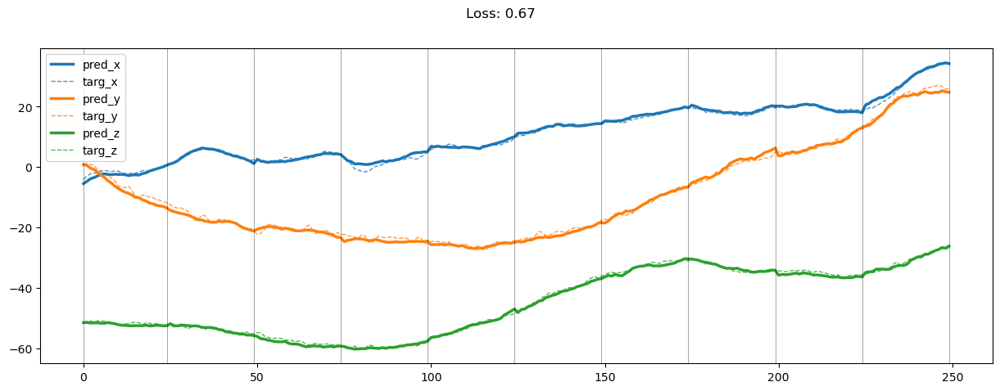

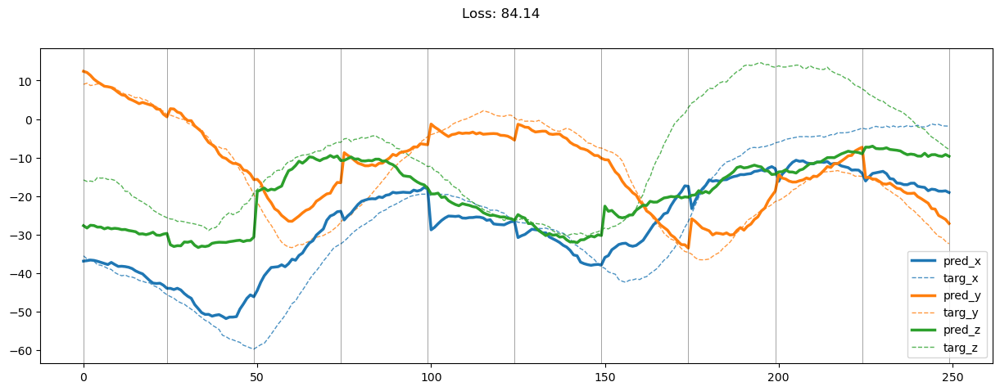

01949: train pred loss:  0.570, g loss:  5.518, diff loss:  1.123, d loss:  3.014
       valid pred loss:  158.097, g loss:  775.908, diff loss:  287.779, d loss:  3.006


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01950: train pred loss:  0.567, g loss:  5.536, diff loss:  1.129, d loss:  3.006
       valid pred loss:  157.360, g loss:  771.356, diff loss:  285.836, d loss:  3.013


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.52it/s]


01951: train pred loss:  0.558, g loss:  5.414, diff loss:  1.103, d loss:  3.030
       valid pred loss:  157.361, g loss:  772.094, diff loss:  286.518, d loss:  3.055


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.28it/s]


01952: train pred loss:  0.566, g loss:  5.305, diff loss:  1.118, d loss:  3.085
       valid pred loss:  158.842, g loss:  782.934, diff loss:  293.052, d loss:  3.124


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01953: train pred loss:  0.575, g loss:  5.137, diff loss:  1.131, d loss:  3.166
       valid pred loss:  157.554, g loss:  775.911, diff loss:  290.305, d loss:  3.220


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01954: train pred loss:  0.576, g loss:  4.883, diff loss:  1.117, d loss:  3.273
       valid pred loss:  160.858, g loss:  790.624, diff loss:  295.541, d loss:  3.337


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01955: train pred loss:  0.578, g loss:  4.638, diff loss:  1.119, d loss:  3.399
       valid pred loss:  161.281, g loss:  792.416, diff loss:  296.641, d loss:  3.472


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01956: train pred loss:  0.580, g loss:  4.418, diff loss:  1.141, d loss:  3.542
       valid pred loss:  159.942, g loss:  783.547, diff loss:  291.754, d loss:  3.621


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01957: train pred loss:  0.580, g loss:  4.187, diff loss:  1.134, d loss:  3.696
       valid pred loss:  157.735, g loss:  772.111, diff loss:  287.388, d loss:  3.779


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.90it/s]


01958: train pred loss:  0.586, g loss:  4.003, diff loss:  1.133, d loss:  3.857
       valid pred loss:  160.019, g loss:  785.232, diff loss:  293.413, d loss:  3.943


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01959: train pred loss:  0.574, g loss:  3.784, diff loss:  1.120, d loss:  4.021
       valid pred loss:  158.641, g loss:  777.842, diff loss:  290.049, d loss:  4.106


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01960: train pred loss:  0.583, g loss:  3.693, diff loss:  1.147, d loss:  4.184
       valid pred loss:  158.212, g loss:  779.508, diff loss:  293.575, d loss:  4.268


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01961: train pred loss:  0.581, g loss:  3.575, diff loss:  1.153, d loss:  4.344
       valid pred loss:  156.112, g loss:  765.440, diff loss:  285.414, d loss:  4.424


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01962: train pred loss:  0.590, g loss:  3.517, diff loss:  1.165, d loss:  4.498
       valid pred loss:  158.990, g loss:  778.561, diff loss:  290.090, d loss:  4.574


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01963: train pred loss:  0.571, g loss:  3.346, diff loss:  1.133, d loss:  4.645
       valid pred loss:  162.323, g loss:  794.929, diff loss:  296.842, d loss:  4.721


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.46it/s]


01964: train pred loss:  0.578, g loss:  3.310, diff loss:  1.140, d loss:  4.783
       valid pred loss:  162.234, g loss:  792.131, diff loss:  294.726, d loss:  4.856


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01965: train pred loss:  0.565, g loss:  3.196, diff loss:  1.117, d loss:  4.913
       valid pred loss:  162.791, g loss:  799.081, diff loss:  299.760, d loss:  4.979


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01966: train pred loss:  0.561, g loss:  3.119, diff loss:  1.097, d loss:  5.032
       valid pred loss:  160.268, g loss:  781.413, diff loss:  289.702, d loss:  5.089


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.47it/s]


01967: train pred loss:  0.564, g loss:  3.101, diff loss:  1.102, d loss:  5.139
       valid pred loss:  157.728, g loss:  770.742, diff loss:  286.722, d loss:  5.192


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.48it/s]


01968: train pred loss:  0.575, g loss:  3.145, diff loss:  1.143, d loss:  5.235
       valid pred loss:  159.943, g loss:  781.636, diff loss:  290.894, d loss:  5.280


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.45it/s]


01969: train pred loss:  0.576, g loss:  3.129, diff loss:  1.145, d loss:  5.319
       valid pred loss:  159.557, g loss:  784.619, diff loss:  295.218, d loss:  5.357


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.33it/s]


01970: train pred loss:  0.605, g loss:  3.215, diff loss:  1.162, d loss:  5.389
       valid pred loss:  156.951, g loss:  769.224, diff loss:  287.557, d loss:  5.422


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01971: train pred loss:  0.599, g loss:  3.179, diff loss:  1.157, d loss:  5.447
       valid pred loss:  159.653, g loss:  778.466, diff loss:  288.723, d loss:  5.475


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.12it/s]


01972: train pred loss:  0.583, g loss:  3.103, diff loss:  1.137, d loss:  5.491
       valid pred loss:  157.090, g loss:  766.721, diff loss:  284.650, d loss:  5.508


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.49it/s]


01973: train pred loss:  0.590, g loss:  3.119, diff loss:  1.140, d loss:  5.521
       valid pred loss:  156.794, g loss:  764.959, diff loss:  283.873, d loss:  5.530


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01974: train pred loss:  0.599, g loss:  3.174, diff loss:  1.171, d loss:  5.535
       valid pred loss:  158.440, g loss:  774.846, diff loss:  289.215, d loss:  5.541


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01975: train pred loss:  0.608, g loss:  3.220, diff loss:  1.189, d loss:  5.537
       valid pred loss:  159.577, g loss:  778.140, diff loss:  288.930, d loss:  5.531


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.42it/s]


01976: train pred loss:  0.592, g loss:  3.146, diff loss:  1.160, d loss:  5.520
       valid pred loss:  156.961, g loss:  767.502, diff loss:  285.934, d loss:  5.508


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.43it/s]


01977: train pred loss:  0.592, g loss:  3.159, diff loss:  1.167, d loss:  5.491
       valid pred loss:  157.267, g loss:  769.478, diff loss:  286.635, d loss:  5.468


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.39it/s]


01978: train pred loss:  0.569, g loss:  3.063, diff loss:  1.131, d loss:  5.447
       valid pred loss:  158.675, g loss:  774.004, diff loss:  286.955, d loss:  5.419


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01979: train pred loss:  0.571, g loss:  3.057, diff loss:  1.105, d loss:  5.387
       valid pred loss:  157.841, g loss:  768.084, diff loss:  283.394, d loss:  5.348


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.41it/s]


01980: train pred loss:  0.577, g loss:  3.140, diff loss:  1.150, d loss:  5.310
       valid pred loss:  157.252, g loss:  765.642, diff loss:  282.815, d loss:  5.265


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01981: train pred loss:  0.569, g loss:  3.124, diff loss:  1.133, d loss:  5.218
       valid pred loss:  158.436, g loss:  776.707, diff loss:  290.749, d loss:  5.164


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


01982: train pred loss:  0.576, g loss:  3.170, diff loss:  1.130, d loss:  5.116
       valid pred loss:  159.038, g loss:  775.826, diff loss:  287.757, d loss:  5.055


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.55it/s]


01983: train pred loss:  0.581, g loss:  3.239, diff loss:  1.145, d loss:  4.999
       valid pred loss:  157.605, g loss:  771.606, diff loss:  287.657, d loss:  4.932


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


01984: train pred loss:  0.580, g loss:  3.274, diff loss:  1.131, d loss:  4.870
       valid pred loss:  159.587, g loss:  775.334, diff loss:  285.464, d loss:  4.798


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.13it/s]


01985: train pred loss:  0.586, g loss:  3.372, diff loss:  1.152, d loss:  4.729
       valid pred loss:  158.630, g loss:  771.901, diff loss:  284.755, d loss:  4.651


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.35it/s]


01986: train pred loss:  0.622, g loss:  3.628, diff loss:  1.226, d loss:  4.581
       valid pred loss:  160.654, g loss:  780.589, diff loss:  287.495, d loss:  4.497


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.31it/s]


01987: train pred loss:  0.597, g loss:  3.605, diff loss:  1.186, d loss:  4.424
       valid pred loss:  159.443, g loss:  773.891, diff loss:  284.386, d loss:  4.340


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


01988: train pred loss:  0.601, g loss:  3.714, diff loss:  1.170, d loss:  4.260
       valid pred loss:  156.996, g loss:  795.690, diff loss:  280.780, d loss:  4.174


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.14it/s]


01989: train pred loss:  0.580, g loss:  3.768, diff loss:  1.152, d loss:  4.095
       valid pred loss:  155.941, g loss:  794.588, diff loss:  282.945, d loss:  4.008


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


01990: train pred loss:  0.589, g loss:  3.967, diff loss:  1.162, d loss:  3.930
       valid pred loss:  156.174, g loss:  794.188, diff loss:  282.206, d loss:  3.843


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.24it/s]


01991: train pred loss:  0.585, g loss:  4.139, diff loss:  1.161, d loss:  3.768
       valid pred loss:  159.138, g loss:  800.154, diff loss:  280.004, d loss:  3.682


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.40it/s]


01992: train pred loss:  0.578, g loss:  4.309, diff loss:  1.136, d loss:  3.609
       valid pred loss:  157.726, g loss:  768.629, diff loss:  283.015, d loss:  3.527


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.27it/s]


01993: train pred loss:  0.590, g loss:  4.590, diff loss:  1.142, d loss:  3.461
       valid pred loss:  157.552, g loss:  770.619, diff loss:  285.106, d loss:  3.386


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 14.74it/s]


01994: train pred loss:  0.599, g loss:  4.896, diff loss:  1.157, d loss:  3.322
       valid pred loss:  160.160, g loss:  782.001, diff loss:  288.657, d loss:  3.255


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.30it/s]


01995: train pred loss:  0.582, g loss:  5.103, diff loss:  1.150, d loss:  3.202
       valid pred loss:  159.103, g loss:  775.833, diff loss:  285.556, d loss:  3.143


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


01996: train pred loss:  0.594, g loss:  5.406, diff loss:  1.163, d loss:  3.099
       valid pred loss:  160.258, g loss:  781.497, diff loss:  287.665, d loss:  3.054


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.37it/s]


01997: train pred loss:  0.602, g loss:  5.673, diff loss:  1.185, d loss:  3.018
       valid pred loss:  155.944, g loss:  763.460, diff loss:  282.130, d loss:  2.985


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.36it/s]


01998: train pred loss:  0.599, g loss:  5.818, diff loss:  1.178, d loss:  2.965
       valid pred loss:  162.572, g loss:  798.967, diff loss:  297.488, d loss:  2.948


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00, 15.44it/s]


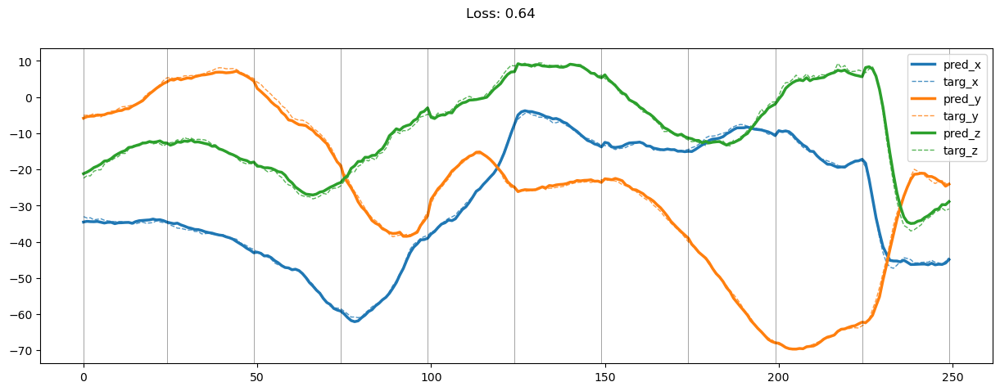

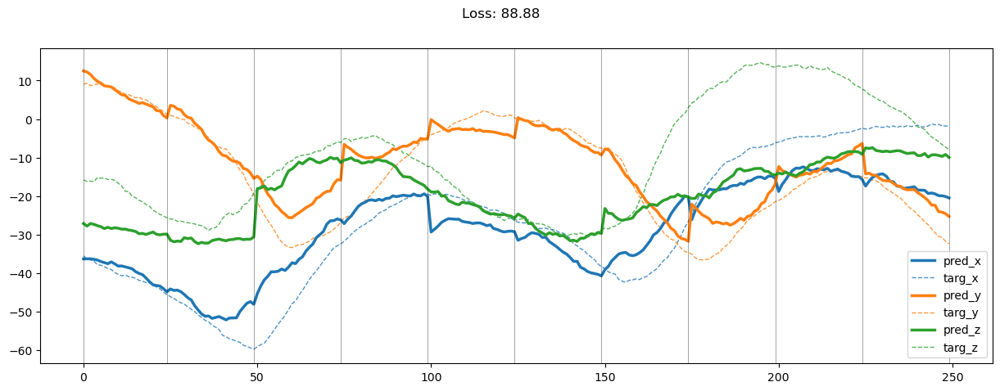

01999: train pred loss:  0.604, g loss:  5.895, diff loss:  1.167, d loss:  2.942
       valid pred loss:  162.670, g loss:  797.229, diff loss:  295.619, d loss:  2.938


In [30]:
draw = True

for epoch in range(EPOCH):
    #####
    # 1. 用上半部訓練50epoch
    # 2. 隨機用上或下半部訓練Model
    # 3. 印出trajectory結果
    #####
    
    if (epoch + 1) % 50 == 0:
        draw = True
    
    train_pred_loss, train_g_loss, train_diff_loss, train_d_loss = train(train_loader, draw)
    valid_pred_loss, valid_g_loss, valid_diff_loss, valid_d_loss = evalute(valid_loader, draw)
    
    draw = False
    
    ep = str(epoch).zfill(5)
    print(f'{ep:>5}: train pred loss: {train_pred_loss: 2.3f}, g loss: {train_g_loss: 2.3f}, diff loss: {train_diff_loss: 2.3f}, d loss: {train_d_loss: 2.3f}\n' +
          f'{"":>5}  valid pred loss: {valid_pred_loss: 2.3f}, g loss: {valid_g_loss: 2.3f}, diff loss: {valid_diff_loss: 2.3f}, d loss: {valid_d_loss: 2.3f}')

In [31]:
def output_eval(model, dataloader):
    model.eval()
    
    results = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            target_data = target_data.to(device)

            #############
            # generator #
            #############
            predict_mag = model(source_data[:, :, :, :9], source_data[:, :, :, 9:12])

            predict_loss = mse_loss(predict_mag, target_data[:, :, :, 9:12])
            
            results.extend(zip(predict_mag.detach().cpu().numpy(), target_data[:, :, :, 9:12].cpu().numpy()))
            
            break
    
    return np.array(results)

In [32]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    for i in range(0, chunk_size+1):
        plt.axvline(x=int(i * seq_len - 0.5), linewidth=0.5, linestyle='-', color='k', alpha=0.5)
    
    plt.suptitle(f'Loss: {loss:.2f}')
    plt.legend()
    plt.show()

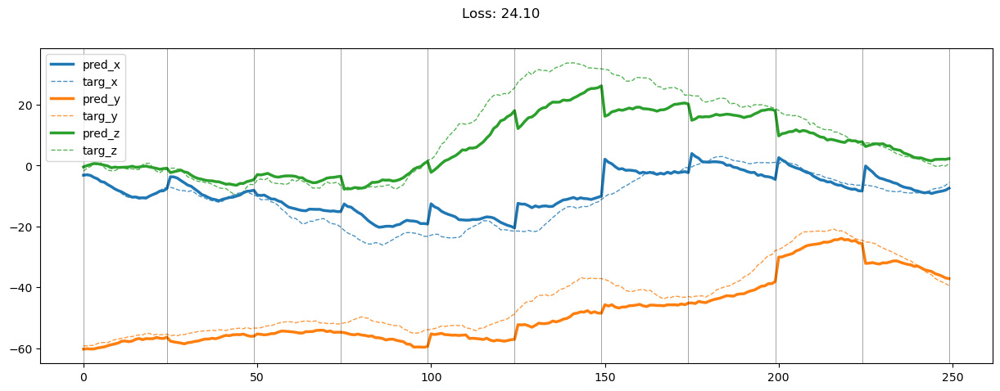

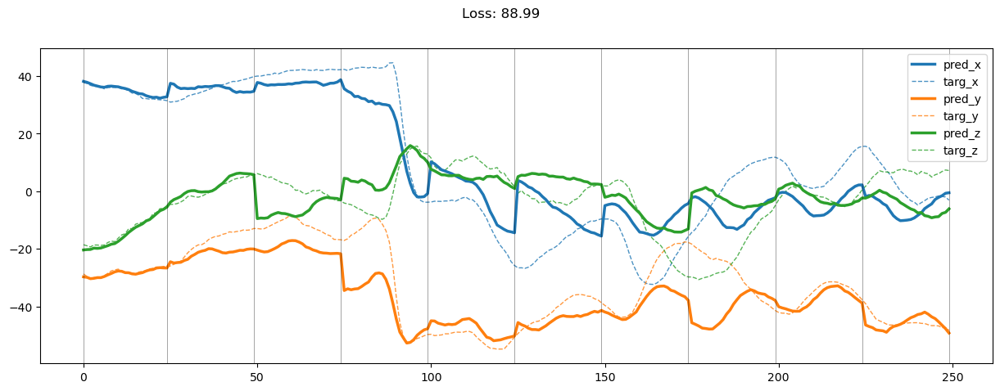

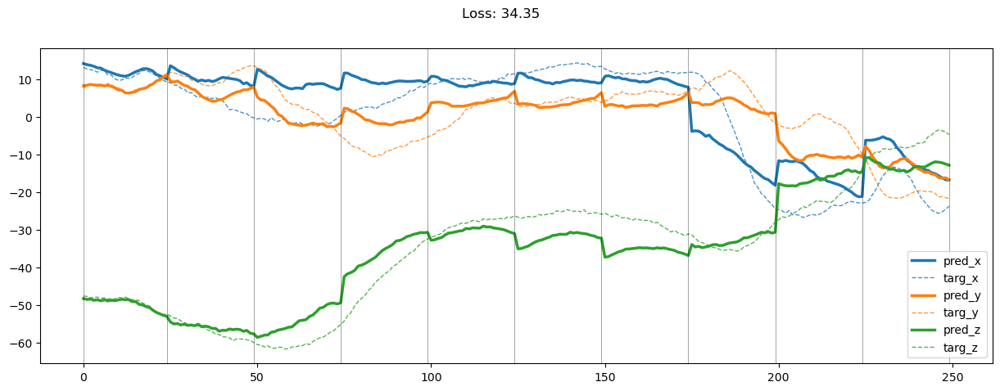

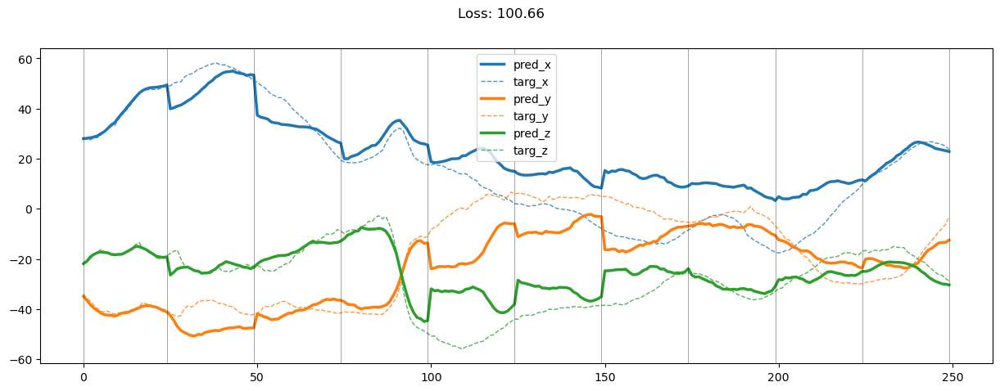

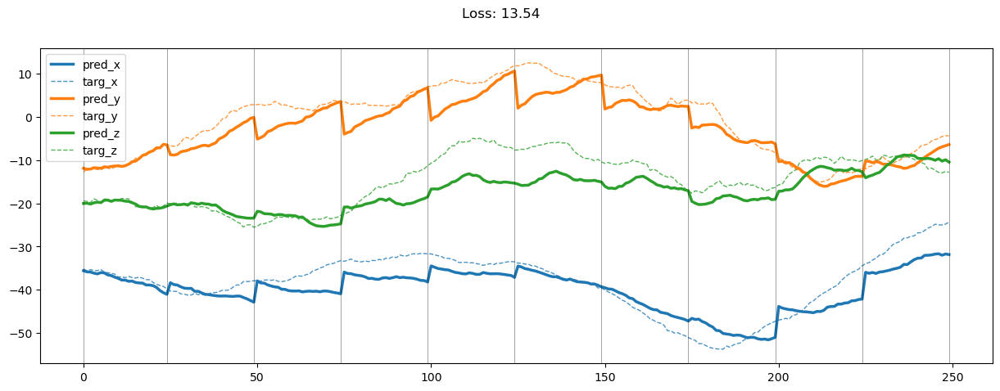

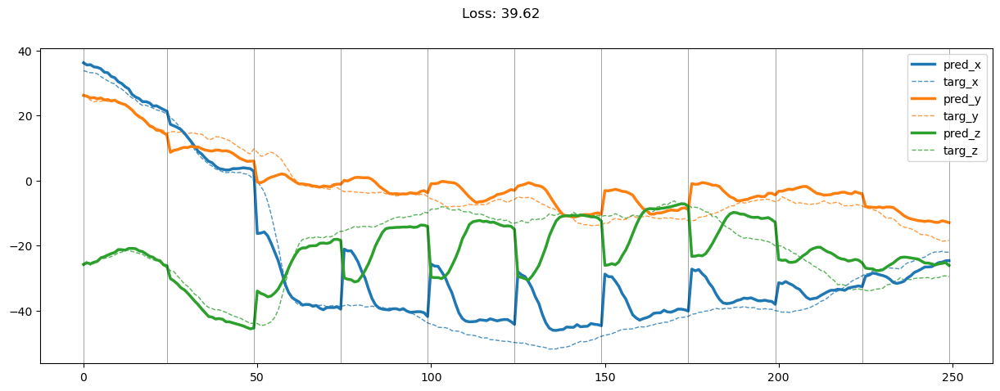

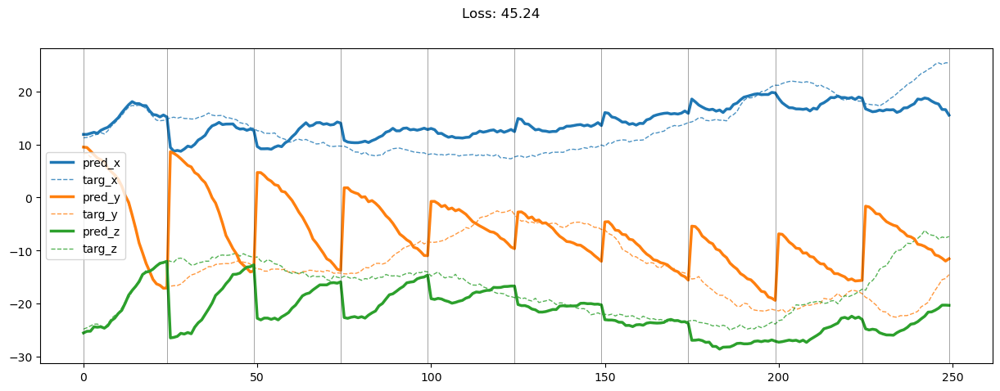

In [33]:
results = output_eval(model, train_loader)

for rs in results[::5]:
    plot_result(rs)

(32, 2, 10, 25, 3)


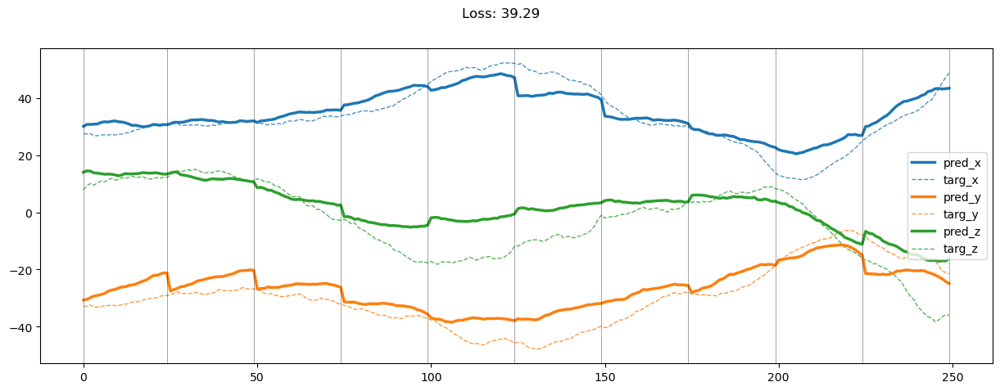

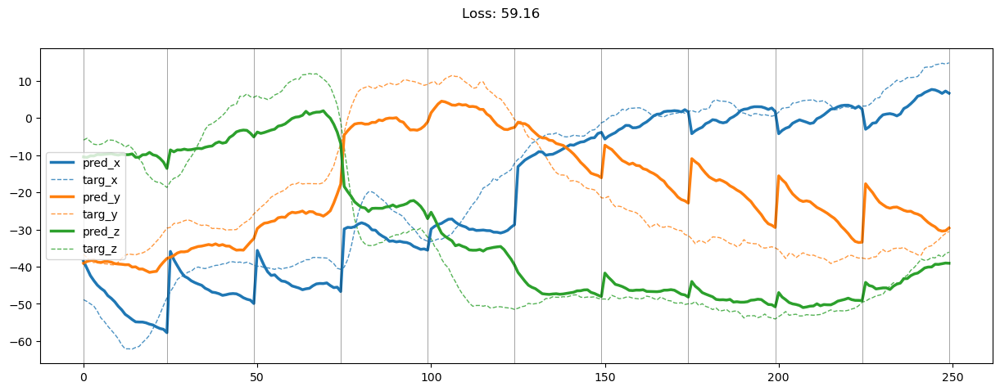

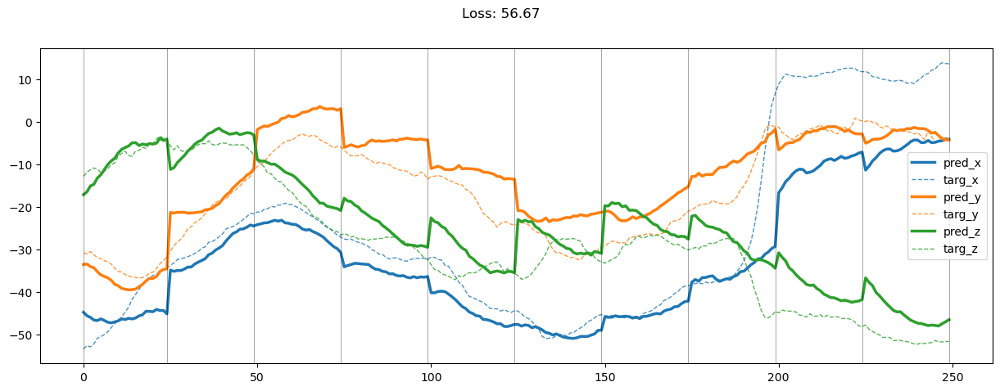

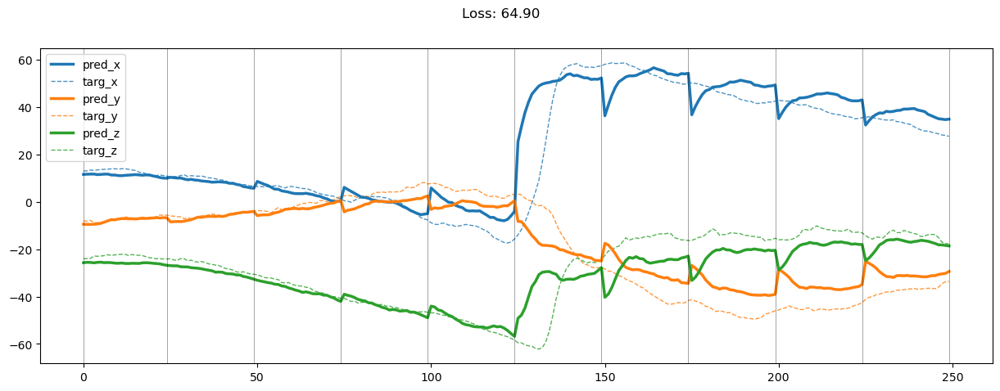

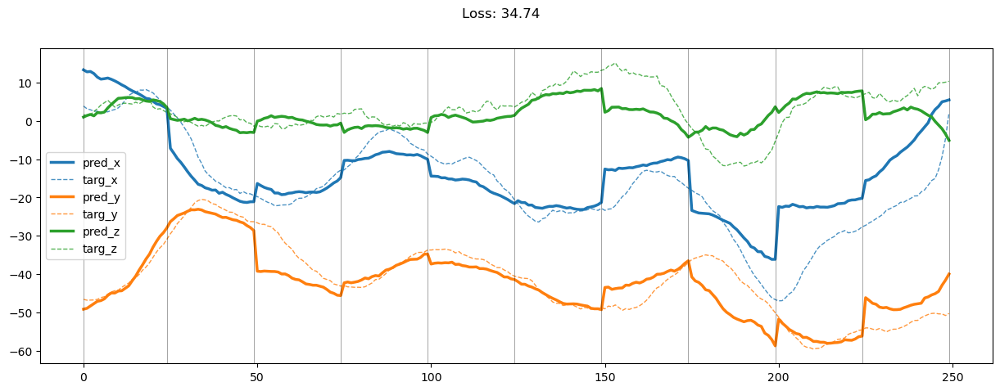

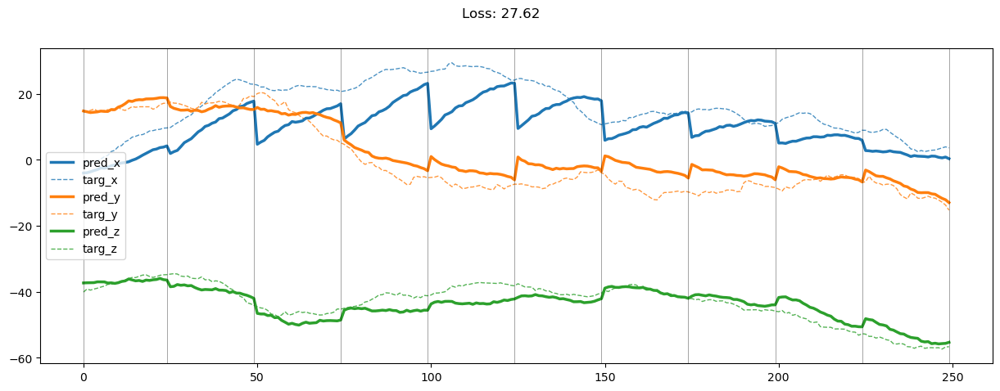

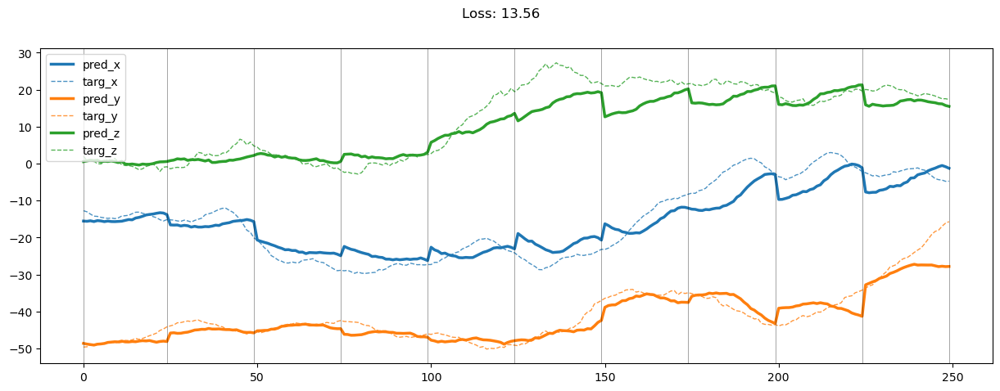

In [34]:
results = output_eval(model, valid_loader)

print(results.shape)

for rs in results[::5]:
    plot_result(rs)